# M2.978 - TFM
**Universitat Oberta de Catalunya (UOC)**<br>
**Máster Universitario en Ciencia de Datos**<br>
**Título:** Segmentación de clientes y optimización de su fidelización mediante aprendizaje computacional<br>
**Estudiante:** Marcos Alcocer Gil<br>
**Tutor:** Santiago Rojo Muñoz<br>
**Semestre:** 2023-24/2<br>
**Área:** 1<br>
**Aula:** 1<br>

***
# Índice

1. [**Contexto**](#1)
2. [**Importación de módulos y configuración del cuaderno**](#2)
3. [**Carga e inspección de los datos**](#3)
    - 3.1. [Información de clientes](#3.1)
    - 3.2. [Información de consultas](#3.2)
    - 3.3. [Información de ventas](#3.3)
4. [**Preprocesado de los datos**](#4)
    - 4.1. [Limpieza y primeras transformaciones](#4.1)
    - 4.2. [Análisis de la distribución y gestión de valores extremos](#4.2)
    - 4.3. [Corrección de incoherencias](#4.3)
    - 4.4. [Codificación de variables categóricas](#4.4)
    - 4.5. [Imputación de valores](#4.5)
    - 4.6. [Transformación y escalado de los datos](#4.6)
    - 4.7. [Análisis de colinealidad](#4.7)
    - 4.8. [Valoración de variables](#4.8)
    - 4.9. [Verificación de asimetría y normalidad](#4.9)
5. [**Primera fase de la segmentación**](#5)
    - 5.1. [Aplicación del algoritmo de agrupamiento](#5.1)
    - 5.2. [Evaluación del agrupamiento](#5.2)
        - 5.2.1. [Valoración de la influencia de las variables en el agrupamiento](#5.2.1)
        - 5.2.2. [Análisis de los clústeres resultantes](#5.2.2)
    - 5.3. [Conclusiones de la primera fase del agrupamiento](#5.3)
6. [**Segunda fase de la segmentación**](#6)
    - 6.1. [Creación de nuevas variables](#6.1)
        - 6.1.1. [_Feature engineering_ aplicado al conjunto de datos](#6.1.1)
        - 6.1.2. [Incorporación de nueva información al clúster de personas físicas](#6.1.2)
    - 6.2. [Preparación de los datos](#6.2)
    - 6.3. [Segmentación de sociedades y empresarios](#6.3)
        - 6.3.1. [Aplicación del algoritmo de agrupamiento](#6.3.1)
        - 6.3.2. [Evaluación del agrupamiento](#6.3.2)
        - 6.3.3. [Análisis de los clústeres resultantes](#6.3.3)
    - 6.4. [Segmentación de personas físicas](#6.4)
        - 6.4.1. [Aplicación del algoritmo de agrupamiento](#6.4.1)
        - 6.4.2. [Evaluación del agrupamiento](#6.4.2)
        - 6.4.3. [Análisis de los clústeres resultantes](#6.4.3)
    - 6.5. [Conclusiones de la segunda fase del agrupamiento](#6.5)
    - 6.6. [Etiquetado conjunto de clientes](#6.6)
    - 6.7. [Exportación del fichero de clientes etiquetado](#6.7)
7. [**Predicción de transferencia de clientes entre clústeres**](#7)
    - 7.1. [Predicción basada en distancia y similitud](#7.1)
        - 7.1.1. [Transferencia de sociedades y empresarios](#7.1.1)
        - 7.1.2. [Transferencia de personas físicas](#7.1.2)
        - 7.1.3. [Conclusiones de la predicción de transferencia basada en distancia y similitud](#7.1.3)
    - 7.2. [Predicción basada en clasificación multinomial](#7.2)
        - 7.2.1. [Transferencia de sociedades y empresarios](#7.2.1)
        - 7.2.2. [Transferencia de personas físicas](#7.2.2)
        - 7.2.3. [Conclusiones de la predicción basada en clasificación multinomial](#7.2.3)
    - 7.3. [Predicción basada en regresión lineal y reagrupamiento](#7.3)
        - 7.3.1. [Transferencia de sociedades y empresarios](#7.3.1)
        - 7.3.2. [Transferencia de personas físicas](#7.3.2)
        - 7.3.3. [Conclusiones de la predicción de transferencia basada en regresión lineal y reagrupamiento](#7.3.3)
    - 7.4. [Conclusiones sobre la predicción de transferencia y combinación de múltiples métricas](#7.4)
        - 7.4.1. [Transferencia de sociedades y empresarios](#7.4.1)
        - 7.4.2. [Transferencia de personas físicas](#7.4.2)
        - 7.4.3. [Conclusiones de la predicción de transferencia multimétrica](#7.4.3)
        - 7.4.4. [Exportación del fichero de transferencia de clientes](#7.4.4)
8. [**Estudio y desarrollo de estrategias de fidelización del cliente**](#8)
    - 8.1. [Predicción de la recurrencia de compra](#8.1)
        - 8.1.1. [Segmentación por recurrencia](#8.1.1)
        - 8.1.2. [Modelo de clasificación de recurrencia de clientes](#8.1.2)
    - 8.2. [Segmentación por niveles de recurrencia y predicción de transferencia](#8.2) 
        - 8.2.1. [Segmentación por cantidad de unidades compradas](#8.2.1)
        - 8.2.2. [Predicción de transferencia entre segmentos de recurrencia](#8.2.1)
    - 8.3. [Conclusiones sobre la recurrencia de compra](#8.3)
    - 8.4. [Exportación del fichero de fidelización de clientes](#8.4)
9. [**Recapitulación y últimas conclusiones**](#9)

<a id="1"></a> 
***
# 1. Contexto

El **objetivo principal** de este cuaderno es desarrollar una herramienta que, utilizando la información de los clientes proporcionada por un negocio, permita segmentarlos en grupos homogéneos que faciliten la aplicación de diferentes estrategias basadas en datos para aumentar el tique de compra.

El negocio objeto de estudio se dedica a la información comercial y la inteligencia de negocios, y está especializado en la recopilación, organización y venta de datos de empresas radicadas en Colombia. Los ficheros recibidos, que constituyen el punto de partida, incluyen datos sobre el perfil de los clientes, su proceso de _onboarding_, sus compras y su uso del servicio; y abarcan el período comprendido entre enero de 2017 y julio de 2023.

Como **objetivos secundarios**, se plantean el análisis de las posibilidades de transferencia de clientes entre segmentos y el estudio de la recurrencia de compra.

<a id="2"></a> 
***
# 2. Importación de módulos y configuración del cuaderno

Comenzaremos importando las bibliotecas, módulos y clases utilizados durante la ejecución del cuaderno, y fijando las opciones de configuración por defecto del mismo.

In [1]:
# Import and set up classes, functions, libraries and modules required for specific configurations
from datetime import datetime  # Used to deal with datetime formats and to time complex operations
notebook_start_time = datetime.now()  # Time notebook's total running time
import os  # Used to define paths and environment variables
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # Suppress TensorFlow logging
from sqlite3 import OperationalError  # Used to handle notebook's operational exceptions
import logging  # Used to filter logging errors
logging.basicConfig(level=logging.ERROR)  # Set up general logging
logging.getLogger('IPKernelApp').setLevel(logging.CRITICAL)  # Used to suppress notebooks' OperationalError messages
import optuna  # Used to optimize hyper-parameters
logging.getLogger("optuna").setLevel(logging.WARNING)  # Suppress Optuna's trial details
import warnings  # Used to suppress warning messages
warnings.filterwarnings('ignore')  # Suppress non-critical warnings
warnings.filterwarnings('ignore', category=UserWarning,
                        message=".*OperationalError.*")  # Supress notebook's database warnings

# Import additional libraries
import missingno as msno  # Used to plot missing data patterns
import numpy as np  # Used for mathematical operations
import pandas as pd  # Used for data manipulation
import plotly.express as px  # To generate interactive charts
import plotly.graph_objects as go  # To generate interactive charts
import seaborn as sns  # Used for general plotting
import statsmodels.api as sm  # Used for OLS regression
import tensorflow as tf  # Used as backend by the Keras library
import xgboost as xgb  # Used to build classification and regression models

# Import additional modules
import matplotlib.colors as mcolors  # Used to customize color palettes
import matplotlib.gridspec as gridspec  # Used for a better control of subplots
import matplotlib.pyplot as plt  # Used for general plotting
import matplotlib.ticker as ticker  # Used to customize axes ticks
import random  # Imported to set a random seed in case it's indirectly used by other modules
from scipy.spatial import distance  # Used to calculate distances

# Import additional classes and functions
from collections import Counter  # Used to count the frequency of elements in iterables
from functools import reduce  # Used to combine multiple dataframes at once
from imblearn.over_sampling import SMOTE  # Used to train models with unbalanced data
from IPython.display import display, HTML  # Used to format printed dataframes
from keras.models import Sequential  # Used to define neural networks
from keras.layers import Dense  # Used to define neural networks
from keras.utils import to_categorical  # Used to OHE class vectors for neural networks
from keras.callbacks import EarlyStopping  # Used to prevent overfitting in model training
from matplotlib.patches import Patch  # Used for plotting customization
from pyclustering.cluster.kmedoids import kmedoids  # Used for K-Medoids clustering
from pyclustering.utils.metric import distance_metric, type_metric  # Used for K-Medoids clustering
from scipy.cluster.hierarchy import dendrogram, linkage  # Used to plot dendrograms
from scipy.stats import (boxcox, kstest, norm, normaltest,
                         skew, probplot, zscore)  # Used for normality analysis and transformation
from sklearn.cluster import AgglomerativeClustering  # Used for hierarchical clustering
from sklearn_extra.cluster import KMedoids  # Used for K-Medoids clustering
from sklearn.decomposition import PCA  # Used for dimensionality reduction through PCA
from sklearn.linear_model import HuberRegressor, LinearRegression, LogisticRegression  # Used for model building
from sklearn.metrics.pairwise import (cosine_distances,
                                      cosine_similarity)  # Used to calculate cosine distances and similarity
from sklearn.metrics import (calinski_harabasz_score, classification_report, confusion_matrix,
                             make_scorer, mean_absolute_error, mean_squared_error,
                             pairwise_distances, precision_recall_curve, r2_score,
                             silhouette_score, roc_auc_score)  # Used to evaluate model's results
from sklearn.model_selection import (cross_val_predict, cross_val_score, GridSearchCV,
                                     KFold, RandomizedSearchCV, StratifiedKFold,
                                     train_test_split)  # Used to reduce overfitting during model training
from sklearn.pipeline import Pipeline  # Used to pipeline processes
from sklearn.preprocessing import (FunctionTransformer, MinMaxScaler, Normalizer, OrdinalEncoder, power_transform,
                                   RobustScaler, StandardScaler)  # Used for transforming and scaling data
from sklearn.utils import resample  # Used for bootstrapping
from statsmodels.formula.api import ols  # Used for OLS regression
from statsmodels.stats.outliers_influence import variance_inflation_factor  # Used to compute VIF
from statsmodels.tools.tools import add_constant  # Used to compute VIF

# Ensure reproducibility defining a random seed
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)  # Set NumPy random seed
random.seed(RANDOM_SEED)  # Set Python random seed
tf.random.set_seed(RANDOM_SEED)  # Set Tensorflow/Keras random seed

# Set up Pandas default numerical display format
pd.set_option('display.float_format', '{:,.2f}'.format)  # Avoid scientific notation and include thousands separators

<a id="3"></a> 
***
# 3. Carga e inspección de los datos

Disponemos de **3 ficheros principales**:

- «CLIENTES.txt»: Con características del perfil del cliente e información agregada procedente de otros ficheros.
- «CONSULTAS.txt»: Con el detalle de las empresas consultadas por los clientes como parte de su utilización del servicio.
- «VENTAS.txt»: Con el detalle de las compras llevadas a cabo por los clientes.

Estas informaciones pueden ser relacionadas a través del código identificador del cliente.

Además, en el cuaderno se hace un uso puntual de otros **2 ficheros adicionales**:

- «CLIENTES_PF_EMAIL_RELACIONES.txt»: Con información sobre el número de empresas con que los clientes personas físicas mantienen alguna relación ejecutiva, así como el dominio del correo electrónico con que se registraron en el servicio. Nuevamente
- «DEPARTAMENTOS_DISTANCIA_PIB.txt»: Con el producto interior bruto (en adelante, «PIB») de los diferentes departamentos de Colombia donde están domiciliados los clientes, así como la distancia en km desde la capital de dicho departamento hasta la del país Bogotá.



<a id="3.1"></a> 
## 3.1. Información de clientes

Comenzaremos cargando la información del fichero principal, llamado «CLIENTES.txt», e inspeccionaremos su estructura.

In [2]:
# Define the relative path to the data files
data_dir = os.path.join('data')
# Load the customers database as a dataframe froma a Latin-1 encoded file
customers_df = pd.read_csv(os.path.join(data_dir, 'CLIENTES.txt'), encoding='ISO-8859-1', sep='|')

# Inspect df dimensions and data types
customers_df.info()
# Show 5 first rows
display(customers_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9512 entries, 0 to 9511
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   ID                      9512 non-null   int64 
 1   FECHA_REGISTRO          9512 non-null   object
 2   CANAL_REGISTRO          9512 non-null   object
 3   FECHA_CLIENTE           9512 non-null   object
 4   CLIENTEPORCAMPAÑAEMAIL  9512 non-null   int64 
 5   FORMAJURIDICA           9512 non-null   object
 6   SECTOR                  9512 non-null   object
 7   DESC_SECTOR             9512 non-null   object
 8   ESTADO                  9512 non-null   object
 9   DEPARTAMENTO            3912 non-null   object
 10  TAMAÑO                  3912 non-null   object
 11  ANTIGUEDAD              3912 non-null   object
 12  DIASCLIENTE             9512 non-null   int64 
 13  CONSUMOSTOTAL           9512 non-null   int64 
 14  EMPRESASUNICAS_CONSULT  9512 non-null   int64 
 15  NUM_

,ID,FECHA_REGISTRO,CANAL_REGISTRO,FECHA_CLIENTE,CLIENTEPORCAMPAÑAEMAIL,FORMAJURIDICA,SECTOR,DESC_SECTOR,ESTADO,DEPARTAMENTO,TAMAÑO,ANTIGUEDAD,DIASCLIENTE,CONSUMOSTOTAL,EMPRESASUNICAS_CONSULT,NUM_COMPRAS,IMPORTE_COMPRAS
0,6384286,15/3/2017 15:24:29,WEB,15/3/2017 15:36:22,0,PERSONA FISICA,9,NOSECTOR,VIVA,NaN,NaN,NaN,0,11,3,1,35
1,6384667,15/3/2017 19:18:31,WEB,8/3/2018 11:01:32,0,SOCIEDAD,K,ACTIVIDADES FINANCIERAS Y DE SEGUROS,ACTIVA,BOGOTA,MICRO,De 5 a 10 Años,358,1,1,1,15
2,6389279,21/3/2017 11:39:08,WEB,21/3/2017 11:39:11,0,SOCIEDAD,N,ACTIVIDADES DE SERVICIOS ADMINISTRATIVOS Y DE ...,ACTIVA,BOLIVAR,PEQUEÑA,Más de 10 Años,0,75,36,38,904
3,6387954,18/3/2017 19:47:34,Directorios,24/5/2017 22:05:19,0,PERSONA FISICA,9,NOSECTOR,VIVA,NaN,NaN,NaN,67,61,10,13,684
4,6383269,15/3/2017 6:58:58,Directorios,15/3/2017 7:07:12,0,PERSONA FISICA,9,NOSECTOR,VIVA,NaN,NaN,NaN,0,1,1,1,22


El fichero incluye **9.512 entradas** con los siguientes **17 campos** de datos:

- `ID`: Identificador numérico único del cliente.
- `FECHA_REGISTRO`: Fecha que en que el cliente se registró en la web del servicio.
- `CANAL_REGISTRO`: Canal por el que se captó al usuario.
- `FECHA_CLIENTE`: Fecha de la primera compra del cliente.
- `CLIENTEPORCAMPAÑAEMAIL`: Valor lógico que indica si la primera compra se produjo a raíz de una campaña de correo electrónico.
- `FORMAJURIDICA`: Forma societaria del cliente en el caso de las empresas, o bien su condición de empresario individual o de persona física.
- `SECTOR`: Codificación del sector de actividad del cliente.
- `DESC_SECTOR`: Descripción aparejada al sector de actividad.
- `ESTADO`: Situación actual de la actividad del cliente.
- `DEPARTAMENTO`: Departamento de residencia en Colombia o su condición de residente extranjero.
- `TAMAÑO`: Tamaño discretizado de la sociedad, en su caso.
- `ANTIGUEDAD`: Antigüedad discretizada desde la constitución de la sociedad, en su caso.
- `DIASCLIENTE`: Número de días transcurridas desde el registro del cliente hasta su primera compra.
- `CONSUMOSTOTAL`: Número de consumos o consultas realizadas por el cliente a través del servicio.
- `EMPRESASUNICAS_CONSUL`: Número de empresas únicas que han sido consultadas por el cliente a través del servicio.
- `NUM_COMPRAS`: Número total de compras realizadas por el cliente.
- `IMPORTE_COMPRAS`: Número que indica el gasto total realizado por el cliente mediante sus compras.


Observamos además que el número de registros **nulos** difiere ampliamente para las siguientes variables categóricas:

- `DEPARTAMENTOS`
- `TAMAÑO`
- `ANTIGUEDAD`

Procedemos a localizarlos, así como a detectar posibles valores vacíos en el _dataset_.

,NaN values,empty values
ID,0,0
FECHA_REGISTRO,0,0
CANAL_REGISTRO,0,0
FECHA_CLIENTE,0,0
CLIENTEPORCAMPAÑAEMAIL,0,0
FORMAJURIDICA,0,0
SECTOR,0,0
DESC_SECTOR,0,0
ESTADO,0,0
DEPARTAMENTO,5600,0


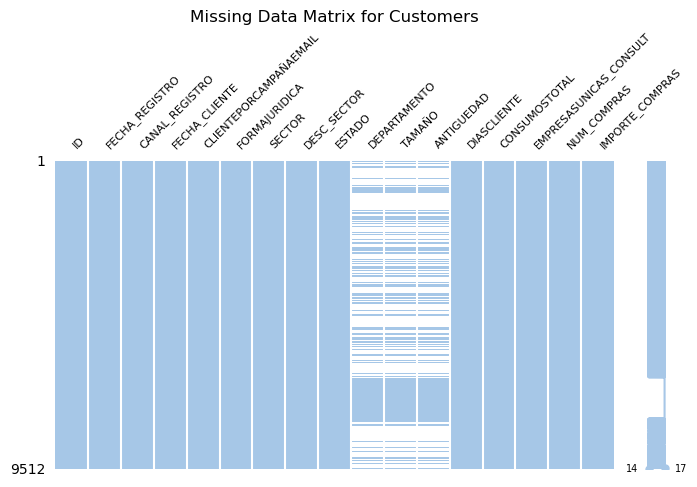

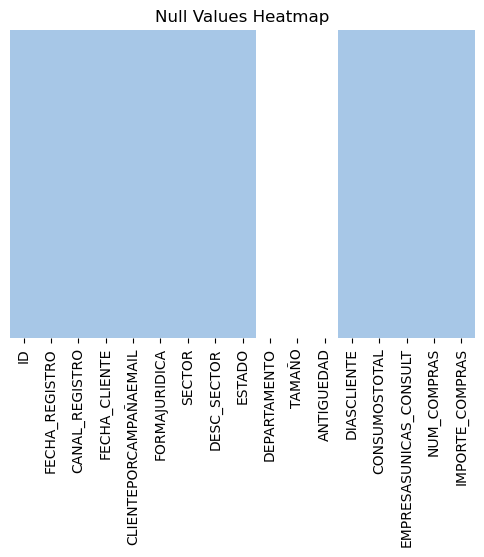

Unique Values for Physical Persons Customers


,Unique Value
Variable,
FORMAJURIDICA,PERSONA FISICA
SECTOR,9
DESC_SECTOR,NOSECTOR
ESTADO,VIVA


In [3]:
# Count total NaN and None values in the df
nan_counts = customers_df.isna().sum()
# Count total empty values in the df
empty_counts = (customers_df.applymap(lambda x: x == "")).sum()
# Show the results
summary_df = pd.DataFrame({
    'NaN values': nan_counts,
    'empty values': empty_counts
})
display(summary_df)

# Show a matrix plot of missing data
msno.matrix(customers_df, figsize=(8, 4), fontsize=8, color=(0.6549, 0.7804, 0.9059))
# Set title
plt.title('Missing Data Matrix for Customers')
# Show matrix plot
plt.show()

# Find rows with at least a null value
rows_with_null_values = customers_df.isnull().any(axis=1)
# Select those rows with at least a null value from the origina df
customers_with_null_values_df = customers_df[rows_with_null_values]
# Show a heatmap of null values distribution
plt.figure(figsize=(6, 4))
sns.heatmap(customers_with_null_values_df.isnull(), cbar=False, yticklabels=False,
            cmap=sns.color_palette(["#A7C7E7", "white"]))
plt.title('Null Values Heatmap')
plt.show()

# Show the total unique values for each categorical attribute
customers_with_null_values_df.select_dtypes(include=['object']).nunique()
# Select the target categorical attributes
target_categorical_vars = ['FORMAJURIDICA', 'SECTOR', 'DESC_SECTOR', 'ESTADO']

# Define empty list to collect unique values
unique_values = []
# Collect unique values for each var
for variable in target_categorical_vars:
    unique_value = customers_with_null_values_df[variable].unique()[0]
    unique_values.append((variable, unique_value))
# Create df of unique values
unique_values_df = pd.DataFrame(unique_values, columns=['Variable', 'Unique Value'])
# Set 'Variable' as index
unique_values_df = unique_values_df.set_index('Variable')
# Show its content
print('Unique Values for Physical Persons Customers')
# Display the DataFrame
display(unique_values_df)

Como se puede observar, los datos faltantes se concentran en una selección específica de registros correspondientes a los clientes con el valor `PERSONA FISICA` en la columna `FORMAJURIDICA`, y para los cuales estos atributos no son aplicables. Por otra parte, también en el caso de las personas físicas los atributos relativos al sector (`SECTOR`, `SECTOR_DESC`) y el estado (`ESTADO`) presentan siempre los mismos valores.

Seguidamente comprobamos que no existen registros con identificadores **duplicados** en el juego de datos.

In [4]:
# Search for duplicated IDs in customers_df
customers_df_duplicated_ids = customers_df[customers_df.duplicated(subset='ID', keep=False)]
if len(customers_df_duplicated_ids) == 0:
    print("There are no duplicated IDs in the dataset.")
else:
    print(f"Number of duplicated IDs in the dataset: "
          f"{customers_df_duplicated_ids['ID'].nunique()}")

There are no duplicated IDs in the dataset.


<a id="3.2"></a> 
## 3.2. Información de consultas

Continuamos ahora inspeccionando la **estructura** del fichero «CONSULTAS.txt»

In [5]:
# Load the customers database as a dataframe froma a Latin-1 encoded file
consults_df = pd.read_csv(os.path.join(data_dir, 'CONSULTAS.txt'), encoding='ISO-8859-1', sep='|')

# Inspect df dimensions and data types
consults_df.info()
# Show 5 first rows
display(consults_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 910738 entries, 0 to 910737
Data columns (total 9 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   IDCONSUMO               910738 non-null  int64 
 1   ID                      910738 non-null  int64 
 2   FECHACONSUMO            910738 non-null  object
 3   PRODUCTO                910738 non-null  object
 4   EMPCONSUL_ICI           910738 non-null  int64 
 5   EMPCONSUL_SECTOR        908871 non-null  object
 6   EMPCONSUL_TAMAÑO        908845 non-null  object
 7   EMPCONSUL_DEPARTAMENTO  908863 non-null  object
 8   EMPCONSUL_ESTADO        908871 non-null  object
dtypes: int64(3), object(6)
memory usage: 62.5+ MB


,IDCONSUMO,ID,FECHACONSUMO,PRODUCTO,EMPCONSUL_ICI,EMPCONSUL_SECTOR,EMPCONSUL_TAMAÑO,EMPCONSUL_DEPARTAMENTO,EMPCONSUL_ESTADO
0,76672021,7344051,19/12/2022 0:00:00,Ficha,1700503357600000,I,PEQUEÑA,BOLIVAR,ACTIVA
1,76672026,7344051,19/12/2022 0:00:00,Ficha,1700012074500000,C,PEQUEÑA,BOGOTA,ACTIVA
2,76672035,6371831,19/12/2022 0:00:00,Ficha,1700015801700000,C,MICRO,CUNDINAMARCA,ACTIVA
3,76672380,6500105,19/12/2022 0:00:00,Ficha,1700180438500000,G,PEQUEÑA,CUNDINAMARCA,ACTIVA
4,76671375,7344051,19/12/2022 0:00:00,Ficha,1700547322700000,C,MICRO,BOLIVAR,ACTIVA


El fichero consta de **910.738 filas** con las siguientes **9 columnas**:

- `IDCONSUMO`: Identificador numérico único del consumo o consulta. Esta información se puede encontrar de forma agregada para cada cliente a través del campo `CONSUMOSTOTAL` del fichero de clientes.
- `ID`: Identificador numérico único del cliente que llevó a cabo la consulta.
- `FECHACONSUMO`: Fecha en que se produjo la consulta.
- `PRODUCTO`: Producto consultado.
- `EMPCONSUL_ID`: Identificador único de la empresa sobre la cual se hizo la consulta. Esta información se puede encontrar de forma agregada para cada cliente a través del campo `EMPRESASUNICAS_CONSUL` del fichero de clientes.
- `EMPCONSUL_SECTOR`: Sector de pertenencia de la empresa sobre la cual se hizo la consulta.
- `EMPCONSUL_TAMAÑO`: Tamaño discretizado de la empresa sobre la cual se hizo la consulta.
- `EMPCONSUL_DEPARTAMENTO`: Departamento de residencia de la empresa sobre la cual se hizo la consulta.
- `EMPCONSUL_ESTADO`: Estado de la empresa sobre la cual se hizo la consulta.

Si confrontamos la información agregada del fichero de clientes en sus campos `CONSUMOSTOTAL` y `EMPRESASUNICAS_CONSULT` con la contenida de forma desglosada en el fichero de ventas, observamos que los datos no son coherentes.

In [6]:
# Count the total consults occurrences for each ID in consults_df
total_consults = consults_df.groupby('ID')['IDCONSUMO'].nunique()
# Merge the count with customers_df on 'ID'
customers_df_merged = customers_df.merge(total_consults.rename('CONSUMOSTOTAL_CALCULADO'),
                                         on='ID', how='left')
# Check if 'CONSUMOSTOTAL' in customers_df matches the calculated unique 'IDCONSUMO' counts in consults_df
customers_df_merged['matches'] = customers_df_merged['CONSUMOSTOTAL'] ==\
                                 customers_df_merged['CONSUMOSTOTAL_CALCULADO']
# Calculate the total percent of mismatches
total_consults_mismatches_count = len(customers_df_merged[~customers_df_merged['matches']])
mismatch_mask = customers_df_merged['matches'] == False
total_consults_mismatches_count = mismatch_mask.sum()
total_consults_mismatches_percent = mismatch_mask.mean() * 100# Show the result
print(f"Percent of mismatches on 'CONSUMOSTOTAL': {total_consults_mismatches_percent:.2f}%")

# Count the total unique consulted companies occurrences for each ID in consults_df
total_consults = consults_df.groupby('ID')['EMPCONSUL_ICI'].nunique()
# Merge the count with customers_df on 'ID'
customers_df_merged = customers_df.merge(total_consults.rename('EMPRESASUNICAS_CONSULT_CALCULADO'),
                                         on='ID', how='left')
# Check if 'EMPRESASUNICAS_CONSULT' in customers_df matches the calculated unique 'EMPCONSUL_ICI' counts in consults_df
customers_df_merged['matches'] = customers_df_merged['EMPRESASUNICAS_CONSULT'] ==\
                                 customers_df_merged['EMPRESASUNICAS_CONSULT_CALCULADO']
# Calculate the total percent of mismatches
total_consulted_companies_mismatches_percent = len(customers_df_merged[~customers_df_merged['matches']]) / len(customers_df_merged) * 100
mismatch_mask = customers_df_merged['matches'] == False
total_consulted_companies_mismatches_count = mismatch_mask.sum()
total_consulted_companies_mismatches_percent = mismatch_mask.mean() * 100
# Show the result
print(f"Percent of mismatches on 'EMPRESASUNICAS_CONSULT': {total_consulted_companies_mismatches_percent:.2f}%")

Percent of mismatches on 'CONSUMOSTOTAL': 89.01%
Percent of mismatches on 'EMPRESASUNICAS_CONSULT': 65.36%


Sin embargo, el negocio nos informa de que esta discrepancia se debe a que en los casos en que el cliente adquiere un producto, pero no lleva a cabo consultas subsiguientes, la consulta realizada en el momento único de la adquisición no es consignada en _dataset_ de consultas. Así pues, debemos tener presente que la diferencia no es fruto de errores, sino del **diferente criterio seguido durante el proceso de recogida de los datos** en cada uno de los ficheros.

<a id="3.3"></a> 
## 3.3. Información de ventas

Por último, inspeccionamos la **estructura** del fichero «VENTAS.txt»

In [7]:
# Load the customers database as a dataframe froma a Latin-1 encoded file
sales_df = pd.read_csv(os.path.join(data_dir, 'VENTAS.txt'), encoding='ISO-8859-1', sep='|')

# Inspect df dimensions and data types
sales_df.info()
# Show 5 first rows
display(sales_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20537 entries, 0 to 20536
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ID                20537 non-null  int64 
 1   FECHAVENTA        20537 non-null  object
 2   PRODUCTOCOMPRADO  20537 non-null  object
 3   CANALVENTA        20537 non-null  object
 4   IMPORTE           20537 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 802.4+ KB


,ID,FECHAVENTA,PRODUCTOCOMPRADO,CANALVENTA,IMPORTE
0,6389279,21/3/2017 0:00:00,VP Informe,WEB,22
1,6389989,21/3/2017 0:00:00,VP Informe,WEB,15
2,6329507,1/2/2017 0:00:00,VP Informe,WEB,35
3,6326580,1/2/2017 0:00:00,VP Informe,WEB,22
4,6326580,1/2/2017 0:00:00,VP Informe,WEB,22


El fichero está compuesto de **20.536 registros** con los **5 atributos** siguientes:

- `ID`: Identificador numérico único del cliente que realiza una compra. Esta información se puede encontrar de forma agregada para cada cliente a través del campo `NUM_COMPRAS` del fichero de clientes.
- `FECHAVENTA`: Fecha en que se produjo la compra/venta.
- `PRODUCTOCOMPRADO`: Producto comprado/vendido.
- `CANALVENTA`: El canal a través del cual se produjo la compra/venta.
- `IMPORTE`: Importe pagado por el producto comprado/vendido. Esta información se puede encontrar de forma agregada para cada cliente a través del campo `IMPORTE_COMPRAS` del fichero de clientes.

Seguidamente analizamos la **coherencia** de la información comprobando que los datos agregados del fichero de clientes en sus campos `IMPORTE_COMPRAS` y `NUM_COMPRAS` coincide con la que contiene de manera desglosada el fichero de ventas.

In [8]:
# Sum the sales amount for each ID in sales_df
total_spent = sales_df.groupby('ID')['IMPORTE'].sum()
# Merge this sum with customers_df on 'ID'
customers_df_merged = customers_df.merge(total_spent.rename('IMPORTE_COMPRAS_CALCULADO'),
                                         on='ID', how='left')
# Check if the 'IMPORTE_COMPRAS' in customers_df matches the calculated sum of sales in sales_df
customers_df_merged['matches'] = customers_df_merged['IMPORTE_COMPRAS'] ==\
                                 customers_df_merged['IMPORTE_COMPRAS_CALCULADO']
# Calculate the total percent of mismatches
total_spent_mismatches_percent = len(customers_df_merged[~customers_df_merged['matches']]) / len(customers_df_merged) * 100
# Show the result
print(f"Percent of mismatches on 'IMPORTE_COMPRAS': {total_spent_mismatches_percent:.2f}%")


# Count the total sales occurrences for each ID in sales_df
total_sales = sales_df.groupby('ID')['ID'].count()
# Merge the count with customers_df on 'ID'
customers_df_merged = customers_df.merge(total_sales.rename('NUM_COMPRAS_CALCULADO'),
                                         on='ID', how='left')
# Check if the 'NUM_COMPRAS' in customers_df matches the calculated count of sales in sales_df
customers_df_merged['matches'] = customers_df_merged['NUM_COMPRAS'] ==\
                                 customers_df_merged['NUM_COMPRAS_CALCULADO']
# Calculate the total percent of mismatches
total_sales_mismatches_percent = len(customers_df_merged[~customers_df_merged['matches']]) / len(customers_df_merged) * 100
# Show the result
print(f"Percent of mismatches on 'NUM_COMPRAS': {total_sales_mismatches_percent:.2f}%")

Percent of mismatches on 'IMPORTE_COMPRAS': 0.00%
Percent of mismatches on 'NUM_COMPRAS': 0.00%


Podemos, de esta manera, confirmar la **ausencia de incoherencias** en los campos seleccionados.

<a id="4"></a> 
***
# 4. Preprocesado de los datos

<a id="4.1"></a> 
## 4.1. Limpieza y primeras transformaciones

La representación gráfica de la distribución de los datos es una parte fundamental de su inspección, pero necesitaremos llevar a cabo algunas tareas preliminares de **asignación de tipo de datos y de limpieza** de la información con objeto de conseguir una representación de más fácil lectura.

Para comenzar, y dado que la única función del atributo `ID` es la de identificar de manera unívoca la cientela sin aportar información adicional estadísticamente significativa, procedemos a convertirlo en el **índice** del _dataframe_. De esta manera nos aseguramos de mantener el dato intacto para entrecruzar informaciones provenientes de diferentes fuentes, mientras garantizamos que su contenido no interfiere durante los cálculos.

In [9]:
# Turn customer's identificative number into the df index
customers_df = customers_df.set_index('ID')

Por otra parte, entre los campos del fichero de clientes encontramos un par de atributos con fecha y hora, los cuales convertiremos en **objetos _datetime_**.

In [10]:
# Convert datetime columns to datetime format
customers_df['FECHA_REGISTRO'] = pd.to_datetime(customers_df['FECHA_REGISTRO'], dayfirst=True)
customers_df['FECHA_CLIENTE'] = pd.to_datetime(customers_df['FECHA_CLIENTE'], dayfirst=True)

A continuación comprobamos que los atributos `SECTOR` y `DES_SECTOR` contienen la misma información, en el primer caso representada a través de códigos y en la segunda con su nombre completo. Por ello, nos desprenderemos de los códigos, dado que la información de `DESC_SECTOR` es autoexplicativa, y **renombraremos** «DESC_SECTOR» como «SECTOR», nuevamente con objeto de facilitar la interpretabilidad de los datos.

In [11]:
# Check if each unique 'SECTOR' is associated with exactly one 'DESC_SECTOR'
unique_associations = customers_df.groupby('SECTOR')['DESC_SECTOR'].nunique()
# Display sectors that are associated with more than one 'DESC_SECTOR'
non_unique_sectors = unique_associations[unique_associations > 1]
if non_unique_sectors.empty:
    print("Each 'SECTOR' is associated with a unique 'DESC_SECTOR'.")
else:
    print("Some 'SECTOR' values are associated with multiple 'DESC_SECTOR' values:")
    print(non_unique_sectors)
# Drop the 'SECTOR' column
customers_df = customers_df.drop(columns=['SECTOR'])
# Rename 'DESC_SECTOR' to 'SECTOR'
customers_df = customers_df.rename(columns={'DESC_SECTOR': 'SECTOR'})

Each 'SECTOR' is associated with a unique 'DESC_SECTOR'.


Por último, reemplazaremos los valores lógicos del atributo `CLIENTEPORCAMPAÑAEMAIL` por «sí» y «no», nuevamente con objeto de mejorar la legibilidad de la representación.

In [12]:
# Replace boolean values by its meaning
customers_df['CLIENTEPORCAMPAÑAEMAIL'] = customers_df['CLIENTEPORCAMPAÑAEMAIL'].replace({0: "no", 1: "sí"})

<a id="4.2"></a> 
## 4.2. Análisis de la distribución y gestión de valores extremos

Mostramos ahora la **distribución** de los datos, comenzando por los atributos categóricos.

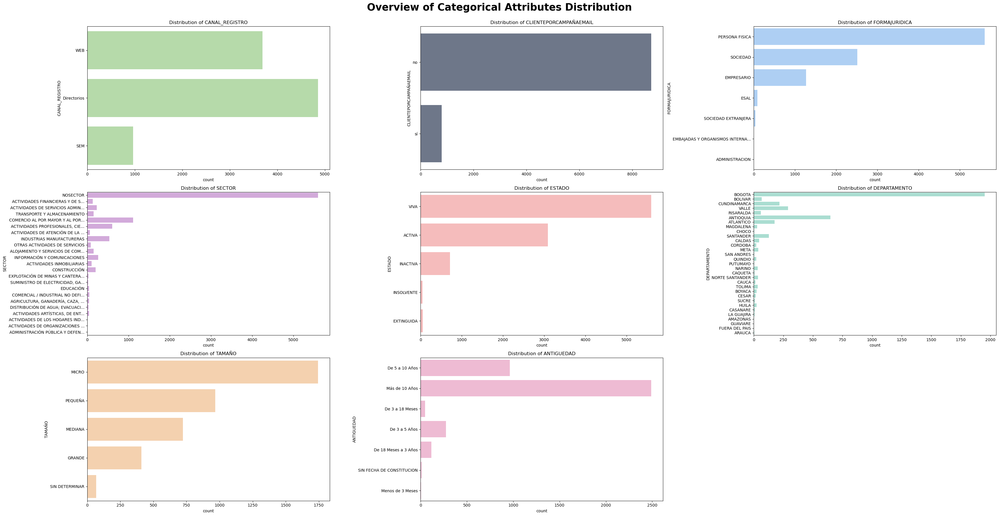

In [13]:
# Select only the categorical attributes
categorical_cols = customers_df.select_dtypes(include=['object']).columns
n_categorical = len(categorical_cols)
# Calculate the number of rows and columns for the subplot grid
n_rows = 3
n_cols = -(-n_categorical // n_rows)  # Use ceiling division to ensure enough columns
# Create subplots for the categorical attributes
fig, axs = plt.subplots(n_rows, n_cols, figsize=(35, 18), constrained_layout=True)
# Flatten the axs array if not already flat
if n_rows > 1:
    axs = axs.flatten()
else:
    axs = [axs]  # Ensure axs is iterable in the case of a single subplot
# Set the maximum number of chars to be displayed as y-tick labels
max_chars = 30
# Define a list of colors
color_palette = ['#B2E2A2', '#6A758D', '#A2CFFE', '#D7A2E2',
                 '#FFB2B2', '#A2E5D5', '#FFD1A4', '#F7B2D2']
colors = sns.color_palette(color_palette, n_categorical)
# Prepare barplots for categorical data
for i, col in enumerate(categorical_cols):
    sns.countplot(data=customers_df, y=col, ax=axs[i], color=colors[i])
    axs[i].set_title(f'Distribution of {col}')
    # Truncate y-tick labels
    y_labels = [label.get_text()[:max_chars] + '...' if len(label.get_text()) > max_chars
                else label.get_text() for label in axs[i].get_yticklabels()]
    axs[i].set_yticklabels(y_labels)
# Hide the unused axes
for ax in axs[i+1:]:
    ax.remove()
# Set a title
fig.suptitle('Overview of Categorical Attributes Distribution', fontsize=25,
             fontweight='bold', color='black', va='bottom')
# Further adjust space for the suptitle
plt.subplots_adjust(top=0.002, hspace=0.4, wspace=0.4)
# Adjust the layout
plt.tight_layout()

Para mostrar a continuación los numéricos.

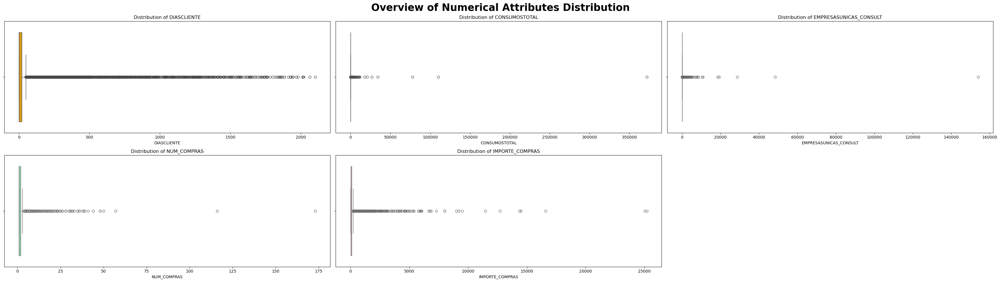

In [14]:
# Select only the numerical attributes
numerical_cols = customers_df.select_dtypes(include=['int64']).columns
n_numerical = len(numerical_cols)
# Calculate the number of rows and columns for the subplot grid
n_rows = 2
n_cols = -(-n_numerical // n_rows)  # Ceiling division to ensure enough columns
# Create subplots for the numerical attributes
fig, axs = plt.subplots(n_rows, n_cols, figsize=(35, 10), constrained_layout=True)
# Flatten the axs array if not already flat
if n_rows > 1:
    axs = axs.flatten()
else:
    axs = [axs]  # Ensure axs is iterable in the case of a single subplot
# Define colors
color_palette = ['#F0A500', '#7A6F9B', '#FF6F61', '#88D8B0', '#D4A5A5']
colors = sns.color_palette(color_palette, n_categorical)
# Prepare boxplots for numerical data
for i, col in enumerate(numerical_cols):
    sns.boxplot(data=customers_df, x=col, ax=axs[i], color=colors[i])
    axs[i].set_title(f'Distribution of {col}')
# Hide the unused axes
for ax in axs[len(numerical_cols):]:
    ax.remove()
# Set a title
fig.suptitle('Overview of Numerical Attributes Distribution', fontsize=25,
             fontweight='bold', color='black')
# Adjust space for the suptitle
plt.subplots_adjust(top=0.002, hspace=0.4, wspace=0.4)
# Adjust the layout
plt.tight_layout()

Las representaciones en diagramas de caja nos muestran la existencia de **valores extremos** en las variables `CONSUMOSTOTAL`, `EMPRESASUNICAS_CONSULT`, `DIASCLIENTE`, `NUM_COMPRAS` y `IMPORTE_COMPRAS`, casos en los que encontramos una cantidad elevada de registros alejados de los bigotes del gráfico en los valores superiores. Para facilitar su visualización, llevaremos a cabo una transformación logarítmica de los datos.

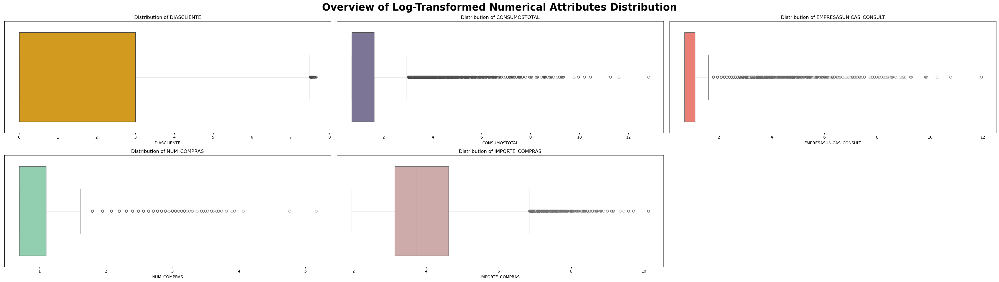

In [15]:
# Create a copy of the df to avoid modifying the original one
customers_df_log = customers_df.copy()
# Apply logarithmic transformation to avoid log(0) issues
for col in numerical_cols:
    customers_df_log[col] = np.log1p(customers_df[col])
# Create subplots for the numerical attributes
fig, axs = plt.subplots(n_rows, n_cols, figsize=(35, 10), constrained_layout=True)
# Flatten the axs array if not already flat
if n_rows > 1:
    axs = axs.flatten()
else:
    axs = [axs]  # Ensure axs is iterable in the case of a single subplot
# Prepare boxplots for numerical data
for i, col in enumerate(numerical_cols):
    sns.boxplot(data=customers_df_log, x=col, ax=axs[i], color=colors[i])
    axs[i].set_title(f'Distribution of {col}')
# Hide the unused axes
for ax in axs[len(numerical_cols):]:
    ax.remove()
# Set a title
fig.suptitle('Overview of Log-Transformed Numerical Attributes Distribution', fontsize=25,
             fontweight='bold', color='black')
# Adjust space for the suptitle
plt.subplots_adjust(top=0.002, hspace=0.4, wspace=0.4)
# Adjust the layout
plt.tight_layout()

En el momento de abordar la gestión de los valores extremos debemos tener presente que, de acuerdo con el principio de Pareto o **regla del 80/20**, es probable que la mayor parte de los ingresos del negocio provengan de un número reducido de clientes; mientras que por otro lado, la presencia de _outliers_ puede distorsionar severamente el proceso de segmentación de clientes. Deberemos pues combinar ambos argumentos y ser prudentes durante el proceso de supresión de valores extremos pero, al mismo tiempo, no perder de vista durante todo el proceso la **distribución sesgada** de los datos.

Aplicamos así el indicador $z$-_score_ ($z = \frac{X - \mu}{\sigma}$) para la identificación de los _outliers_, fijando el umbral en 7 veces la desviación estándar desde la media de los datos para considerar un valor como valor extremo, siendo éste un lindar considerablemente generoso con objeto de que el recorte sea moderado, bajo la convicción de que conservar parte de estos valores puede aportar significado a nuestro análisis. Además, centraremos el proceso de análisis y limpieza de valores extremos en las variables que definen los consumos (`CONSUMOSTOTAL` y `EMPRESASUNICAS_CONSULT`) y las ventas (`IMPORTE_COMPRAS` y `NUM_COMPRAS`).

In [16]:
# Define a function to detect the number of outliers for every given variable
def detect_outliers(df, variables_to_check=None, z_score_threshold=3, print_outliers=True):
    """
    Detect all outliers in a dataframe through Z-scores.
    Args:
        df (pd.DataFrame): Input dataframe containing the data.
        variables_to_check (list, optional): A list of column names to check for outliers.
                                             If None, all numerical columns in the dataframe will be checked.
        z_score_threshold (float, optional): Z-score threshold used for identifying outliers.
                                             Default value is set to 3.

    Returns:
        set: A set of unique indices of the outlier rows.
    """
    # Create a copy of the df to avoid modifying the original one
    X = df.copy()
    # Check for all numerical variables in the dataframe in case no selection is specified
    if variables_to_check is None:
        variables_to_check = X.select_dtypes(include=[np.number]).columns
        categorical_df = X.select_dtypes(include=['object', 'category'])
        if not categorical_df.empty:
            categorical_vars = ', '.join(f"'{col}'" for col in categorical_df.columns)
            print(f"Non-numerical variables {categorical_vars} excluded from the outliers analysis.")
    # Obtain the Z-scores for the specified variables
    z_scores_for_numerical_cols_with_outliers = np.abs(zscore(X[variables_to_check], nan_policy='omit'))
    # Convert to dataframe
    z_scores_df = pd.DataFrame(z_scores_for_numerical_cols_with_outliers, columns=variables_to_check, index=X.index)
    # Identify outliers for each column and store the total amount of values removed for each
    outlier_indices = set()
    for col in variables_to_check:
        # Identify outliers in the variable
        outliers_var = z_scores_df[col] > z_score_threshold
        # Collect the indices of outliers
        outlier_indices_for_col = z_scores_df[outliers_var].index.tolist()
        outlier_indices.update(outlier_indices_for_col)
        if print_outliers:
            print(f"\t- {col}: {len(outlier_indices_for_col)} outliers detected")
    if print_outliers:
        print('\n')
    return outlier_indices


# Select only the relevant numerical attributes with outliers
numerical_cols_with_outliers = ['CONSUMOSTOTAL', 'EMPRESASUNICAS_CONSULT', 'IMPORTE_COMPRAS', 'NUM_COMPRAS']
# Get outliers indices
outlier_customers_indices = detect_outliers(customers_df, numerical_cols_with_outliers, z_score_threshold=7)


# Define a function to remove the specified number of top outliers for every given variable
def remove_outliers(df, outlier_indices):
    """
    Remove the outliers identified by their indices from the dataframe.
    
    Parameters:
        df (pd.DataFrame): The DataFrame from which to remove outliers.
        outlier_indices (set): A set of indices of the rows to be removed.    
    
    Returns:
        pd.DataFrame: A DataFrame with the outliers removed.
    """
    # Create a copy of the df to avoid modifying the original one
    X = df.copy()
    # Remove outliers
    X = X.drop(index=outlier_indices)

    # Return df without outliers
    return X


# Remove outliers from dataset and save their indices
clean_customers_df = remove_outliers(customers_df, outlier_customers_indices)

	- CONSUMOSTOTAL: 4 outliers detected
	- EMPRESASUNICAS_CONSULT: 5 outliers detected
	- IMPORTE_COMPRAS: 28 outliers detected
	- NUM_COMPRAS: 26 outliers detected




Una vez identificados los clientes que se situan en las cotas más altas en cuanto a consumos y ventas, y filtrados del juego de datos, los **conservaremos para su gestión por separado**, al tratarse de una tipología reducida de usuarios con unas características que los alejan de la mayor parte de los clientes, pero que representan un elevado valor económico para el negocio.

<a id="4.3"></a> 
## 4.3. Corrección de incoherencias

Si bien ya hemos comprobado la posible existencia de incoherencias entre ficheros de datos, el _dataset_ de clientes contiene **información redundante** en el siguiente grupo de variables:

- `FECHA_REGISTRO`: Fecha y hora de registro del cliente.
- `FECHA_CLIENTE`: Fecha y hora de la primera compra del cliente.
- `DIASCLIENTE`: Días transcurridos desde la fecha de registro del cliente hasta su primera compra.

Sin embargo, si calculamos los días transcurridos entre una y otra fecha y contrastamos la información con la contenida en el campo `DIASCLIENTE`, comprobaremos que ésta **no siempre concuerda**. Por esta razón, procedemos a reemplazarla por el dato calculado y, una vez obtenido, suprimiremos las variables de fecha con objeto de evitar la redundancia y reducir la dimensionalidad de los datos.

In [17]:
# Find the registration datetime column position
registration_datetime_pos = clean_customers_df.columns.get_loc('FECHA_REGISTRO')
# Extract the date component into a new column
clean_customers_df['DIA_REGISTRO'] = clean_customers_df['FECHA_REGISTRO'].dt.date
# Drop the original datetime column from the df
clean_customers_df = clean_customers_df.drop('FECHA_REGISTRO', axis=1)
# Insert the new columns into the df at the original column position
clean_customers_df.insert(registration_datetime_pos, 'DIA_REGISTRO', clean_customers_df.pop('DIA_REGISTRO'))
# Rename the date column
clean_customers_df = clean_customers_df.rename(columns={'DIA_REGISTRO': 'FECHA_REGISTRO'})
# Convert datetime column to datetime format
clean_customers_df['FECHA_REGISTRO'] = pd.to_datetime(clean_customers_df['FECHA_REGISTRO'], dayfirst=True)

# Repeat the operation with the customer datetime column
customer_datetime_pos = clean_customers_df.columns.get_loc('FECHA_CLIENTE')
clean_customers_df['DIA_CLIENTE'] = clean_customers_df['FECHA_CLIENTE'].dt.date
clean_customers_df = clean_customers_df.drop('FECHA_CLIENTE', axis=1)
clean_customers_df.insert(customer_datetime_pos, 'DIA_CLIENTE', clean_customers_df.pop('DIA_CLIENTE'))
clean_customers_df = clean_customers_df.rename(columns={'DIA_CLIENTE': 'FECHA_CLIENTE'})
clean_customers_df['FECHA_CLIENTE'] = pd.to_datetime(clean_customers_df['FECHA_CLIENTE'], dayfirst=True)

# Subtract the dates to get a timedelta and extract the total number of days
clean_customers_df['DIASCLIENTE_CALCULADO'] = (clean_customers_df['FECHA_CLIENTE'] - clean_customers_df['FECHA_REGISTRO']).dt.days
# Insert the new column into the df just after the customer date and time data
email_campaign_customer_pos = clean_customers_df.columns.get_loc('CLIENTEPORCAMPAÑAEMAIL')
clean_customers_df.insert(email_campaign_customer_pos, 'DIASCLIENTE_CALCULADO', clean_customers_df.pop('DIASCLIENTE_CALCULADO'))
# Compare the new and the old attribute and count the number of differences
diff_count = (clean_customers_df['DIASCLIENTE'] != clean_customers_df['DIASCLIENTE_CALCULADO']).sum()
# Calculate the percentage of different rows
total_rows = len(clean_customers_df)
diff_percentage = (diff_count / total_rows) * 100
print(f"Percent of different rows between 'DIASCLIENTE' and 'DIASCLIENTE_CALCULADO': {diff_percentage:.2f}%")

# Discard the old attribute
clean_customers_df = clean_customers_df.drop('DIASCLIENTE', axis=1)
# Rename attribute
clean_customers_df = clean_customers_df.rename(columns={'DIASCLIENTE_CALCULADO': 'DIASCLIENTE'})

# Drop selected feats from df
customers_filtered_feats_df = clean_customers_df.drop(columns=['FECHA_REGISTRO', 'FECHA_CLIENTE'])

Percent of different rows between 'DIASCLIENTE' and 'DIASCLIENTE_CALCULADO': 2.25%


<a id="4.4"></a> 
## 4.4. Codificación de variables categóricas

Debido a que los algoritmos de aprendizaje computacional que aplicaremos durante el proceso de segmentación **requieren la entrada de datos en formato numérico**, debemos codificar los datos categóricos.

Para comenzar, centramos nuestra atención en la **variable categórica `DEPARTAMENTO`**, la cual, recordemos, identifica la región geográfica donde está domiciliado el cliente. Si atendemos a la distribución representada gráficamente con anterioridad, Bogotá, capital y ciudad donde tiene lugar la principal actividad económica del país, es la ubicación que concentra la mayor parte de usuarios.

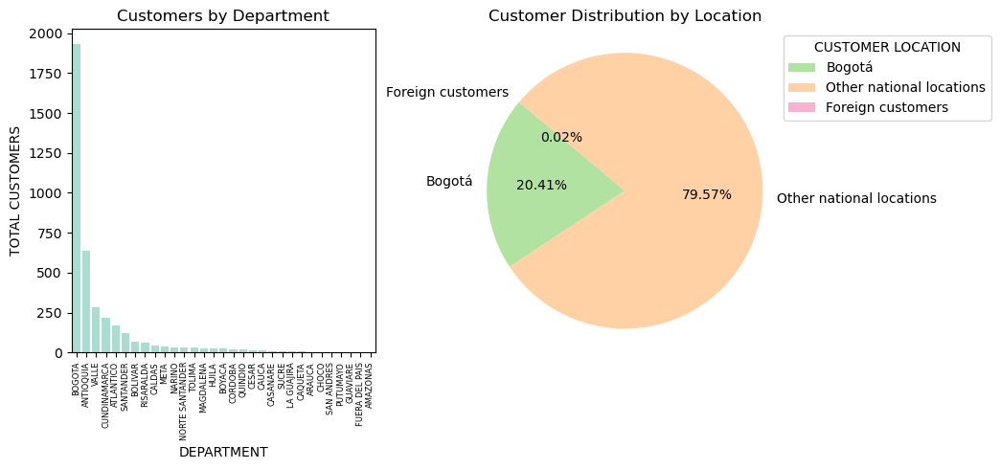

In [18]:
# Define a function to categorize entries by location
def categorize_department(dept):
    if dept == 'BOGOTA':
        return 'Bogotá'
    elif dept == 'FUERA DEL PAIS':
        return 'Foreign customers'
    else:
        return 'Other national locations'


# Create a copy of the df to avoid modifying the original one
customers_filtered_feats_df_for_plotting = customers_filtered_feats_df.copy()
# Categorize location
customers_filtered_feats_df_for_plotting[
    'CATEGORIA_DEPARTAMENTO'] = customers_filtered_feats_df_for_plotting[
                                    'DEPARTAMENTO'].apply(categorize_department)
# Count each category
category_counts = customers_filtered_feats_df_for_plotting['CATEGORIA_DEPARTAMENTO'].value_counts()
# Define locations custom order
custom_order = ['Bogotá', 'Other national locations', 'Foreign customers']
# Reorder categories in category_counts
category_counts = category_counts.reindex(custom_order)
# Define figure and subplots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
# Count the occurrences of each department and sort them by count
sorted_counts = customers_filtered_feats_df['DEPARTAMENTO'].value_counts().index
# Plot count plot in the first column
sns.countplot(data=customers_filtered_feats_df, x='DEPARTAMENTO', ax=axs[0], color='#A2E5D5', order=sorted_counts)
axs[0].set_title('Customers by Department')
axs[0].set_xlabel('DEPARTMENT')
axs[0].set_ylabel('TOTAL CUSTOMERS')
# Rotate x-tick labels and adjust font size
axs[0].tick_params(axis='x', rotation=90, labelsize=6)
# Plot pie chart in the second column
colors = ['#B2E2A2', '#FFD1A4', '#F7B2D2']  # Simple named colors
axs[1].pie(category_counts, labels=category_counts.index, autopct='%1.2f%%', colors=colors, startangle=140)
axs[1].set_title('Customer Distribution by Location')
axs[1].legend(category_counts.index, title="CUSTOMER LOCATION", loc="best", bbox_to_anchor=(1, 0, 0.5, 1))
axs[1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
# Adjust layout
plt.tight_layout()
# Show plot
plt.show()

Por ello, y con el propósito de dotar al atributo de un contenido más significativo, así como de paliar el aumento de dimensionalidad que otros procesos de codificación conllevan, **reemplazamos la variable** categórica `DEPARTAMENTO` **por otra numérica de creación propia** que combine:

- El PIB del departamento de residencia, el cuál es un indicativo de su actividad y salud económica.
- La distancia en kilómetros desde la capital del departamento hasta la capital del país, Bogotá; la cual nos ofrece información sobre su proximidad al epicentro de la economía e industria colombianas.

Para ello, buscamos la información pública y creamos un fichero llamado «DEPARTAMENTOS_DISTANCIA_PIB.txt». A continuación, y tras importarlo, combinamos los datos con los de nuestros clientes, para finalmente descartar la variable original `DEPARTAMENTO` del juego de datos (si bien conservaremos la serie para combinarla más tarde con la información resumida que extraeremos de cada uno de los segmentos, lo cual facilitará la interpretación de los resultados).

In [19]:
# Load the location-related information database as a dataframe
departaments_df = pd.read_csv(os.path.join(data_dir, 'DEPARTAMENTOS_DISTANCIA_PIB.txt'),
                              encoding='ISO-8859-1', sep='|')  # Latin-1 encoded file
# Inspect df dimensions and data types
departaments_df.info()
# Show 5 first rows
display(departaments_df.head())

# Preserve department data and index in a subset Series
department_data = customers_filtered_feats_df['DEPARTAMENTO']
# Restore index as 'ID' to preserve it
customers_filtered_feats_df['ID'] = customers_filtered_feats_df.index
# Combine datasets
customers_filtered_feats_df = pd.merge(customers_filtered_feats_df, departaments_df,
                                       on='DEPARTAMENTO', how='left')
# Remove original column from dataset
customers_filtered_feats_df = customers_filtered_feats_df.drop(columns=['DEPARTAMENTO'])
# Drop deleted column from categorical variables index
categorical_cols = categorical_cols.drop(['DEPARTAMENTO'])
# Restoring index from 'ID'
customers_filtered_feats_df = customers_filtered_feats_df.set_index('ID')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31 entries, 0 to 30
Data columns (total 3 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   DEPARTAMENTO                    31 non-null     object 
 1   DISTANCIA_CAPITAL_DEPARTAMENTO  30 non-null     float64
 2   PIB_DEPARTAMENTO                30 non-null     float64
dtypes: float64(2), object(1)
memory usage: 872.0+ bytes


,DEPARTAMENTO,DISTANCIA_CAPITAL_DEPARTAMENTO,PIB_DEPARTAMENTO
0,AMAZONAS,"1,083.77","1,068.00"
1,ANTIOQUIA,427.12,"255,770.00"
2,ARAUCA,624.06,"8,548.00"
3,ATLANTICO,"1,004.90","63,765.00"
4,BOGOTA,0.00,"390,072.00"


Observamos que el fichero creado contiene **31 entradas** con los siguientes **3 atributos**:

- `DEPARTAMENTO`: Nombre del departamento de Colombia.
- `DISTANCIA_CAPITAL_DEPARTAMENTO`: Distancia en km desde la capital del departamento hasta Bogotá.
- `PIB_DEPARTAMENTO`: PIB del departamento expresado en miles de millones de pesos colombianos (COP) durante el año 2022.

Recordemos que los registros correspondientes a personas físicas no tienen ninguna información relativa al departamento de residencia, pero además encontramos dos valores nulos adicionales correspondientes a un par sociedades radicadas fuera del país, y para las cuáles no hay información relativa a la distancia hasta Bogotá. Así pues, en este punto detenemos el proceso de creación de la nueva variable numérica basada en el departamento, para retomarlo durante el proceso de imputación de valores.

In [20]:
# Analyze NaN values for customers with legal form other than physical person
customers_filtered_feats_df[(customers_filtered_feats_df['FORMAJURIDICA'] != 'PERSONA FISICA') &
                             ((customers_filtered_feats_df['DISTANCIA_CAPITAL_DEPARTAMENTO'].isna()) |
                              (customers_filtered_feats_df['PIB_DEPARTAMENTO'].isna()))]

,CANAL_REGISTRO,DIASCLIENTE,CLIENTEPORCAMPAÑAEMAIL,FORMAJURIDICA,SECTOR,ESTADO,TAMAÑO,ANTIGUEDAD,CONSUMOSTOTAL,EMPRESASUNICAS_CONSULT,NUM_COMPRAS,IMPORTE_COMPRAS,DISTANCIA_CAPITAL_DEPARTAMENTO,PIB_DEPARTAMENTO
ID,,,,,,,,,,,,,,
9702419,WEB,0,no,SOCIEDAD EXTRANJERA,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,ACTIVA,MEDIANA,Más de 10 Años,2,1,2,130,NaN,NaN
9493355,WEB,0,no,SOCIEDAD EXTRANJERA,COMERCIO AL POR MAYOR Y AL POR MENOR; REPARACI...,ACTIVA,MEDIANA,Más de 10 Años,1,1,1,15,NaN,NaN


El siguiente paso consistirá en codificar las variables categóricas de contenido ordinal, cuyos valores posibles implican una relación de gradación, condición que en el caso de nuestro _dataset_ corresponde a los atributos «ANTIGUEDAD» y «TAMAÑO», y a los cuales aplicaremos la técnica **_Ordinal Encoding_**. Para ello, seguimos los siguientes pasos:

1. Inspeccionamos sus valores posibles, entre los cuales se incluyen `SIN DETERMINAR` para el caso de `TAMAÑO` y `SIN FECHA DE CONSTITUCION` en el de `ANTIGUEDAD`.
2. Imputamos el valor `No aplicable` a los valores nulos que, recordemos, correspondían a las personas físicas.
3. Determinamos el orden de gradación, en el cual incluimos como grado inferior el valor `No aplicable`. Sin embargo, consideraremos que los casos sin determinar y sin fecha de constitución conocida quedarán excluídos de la ordinalidad, tratando de manera diferenciada la información no aplicable y la no disponible, caso este último que reservaremos para el proceso de imputación. Para su distinción, estos casos serán provisionalmente codificados con el valor `-1`.
4. Aplicamos el codificador ordinal.

In [21]:
# Select just ordinal categorical attributes
ordinal_categorical_cols = categorical_cols[categorical_cols.isin(['TAMAÑO', 'ANTIGUEDAD'])]

# Look for "TAMAÑO" unique values and show the result
size_unique_values = customers_filtered_feats_df['TAMAÑO'].unique()
print(f"Unique values in 'TAMAÑO': {size_unique_values}")
# Look for "ANTIGUEDAD" unique values and show the result
age_unique_values = customers_filtered_feats_df['ANTIGUEDAD'].unique()
print(f"Unique values in 'ANTIGUEDAD': {age_unique_values}")

# Replace NaN values in the "TAMAÑO" column with "No aplicable"
customers_filtered_feats_df['TAMAÑO'] = customers_filtered_feats_df['TAMAÑO'].replace(np.nan, 'No aplicable')
# Replace NaN values in the "ANTIGUEDAD" column with "No aplicable"
customers_filtered_feats_df['ANTIGUEDAD'] = customers_filtered_feats_df['ANTIGUEDAD'].replace(np.nan, 'No aplicable')

# Sort 'TAMAÑO' values in ascending order
size_ordinality = ['No aplicable', 'MICRO', 'PEQUEÑA', 'MEDIANA', 'GRANDE']
# Sort 'ANTIGUEDAD' values in ascending order
age_ordinality = ['No aplicable', 'Menos de 3 Meses', 'De 3 a 18 Meses', 'De 18 Meses a 3 Años',
                  'De 3 a 5 Años', 'De 5 a 10 Años', 'Más de 10 Años'] 
ordinal_categorical_cols_ordinality = [size_ordinality, age_ordinality]
# Create dictionaries mapping the category labels to their ordinal encoded values
size_encoding_dict = {index: category for index, category in enumerate(size_ordinality)}
age_encoding_dict = {index: category for index, category in enumerate(age_ordinality)}
# Combine into a single dictionary for later use
ordinal_encodings_dict = {
    'TAMAÑO': size_encoding_dict,
    'ANTIGUEDAD': age_encoding_dict
}

# Set up the ordinal encoder
ordinal_encoder = OrdinalEncoder(categories=ordinal_categorical_cols_ordinality, handle_unknown='use_encoded_value', unknown_value=-1)
# Filter customers_df to include ordinal categorical columns for Ordinal Encoding
ordinal_categorical_cols_df = customers_filtered_feats_df[ordinal_categorical_cols]
# Apply Ordinal Encoding to the resulting df
ordinal_categorical_cols_encoded = ordinal_encoder.fit_transform(ordinal_categorical_cols_df)
# Convert to a df
ordinal_categorical_cols_encoded_df = pd.DataFrame(ordinal_categorical_cols_encoded,
                                                   columns=ordinal_categorical_cols,
                                                   index=ordinal_categorical_cols_df.index)

# Drop the original ordinal categorical columns from customers_df
customers_filtered_feats_df = customers_filtered_feats_df.drop(columns=ordinal_categorical_cols)
# Reindex ordinal vars df to the original customers df to ensure same indices in the same order
ordinal_categorical_cols_encoded_df = ordinal_categorical_cols_encoded_df.reindex(customers_filtered_feats_df.index)
# Concatenate customers_df with the new ordinally encoded columns
customers_filtered_feats_df = pd.concat([customers_filtered_feats_df, ordinal_categorical_cols_encoded_df], axis=1)

Unique values in 'TAMAÑO': [nan 'MICRO' 'MEDIANA' 'PEQUEÑA' 'GRANDE' 'SIN DETERMINAR']
Unique values in 'ANTIGUEDAD': [nan 'De 5 a 10 Años' 'Más de 10 Años' 'De 3 a 18 Meses' 'De 3 a 5 Años'
 'De 18 Meses a 3 Años' 'SIN FECHA DE CONSTITUCION' 'Menos de 3 Meses']


Finalmente, aplicamos a las variables categóricas no ordinales la técnica de codificación conocida como **_One-Hot Encoding_** (en adelante, «OHE»), la cual transforma cada categoría con $n$ valores únicos en $n$ columnas diferentes, representando cada columna uno de los valores posibles. El contenido de estas columnas es de carácter lógico, marcándose con un `1` cuando la observación corresponde a la categoría y con un `0` en el caso contrario.

Con objeto de evitar la multicolinealidad, es decir, la posibilidad de predecir el valor de una variable a partir de otras, suprimiremos la primera categoría de cada variable categórica codificada mediante OHE, y la conservaremos en un diccionario para facilitar la interpretación de los resultados al final del proceso.

In [22]:
# Select just non ordinal categorical variables
non_ordinal_categorical_cols = categorical_cols[~categorical_cols.isin(['TAMAÑO', 'ANTIGUEDAD'])]

# Filter customers_df to include non-ordinal categorical columns for OHE
non_ordinal_categorical_cols_df = customers_filtered_feats_df[non_ordinal_categorical_cols]
# Create a dict of first values for each non ordinal categorical columns
non_ordinal_categorical_cols_first_category_dict = {
    col: sorted(customers_filtered_feats_df[col].unique())[0] for col in non_ordinal_categorical_cols}
# Apply OHE to the resulting df dropping the first category for each encoded variable
non_ordinal_categorical_cols_ohe_df = pd.get_dummies(non_ordinal_categorical_cols_df,
                                                     drop_first=True, dummy_na=False)
# Drop the original non-ordinal categorical columns
customers_filtered_feats_df = customers_filtered_feats_df.drop(non_ordinal_categorical_cols, axis=1)
# Reindex OHE df to the origina customers df to ensure same indices in the same order
non_ordinal_categorical_cols_ohe_df = non_ordinal_categorical_cols_ohe_df.reindex(customers_filtered_feats_df.index)
# Concatenate customers_df with the new OHE columns
customers_filtered_feats_df = pd.concat([customers_filtered_feats_df, non_ordinal_categorical_cols_ohe_df], axis=1)

<a id="4.5"></a> 
## 4.5. Imputación de valores

Procedemos a continuación a reemplazar los valores ausentes del juego de datos a través de un proceso de imputación. Para comenzar, necesitamos aplicar el proceso a aquellos valores desconocidos o no disponibles que codificamos con anterioridad con `-1` en las **columnas `ANTIGUEDAD` y `TAMAÑO`**, las cuales han sido ordinalmente codificadas. Teniendo en cuenta la ausencia de valores extremos en el caso concreto de estas dos variables, optaremos por por la estrategia  computacionalmente poco intensiva de imputación por la media.

In [23]:
# Calculate the mean of the defined values in the "TAMAÑO" column
size_mean = round(customers_filtered_feats_df.loc[customers_filtered_feats_df['TAMAÑO'] != -1, 'TAMAÑO'].mean(), 0)
# Replace values encoded as -1 with the mean
customers_filtered_feats_df.loc[customers_filtered_feats_df['TAMAÑO'] == -1, 'TAMAÑO'] = size_mean

# Calculate the mean of the defined values in the "ANTIGUEDAD" column
age_mean = round(customers_filtered_feats_df.loc[customers_filtered_feats_df['ANTIGUEDAD'] != -1, 'ANTIGUEDAD'].mean(), 0)
# Replace values encoded as -1 with the mean
customers_filtered_feats_df.loc[customers_filtered_feats_df['ANTIGUEDAD'] == -1, 'ANTIGUEDAD'] = age_mean

Por otra parte, recordemos que debíamos completar el proceso de _feature engineering_ aplicado a partir del **departamento del cliente**. El paso previo consistirá precisamente en la imputación de valores tanto para las personas físicas, de las cuales no disponíamos de información relativa al departamento, como para las sociedades internacionales, las cuales representan un caso particular en que no tiene sentido conocer su distancia hasta Bogotá como criterio para evaluar su proximidad a un centro económico de relevancia.

Para llevar a cabo la imputación, observamos la ausencia de normalidad en la distribución de los atributos añadidos `PIB_DEPARTAMENTO` y `DISTANCIA_CAPITAL_DEPARTAMENTO` a través de los gráficos de cuantiles, la cuál es confirmada mediante el test de Kolmogorov-Smirnov.

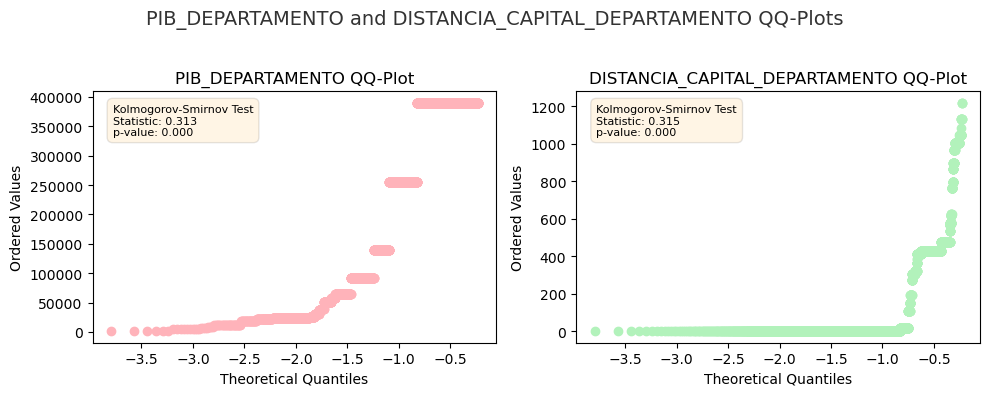

In [24]:
# Define figure and subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

# QQ-Plot for PIB_DEPARTAMENTO
probplot(customers_filtered_feats_df['PIB_DEPARTAMENTO'], dist="norm", plot=ax1)
ax1.get_lines()[0].set_color('#FFB3BA')  # Set the color of the scatter points
ax1.get_lines()[1].set_color('red')  # Set the color of the line
ax1.set_title('PIB_DEPARTAMENTO QQ-Plot')
ax1.set_xlabel('Theoretical Quantiles')
ax1.set_ylabel('Ordered Values')
# Kolmogorov-Smirnov Test for 'PIB_DEPARTAMENTO' using the normal distribution with calculated mean and std
mu, sigma = norm.fit(customers_filtered_feats_df['PIB_DEPARTAMENTO'].dropna())  # Fit a normal distribution to the data: Get the mean and the standard deviation
ks_stat_pib, ks_p_value_pib = kstest(customers_filtered_feats_df['PIB_DEPARTAMENTO'].dropna(), 'norm', args=(mu, sigma))
textstr_pib = f"Kolmogorov-Smirnov Test\nStatistic: {ks_stat_pib:.3f}\np-value: {ks_p_value_pib:.3f}"
ax1.text(0.05, 0.95, textstr_pib, transform=ax1.transAxes, fontsize=8,
         verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', alpha=0.1, facecolor='#FFA500'))

# QQ-Plot for DISTANCIA_CAPITAL_DEPARTAMENTO
probplot(customers_filtered_feats_df['DISTANCIA_CAPITAL_DEPARTAMENTO'], dist="norm", plot=ax2)
ax2.get_lines()[0].set_color('#B2F2BB')  # Set the color of the scatter points
ax2.get_lines()[1].set_color('red')  # Set the color of the line
ax2.set_title('DISTANCIA_CAPITAL_DEPARTAMENTO QQ-Plot')
ax2.set_xlabel('Theoretical Quantiles')
ax2.set_ylabel('Ordered Values')
# Kolmogorov-Smirnov Test for 'DISTANCIA_CAPITAL_DEPARTAMENTO' using the normal distribution with calculated mean and std
mu, sigma = norm.fit(customers_filtered_feats_df['DISTANCIA_CAPITAL_DEPARTAMENTO'].dropna())
ks_stat_dist, ks_p_value_dist = kstest(customers_filtered_feats_df['DISTANCIA_CAPITAL_DEPARTAMENTO'].dropna(), 'norm', args=(mu, sigma))
textstr_dist = f"Kolmogorov-Smirnov Test\nStatistic: {ks_stat_dist:.3f}\np-value: {ks_p_value_dist:.3f}"
ax2.text(0.05, 0.95, textstr_dist, transform=ax2.transAxes, fontsize=8,
         verticalalignment='top', bbox=dict(boxstyle='round,pad=0.5', alpha=0.1, facecolor='#FFA500'))

# Add title
plt.suptitle('PIB_DEPARTAMENTO and DISTANCIA_CAPITAL_DEPARTAMENTO QQ-Plots', fontsize=14, color='#333333')
# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout
# Show plots
plt.show()

Por este motivo, llevaremos a cabo la imputación de los valores nulos a través del valor de la mediana.

In [25]:
# Calculate the medians
pib_median = customers_filtered_feats_df['PIB_DEPARTAMENTO'].median()
distancia_capital_median = customers_filtered_feats_df['DISTANCIA_CAPITAL_DEPARTAMENTO'].median()
# Apply median imputation to all NaN values
customers_filtered_feats_df['PIB_DEPARTAMENTO'] = customers_filtered_feats_df['PIB_DEPARTAMENTO'].fillna(pib_median)
customers_filtered_feats_df['DISTANCIA_CAPITAL_DEPARTAMENTO'] = customers_filtered_feats_df[
                                                  'DISTANCIA_CAPITAL_DEPARTAMENTO'].fillna(distancia_capital_median)

Y por último, una vez imputados los valores, tanto a las sociedades internacionales que carecían de información sobre la distancia, como a las personas físicas sin ningún tipo de dato correspondiente al departamento, completaremos el proceso combinando ambas variables en una única. Para ello, deberemos:

1. Estandarizar las variables para que ambas contribuyan al nuevo atributo de manera equitativa.
2. Tener en cuenta que mientras que un mayor PIB es un síntoma de fuerte industrialización y acceso a un mercado relevante, en el caso de la distancia de la capital, cuanto mayor sea ésta, menor será el acceso a servicios y al mercado, por lo que `DISTANCIA_CAPITAL` deberá ser valorada inversamente.

In [26]:
# Define a function to scale and normalize the df
def scale_data(df, scaler_type='standard', excepted=None):
    """
    Scale numerical data in a dataframe or Series using various scaling techniques. Optionally,
    a single column can be excluded from scaling.

    Args:
        df (pd.DataFrame or pd.Series): Input data to be scaled.
        scaler_type (str, optional): Type of scaler to be used. Options are:
                                     'standard' (StandardScaler),
                                     'minmax' (MinMaxScaler),
                                     'norm' (Normalizer),
                                     'robust' (RobustScaler).
                                     Default is 'standard'.
        excepted (str, optional): The name of a single column to exclude from scaling. If specified, 
                                  this column will be left unchanged in the output. Default is None.

    Returns:
        pd.DataFrame or pd.Series: Scaled data with the original type and structure of the input.
    """
    # Validate inputs
    if scaler_type not in ['minmax', 'norm', 'robust', 'standard']:
        raise ValueError("scaler_type must be 'minmax' (MinMaxScaler), 'norm' (Normalizer), " +\
                         "'robust' (RobustScaler) or 'standard' (StandardScaler)")
    if excepted is not None and excepted not in df.columns:
        raise ValueError(f"excepted feature '{excepted}' is not part of the dataframe")
    if excepted is not None and isinstance(excepted, list):
        raise ValueError(f"excepted feature must be a single column name, not a list")
    if not isinstance(df, pd.Series) and not isinstance(df, pd.DataFrame):
        raise TypeError("Input must be a pandas DataFrame or Series")
    # Create a copy of the df to avoid modifying the original one
    data = df.copy()
    # Instantiate the selected Scikit-learn's scaler class
    scalers = {
        'minmax': MinMaxScaler(),
        'norm': Normalizer(),
        'robust': RobustScaler(),
        'standard': StandardScaler()
    }
    scaler = scalers[scaler_type]
    # Fit and transform the data, handle DataFrame and Series differently
    if isinstance(data, pd.Series):
        data = data.values.reshape(-1, 1)  # Reshape single column to 2D array
        scaled_data = scaler.fit_transform(data)
        scaled_data_series = pd.Series(scaled_data.flatten(), index=df.index, name=df.name)
        return scaled_data_series
    elif isinstance(data, pd.DataFrame):
        # Except column if provided
        if excepted is not None:
            excepted_feat_values = data[excepted]
            data = data.drop(columns=[excepted])
        scaled_data = scaler.fit_transform(data)
        scaled_data_df = pd.DataFrame(scaled_data,
                                      columns=df.drop(columns=[excepted]
                                                      if excepted else []).columns,
                                      index=df.index)
        # Reattach excepted column if it was removed
        if excepted is not None:
            scaled_data_df[excepted] = excepted_feat_values
        return scaled_data_df


# Scale and combine location-related features
customers_filtered_feats_df['DEPARTAMENTO_SCORE'] = ((scale_data(customers_filtered_feats_df['DISTANCIA_CAPITAL_DEPARTAMENTO'] * -1) +
                                                      scale_data(customers_filtered_feats_df['PIB_DEPARTAMENTO']))
                                                     / 2)
# Remove previous location-related features
customers_filtered_feats_df = customers_filtered_feats_df.drop(columns=[
                                  'DISTANCIA_CAPITAL_DEPARTAMENTO', 'PIB_DEPARTAMENTO'])

Quedando así integrada la nueva variable en el _dataset_ bajo el nombre de `DEPARTAMENTO_SCORE`.

In [27]:
# Show first 5 rows of the dataset
display(customers_filtered_feats_df.head())

,DIASCLIENTE,CONSUMOSTOTAL,EMPRESASUNICAS_CONSULT,NUM_COMPRAS,IMPORTE_COMPRAS,TAMAÑO,ANTIGUEDAD,CANAL_REGISTRO_SEM,CANAL_REGISTRO_WEB,CLIENTEPORCAMPAÑAEMAIL_sí,...,SECTOR_INFORMACIÓN Y COMUNICACIONES,SECTOR_NOSECTOR,SECTOR_OTRAS ACTIVIDADES DE SERVICIOS,"SECTOR_SUMINISTRO DE ELECTRICIDAD, GAS, VAPOR Y AIRE ACONDICIONADO",SECTOR_TRANSPORTE Y ALMACENAMIENTO,ESTADO_EXTINGUIDA,ESTADO_INACTIVA,ESTADO_INSOLVENTE,ESTADO_VIVA,DEPARTAMENTO_SCORE
ID,,,,,,,,,,,,,,,,,,,,,
6384286,0,11,3,1,35,0.00,0.00,False,True,False,...,False,True,False,False,False,False,False,False,True,0.18
6384667,358,1,1,1,15,1.00,5.00,False,True,False,...,False,False,False,False,False,False,False,False,False,0.96
6387954,67,61,10,13,684,0.00,0.00,False,False,False,...,False,True,False,False,False,False,False,False,True,0.18
6383269,0,1,1,1,22,0.00,0.00,False,False,False,...,False,True,False,False,False,False,False,False,True,0.18
6386670,1088,1,1,1,15,0.00,0.00,False,False,False,...,False,True,False,False,False,False,False,False,True,0.18


<a id="4.6"></a> 
## 4.6. Transformación y escalado de los datos

El siguiente paso consistirá en **transformar los datos** ya que, aunque nos interesa mantener los valores extremos por constituir un grupo significativo de los mismos, suavizándolos conseguiremos mitigar su impacto. Puesto que nuestro juego de datos contiene una gran cantidad de valores lógicos como resultado de la codificación de las variables categóricas no ordinales, aplicaremos una transformación basada en la raíz cuadrada ($\sqrt{x}$) para no distorsionar el contenido de estas columnas (dado que $\sqrt{0} = 0$ y $\sqrt{1} = 1$).

In [28]:
def transform_data(df, transformation_type='log', excepted=None):
    """
    Transforms the dataframe columns based on the specified transformation type.

    Args:
        df (DataFrame): The input DataFrame.
        transformation_type (str): Type of transformation to apply ('bc', 'log', 'sinh', 'square', 'yj').

    Returns:
        DataFrame: The transformed DataFrame.
    """
    # Validate inputs
    valid_transforms = ['bc', 'log', 'sinh', 'square', 'yj']
    if transformation_type not in valid_transforms:
        raise ValueError(f"Transformation type must be one of {valid_transforms}")
    if excepted is not None and excepted not in df.columns:
        raise ValueError(f"Excepted feature '{excepted}' is not part of the dataframe")
    # Create a copy to avoid modifying the original DataFrame
    transformed_df = df.copy()
    # Handle excepted column
    if excepted is not None:
        excepted_feat_values = transformed_df.pop(excepted)
    # Apply transformations column by column
    for col in transformed_df.columns:
        # Cast bool data type to int if needed
        if transformed_df[col].dtype == 'bool':
            transformed_df[col] = transformed_df[col].astype(int)
        if transformed_df[col].nunique() == 1:  # Check if the column is constant
            print(f"Skipping transformation for constant column: {col}")
            continue
        if transformation_type == 'bc':
            # Box-Cox requires strictly positive values
            if (transformed_df[col] <= 0).any():
                transformed_df[col] -= transformed_df[col].min() - 1
            transformed_df[col], _ = boxcox(transformed_df[col])
        elif transformation_type == 'log':
            # Ensure positive values
            transformed_df[col] = np.log1p(transformed_df[col] - transformed_df[col].min() + 1)
        elif transformation_type == 'square':
            # Ensure non-negative values
            transformed_df[col] = np.sqrt(transformed_df[col] - transformed_df[col].min())
        elif transformation_type == 'sinh':
            # Normalize data before applying sinh to avoid extreme values
            scaler = StandardScaler()
            transformed_df[col] = scaler.fit_transform(transformed_df[col].values.reshape(-1, 1)).flatten()
            transformed_df[col] = np.sinh(transformed_df[col])
        elif transformation_type == 'yj':
            transformed_df[col] = power_transform(transformed_df[[col]], method='yeo-johnson').flatten()
    # Reattach excepted column if it was removed
    if excepted is not None:
        transformed_df[excepted] = excepted_feat_values
    return transformed_df


# Transform data
transformed_customers_df = transform_data(customers_filtered_feats_df, transformation_type='square')

Seguidamente procedemos a **estandarizar las variables** para facilitar la comparación entre éstas y evitar posibles influencias relacionadas con la escala original de los datos. Optaremos por la normalización basada en $z$-_score_, asegurando de esta forma que el escalado es resultado de todas las variables de forma equitativa.

In [29]:
# Scale data
scaled_customers_df = scale_data(transformed_customers_df, scaler_type='standard')

<a id="4.7"></a> 
## 4.7. Análisis de colinealidad

El siguiente paso consistirá en analizar la posible colinealidad entre los diferentes atributos del juego de datos. Para ello, comemzaremos por calcular su **factor de inflación de la varianza** (en adelante, «VIF»).

In [30]:
# Define a function to compute VIF
def compute_vif(df, vif_threshold=5):
    """
    Compute the Variance Inflation Factor (VIF) for each feature in a given dataframe.

    Args:
        df (pd.DataFrame): Input DataFrame containing the features to analyze for multicollinearity.
        vif_threshold (float, optional): Threshold above which a feature is considered to have high 
                                         multicollinearity. Default value is set to 5.

    Returns:
        pd.DataFrame: Dataframe containing the features with VIF values above the threshold, sorted 
                      in descending order of VIF. If no features exceed the threshold, a message is printed.
    """
    # Create a copy of the df to avoid modifying the original one
    X = df.copy()
    # Cast boolean columns to numeric
    X = X.applymap(lambda x: int(x) if isinstance(x, bool) else x)
    # Add a constant term for bias in the model for VIF calculation
    X = add_constant(X)
    # Calculate VIF for each predictor
    vif_results = pd.DataFrame()
    vif_results["Feature"] = X.columns
    vif_results["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    # Select VIF over the threshold
    high_vif_results = vif_results[vif_results['VIF'] > vif_threshold]
    # Ignore the added constant
    high_vif_results = high_vif_results[high_vif_results['Feature'] != 'const']
    if len(high_vif_results) == 0:
        print(f"No VIF results over {vif_threshold}.")
    else:
        # Sorting by VIF descending, making sure 'inf' values stay at the top, and sort alphabetically by "Feature" on ties
        high_vif_results.sort_values(by=['VIF', 'Feature'], ascending=[False, True],
                                     key=lambda x: x.replace(np.inf, float('inf')), inplace=True)
        # Display the sorted results
        display(high_vif_results)


# Compute dataset's VIF
compute_vif(scaled_customers_df)

,Feature,VIF
11,FORMAJURIDICA_EMBAJADAS Y ORGANISMOS INTERNACI...,inf
19,SECTOR_ACTIVIDADES DE ORGANIZACIONES Y ENTIDAD...,inf
14,FORMAJURIDICA_PERSONA FISICA,"5,546.19"
42,ESTADO_VIVA,"4,988.04"
35,SECTOR_NOSECTOR,"4,096.00"
12,FORMAJURIDICA_EMPRESARIO,775.13
15,FORMAJURIDICA_SOCIEDAD,639.67
7,ANTIGUEDAD,87.37
13,FORMAJURIDICA_ESAL,59.54
2,CONSUMOSTOTAL,39.32


Del resultado obtenido cabe destacar cómo hay un grupo de características con una colinealidad prácticamente perfecta, lo que apunta a que son resultado de una combinación de otras variables del _dataset_. Entre éstas descataca la forma jurídica de persona física, ya que, como hemos podido apreciar durante la exploración de los datos, su aparición siempre se corresponde con una categoría única para las variables relacionadas con el sector y el estado (`ESTADO_VIVA` y `SECTOR_NOSECTOR` respectivamente), siendo por ello consecuente la aparición conjunta de estas variables en la zona más alta de la tabla. Vemos además que la `FORMAJURIDICA_EMBAJADAS Y ORGANISMOS INTERNACIONALES` y el `SECTOR_ACTIVIDADES DE ORGANIZACIONES Y ENTIDADES EXTRATERRITORIALES` ocupan también las posiciones más detacadas.

A continuación, calcularemos la **matriz de correlación** de los datos para medir la relación por pares entre variables, con el propósito de afinar la información obtenida a través del VIF.

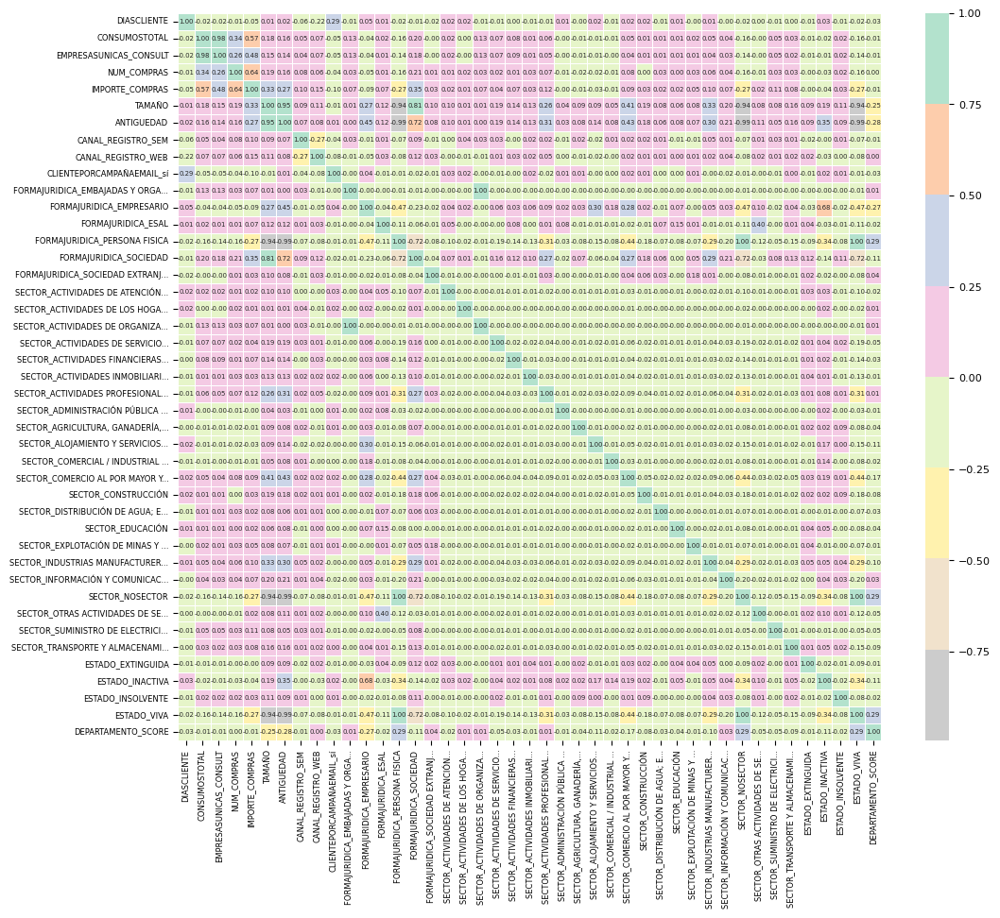

,Variable 1,Variable 2,Correlation
16,SECTOR_NOSECTOR,ESTADO_VIVA,1.00
13,FORMAJURIDICA_PERSONA FISICA,ESTADO_VIVA,1.00
12,FORMAJURIDICA_PERSONA FISICA,SECTOR_NOSECTOR,1.00
10,FORMAJURIDICA_EMBAJADAS Y ORGANISMOS INTERNACI...,SECTOR_ACTIVIDADES DE ORGANIZACIONES Y ENTIDAD...,1.00
6,ANTIGUEDAD,FORMAJURIDICA_PERSONA FISICA,-0.99
9,ANTIGUEDAD,ESTADO_VIVA,-0.99
8,ANTIGUEDAD,SECTOR_NOSECTOR,-0.99
0,CONSUMOSTOTAL,EMPRESASUNICAS_CONSULT,0.98
1,TAMAÑO,ANTIGUEDAD,0.95
5,TAMAÑO,ESTADO_VIVA,-0.94


In [31]:
# Define a function to plot correlation matrix
def plot_correlation_matrix(corr_matrix_df, max_col_len=30):
    """
    Plot a correlation matrix as a heatmap.

    Args:
        corr_matrix_df (pd.DataFrame): Input dataframe representing the correlation matrix.
        max_col_len (int, optional): The maximum length of column names before truncation. 
                                     Default is set to 30 characters.

    Returns:
        None
    """
    # Create a copy of the df to avoid modifying the original one
    X = corr_matrix_df.copy()
    # Truncate column names to a specified max length
    new_columns = []
    for col in X.columns:
        if len(col) > max_col_len:
            new_col = col[:max_col_len] + '...'
        else:
            new_col = col
        new_columns.append(new_col)
    # Assign truncated column names to the corr matrix
    X.columns = new_columns
    # Ensure the row labels (index) are updated as well
    X.index = X.columns 
    # Plot the correlation matrix as a heatmap
    plt.figure(figsize=(12, 10))
    ax = sns.heatmap(X, annot=True, fmt='.2f', linewidth=.5, cmap='Pastel2_r',
                     annot_kws={'size': 5}, cbar_kws={'aspect': 30})
    # Adjust axis tick labels fontsize
    ax.tick_params(axis='both', which='major', labelsize=6) 
    # Retrieve the color bar
    cbar = ax.collections[0].colorbar
    # Adjust labelsize of the color bar
    cbar.ax.tick_params(labelsize=8)
    plt.show()


# Define a function to compute correlation matrix
def compute_correlation_matrix(df, corr_threshold=0.7, plot_matrix=True):
    """
    Compute and analyze the correlation matrix of a given dataframe.

    Args:
        df (pd.DataFrame): Input DataFrame containing the features to analyze for correlation.
        corr_threshold (float, optional): Threshold above which a pair of variables is considered 
                                          to have high correlation. Default is set to 0.7.
        plot_matrix (bool, optional): Option to plot the correlation matrix heatmap. Default is
                                      set to True.

    Returns:
        pd.DataFrame: Dataframe containing pairs of variables with high correlation and their 
                      correlation coefficients, sorted by the absolute value of the correlation.
    """
    # Create a copy of the df to avoid modifying the original one
    X = df.copy()
    # Compute correlation matrix
    corr_matrix = X.corr()
    # Plot correlation matrix
    if plot_matrix:
        plot_correlation_matrix(corr_matrix)
    # Compute the upper-triangle indices of the correlation matrix minus the diagonal
    upper_tri_indices = np.triu_indices(len(corr_matrix), k=1)
    # Extract pairs of columns with high correlation
    high_corr_pairs = [(corr_matrix.columns[i], corr_matrix.columns[j])
                       for i, j in zip(*upper_tri_indices) if abs(corr_matrix.iloc[i, j]) > corr_threshold]
    # Show pairs with high collinearity
    high_corr_df = pd.DataFrame(high_corr_pairs, columns=['Variable 1', 'Variable 2'])
    high_corr_df['Correlation'] = [corr_matrix.loc[v1, v2] for v1, v2 in high_corr_pairs]
    # Sort by absolute value of correlation
    high_corr_df = high_corr_df.sort_values(by='Correlation', key=lambda x: x.abs(), ascending=False)
    # Set temporal display options to display the fullcorrelation df
    with pd.option_context('display.max_rows', None, 'display.max_columns', None):
        display(high_corr_df)


# Calculate dataset's correlation matrix
compute_correlation_matrix(scaled_customers_df)

La matriz resultante evidencia las conclusiones obtenidas anteriormente, y la forma jurídica de persona física y sus valores correspondientes para el estado y el sector aparecen nuevamente entre los pares con el grado de correlación más alto. También cabe destacar que la forma jurídica de las embajadas y y organismos internacionales siempre va de la mano del sector `ACTIVIDADES DE ORGANIZACIONES Y ENTIDADES EXTRATERRITORIALES`, por lo cual prescindiremos de estos atributos redundantes. 

Cabe resaltar que, salvo por la relación detectada entre el número de consumos y el número de empresas únicas consultadas, todas las variables destacadas hacen relación al perfil empresarial del cliente, lo que pone de relieve la fuerte relación entre determinados atributos y la forma jurídica de la empresa a la que se refieren.

In [32]:
# Drop redundant variables
filtered_scaled_customers_df = scaled_customers_df.drop(columns=[
                                  'SECTOR_NOSECTOR', 'ESTADO_VIVA',
                                  'SECTOR_ACTIVIDADES DE ORGANIZACIONES Y ENTIDADES EXTRATERRITORIALES'])

<a id="4.8"></a> 
## 4.8. Valoración de variables

Por último, y antes de proceder a aplicar el algoritmo de agrupación sobre los datos, identificaremos cuáles son las características más relevantes, para lo cual aplicaremos un análisis de componentes principales (en adelante, «**PCA**» por las siglas en inglés de _Principal Component Analysis_). Pese a que una de las principales ventajas de aplicar PCA sobre un _dataset_ es la de reducir su dimensionalidad manteniendo una importante proporción de la varianza, en nuestro caso utilizaremos esta técnica con el único propósito de obtener información sobre cuáles son los atributos que contribuyen en mayor medida a esa varianza en el conjunto de datos.

In [33]:
# Define a function to apply PCA
def obtain_pca_main_feats_and_variance_ratio(df, desired_var_ratio=0.95, display_result=True,
                                             return_pca_df=False, return_pca_main_feat_dict=False):
    """
    Perform PCA on the DataFrame and obtain main features and variance ratios.

    Args:
        df (pd.DataFrame): Input dataframe containing the features to analyze.
        desired_var_ratio (float, optional): Desired cumulative variance ratio to determine 
                                             the number of principal components to retain.
                                             Default is set to 0.95.
        display_result (bool, optional): Option to display the DataFrame containing the principal 
                                         components, their main features, and explained variance ratios.
                                         Default is set to True.
        return_pca_df (bool, optional): Option to return the PCA-transformed dataframe. Default is
                                        set to False.
        return_pca_main_feat_dict (bool, optional): Option to return a dictionary of the main 
                                                    features for each principal component. Default is
                                                    set to False.

    Returns:
        pd.DataFrame or dict or tuple: Depending on the options specified:
                                       - PCA-transformed dataframe if return_pca_df is True.
                                       - Dictionary of main features for each principal component 
                                         if return_pca_main_feat_dict is True.
                                       - Tuple of the above two if both are True.
                                       - None if neither option is selected.
    """
    # Create a copy of the df to avoid modifying the original one
    X = df.copy()
    # Compute all principal components for the dataset
    pca = PCA(svd_solver='auto', random_state=RANDOM_SEED).fit(X)
    # Get variance explained ratio
    explained_var_ratio = pca.explained_variance_ratio_
    # Calculate cumulative explained variance ratio and determine the number of features to use
    cumulative_var_ratio = np.cumsum(pca.explained_variance_ratio_)
    max_feats = np.searchsorted(cumulative_var_ratio, desired_var_ratio) + 1
    if max_feats > len(pca.explained_variance_ratio_):
        print(f"Warning: Desired variance ratio ({desired_var_ratio:.2%}) requires more components than available. Using all {len(pca.explained_variance_ratio_)} components.")
        max_feats = len(pca.explained_variance_ratio_)
    if display_result or return_pca_main_feat_dict:
        # Get the loadings
        loadings = pca.components_
        # Map the loadings back to the original feature names
        feature_names = X.columns
        loadings_df = pd.DataFrame(loadings.T, columns=[f'PC{i+1}' for i in range(loadings.shape[0])], index=feature_names)
        # Correctly use np.argmax on the DataFrame's values
        most_important_by_component = np.argmax(np.abs(loadings_df.values), axis=0)
        # Use the indices to get the feature names
        most_important_features = [feature_names[index] for index in most_important_by_component][:max_feats]
        # Prepare data for DataFrame
        pca_data = {
            'PC': [f'PC{i+1}' for i in range(max_feats)],
            'Main Feature': most_important_features,
            'Explained Variance Ratio': [f'{var:.2%}' for var in explained_var_ratio[:max_feats]],
            'Cumulative Explained Variance Ratio': [f'{cum_var:.2%}' for cum_var in cumulative_var_ratio[:max_feats]]
        }
        # Create DataFrame
        pca_data_df = pd.DataFrame(pca_data)
    if display_result:
        # Show the DataFrame
        display(pca_data_df)
    # Prepare outputs
    outputs = []
    if return_pca_df:
        # Transform the data using PCA
        X_pca = pca.transform(X)
        # Create a DataFrame from the PCA-transformed data
        pca_transformed_df = pd.DataFrame(X_pca[:, :max_feats], columns=[f'PC{i+1}' for i in range(max_feats)], index=df.index)
        outputs.append(pca_transformed_df)
    if return_pca_main_feat_dict:
        # Create a dict with the PC as key and its main feature as value
        pca_main_feat_dict = pca_data_df.set_index('PC')['Main Feature'].to_dict()
        outputs.append(pca_main_feat_dict)
    return outputs[0] if len(outputs) == 1 else tuple(outputs) if outputs else None

 
# Apply PCA to the dataframe
obtain_pca_main_feats_and_variance_ratio(filtered_scaled_customers_df, return_pca_df=False, return_pca_main_feat_dict=False)

,PC,Main Feature,Explained Variance Ratio,Cumulative Explained Variance Ratio
0,PC1,ANTIGUEDAD,12.13%,12.13%
1,PC2,CONSUMOSTOTAL,6.77%,18.90%
2,PC3,FORMAJURIDICA_EMPRESARIO,4.59%,23.49%
3,PC4,FORMAJURIDICA_ESAL,3.71%,27.20%
4,PC5,DIASCLIENTE,3.51%,30.71%
5,PC6,CANAL_REGISTRO_SEM,3.08%,33.79%
6,PC7,FORMAJURIDICA_SOCIEDAD EXTRANJERA,2.98%,36.78%
7,PC8,"SECTOR_ACTIVIDADES PROFESIONALES, CIENTÍFICAS ...",2.87%,39.64%
8,PC9,SECTOR_COMERCIO AL POR MAYOR Y AL POR MENOR; R...,2.82%,42.46%
9,PC10,ESTADO_EXTINGUIDA,2.71%,45.18%


Y nuevamente, a excepción de la aparición de `CONSUMOSTOTAL`, el resto de las variables presentes con mayor peso en cada uno de los componentes principales se refieren a características propias del perfil empresarial del cliente o, en menor grado, a su proceso de _onboarding_ en el servicio.

<a id="4.9"></a> 
## 4.9. Verificación de asimetría y normalidad

A lo largo de las fases previas hemos analizado la distribución de los datos y, al tomar la decisión de conservar una buena parte de los valores extremos, asumimos la responsabilidad de minimizar el impacto que éstos pueden tener distorsionando el resultado de nuestro análisis. Dicho esto, y para clausurar esta etapa de preprocesado de la información, revisamos el estado de la simetria y normalidad del _dataset_ en el momento de ser sometido a un algoritmo de agrupamiento, descartando las variables binarias codificadas mediante OHE.

,Feature,Skewness,P-Value,Skewed,Normal
0,DIASCLIENTE,2.20,0.00,True,False
1,CONSUMOSTOTAL,12.34,0.00,True,False
2,EMPRESASUNICAS_CONSULT,12.69,0.00,True,False
3,NUM_COMPRAS,1.74,0.00,True,False
4,IMPORTE_COMPRAS,3.12,0.00,True,False
5,TAMAÑO,0.71,0.00,True,False
6,ANTIGUEDAD,0.41,0.00,False,False
7,DEPARTAMENTO_SCORE,-2.45,0.00,True,False


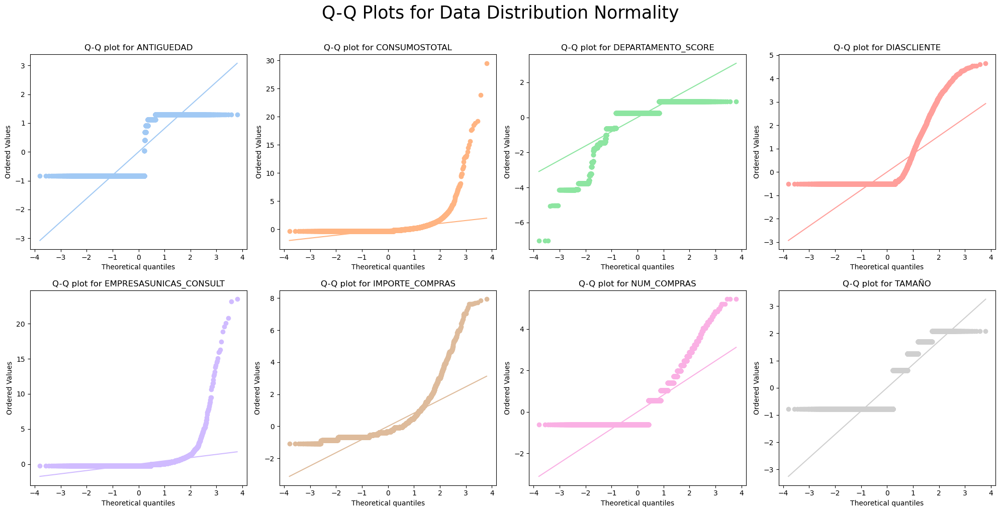

In [34]:
# Define a function to check symmetry and normal distribution for every var in a df
def check_skewness_and_normality(df, skewness_threshold=0.5, alpha=0.05):
    """
    Check each feature in the dataframe for skewness and Gaussian distribution.
    
    Args:
        df (pd.DataFrame): Input dataframe.
        skewness_threshold (float): Threshold for considering a feature as skewed.
        alpha (float): Significance level for the normality test.

    Returns:
        pd.DataFrame: Summary dataframe with skewness, p-value from the normality test, and flags for skewness and normality.
    """
    # Define metrics
    results = {'Feature': [], 'Skewness': [], 'P-Value': [], 'Skewed': [], 'Normal': []}
    # Check every column in the dataframe
    for column in df.columns:
        # Calculate skewness for each column
        column_skewness = skew(df[column].dropna())  # dropna() to handle missing values safely
        # Perform D'Agostino and Pearson's test
        _, p_value = normaltest(df[column].dropna())
        # Determine if the column is skewed
        is_skewed = abs(column_skewness) > skewness_threshold
        # Determine if the column follows a normal distribution
        is_normal = p_value > alpha
        # Append results
        results['Feature'].append(column)
        results['Skewness'].append(column_skewness)
        results['P-Value'].append(p_value)
        results['Skewed'].append(is_skewed)
        results['Normal'].append(is_normal)  
    # Create df from the results dict
    summary_df = pd.DataFrame(results)
    display(summary_df)


# Discard OHE encoded variables
ohe_prefixes = ['CANAL_REGISTRO_', 'CLIENTEPORCAMPAÑAEMAIL', 'FORMAJURIDICA_', 'SECTOR_', 'ESTADO_']
non_ohe_columns = [col for col in filtered_scaled_customers_df.columns
                   if not any(col.startswith(prefix) for prefix in ohe_prefixes)]
# Check the df symmetry and normality
check_skewness_and_normality(filtered_scaled_customers_df[non_ohe_columns])


# Defina a function to Q-Q plot every var in a df
def plot_qq_charts(df):
    """
    Generate Q-Q plots for each numeric variable in the dataframe to assess normality.
    
    Args:
        df (pd.DataFrame): Input dataframe containing the variables to be plotted.
    
    Returns:
        None
    """
    # Identify numeric columns in the df
    numeric_vars = df.select_dtypes(include=[np.number]).columns
    num_vars = len(numeric_vars)
    # Determine number of rows and columns for the subplots
    if num_vars <= 5:
        nrows, ncols = 1, num_vars
    else:
        nrows = 2
        ncols = (num_vars + 1) // nrows  # Calculate columns per row rounding up when needed
    # Define list of colors
    colors = sns.color_palette("pastel", num_vars)
    # Create a figure and axes with the specified dimensions
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols * 5, nrows * 5))
    axes = axes.flatten()  # Flatten the axes array
    # Plot Q-Q plots for each numerical variable
    for i, var in enumerate(sorted(numeric_vars)):
        (osm, osr), (slope, intercept, r) = probplot(df[var], dist="norm", plot=axes[i])
        axes[i].get_lines()[0].set_markerfacecolor(colors[i])
        axes[i].get_lines()[0].set_markeredgecolor(colors[i])
        axes[i].get_lines()[1].set_color(colors[i])
        axes[i].set_title(f'Q-Q plot for {var}')
    # If there are more subplots than variables remove the remaining ones
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    # Set title
    fig.suptitle('Q-Q Plots for Data Distribution Normality', fontsize=25,
                 color='black', va='bottom')
    # Adjust layout
    plt.tight_layout()
    plt.show()


# Show Q-Q plots
plot_qq_charts(filtered_scaled_customers_df[non_ohe_columns])

Y a la vista de los resultados podemos confirmar que todas las variables sufren desviaciones en mayor o menor grado respecto a la distribució normal, siendo más severo en el caso de `DIASCLIENTE` y `EMPRESASUNICAS_CONSULT`, especialmente en la cola superior.

<a id="5"></a>
***
# 5. Primera fase de la segmentación

<a id="5.1"></a> 
## 5.1. Aplicación del algoritmo de agrupamiento

Una vez preprocesados los datos procedemos a aplicar el algoritmo de agrupamiento sobre el _dataset_. En nuestro caso, optaremos por utilizar el **algoritmo _K-Medoids_** (la función objetivo del cual es $\left(\text{Minimize} \quad \sum_{j=1}^k \sum_{x_i \in C_j} d(x_i, m_j)\right)$, por combinar la eficiencia de los algoritmos basados en distancias con un mayor grado de robustez frente a los valores extremos presentes en nuestro juego de datos, al utilizar los puntos más representativos del grupo en lugar de las medias, lo que minimiza la suma de las distancias absolutas. Utilizaremos además como **métrica la distancia Manhattan** $\left(d(\mathbf{x}, \mathbf{y}) = \sum_{i=1}^n |x_i - y_i|\right)$, nuevamente por ser menos sensible a los valores atípicos, puesto que calcula la distancia sumando las diferencias absolutas en cada dimensión, en lugar de elevarlas al cuadrado como en la métrica euclidiana, reduciendo así el impacto de los _outliers_.

Debido a que su parametrización precisa de determinar el número de agrupaciones resultantes, lo aplicaremos en combinación con el cálculo del **coeficiente de la silueta**, método particularmente eficiente cuando el número posible de clústeres resultantes es inicialmente desconocido o cuando los límites entre las agrupaciones no están particularmente bien definidos. Sin embargo, cuando los clústeres presentan tamaños y densidades diferentes, sus resultados pueden no ser del todo óptimos, razón por la cual compararemos sus resultados también con los obtenidos a través del **índice de Calinski-Harabasz**, al tratarse de una métrica menos sensible a la densidad y tamaño de los clústeres, así como a la presencia de valores extremos. De esta manera, disponemos de un criterio doble que nos va a permitir afinar el proceso de determinación del valor óptimo de $k$.

The operation took 19 minutes and 36 seconds.


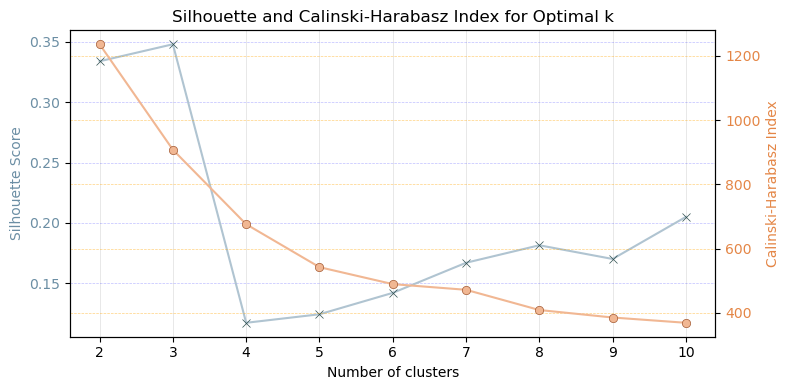

In [35]:
# Define a function to time computationally complex operations
def print_duration(seconds, custom_message=None):
    """
    Print the duration of an operation in human-readable format.

    Args:
        seconds (float): Duration of the operation in seconds.
        custom_message (str): Option to change the message prefix for the printed output.

    Returns:
        None
    """
    # Calculate the number of hours, minutes, and the remaining seconds
    hours = seconds // 3600
    remaining_seconds = seconds % 3600
    minutes = remaining_seconds // 60
    remaining_seconds = remaining_seconds % 60
    # Set printed message prefix
    if custom_message is None:
        message = 'The operation took'
    else:
        message = custom_message
    # Format the output based on needed time units
    hours_formatted = 'hours' if hours != 1 else 'hour'
    minutes_formatted = 'minutes' if minutes != 1 else 'minute'
    seconds_formatted = 'seconds' if remaining_seconds != 1 else 'second'
    if hours > 0:
        print(f"{message} {int(hours)} {hours_formatted}, {int(minutes)} {minutes_formatted} and "
              f"{int(np.round(remaining_seconds))} {seconds_formatted}.")
    elif minutes > 0:
        print(f"{message} {int(minutes)} {minutes_formatted} and "
              f"{int(np.round(remaining_seconds))} {seconds_formatted}.")
    else:
        print(f"{message} {int(np.round(remaining_seconds))} {seconds_formatted}.")



# Define a function to apply K-Medoids clustering algorithm
def perform_kmedoids_clustering(df, k_max, metric_type='manhattan', labels_col='ClusterLabels'):
    """
    Perform K-Medoids clustering on the given dtaframe and evaluate cluster quality.

    Args:
        df (pd.DataFrame): Input dataframe containing the features to cluster.
        k_max (int): Maximum number of clusters to evaluate.
        metric_type (str, optional): Distance metric to use. Options are 'euclidean', 
                                     'squared euclidean', 'manhattan', 'chebyshev', 
                                     'canberra', and 'chi-square'. Default value is
                                     set to 'manhattan'.

    Returns:
        tuple: A dictionary containing:
            - 'cluster_details': Dictionary with cluster details for each number of clusters.
            - 'silhouette_scores': List of silhouette scores for each number of clusters.
            - 'calinski_harabasz_scores': List of Calinski-Harabasz scores for each number of clusters.
            - 'feature_importance': Dictionary with feature importance for each number of clusters.
        pd.DataFrame: Input DataFrame with additional columns for cluster labels.
    """
    # Create a copy of the df to avoid modifying the original one
    data = df.copy()
    # Convert the whole DataFrame to a numpy array
    X_np = data.to_numpy()
    
    # Time the operation by starting a timer
    start_time = datetime.now()
    
    # Define range of clusters to try
    range_n_clusters = list(range(2, k_max+1))
    cluster_details = {}
    silhouette_avg = []
    calinski_harabasz_scores = []
    medoids_feature_importance = {}

    # Creating distance metric
    if metric_type == 'euclidean':
        metric = distance_metric(type_metric.EUCLIDEAN)
    elif metric_type == 'squared euclidean':
        metric = distance_metric(type_metric.EUCLIDEAN_SQUARE)
    elif metric_type == 'manhattan':
        metric = distance_metric(type_metric.MANHATTAN)
    elif metric_type == 'chebyshev':
        metric = distance_metric(type_metric.CHEBYSHEV)
    elif metric_type == 'canberra':
        metric = distance_metric(type_metric.CANBERRA)
    elif metric_type == 'chi-square':
        metric = distance_metric(type_metric.CHI_SQUARE)
    
    for num_clusters in range_n_clusters:
        # Choosing initial medoids indices randomly for each k
        initial_medoids = np.random.choice(len(X_np), num_clusters, replace=False)

        # Initialize and run the K-Medoids algorithm
        kmedoids_instance = kmedoids(X_np, initial_medoids, metric=metric)
        kmedoids_instance.process()

        # Retrieve clusters and medoids
        clusters = kmedoids_instance.get_clusters()
        medoids = kmedoids_instance.get_medoids()

        # Store results in a dict
        cluster_details[num_clusters] = {"clusters": clusters, "medoids": medoids}

        # Assign cluster labels for this k to the df for immediate or later use
        cluster_labels = np.empty(X_np.shape[0], dtype=int)
        for cluster_idx, cluster in enumerate(clusters):
            for index in cluster:
                cluster_labels[index] = cluster_idx + 1  # Adjust labels to start from 1
        data[f'{labels_col}_{num_clusters}'] = cluster_labels

        # Calculate and store silhouette score
        silhouette_avg.append(silhouette_score(X_np, cluster_labels))
        # Calculate and store Calinski-Harabasz index
        calinski_harabasz_scores.append(calinski_harabasz_score(X_np, cluster_labels))

        # Calculate feature importance
        medoid_points = X_np[medoids]
        # Use standard deviation as a measure of spread and importance across medoids
        std_devs = np.std(medoid_points, axis=0)
        medoids_feature_importance[num_clusters] = pd.Series(std_devs,
                                                     index=df.columns).sort_values(
                                                         ascending=False)
    
    # End timer and print timing result
    end_time = datetime.now()
    elapsed_time = end_time - start_time
    print_duration(elapsed_time.total_seconds())
    
    return {
        'cluster_details': cluster_details,
        'silhouette_scores': silhouette_avg,
        'calinski_harabasz_scores': calinski_harabasz_scores,
        'feature_importance': medoids_feature_importance
    }, data


def plot_silhouette_and_calinski_harabasz_scores(k_max, silhouette_avg, calinski_harabasz_scores):
    """
    Plot Silhouette and Calinski-Harabasz scores for different numbers of clusters.

    Args:
        k_max (int): Maximum number of clusters evaluated.
        silhouette_avg (list): List of average Silhouette scores for each number of clusters.
        calinski_harabasz_scores (list): List of Calinski-Harabasz scores for each number of clusters.

    Returns:
        None
    """
    # Define range of clusters to try
    range_n_clusters = list(range(2, k_max+1))
    # Define plot size
    fig, ax1 = plt.subplots(figsize=(8, 4))
    # Plotting Silhouette scores
    silhouette_lines_color = '#B0C4D1'
    silhouette_labels_color = '#6B8EA4'
    ax1.set_xlabel('Number of clusters')
    ax1.set_ylabel('Silhouette Score', color=silhouette_labels_color, fontsize=10)
    ax1.plot(range_n_clusters, silhouette_avg, 'bx-', color=silhouette_lines_color,
             markeredgecolor='DarkSlateGray', markeredgewidth=0.5)
    ax1.tick_params(axis='y', labelcolor=silhouette_labels_color)
    ax1.set_xticks(range_n_clusters)  # Ensure that x-axis has ticks for all clusters
    # Add grid for the primary axis
    ax1.grid(True, which='both', axis ='y', linestyle='dashed', linewidth=0.5, color='blue', alpha=0.25)
    ax1.grid(True, which='both', axis ='x', linestyle='solid', linewidth=0.5, color='grey', alpha=0.25)
    # Create a second y-axis for Calinski-Harabasz scores
    calinski_harabasz_lines_color = '#F1B793'
    calinski_harabasz_labels_color = '#E48646'
    ax2 = ax1.twinx()
    ax2.set_ylabel('Calinski-Harabasz Index', color=calinski_harabasz_labels_color, fontsize=10)
    ax2.plot(range_n_clusters, calinski_harabasz_scores, 'ro-', color=calinski_harabasz_lines_color,
             markeredgecolor='#A45A33', markeredgewidth=0.5)
    ax2.tick_params(axis='y', labelcolor=calinski_harabasz_labels_color)
    # Add grid for the secondary axis
    ax2.grid(True, which='both', axis ='y', linestyle='dashed', linewidth=0.5, color='orange', alpha=0.5)
    # Set the title and layout
    plt.title('Silhouette and Calinski-Harabasz Index for Optimal k')
    # Adjust padding
    fig.tight_layout()
    # Display the plot
    plt.show()


# Define maximum number of clusters
k_max = 10
# Perform K-Medoids clustering for a range k from 2 to maximum number of clusters
clustering_customers_results, clustering_customers_results_df = perform_kmedoids_clustering(filtered_scaled_customers_df, k_max)
# Plot clustering validation results
plot_silhouette_and_calinski_harabasz_scores(k_max, clustering_customers_results['silhouette_scores'],
                                             clustering_customers_results['calinski_harabasz_scores'])

Como podemos observar, de acuerdo con el resultado del coeficiente de la silueta, el valor óptimo estaría entre 2 y 3 clústeres con una pequeña diferencia a favor del segundo valor. Sin embargo, el índice de Calinski-Harabasz apunta a un marcado descenso de los resultados para $k=3$. Tras diferentes pruebas, la distribución destacada mediante Calinski-Harabasz produce unos clústeres mejor definidos como podemos ver a continuación, motivo por el cual nos decantamos por una **agrupación en 2 clústeres** durante esta primera fase del agrupamiento.

Procedemos así a restaurar los valores sin escalar y las columnas originales al juego de datos para poder analizar los resultados. Descartamos además las etiquetas correspondientes a un total de clústeres diferente de $k=2$. 

In [36]:
# Define a function to relabel df sorted by a numerical column
def relabel_df_sorted(df, sorting_col='IMPORTE_COMPRAS', statistic='mean', ascending=True, labels_col='ClusterLabels'):
    """
    Relabels the dataframe based on the mean or median of a specified numerical column for each label in the labels column.
    
    Args:
        df (DataFrame): DataFrame to process.
        sorting_col (str): Name of the numerical column to calculate the mean or median. Default value is
                           set to 'IMPORTE_COMPRAS'.
        statistic (str, optional): Determines if labels are relabeled based on the mean (default) or median.
                                   Default value is set to mean'.
        ascending (bool, optional): Sort order for relabeling; ascending (True) by default, descending if False.
    
    Returns:
        DataFrame: Dataframe with updated labels column based on the specified sorting and statistic.
    """
    # Validate inputs
    if statistic not in ['max', 'mean', 'median']:
        raise ValueError("sorting statistic must be 'max', 'mean' or 'median'")
    if sorting_col not in df.columns:
        raise ValueError(f"column {sorting_col} is not present in the dataframe")
    if not pd.api.types.is_numeric_dtype(df[sorting_col]):
        raise ValueError(f"column {sorting_col} must be numerical")
    # Create a copy of the df to avoid modifying the original one
    sorted_df = df.copy()
    # Group by 'ClusterLabels' and calculate mean or median
    if statistic == 'mean':
        grouped = sorted_df.groupby(labels_col)[sorting_col].mean()
    elif statistic == 'median':
        grouped = sorted_df.groupby(labels_col)[sorting_col].median()
    elif statistic == 'max':
        grouped = sorted_df.groupby(labels_col)[sorting_col].max()
    # Sort the results
    sorted_group = grouped.sort_values(ascending=ascending)
    # Create a dictionary to map old labels to new labels based on sorted order
    label_mapping = {old_label: new_label for new_label, old_label
                     in enumerate(sorted_group.index, 1)}  # Adjust labels to start from 1
    # Apply the mapping to 'ClusterLabels'
    sorted_df[labels_col] = sorted_df[labels_col].map(label_mapping)
    return sorted_df


# Define a function to set the definitive cluster labels after applying a clustering algorithm
def set_df_cluster_labels(df, k, labels_col='ClusterLabels', sorting_col='IMPORTE_COMPRAS', sorting_metric='mean'):
    """
    Set and sort dataframe cluster labels based on a specified sorting column and metric.

    Args:
        df (pd.DataFrame): Input dataframe containing cluster labels.
        k (int): Number of clusters to retain and relabel.
        labels_col (str, optional): Name to use for the cluster labels column. Default is set to 'ClusterLabels'.
        sorting_col (str, optional): Column to use for sorting clusters. Default is set to 'IMPORTE_COMPRAS'.
        sorting_metric (str, optional): Metric to use for sorting. Default is set to 'mean'.

    Returns:
        pd.DataFrame: The DataFrame with updated and sorted cluster labels.
    """
    # Drop all cluster label columns except for k
    cols_to_drop = [col for col in df.columns if col.startswith(f'{labels_col}_') and col != f'{labels_col}_{k}']
    df = df.drop(cols_to_drop, axis=1)
    # Rename 'ClusterLabels_k' to 'ClusterLabels'
    df = df.rename(columns={f'{labels_col}_{k}': labels_col})
    # Relabel the df so clusters are labeled ascending according to their mean value of 'IMPORTE_COMPRAS'
    df = relabel_df_sorted(df, labels_col=labels_col, sorting_col=sorting_col, statistic=sorting_metric)
    return df


# Define k
k = 2
# Set cluster labels according to k and sorted by total spending
labeled_customers_results_df = set_df_cluster_labels(clustering_customers_results_df, k)


# Define a function to remove selected features from a closed list
def remove_df_feat_groups(df, feats_selection, excepted=None):
    """
    Remove groups of features from the dataframe based on specified prefixes.

    Args:
        df (pd.DataFrame): Input dataframe containing the features.
        feats_selection (list): List of prefixes indicating which groups of features to remove.
        excepted (str, optional): Prefix indicating which group of features to retain even if they 
                                  match prefixes in feats_selection. Default is set to None.

    Returns:
        pd.DataFrame: Dataframe with the specified groups of features removed.

    """
    # Validate inputs
    existing_prefixes = {feat for feat in feats_selection if any(col.startswith(feat) for col in df.columns)}
    missing_prefixes = set(feats_selection) - existing_prefixes
    if missing_prefixes:
        if len(missing_prefixes) == 1:
            missing_prefix = next(iter(missing_prefixes))
            raise ValueError(f"there are no '{missing_prefix}' related feats in the dataframe")
        else:
            formatted_missing_prefixes = ', '.join(f"'{prefix}'" for prefix in missing_prefixes)
            raise ValueError(f"there are no '{formatted_missing_prefixes}' related feats in the dataframe")
    if excepted and not any(col.startswith(excepted) for col in df.columns):
        raise ValueError(f"there are no '{excepted}' related feats in the dataframe to be excepted")
    # Create a copy of the df to avoid modifying the original one
    filtered_df = df.copy()
    for feat in feats_selection:
        # Ignore an excepted feature if given
        if excepted is None or feat.startswith(excepted) is False:
            # Select every selected feature and associated feature created by OHE
            columns_to_drop = [col for col in filtered_df.columns if col.startswith(feat)]
            filtered_df = filtered_df.drop(columns=columns_to_drop)
    return filtered_df


# Define a function to restore columns removed from df
def restore_removed_columns(light_df, complete_df, remove_pca=False):
    """
    Restores missing columns from complete_df to light_df and optionally removes PCA-related columns.

    Args:
        light_df (DataFrame): Dataframe with potentially fewer columns and possibly different indices.
        complete_df (DataFrame): Dataframe with a complete set of columns.
        remove_pca (bool): Flag to indicate if PCA-related columns should be removed.

    Returns:
        DataFrame: The light_df with columns restored from complete_df and optional PCA-related columns removed.
    """
    # Check if all indices in light_df are present in complete_df
    if not light_df.index.isin(complete_df.index).all():
        raise ValueError("Some or all indices of light_df are not present in complete_df's indices.")
    # Creating a copy to avoid modifying the original DataFrame
    restored_cols_df = light_df.copy()
    # Identify columns in complete_df that are not in light_df
    cols_to_restore = complete_df.columns.difference(light_df.columns)
    restored_cols_df = light_df.join(complete_df[cols_to_restore], how='left')
    if remove_pca:
        restored_cols_df = remove_df_feat_groups(restored_cols_df, ['PC'])
    return restored_cols_df


# Restore removed columns and remove PCA-related feature
restored_labeled_customers_df = restore_removed_columns(labeled_customers_results_df, customers_filtered_feats_df)


# Define a function to restore unscaled values from df
def restore_unscaled_values(scaled_df, original_df, labels_col='ClusterLabels', additional_preserved=None):
    """
    Restores original values from the first DataFrame into the scaled version while keeping the 'ClusterLabels' column
    and any other columns that match or start with the specified 'excepted' string.
    
    Args:
        original_df (DataFrame): Original DataFrame with the original values.
        scaled_df (DataFrame): Scaled DataFrame with the 'ClusterLabels' column.
        labels_col (str): Name of the column in the scaled DataFrame that contains the cluster labels.
        additional_preserved (str, optional): A string to match columns in the scaled DataFrame that should be preserved
                                              exactly or with names starting with this string.
    
    Returns:
        DataFrame: The scaled DataFrame with original values restored and the specified columns preserved.
    """
    # Make a copy of the scaled DataFrame to avoid modifying it directly
    df_with_original_values = scaled_df.copy()

    # Ensure indices of scaled_df are a present in original_df
    if not scaled_df.index.isin(original_df.index).all():
        raise ValueError("Some or all indices of scaled_df are not present in original_df.")

    # Find the common columns between the two DataFrames (excluding 'ClusterLabels')
    common_columns = original_df.columns.intersection(scaled_df.columns)

    # Restore the original values for the common columns
    for column in common_columns:
        df_with_original_values[column] = original_df.loc[scaled_df.index, column]

    # Ensure the 'ClusterLabels' column from the scaled_df is preserved
    df_with_original_values[labels_col] = scaled_df[labels_col]
    
    # Check and add any columns that match the 'additional_preserved' string or start with it
    if additional_preserved is not None:
        matched_columns = [col for col in scaled_df.columns if col.startswith(additional_preserved)]
        for column in matched_columns:
            df_with_original_values[column] = scaled_df[column]

    return df_with_original_values


# Restore unscaled values
labeled_customers_df = restore_unscaled_values(restored_labeled_customers_df, customers_filtered_feats_df)

<a id="5.2"></a> 
## 5.2. Evaluación del agrupamiento

Seguidamente utilizaremos diferentes métodos para valorar el resultado obtenido a través el agrupamiento.

<a id="5.2.1"></a> 
### 5.2.1. Valoración de la influencia de las variables en el agrupamiento

Analizamos el resultado del _clustering_ resultante calculando una medida de dispersión o importancia, que en nuestro caso es la desviación estándar, para identificar las **características con mayor variación** de un medoide a otro y que, por lo tanto, podrían ser más influyentes en la agrupación.

In [37]:
# Define a function to analyze most important features between medoids
def analyze_medoids_feature_importance(feature_importance_dict, k, threshold=0, pca_main_feat_dict=None):
    """
    Analyze and display the feature importance of medoids for a given number of clusters.

    Args:
        feature_importance_dict (dict): Dictionary where keys are the number of clusters and values are 
                                        Series of feature importances.
        k (int): Number of clusters for which to analyze feature importance.
        threshold (float, optional): Threshold value to filter the feature importances. Only features 
                                     with importance greater than this value will be displayed.
                                     Default value is set to 0.
        pca_main_feat_dict (dict, optional): Dictionary where keys are feature names and values are main 
                                             features from PCA. Default value is set to None.

    Returns:
        None
    """
    # Extract the feature importances for the given number of clusters 'k'
    if k in feature_importance_dict:
        feature_importances = feature_importance_dict[k]
    else:
        raise ValueError(f"No feature importance data available for k={k}.")
    
  # Create DataFrame
    importance_df = pd.DataFrame({
        'Variable': feature_importances.index,
        'Importance': feature_importances.values
    })

    if threshold is not None:
        # Filter the DataFrame by the threshold
        filtered_importance_df = importance_df[importance_df['Importance'] > threshold]
    else:  # Re-run function without threshold in case no result is avobe it
        filtered_importance_df = importance_df

    if len(filtered_importance_df) == 0:
        print("No results above threshold, thus it was removed.")
        analyze_feature_importance(feature_importance_dict, k, threshold=None,
                                   pca_main_feat_dict=pca_main_feat_dict)

    # If a PCA main feature dictionary is provided, add the 'Main Feature' column
    if pca_main_feat_dict is not None:
        # Map the 'Variable' values to their corresponding 'Main Feature' using the pca_main_feat_dict
        filtered_importance_df['Main Feature'] = filtered_importance_df['Variable'].map(pca_main_feat_dict)
        # Specify column order here, making sure 'Main Feature' exists
        column_order = ['Variable', 'Main Feature', 'Importance']
    else:
        # If no 'Main Feature', use the original order
        column_order = ['Variable', 'Importance']
    
    # Sort the DataFrame by 'Importance' in descending order
    sorted_filtered_importance_df = filtered_importance_df.sort_values(by='Importance', ascending=False)
    
    # Reorder columns
    sorted_filtered_importance_df = sorted_filtered_importance_df[column_order]
    
    display(sorted_filtered_importance_df)


# Analyze critical features for medoids
analyze_medoids_feature_importance(clustering_customers_results['feature_importance'], k)

,Variable,Importance
0,FORMAJURIDICA_SOCIEDAD,1.14
1,FORMAJURIDICA_PERSONA FISICA,1.02
2,ANTIGUEDAD,0.87
3,TAMAÑO,0.72
4,DEPARTAMENTO_SCORE,0.33
5,IMPORTE_COMPRAS,0.12


Como puede observarse, la forma jurídica de persona física ha sido uno de los factores definitivos durante la formación de las agrupaciones, y nuevamente son las características definidoras del perfil empresarial del cliente las que dictan la organización de los clústeres.

Seguidamente evaluaremos cuáles han sido las variables más significativas durante el proceso de formación de los agrupamientos a través de la técnica de **_Clustering Feature Importance_** (en adelante, «CFI»), descubriendo cómo varía la calidad del _clustering_ según se elimina una determinada característica del conjunto de datos.

In [38]:
# Define a function to evaluate CFI through K-Medoids
def kmedoids_clustering_feature_importance(df, k, labels_col='ClusterLabels', threshold=0, pca_transform=False):
    """
    Analyze feature importance in K-Medoids clustering by evaluating the impact of feature removal.

    Args:
        df (pd.DataFrame): Input dataframe containing the features for clustering.
        k (int): Number of clusters for K-Medoids clustering.
        labels_col (str, optional): Name of the column containing cluster labels.
                                    Default values is set to 'ClusterLabels'.
        threshold (float, optional): Threshold value to filter the feature importances. Only features with 
                                     a silhouette score change greater than this value will be displayed.
                                     Default value is set to 0.
        pca_transform (bool, optional): Option to apply PCA transformation before clustering.
                                        Default value is set to False.

    Returns:
        None
    """
    # Create a copy of the df to avoid modifying the original one
    X = df.copy()
    # Ensure there is no 'ClusterLabels' column in the DataFrame
    X = X.drop(columns=[labels_col], errors='ignore')
    # Preserve column names before any array conversion
    feature_names = X.columns.tolist()

    # Time the operation by starting a timer
    start_time = datetime.now()

    # Convert DataFrame to NumPy array for clustering algorithm
    X_np = X.to_numpy()

    # Choosing initial medoids indices randomly
    initial_medoids = np.random.choice(len(X), k, replace=False)
    # Creating Manhattan distance metric
    manhattan_metric = distance_metric(type_metric.MANHATTAN)
    
    # Function to perform clustering and return labels
    def perform_clustering(data, initial_medoids):
        kmedoids_instance = kmedoids(data, initial_medoids, metric=manhattan_metric)
        kmedoids_instance.process()
        clusters = kmedoids_instance.get_clusters()
        # Create a labels array from clusters
        labels = np.zeros(len(data), dtype=int)
        for cluster_id, cluster in enumerate(clusters):
            for index in cluster:
                labels[index] = cluster_id
        return labels

    if pca_transform:
        X_transformed = obtain_pca_main_feats_and_variance_ratio(X, display_result=False,
                                                                 return_pca_df=True)
        X_np = X_transformed.to_numpy()
    # Baseline clustering and silhouette score
    baseline_labels = perform_clustering(X_np, initial_medoids)
    baseline_silhouette = silhouette_score(X_np, baseline_labels)
    
    # Dictionary to store the results
    results = []

    # Iteratively remove each feature and perform clustering
    for feature_name in feature_names:
        # Drop one feature
        X_reduced = X.drop(columns=[feature_name])
        # Convert DataFrame to NumPy array for clustering algorithm
        X_np_reduced = X_reduced.to_numpy()
        
        # Perform clustering
        if pca_transform:
            X_reduced_transformed = obtain_pca_main_feats_and_variance_ratio(X_reduced,
                                                                             display_result=False,
                                                                             return_pca_df=True)
            X_np_reduced = X_reduced_transformed.to_numpy()
        reduced_labels = perform_clustering(X_np_reduced, initial_medoids)
        
        # Calculate silhouette score
        reduced_silhouette = silhouette_score(X_np_reduced, reduced_labels)
        
        #  Store the results
        score_change = baseline_silhouette - reduced_silhouette
        if threshold is not None:  # Filter based on threshold when set
            if score_change > threshold:
                results.append({
                    "Feature": feature_name,
                    "Baseline Score": baseline_silhouette,
                    "Score Without": reduced_silhouette,
                    "Score Change": score_change
                })
        else:
            results.append({
                "Feature": feature_name,
                "Baseline Score": baseline_silhouette,
                "Score Without": reduced_silhouette,
                "Score Change": score_change
            })

    # Create a DataFrame from the results and round to six decimal places
    result_df = pd.DataFrame(results).round(6)
    try:
        # Sort DataFrame by Score Change, descending (to show the largest drop at the top)
        result_df = result_df.sort_values(by="Score Change", ascending=False).reset_index(drop=True)
    except KeyError:  # Re-run function without threshold in case no result is avobe it
        print("No results above threshold, thus it was removed.")
        kmedoids_clustering_feature_importance(df, k, labels_col='ClusterLabels', threshold=None)

    # End timer and print timing result
    end_time = datetime.now()
    elapsed_time = end_time - start_time
    print_duration(elapsed_time.total_seconds())
    
    # Temporarily change the display precision within the function
    original_format = pd.get_option('display.float_format')
    try:
        pd.set_option('display.float_format', '{:.6f}'.format)
        display(result_df)
    finally:
        pd.set_option('display.float_format', original_format)


# Evaluate CFI
kmedoids_clustering_feature_importance(filtered_scaled_customers_df, k)

The operation took 9 minutes and 33 seconds.


,Feature,Baseline Score,Score Without,Score Change
0,FORMAJURIDICA_PERSONA FISICA,0.333848,0.313858,0.019990
1,ANTIGUEDAD,0.333848,0.318582,0.015266
2,TAMAÑO,0.333848,0.319829,0.014019
3,FORMAJURIDICA_SOCIEDAD,0.333848,0.324457,0.009391
4,SECTOR_COMERCIO AL POR MAYOR Y AL POR MENOR; R...,0.333848,0.326870,0.006978
5,SECTOR_ACTIVIDADES INMOBILIARIAS,0.333848,0.328171,0.005678
6,"SECTOR_SUMINISTRO DE ELECTRICIDAD, GAS, VAPOR ...",0.333848,0.329183,0.004666
7,"SECTOR_ACTIVIDADES PROFESIONALES, CIENTÍFICAS ...",0.333848,0.329330,0.004518
8,FORMAJURIDICA_EMPRESARIO,0.333848,0.329408,0.004440
9,SECTOR_INDUSTRIAS MANUFACTURERAS,0.333848,0.330213,0.003635


Y como se puede apreciar, nuevamente la forma jurídica de persona física por un lado, así como la forma jurídica societaria por otro, tienen el peso más relevante. Encontramos igualmente en las primeras posiciones características como la antigüedad y el tamaño que, recordemos, tenían el valor distintivo `No aplicable` en el caso de las personas físicas y aparecían aparejadas con esta forma jurídica durante nuestro análisis de la colinealidad, por lo que todas las pruebas de evaluación de las variables realizadas parecen apuntar en la misma dirección.

<a id="5.2.2"></a> 
### 5.2.2. Análisis de los clústeres resultantes

Seguidamente, y con objeto de profundizar en el papel de la forma jurídica en la definición de los clústeres resultantes, analizamos la concentración de personas físicas por un lado, así como de empresarios y toda clase de sociedades por el otro, y observamos que tenemos 2 agrupaciones perfectamente delimitadas a través de las cuales ambos colectivos han quedado definidos y separados.

1      2
FORMA_JURIDICA           Statistic                     
Persona física           Counts             5591      0
                         Distribution (%) 100.00   0.00
Sociedades y empresarios Counts                0   3867
                         Distribution (%)   0.00 100.00

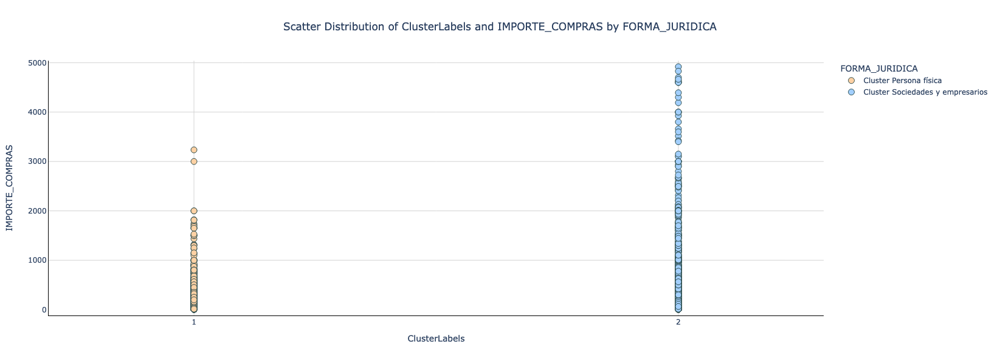

In [39]:
def display_categorical_feature_distribution(df, categorical_col, labels_col='ClusterLabels'):
    """
    Displays the distribution of categorical values across cluster labels in a DataFrame.

    Args:
        df (pd.DataFrame): Dataframe containing the cluster labels and categorical data.
        categorical_col (str): The column name for the categorical data.
        labels_col (str): Column name for the cluster labels.
    
    Returns:
        pd.DataFrame: Dataframe displaying the counts and distribution percentages of categorical values across clusters.
    """
    # Validate inputs
    if categorical_col not in df.columns or labels_col not in df.columns:
        raise ValueError(f"columns {categorical_col} and/or {labels_col} are not present in the dataframe")
    # Group the data by category and cluster label and count occurrences
    grouped_data = df.groupby([categorical_col, labels_col]).size().unstack(fill_value=0)
    # Calculate the distribution percentage
    distribution_data = grouped_data.divide(grouped_data.sum(axis=1), axis=0) * 100
    # Combine counts and distribution into a MultiIndex DataFrame
    combined_df = pd.concat([grouped_data, distribution_data], keys=['Counts', 'Distribution (%)'], axis=1)
    # Prepare multi-index using the unique values of the categorical column and the statistic types
    multi_index_tuples = [(i, measure) for i in combined_df.index for measure in ['Counts', 'Distribution (%)']]
    multi_index = pd.MultiIndex.from_tuples(multi_index_tuples, names=[categorical_col, 'Statistic'])
    # Reformat the DataFrame to have multiindex rows and cluster labels as columns
    sorted_cluster_labels = sorted(df[labels_col].unique())  # Sort the unique cluster labels
    feat_dist_df = pd.DataFrame(index=multi_index, columns=sorted_cluster_labels)
    for label in sorted_cluster_labels:
        for category, measure in multi_index_tuples:
            if measure == 'Counts':
                feat_dist_df.loc[(category, measure), label] = grouped_data.loc[category, label]
            else:
                feat_dist_df.loc[(category, measure), label] = distribution_data.loc[category, label]
    # Show result
    display(feat_dist_df)


# Define the columns that uniquely identify each type
persona_fisica_col = 'FORMAJURIDICA_PERSONA FISICA'
empresario_col = 'FORMAJURIDICA_EMPRESARIO'
sociedades_cols = [col for col in labeled_customers_df.columns if "FORMAJURIDICA" in col and col not in {persona_fisica_col, empresario_col}]
# Create a copy of the df to avoid modifying the original one
legal_forms_labeled_df = labeled_customers_df.copy()
# Create a new column for the legal form and assign the default value 'SOCIEDADES'
legal_forms_labeled_df['FORMA_JURIDICA'] = 'Sociedades y empresarios'
# Update the column when the legal form is 'PERSONA FÍSICA' or EMPRESARIO'
legal_forms_labeled_df.loc[legal_forms_labeled_df[persona_fisica_col] == 1, 'FORMA_JURIDICA'] = 'Persona física'
# Compute legal form distribution across clusters
display_categorical_feature_distribution(legal_forms_labeled_df, categorical_col='FORMA_JURIDICA')


# Define a function to plot scatter distribution of data
def plot_scatter_distribution_interactive(df, x_feat, y_feat, c_feat, specific_palette_map=None,
                                          fixed_axes_ranges=True, x_padding_ratio=0.04, y_padding_ratio=0.025):
    """
    Generates an interactive scatter plot with custom color palette and fixed dimensions.

    Args:
        df (pd.DataFrame): Dataframe containing the cluster labels and numerical features.
        x_feat (str): The x-axis feature for scatter plots.
        y_feat (str): The y-axis feature for scatter plots.
        c_feat (str): Column name in `df` that contains the cluster labels.
        specific_palette_map (dict): Dictionary mapping cluster labels to HEX colors.
        fixed_axes_ranges (bool): Option to fix the axes ranges. Default value is set to True.
        x_padding_ratio (float): Padding ratio for x-axis range.
        y_padding_ratio (float): Padding ratio for y-axis range.
    """
    # Define color palette
    if specific_palette_map is not None:
        palette_map = specific_palette_map
    else:
        palette_map = {1: '#E8F4F1', 2: '#6A758D', 3: '#FFD1A4', 4: '#F7B2D2', 5: '#A2CFFE',
                       6: '#FDEBA4', 7: '#C4B5E2', 8: '#FFB2B2', 9: '#B2F2BB', 10: '#FAD4C0'}
    # Create a figure
    fig = go.Figure()
    # Add scatter plots for each unique label using the provided palette map
    for label in sorted(df[c_feat].unique()):
        cluster_data = df[df[c_feat] == label]
        fig.add_trace(go.Scatter(
            x=cluster_data[x_feat],
            y=cluster_data[y_feat],
            mode='markers',
            marker=dict(color=palette_map[label], size=10, line=dict(width=1, color='DarkSlateGrey')),
            name=f'Cluster {label}'
        ))
    # Define axes ranges based on the overall data extents with extra margin
    x_margin = x_padding_ratio * (df[x_feat].max() - df[x_feat].min())
    y_margin = y_padding_ratio * (df[y_feat].max() - df[y_feat].min())
    x_range = [df[x_feat].min() - x_margin, df[x_feat].max() + x_margin]
    y_range = [df[y_feat].min() - y_margin, df[y_feat].max() + y_margin]

    # Update the layout
    fig.update_layout(
        title={'text': f'Scatter Distribution of {x_feat} and {y_feat} by {c_feat}',
               'x': 0.5, 'xanchor': 'center'},  # Center title
        xaxis_title=x_feat,
        yaxis_title=y_feat,
        legend_title=c_feat,
        legend=dict(traceorder="normal"),  # Ensure legend order follows trace addition order
        plot_bgcolor='white',
        width=800,  # Fixed width
        height=600,  # Fixed height
    )
    # Set x and y ticks to integer if the columns are integer type and no more than 10
    if np.issubdtype(df[x_feat].dtype, np.integer) and df[x_feat].max() <= 10:
        x_tickvals = list(range(int(df[x_feat].min()), int(df[x_feat].max()) + 1))
    else:
        x_tickvals = None
    if np.issubdtype(df[y_feat].dtype, np.integer) and df[y_feat].max() <= 10:
        y_tickvals = list(range(int(df[y_feat].min()), int(df[y_feat].max()) + 1))
    else:
        y_tickvals = None

    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey',
                     linecolor='black', linewidth=1, mirror=False, tickvals=x_tickvals)
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='LightGrey',
                     linecolor='black', linewidth=1, mirror=False, tickvals=y_tickvals)
    if fixed_axes_ranges:
        # Set fixed axis ranges
        fig.update_xaxes(range=x_range)
        fig.update_yaxes(range=y_range)
    else:
        # Ensure dynamic adjustment 
        fig.update_xaxes(range=None)
        fig.update_yaxes(range=None)

    # Show the interactive plot
    fig.show()


# Define color palette
legal_form_palette_map = {'Persona física': '#FFD1A4', 'Sociedades y empresarios': '#A2CFFE'}
# Plot legal form distribution across clusters
plot_scatter_distribution_interactive(legal_forms_labeled_df, x_feat='ClusterLabels', y_feat='IMPORTE_COMPRAS',
                                      c_feat='FORMA_JURIDICA', specific_palette_map=legal_form_palette_map,
                                      x_padding_ratio=0.3)

Obtenemos para cerrar esta primera fase de la segmentación la distribución entre clústeres, así como el perfil prototípico de cada uno de los segmentos formados.


Customers' distribution between clusters


ClusterLabels,1,2
Summary,,
Counts,"5,591","3,867"
Distribution (%),59.11,40.89


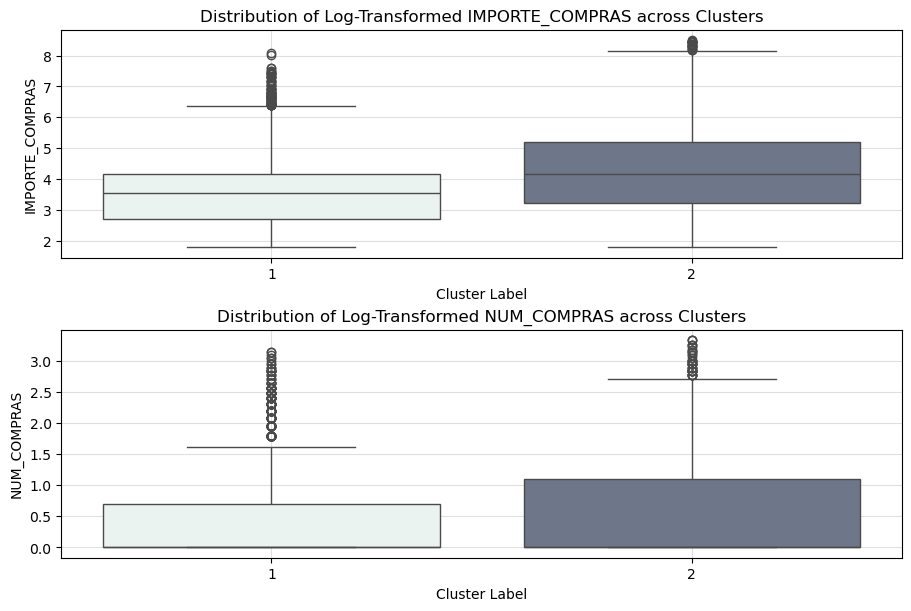


Clusters' profile


,1,2
ANTIGUEDAD,No aplicable,Más de 10 Años
CANAL,Directorios,Directorios
CLIENTEPORCAMPAÑAEMAIL,no,no
CONSUMOSTOTAL mean,9.62,68.65
DEPARTAMENTO,No aplicable,BOGOTA
DEPARTAMENTO_SCORE mean,0.18,-0.27
DIASCLIENTE mean,95.04,106.60
EMPRESASUNICAS_CONSULT mean,6.15,43.38
ESTADO,VIVA,ACTIVA
FORMAJURIDICA,PERSONA FISICA,SOCIEDAD



Clusters' IMPORTE_COMPRAS, NUM_COMPRAS comprehensive statistics


1        2
Variable        Statistic                  
IMPORTE_COMPRAS min           6.00     6.00
                max       3,235.00 4,918.00
                mean         74.12   226.67
                median       35.00    65.00
                std         151.60   502.01
NUM_COMPRAS     min           1.00     1.00
                max          23.00    28.00
                mean          1.74     2.42
                median        1.00     1.00
                std           1.94     2.95

In [40]:
# Define a function to display the clusters' distribution
def summarize_cluster_distribution(df, labels_col='ClusterLabels'):
    """
    Summarize the distribution of clusters in the dataframe.

    Args:
        df (pd.DataFrame): Input DataFrame containing the cluster labels.
        labels_col (str, optional): Name of the column containing the cluster labels.
                                    Default is set to 'ClusterLabels'.

    Returns:
        None
    """
    # Count the occurrences of each label in the 'ClusterLabel' column
    counts = df[labels_col].value_counts().sort_index()
    # Calculate the distribution of each label
    distribution = (df[labels_col].value_counts(normalize=True) * 100).round(2)
    # Create a new DataFrame with 'Counts' and 'Distribution' as rows
    summary_df = pd.DataFrame({
        'Counts': counts.apply(lambda x: "{:,}".format(x)).astype(str),
        'Distribution (%)': distribution
    }).T  # Transpose to switch rows and columns
    # Rename the index to better describe the counts and distribution
    summary_df.index.name = 'Summary'
    # Show result
    display(summary_df)


# Define a function to plot the selected features distribution
def plot_cluster_feature_distribution(df, features, labels_col='ClusterLabels', title_add=''):
    """
    Generates a grid of boxplots for selected features, with each boxplot showing the distribution
    of the feature across different clusters.

    Args:
        df (pd.DataFrame): Dataframe containing the cluster labels and numerical features.
        labels_col (str): Column name in `df` that contains the cluster labels.
                           Default is set to 'ClusterLabels'.
        features (list): List of column names representing the numerical features to be plotted.

    Returns:
        None: Displays the grid of boxplots.
    """
    if not features:
        print("No features specified for plotting.")
        return
    # Define the color palettes
    palette = ['#E8F4F1', '#6A758D', '#FFD1A4', '#F7B2D2', '#A2CFFE',
               '#FDEBA4', '#C4B5E2', '#FFB2B2', '#B2F2BB', '#FAD4C0']
    # Filter out features not present in the dataframe
    present_features = [feat for feat in features if feat in df.columns]
    # Calculate the number of features
    num_features = len(present_features)
    # Create a figure with subplots - one row per feature
    fig, axes = plt.subplots(nrows=num_features, ncols=1, figsize=(9, 3 * num_features), constrained_layout=True)
    # If there's only one feature, wrap `axes` in a list for uniform processing
    if num_features == 1:
        axes = [axes]
    # Loop through each feature and create a boxplot
    for ax, feature in zip(axes, present_features):
        sns.boxplot(ax=ax, data=df, x=labels_col, y=feature, palette=palette)
        ax.set_title(f'Distribution of {title_add}{feature} across Clusters')
        ax.set_xlabel('Cluster Label')
        ax.set_ylabel(feature)
        # Add grid
        ax.grid(color='grey', alpha=0.25)
    # Show the plot
    plt.show()


# Define a function to logarithmically transform the sales and spending features distribution and plot them
def plot_cluster_log_transformed_sales_and_spending_distribution(df, labels_col='ClusterLabels'):
    """
    Plot the log-transformed distribution of sales and spending features by cluster.

    Args:
        df (pd.DataFrame): Input DataFrame containing the features to plot.
        labels_col (str, optional): Name of the column containing cluster labels.
                                     Default is set to 'ClusterLabels'.

    Returns:
        None
    """
    # Create a copy of the df to avoid modifying the original one
    log_df = df.copy()
    # Select sales and spending features
    features_to_plot = ['IMPORTE_COMPRAS', 'NUM_COMPRAS']
    # Filter out features not present in the dataframe
    present_features = [feat for feat in features_to_plot if feat in log_df.columns]
    for feat in present_features:
        # Shift data if there are zero or negative values
        if (log_df[feat] <= 0).any():
            log_df[feat] = log_df[feat] + 1
        # Apply natural logarithm
        log_df[feat] = np.log(log_df[feat])
    
    plot_cluster_feature_distribution(log_df, features_to_plot, labels_col, title_add='Log-Transformed ')


# Define a function to restore ordinal categorial variables encoded through OrdinalEncoder
def expand_ordinal_categorical_encodings(ordinally_encoded_df, categories_dict):
    """
    Expand ordinal categorical encodings into dummy variables.

    Args:
        ordinally_encoded_df (pd.DataFrame): Input dataframe with ordinally encoded categorical variables.
        categories_dict (dict): Dictionary where keys are the variable names and values are dictionaries 
                                mapping ordinal values to their categorical labels.

    Returns:
        pd.DataFrame: Dataframe with expanded dummy variables for the ordinal categorical variables.
    """
    # Create a copy of the df to avoid modifying the original one
    df = ordinally_encoded_df.copy()
    # Iterate over the dictionary to get variable name
    for variable, mapping in categories_dict.items():
        # Conditionally add categories for mean-imputed cases
        if variable == 'TAMAÑO':
            non_integer_label = 'SIN DETERMINAR'
        elif variable == 'ANTIGUEDAD':
            non_integer_label = 'SIN FECHA DE CONSTITUCIÓN'
        else:
            print("Unexpected ordinal category found.")

        df[f'{variable}_{non_integer_label}'] = (~df[variable].apply(lambda x: x.is_integer() if pd.notnull(x) else False)).astype(int)

        # Create dummy variables for each integer-mapped category
        for key, value in mapping.items():
            df[f'{variable}_{value}'] = (df[variable].fillna(-1).apply(lambda x: int(x) if x.is_integer() else -1) == key).astype(int)
    
    # Remove the original variables to avoid confusion
    df.drop(list(categories_dict.keys()), axis=1, inplace=True)
    
    return df


# Define a function to restore the dropped first category to OHE encoded variables
def expand_non_ordinal_categorical_encodings(ohe_df, first_categories_dict):
    """
    Expand non-ordinal categorical encodings to include dropped first categories.

    Args:
        ohe_df (pd.DataFrame): Input DataFrame with one-hot encoded categorical variables.
        first_categories_dict (dict): Dictionary where keys are the base variable names and values 
                                      are the categories that were dropped during OHE.

    Returns:
        pd.DataFrame: Dataframe with expanded categorical encodings including the dropped categories.
    """
    # Create a copy of the df to avoid modifying the original one
    df = ohe_df.copy()
    # Iterate over the dictionary to get each base variable name and its dropped category
    for base_var, dropped_value in first_categories_dict.items():
        # Construct the new column name for the dropped category
        new_column_name = f"{base_var}_{dropped_value}"
        
        # Identify all existing OHE columns for this base variable
        related_columns = [col for col in df.columns if col.startswith(base_var + "_")]

        # Only proceed if there are related columns in the DataFrame
        if related_columns:
            # Sort related columns to ensure the new column is inserted in the correct position
            related_columns.sort()
            
            # Determine the index to insert the new column before other related variables
            insert_position = df.columns.get_loc(related_columns[0]) if related_columns else len(df.columns)
            
            # Calculate the value for the new column: 1 if all related OHE columns are 0, else 0
            # Sum across rows for all related columns, if the sum is 0, then this row should be 1 for the new column
            df[new_column_name] = (df[related_columns].sum(axis=1) == 0).astype(int)
            
            # Reorder columns to move the new column to the intended position
            # Get a list of all columns, remove the new column, and insert it at the correct position
            new_columns = list(df.columns)
            new_columns.remove(new_column_name)
            new_columns.insert(insert_position, new_column_name)
            df = df[new_columns]

    return df


# Define a function to compute the distribution of features amongst clusters
def calculate_attribute_clustering_distribution(ordinally_encoded_df, numerical_statistic='mean',
                                                ordinal_categories=ordinal_encodings_dict,
                                                non_ordinal_first_categories=non_ordinal_categorical_cols_first_category_dict,
                                                department_data=department_data,
                                                labels_col='ClusterLabels', display_result=False):
    """
    Calculate the distribution of attributes within clusters and summarize clustering characteristics.

    Args:
        ordinally_encoded_df (pd.DataFrame): The input DataFrame with ordinally encoded attributes.
        numerical_statistic (str, optional): The statistic to calculate for non-boolean attributes 
                                             ('mean' or 'median'). Default is 'mean'.
        ordinal_categories (dict): Dictionary mapping ordinal attribute names to their encoded categories.
        non_ordinal_first_categories (dict): Dictionary mapping non-ordinal attribute names to their first
        categories that were dropped during one-hot encoding.
        department_data (pd.Series): Series where department-related data with its corresponding indices is stored.
        labels_col (str): The column name containing the cluster labels. Default value is set to 'ClusterLabels'.
        display_result (bool, optional): If True, display the resulting DataFrame. Default is set to False.

    Returns:
        pd.DataFrame: A DataFrame containing the distribution and summary statistics of attributes within clusters,
                      with a MultiIndex (Variable, Statistic).
    """
    # Create a copy of the df to avoid modifying the original one
    df = ordinally_encoded_df.copy()

    # Expand df to replace ordinal encodings with their real values
    if any(category in df.columns for category in ordinal_categories):
        df = expand_ordinal_categorical_encodings(df, ordinal_categories)
    # Expand df to add the first category dropped during OHE
    if any(any(col.startswith(category) for col in df.columns)
           for category in non_ordinal_first_categories):
        df = expand_non_ordinal_categorical_encodings(df, non_ordinal_first_categories)
        
    # Add original department data with NaN values filled with 'No aplicable'
    department_data_filled = department_data.fillna('No aplicable')
    df['DEPARTAMENTO'] = department_data_filled
    # Apply OHE to the DEPARTAMENTO column keeping the first category
    dept_dummies = pd.get_dummies(df['DEPARTAMENTO'], prefix='DEPARTAMENTO', drop_first=False)
    df = df.join(dept_dummies)
    df = df.drop(columns=['DEPARTAMENTO'])
    
    # Determine boolean and non-boolean variables
    boolean_vars = [col for col in df.columns if set(df[col].unique()).issubset({0, 1}) and col != labels_col]
    non_boolean_vars = [col for col in df.columns if col not in boolean_vars + [labels_col]]

    # Initialize a dictionary to store results
    result_data = {}
    
    # Calculate statistics for boolean variables; ranges start at 1 to ensure labels do the same
    for var in boolean_vars:
        distribution = df[df[var] == 1][labels_col].value_counts(normalize=True).reindex(range(1, df[labels_col].max() + 1), fill_value=0) * 100
        presence = (df[df[var] == 1][labels_col].value_counts(normalize=False).reindex(range(1, df[labels_col].max() + 1), fill_value=0) /
                    df[labels_col].value_counts().reindex(range(1, df[labels_col].max() + 1), fill_value=0) * 100)
        result_data[(var, 'Distribution')] = distribution
        result_data[(var, 'Presence')] = presence

    # Calculate mean for non-boolean variables; range starts at 1 to ensure labels do the same
    for var in non_boolean_vars:
        if numerical_statistic == 'mean':
            mean_values = df.groupby(labels_col)[var].mean().reindex(range(1, df[labels_col].max() + 1), fill_value=0)
            result_data[(var, numerical_statistic.title())] = mean_values
        elif numerical_statistic == 'median':
            median_values = df.groupby(labels_col)[var].median().reindex(range(1, df[labels_col].max() + 1), fill_value=0)
            result_data[(var, numerical_statistic.title())] = median_values

    # Calculate Total Distribution; range starts at 1 to ensure labels do the same
    total_distribution = df[labels_col].value_counts(normalize=True).reindex(range(1, df[labels_col].max() + 1), fill_value=0) * 100
    result_data[('TOTAL DISTRIBUTION', 'Distribution')] = total_distribution

    # Create a DataFrame from the dictionary
    result_df = pd.DataFrame(result_data)

    # Fill NaN values with 0 and transpose the DataFrame
    result_df = result_df.fillna(0)
    transposed_result_df = result_df.T
    
    # Convert the transposed DataFrame back to a DataFrame with proper MultiIndex
    transposed_result_df = pd.DataFrame(transposed_result_df.values, index=pd.MultiIndex.from_tuples(transposed_result_df.index),
                                        columns=transposed_result_df.columns)
    transposed_result_df.index.names = ['Variable', 'Statistic']

    # Sort the DataFrame by its index (variable names) in ascending order
    sorted_transposed_df = transposed_result_df.sort_index()

    if display_result:
        # Display result
        with pd.option_context('display.max_rows', None):
            display(sorted_transposed_df)

    return sorted_transposed_df


# Define a function to summarize the clusters' profile
def profile_clusters(ordinally_encoded_df, numerical_statistic='mean', ordinal_categories=ordinal_encodings_dict,
                     non_ordinal_first_categories=non_ordinal_categorical_cols_first_category_dict,
                     department_data=department_data, labels_col='ClusterLabels', display_intermediate_results=False):
    """
    Calculate and summarize the distribution of attributes within clusters.

    Args:
        ordinally_encoded_df (pd.DataFrame): Input DataFrame with ordinally encoded categorical variables.
        numerical_statistic (str, optional): Statistic to calculate for non-boolean variables. Options are 'mean' or 'median'. Default is 'mean'.
        ordinal_categories (dict): Dictionary where keys are ordinal variable names and values are dictionaries mapping ordinal values to their categorical labels.
        non_ordinal_first_categories (dict): Dictionary where keys are base variable names and values are the dropped categories from one-hot encoding.
        department_data (pd.Series): Series where department-related data with its corresponding indices is stored.
        labels_col (str, optional): Name of the column containing cluster labels. Default is set to 'ClusterLabels'.
        display_result (bool, optional): Option to display the resulting dataframe. Default value is set to False.

    Returns:
        pd.DataFrame: Dataframe summarizing the distribution of attributes within clusters.

    """
    df = calculate_attribute_clustering_distribution(ordinally_encoded_df, numerical_statistic=numerical_statistic,
                                                     ordinal_categories=ordinal_encodings_dict,
                                                     non_ordinal_first_categories=non_ordinal_categorical_cols_first_category_dict,
                                                     labels_col=labels_col, display_result=display_intermediate_results)
    
    # Initialize an empty dictionary to store the results for each category
    results = {}

    # Handle the special boolean case for 'CLIENTEPORCAMPAÑAEMAIL'
    if ('CLIENTEPORCAMPAÑAEMAIL', 'Presence') in df.index:
        email_presence = df.loc[('CLIENTEPORCAMPAÑAEMAIL', 'Presence'), :]
        results['CLIENTEPORCAMPAÑAEMAIL'] = email_presence.apply(lambda x: 'Yes' if x > 50 else 'No')

    # Dynamically determine categories from variable names that include 'Presence' or 'Distribution'
    categories = set(idx[0].split('_')[0] for idx in df.index if 'Presence' in idx[1] or 'Distribution' in idx[1])

    # Loop through each category to determine the most prevalent item based on 'Presence'
    for category in categories:
        category_data = {}
        category_rows = df.index.get_level_values(0).str.startswith(f'{category}_') & (df.index.get_level_values(1) == 'Presence')
        category_df = df.loc[category_rows]

        if not category_df.empty:
            for cluster in category_df.columns:
                max_index = category_df[cluster].idxmax()
                most_prevalent_case = max_index[0].split('_')[-1] if max_index else None
                category_data[cluster] = most_prevalent_case
            results[category] = category_data

    # Identify non-boolean variables dynamically based on the statistics present
    all_vars = set(idx[0] for idx in df.index)  # Extract all variable names
    non_boolean_vars = [var for var in all_vars
                        if set(df.xs(var, level=0, drop_level=False).index.get_level_values(1)) == {numerical_statistic.title()}]
    # Directly transfer their mean values
    for var in non_boolean_vars:
        results[var + f' {numerical_statistic}'] = df.loc[(var, numerical_statistic.title())]

    # Create a DataFrame from the dictionary and ensure it's properly transposed
    simplified_df = pd.DataFrame(results)
    transposed_df = simplified_df.T

    # Sort the DataFrame by its index (variable names) in ascending order
    sorted_transposed_df = transposed_df.sort_index()
    
    # Display result
    with pd.option_context('display.max_rows', None):
        display(sorted_transposed_df)


# Define a function to analyze the detailed statistics of the selected variables
def compare_clusters_variables(labeled_df, variables=['IMPORTE_COMPRAS', 'NUM_COMPRAS'], labels_col='ClusterLabels'):
    """
    Compare sales and spending metrics across clusters.

    Args:
        labeled_df (pd.DataFrame): Input dataframe containing the labeled data with cluster labels.
        additional_vars (list of str, optional): Additional variables to include in the comparison. Default is None.
        labels_col (str): The column name containing the cluster labels. Default is 'ClusterLabels'.

    Returns:
        None. The function prints the comparison dataframe.
    """
    # Create a copy of the df to avoid modifying the original one
    df = labeled_df.copy()
    # Filter out variables that are not in the dataframe columns
    invalid_variables = [var for var in variables if var not in df.columns]
    if invalid_variables:
        print(f"Variables {', '.join(invalid_variables)} are not present in the dataframe")
        variables = [var for var in variables if var not in invalid_variables]
    # Reset index if the DataFrame has a non-unique index
    if not df.index.is_unique:
        df.reset_index(drop=True, inplace=True)
    # Group by 'ClusterLabels' and calculate min, max, mean, median, and std for valid variables only
    stats = ['min', 'max', 'mean', 'median', 'std']
    grouped = df.groupby(labels_col).agg({var: stats for var in variables})
    # Create a multi-index using the valid variables and the statistics
    mi_index = pd.MultiIndex.from_product([variables, stats],
                                          names=['Variable', 'Statistic'])
    # Create a DataFrame with cluster labels as columns
    labels_columns = sorted(df[labels_col].unique())
    reshaped_df = pd.DataFrame(index=mi_index, columns=labels_columns)
    # Populate the reshaped DataFrame
    for label in labels_columns:
        for var in variables:
            for stat in stats:
                reshaped_df.loc[(var, stat), label] = grouped.loc[label, (var, stat)]
    # Ensure all numeric data is float type for consistent formatting
    reshaped_df = reshaped_df.applymap(lambda x: float(x) if pd.api.types.is_number(x) else x)
    # Print result
    with pd.option_context('display.float_format', '{:,.2f}'.format):
        display(reshaped_df)


# Define a function to display the complete cluster's analysis
def display_clustering_analysis(df, x_feat='IMPORTE_COMPRAS', y_feat='NUM_COMPRAS', labels_col='ClusterLabels',
                                plot_scatter_cluster_distribution=True, show_cluster_distribution=True,
                                compare_variable_statistics=True, plot_cluster_sales_and_spending_distribution=True,
                                display_profiles=True, profiles_statistic='mean',
                                comparison_variable_statistics=['IMPORTE_COMPRAS', 'NUM_COMPRAS']):
    """
    Display a comprehensive clustering analysis of the DataFrame.

    Args:
        df (pd.DataFrame): Input dataframe containing the features and cluster labels.
        x_feat (str, optional): Feature to use for the x-axis in scatter plots. Default is set to 'IMPORTE_COMPRAS'.
        y_feat (str, optional): Feature to use for the y-axis in scatter plots. Default is set to 'NUM_COMPRAS'.
        c_feat (str, optional): Feature representing cluster labels. Default is set to 'ClusterLabels'.
        plot_scatter_cluster_distribution (bool, optional): Option to plot the scatter distribution of clusters.
                                                            Default is set to True.
        show_cluster_distribution (bool, optional): Option to display the distribution of customers between clusters.
                                                    Default is set to True.
        compare_sales_and_spending (bool, optional): Option to display comprehensive statistics for sales and spending.
                                                     Default is set to True.
        plot_cluster_sales_and_spending_distribution (bool, optional): Option to plot the log-transformed distribution
                                                                       of sales and spending between clusters.
                                                                       Default is set to True.
        display_profiles (bool, optional): Option to profile clusters based on a specified statistic.
                                           Default is set to True.
        profiles_statistic (str, optional): Statistic to use for profiling clusters. Options are 'mean' or 'median'.
                                            Default is set to 'mean'.
        comparison_statistics_additional_vars (list, optional): Additional variables to include in the sales and
                                                                spending comparison. Default is set to None.

    Returns:
        None
    """
    if show_cluster_distribution:
        # Compute customers distribution between clusters
        print("\nCustomers' distribution between clusters")
        summarize_cluster_distribution(df, labels_col=labels_col)
    if plot_scatter_cluster_distribution:
        # Plot scatter clusters distribution
        plot_scatter_distribution_interactive(df, x_feat=x_feat, y_feat=y_feat,
                                              c_feat=labels_col)
    if plot_cluster_sales_and_spending_distribution:
        # Plot distribution of sales and spending between clusters
        plot_cluster_log_transformed_sales_and_spending_distribution(df, labels_col=labels_col)
    if display_profiles:
        # Profile clusters
        print("\nClusters' profile")
        profile_clusters(df, numerical_statistic=profiles_statistic, labels_col=labels_col)
    if compare_variable_statistics:
        # Display clusters sales and spending main statistics
        print(f"\nClusters' {', '.join(comparison_variable_statistics)} comprehensive statistics")
        compare_clusters_variables(df, variables=comparison_variable_statistics, labels_col=labels_col)


# Display detailed profile of the clusters
display_clustering_analysis(labeled_customers_df, plot_scatter_cluster_distribution=False, show_cluster_distribution=True)

<a id="5.3"></a> 
## 5.3. Conclusiones de la primera fase del agrupamiento

Como hemos podido observar, la base usuaria presenta unas características distintivas asociadas a su perfil empresarial que requieren de un estudio y segmentación diferenciada. La distinción más obvia es la que divide a la clientela entre personas físicas por un lado, y diferentes formas societarias y empresarios por el otro. Si bien las métricas de una y otra clase son distintas en lo que se refiere al importe gastado, el número de compras o los consumos realizados, en algunos rangos se solapan, por lo que a la hora de segmentar a los clientes de acuerdo con sus interacciones comerciales será importante hacerlo de manera separada.

Estas particularidades además vienen asociadas a unos determinados hábitos de consumo y gasto, y analizaremos más en detalle su impacto sobre el tique de compra en las siguientes fases de este estudio. Esta **primera etapa de la segmentación funciona así como una lente de aumento** que nos permite poner el foco sobre cada uno de los clústeres formados de manera separada para **estudiar sus hábitos de compra de forma acorde a sus características** intrínsecas, facilitando la creación de segmentos más homogéneos durante la segunda etapa.

<a id="6"></a> 
***
# 6. Segunda fase de la segmentación

Como resultado de la primera fase del agrupamiento, la clientela ha quedado dividida en 2 segmentos diferenciados, uno de los cuales agrupa la totalidad de sociedades y empresarios, y el otro aísla las personas físicas que utilizan el servicio. Durante esta segunda fase trataremos por separado uno y otro segmento. De esta forma la siguiente etapa del agrupamiento descartará las características relacionadas con el perfil, el _onboarding_ y los consumos, para poner el foco en las **variables que definen de manera directa el valor económico del cliente**:

- `IMPORTE_COMPRAS`: El importe total gastado en el servicio.
- `NUM_COMPRAS`: El número total de compras realizadas.

Sin embargo, antes de proceder, enriqueceremos el juego de datos.

<a id="6.1"></a> 
## 6.1. Creación de nuevas variables

Como ya hicimos con la variable `DEPARTAMENTO` al inicio del cuaderno, el objetivo de esta fase de **_feature engineering_** consiste en utilizar conocimientos del dominio para crear nuevos atributos, transformar los existentes en otros más significativos o ponerlos en relación con objeto de descubrir patrones ocultos en los datos. Si bien, tal como ha sido expuesto al inicio de este apartado, no utilizaremos estas nuevas variables durante la segunda etapa de la segmentación, sí será revelador analizar su contenido para cada uno de los perfiles asociados a los clústeres resultantes del proceso.

Dividiremos el procedimiento en una primera etapa de _feature engineering_ aplicado al juego de datos conjunto, y una segunda en la que nos centraremos exclusivamente en el segmento correspondiente a las personas físicas, para el cual disponemos de información adicional específica.

<a id="6.1.1"></a> 
### 6.1.1. _Feature engineering_ aplicado al conjunto de datos

Comenzaremos recuperando la información de los ficheros «VENTAS.txt» y «CONSULTAS.txt» cargados durante el primer apartado, y la relacionaremos con la información agregada del fichero principal de clientes.

El primer paso consistirá en crear el campo **`VIDACLIENTE`**, el cual contendrá la antigüedad del cliente en nuestro servicio. Recordemos que el ámbito temporal de los datos objeto de estudio se circunscribe al período que va de enero de 2017 hasta julio de 2023. Asumiremos que nos encontramos justo al final de este período como si estuviéramos trabajando con información reciente, y realizaremos el cómputo de lo días transcurridos desde el registro del cliente hasta el de 31 de julio de 2023.

In [41]:
# Create a copy of the df to avoid modifying the original one
enhanced_labeled_customers_df = labeled_customers_df.copy()
# Assigning 'FECHA_REGISTRO' column from customers_df to customers_enhanced_lvl1_df
enhanced_labeled_customers_df['FECHA_REGISTRO'] = customers_df['FECHA_REGISTRO']
# Restore the 'ID' column using the index information and reset index
enhanced_labeled_customers_df = enhanced_labeled_customers_df.reset_index()
enhanced_labeled_customers_df = enhanced_labeled_customers_df.rename(columns={'index': 'ID'})

# Cast the 'FECHAVENTA' column to datetime in 'sales_df'
sales_df['FECHAVENTA'] = pd.to_datetime(sales_df['FECHAVENTA'], dayfirst=True)
# Cast the 'FECHACONSUMO' column to datetime in 'consults_df'
consults_df['FECHACONSUMO'] = pd.to_datetime(consults_df['FECHACONSUMO'], dayfirst=True)

# Create a new column with the seniority as customer
enhanced_labeled_customers_df['VIDACLIENTE'] = (pd.Timestamp('2023-07-31') - enhanced_labeled_customers_df['FECHA_REGISTRO']).dt.days

Seguidamente crearemos un campo llamado **`TENDENCIA_FRECUENCIA_VENTAS`** que evaluará la tendencia de compra de cada cliente de acuerdo con la información del fichero «VENTAS.txt» a través de un modelo de regresión lineal.

In [42]:
# Create a 'YEAR_MONTH' column for grouping sales data monthly
sales_df['AÑO_MES'] = sales_df['FECHAVENTA'].dt.to_period('M')
# Group sales by 'ID' and 'YEAR_MONTH' and count sales in each group
monthly_sales = sales_df.groupby(['ID', 'AÑO_MES']).size().reset_index(name='VENTAS_MENSUALES')
# Prepare a data dict to store the trend results
sales_trend_data = {}
# Compute trend for each customer
for customer_id, group in monthly_sales.groupby('ID'):
    if len(group) > 1:  # At least 2 points are required to establish a trend
        # Use the period index for trend calculation
        group = group.set_index('AÑO_MES')
        # Create a numeric time index for trend calculation
        group['INDICE_TIEMPO'] = np.arange(len(group))
        # Prepare the features (X) and target (y) for the regression model
        X = group['INDICE_TIEMPO'].values.reshape(-1, 1)
        y = group['VENTAS_MENSUALES'].values
        # Initialize and fit the linear regression model
        model = LinearRegression().fit(X, y)
        # Store the trend (slope of the regression line)
        sales_trend_data[customer_id] = model.coef_[0]
    else:
        # If only one point is present, assign a neutral trend (0)
        sales_trend_data[customer_id] = 0
# Convert the trend data to a df
sales_trend_df = pd.DataFrame(list(sales_trend_data.items()), columns=['ID', 'TENDENCIA_FRECUENCIA_VENTAS'])
# Merge the trend data back into the enhanced_labeled_customers_df
enhanced_labeled_customers_df = pd.merge(enhanced_labeled_customers_df, sales_trend_df, on='ID', how='left')
# Fill NaN values
enhanced_labeled_customers_df['TENDENCIA_FRECUENCIA_VENTAS'] = enhanced_labeled_customers_df['TENDENCIA_FRECUENCIA_VENTAS'].fillna(0)

Paralelamente crearemos otro campo denominado **`TENDENCIA_FRECUENCIA_CONSULT`** que evaluará la tendencia de consultas de cada cliente basándose en la informació disponible en «CONSULTAS.txt».

In [43]:
# Aggregate consultation counts by a chosen time period
consults_df['AÑO_SEMANA'] = consults_df['FECHACONSUMO'].dt.strftime('%Y-%U')
weekly_consults = consults_df.groupby(['ID', 'AÑO_SEMANA']).size().reset_index(name='CONSULTAS_SEMANALES')
# Ensure trend_data dictionary is initially filled with zeros for all customers
consults_trend_data = dict.fromkeys(consults_df['ID'].unique(), 0)
# Encode numerically 'YEAR_WEEK' for trend calculation
# Cast 'YEAR_WEEK' to a categorical type and then use the category codes for regression
weekly_consults['CODI_AÑO_SEMANA'] = weekly_consults['AÑO_SEMANA'].astype('category').cat.codes
# Calculate the trend for each customer
for customer_id, group in weekly_consults.groupby('ID'):
    if len(group) > 1:  # Need at least two points to calculate a trend
        X = group['CODI_AÑO_SEMANA'].values.reshape(-1, 1)
        y = group['CONSULTAS_SEMANALES'].values
        # Fit the linear regression model
        model = LinearRegression().fit(X, y)
        # The slope of the regression line is the trend
        consults_trend_data[customer_id] = model.coef_[0]
# Convert the trend data to a df
consults_trend_df = pd.DataFrame(list(consults_trend_data.items()), columns=['ID', 'TENDENCIA_FRECUENCIA_CONSULT'])
# Merge the trend data back into the enhanced_labeled_customers_df
enhanced_labeled_customers_df = pd.merge(enhanced_labeled_customers_df, consults_trend_df, on='ID', how='left')
# Fill NaN values
enhanced_labeled_customers_df['TENDENCIA_FRECUENCIA_CONSULT'] = enhanced_labeled_customers_df['TENDENCIA_FRECUENCIA_CONSULT'].fillna(0)

El siguiente paso será crear el campo **`CLV`**, el cual nos dará la medida del _Customer Lifetime Value_ o contribución financiera esperada de cada cliente a lo largo de toda su relación comercial con la empresa. Sin embargo, antes necesitaremos obtener la variable **`AOV`** (_Average Order Value_ o precio medio por compra). A continuación, para obtener la métrica general de vida útil de cliente, optaremos por la diferencia en días desde la primera compra hasta la última consignada en el fichero «VENTAS.txt».

In [44]:
# Calculate average purchase value for each customer
enhanced_labeled_customers_df['AOV'] = (enhanced_labeled_customers_df['IMPORTE_COMPRAS'] /
                                        enhanced_labeled_customers_df['NUM_COMPRAS'])

# Calculate purchase frequency or average purchases per customer
total_purchases = sales_df['ID'].count()
unique_customers = sales_df['ID'].nunique()
purchase_frequency = total_purchases / unique_customers
# Estimate general customer lifespan in years
customer_lifespan = (sales_df['FECHAVENTA'].max() - sales_df['FECHAVENTA'].min()).days / 365
# Calculate CLV for each customer
enhanced_labeled_customers_df['CLV'] =  (enhanced_labeled_customers_df['AOV'] *
                                         purchase_frequency * customer_lifespan)

A través de la información de consultas, crearemos una nueva variable para evaluar su grado de interacción con el servicio llamada **`ENGAGEMENT`**. Esta variable relacionará la recencia (es decir, cuán reciente es la última compra del cliente), con la frecuencia (esto es, su número total de consultas) y la diversidad en el uso (incluyendo cuántas empresas de diferentes sectores, tamaños y estados ha consultado).

Para el cálculo de la recencia, tomaremos nuevamente como fecha de referencia el 31 de julio de 2023. Sin embargo, si bien la última fecha de consulta de los clientes está disponible en el _dataset_ «CONSULTAS.txt», aquellos clientes que realizaron una única consulta y la abonaron en el momento no aparecen registrados en este fichero, por lo cual deberemos combinar los datos de «CONSULTAS.txt» con la la información sobre consultas totales de «CLIENTES.txt» y las fechas de venta de «VENTAS.txt» a través de una tabla intermedia.

Una vez tenemos la tabla intermedia preparada, procedemos a realizar los cálculos convenientes para la creación de `ENGAGEMENT`.

In [45]:
# Create a copy of the df to avoid modifying the original one
enhanced_consults_df = consults_df.copy()
# Extract unique IDs from customers_df and consults_df
customer_ids = set(customers_df.index)
consult_ids = set(consults_df['ID'])
# Find IDs present in customers_df but not in consults_df
missing_ids = customer_ids.difference(consult_ids)
# Filter sales_df to find the most recent 'FECHAVENTA' for missing IDs
latest_sales = sales_df[sales_df['ID'].isin(missing_ids)]
latest_sales = latest_sales.sort_values(by='FECHAVENTA', ascending=False).drop_duplicates('ID')
# Prepare DataFrame with new entries for missing IDs
new_entries = pd.DataFrame({
    'IDCONSUMO': range(1, len(missing_ids) + 1),  # Correlative numbers starting from 1
    'ID': latest_sales['ID'],  # IDs from the latest_sales
    'FECHACONSUMO': latest_sales['FECHAVENTA']  # Most recent 'FECHAVENTA' from sales_df
})
# Ensuring all necessary columns are present, setting others to NaN
# Assuming enhanced_consults_df includes these example columns: 'EMPCONSUL_ICI', 'PRODUCTO'
for column in enhanced_consults_df.columns.difference(new_entries.columns):
    new_entries[column] = "No disponible"
# Append new entries to the enhanced DataFrame using concat instead of append
enhanced_consults_df = pd.concat([enhanced_consults_df, new_entries], ignore_index=True)

# Calculate the most recent FECHACONSUMO for each ID
most_recent_consult = enhanced_consults_df.groupby('ID')['FECHACONSUMO'].max().reset_index()
most_recent_consult = most_recent_consult.rename(columns={'FECHACONSUMO': 'ULTIMA_CONSULTA'})
# Calculate recency as the number of days from the last consult to the reference date
most_recent_consult['RECENCIA_CONSULT'] = (pd.Timestamp('2023-07-31') - most_recent_consult['ULTIMA_CONSULTA']).dt.days

# Calculate the frequency of IDCONSUMO for each ID
consult_frequency = enhanced_labeled_customers_df[['ID', 'CONSUMOSTOTAL']
                        ].rename(columns={'CONSUMOSTOTAL': 'FRECUENCIA_CONSULT'})

# Calculate the diversity of consults for each ID
diversity_companies_consulted = enhanced_labeled_customers_df[['ID', 'EMPRESASUNICAS_CONSULT']].rename(
                                  columns={'EMPRESASUNICAS_CONSULT': 'DIVERSIDAD_EMPRESAS_CONSULT'})
diversity_sectors_consulted = enhanced_consults_df.groupby('ID')['EMPCONSUL_SECTOR'].nunique().reset_index().rename(
                                  columns={'EMPCONSUL_SECTOR': 'DIVERSIDAD_SECTORES_CONSULT'})
diversity_sizes_consulted = enhanced_consults_df.groupby('ID')['EMPCONSUL_TAMAÑO'].nunique().reset_index().rename(
                                  columns={'EMPCONSUL_TAMAÑO': 'DIVERSIDAD_TAMAÑOS_CONSULT'})
diversisty_status_consulted = enhanced_consults_df.groupby('ID')['EMPCONSUL_ESTADO'].nunique().reset_index().rename(
                                  columns={'EMPCONSUL_ESTADO': 'DIVERSIDAD_ESTADOS_CONSULT'})


# Merge all df into a new DataFrame called engagement_df
engagement_df_list = [most_recent_consult, consult_frequency, diversity_companies_consulted,
                      diversity_sectors_consulted, diversity_sizes_consulted, diversisty_status_consulted]
engagement_df = reduce(lambda left, right: pd.merge(left, right, on='ID', how='left'), engagement_df_list)

# Normalize recency though an exponential decay to emphasize most recent interactions
engagement_df['scaled_RECENCIA_CONSULT'] = np.exp(-engagement_df['RECENCIA_CONSULT'] / engagement_df['RECENCIA_CONSULT'].mean())
# Normalize frequency by its mean
engagement_df['scaled_FRECUENCIA_CONSULT'] = engagement_df['FRECUENCIA_CONSULT'] / engagement_df['FRECUENCIA_CONSULT'].mean()
# Normalize diversity metrics by their mean
engagement_df['scaled_DIVERSIDAD_EMPRESAS_CONSULT'] = engagement_df['DIVERSIDAD_EMPRESAS_CONSULT'] / engagement_df['DIVERSIDAD_EMPRESAS_CONSULT'].mean()
engagement_df['scaled_DIVERSIDAD_SECTORES_CONSULT'] = engagement_df['DIVERSIDAD_SECTORES_CONSULT'] / engagement_df['DIVERSIDAD_SECTORES_CONSULT'].mean()
engagement_df['scaled_DIVERSIDAD_TAMAÑOS_CONSULT'] = engagement_df['DIVERSIDAD_TAMAÑOS_CONSULT'] / engagement_df['DIVERSIDAD_TAMAÑOS_CONSULT'].mean()
engagement_df['scaled_DIVERSIDAD_ESTADOS_CONSULT'] = engagement_df['DIVERSIDAD_ESTADOS_CONSULT'] / engagement_df['DIVERSIDAD_ESTADOS_CONSULT'].mean()

# You can adjust weights as per the importance of each factor
weight_recency = 0.3
weight_frequency = 0.3
weight_companies_diversity = 0.1
weight_sectors_diversity = 0.1
weight_sizes_diversity = 0.1
weight_status_diversity = 0.1

# Calculate engagement score
engagement_df['ENGAGEMENT'] = (weight_recency * engagement_df['scaled_RECENCIA_CONSULT'] +
                               weight_frequency * engagement_df['scaled_FRECUENCIA_CONSULT'] +
                               weight_companies_diversity * engagement_df['scaled_DIVERSIDAD_EMPRESAS_CONSULT'] +
                               weight_sectors_diversity * engagement_df['scaled_DIVERSIDAD_SECTORES_CONSULT'] +
                               weight_sizes_diversity * engagement_df['scaled_DIVERSIDAD_TAMAÑOS_CONSULT'] +
                               weight_status_diversity * engagement_df['scaled_DIVERSIDAD_ESTADOS_CONSULT'])

# Remove intermediate variables
engagement_df = engagement_df.drop(columns=['ULTIMA_CONSULTA', 'scaled_RECENCIA_CONSULT', 'scaled_FRECUENCIA_CONSULT',
                                            'scaled_DIVERSIDAD_EMPRESAS_CONSULT', 'scaled_DIVERSIDAD_SECTORES_CONSULT',
                                            'scaled_DIVERSIDAD_TAMAÑOS_CONSULT', 'scaled_DIVERSIDAD_ESTADOS_CONSULT'], axis=1)

# Merge result into main df
enhanced_labeled_customers_df = pd.merge(enhanced_labeled_customers_df, engagement_df, on='ID', how='left')

Crearemos a continuación un campo llamado **`DIVERSIDAD_COMPRAS`**, que incluya cuántos productos diferentes ha adquirido cada comprador.

In [46]:
# Calculate the number of unique products purchased by each customer
unique_products_sold_per_customer = sales_df.groupby('ID')['PRODUCTOCOMPRADO'].nunique().reset_index()
unique_products_sold_per_customer = unique_products_sold_per_customer.rename(
                                        columns={'PRODUCTOCOMPRADO': 'DIVERSIDAD_COMPRAS'})

# Merge this data back into the main customers DataFrame
# Assuming 'customers_df' is your main customer DataFrame and it has an 'ID' column
enhanced_labeled_customers_df = pd.merge(enhanced_labeled_customers_df,
                                         unique_products_sold_per_customer, on='ID', how='left')

# Fill NaN values if there are any customers in customers_df without purchases in sales_df
enhanced_labeled_customers_df['DIVERSIDAD_COMPRAS'] = enhanced_labeled_customers_df[
                                                        'DIVERSIDAD_COMPRAS'].fillna(0)  # Assuming no purchases means 0 diversity

Por último, nos desprenderemos de las variables recuperadas y que han servido de nexo durante todo el proceso.

In [47]:
# Turn customer's identificative number into the dataframe index
enhanced_labeled_customers_df = enhanced_labeled_customers_df.set_index('ID')
# Drop selected feats from df
enhanced_labeled_customers_df = enhanced_labeled_customers_df.drop(columns=['FECHA_REGISTRO'])

Como apuntábamos al inicio, si bien el proceso de diseño de nuevas variables pueden ayudarnos en el proceso de detección de nuevos patrones a cambio de un cierto incremento de la colinealidad del _dataset_, no es necesario mantener todas las variables intermedias creadas durante el proceso. Por esta razón, comprobaremos nuevamente el estado de la **colinealidad**.

In [48]:
# Compute and plot the correlation matrix
compute_correlation_matrix(enhanced_labeled_customers_df, plot_matrix=False)

,Variable 1,Variable 2,Correlation
30,AOV,CLV,1.00
26,ClusterLabels,ESTADO_VIVA,-1.00
27,ClusterLabels,SECTOR_NOSECTOR,-1.00
20,FORMAJURIDICA_PERSONA FISICA,ClusterLabels,-1.00
18,FORMAJURIDICA_EMBAJADAS Y ORGANISMOS INTERNACI...,SECTOR_ACTIVIDADES DE ORGANIZACIONES Y ENTIDAD...,1.00
21,FORMAJURIDICA_PERSONA FISICA,ESTADO_VIVA,1.00
22,FORMAJURIDICA_PERSONA FISICA,SECTOR_NOSECTOR,1.00
28,ESTADO_VIVA,SECTOR_NOSECTOR,1.00
5,EMPRESASUNICAS_CONSULT,DIVERSIDAD_EMPRESAS_CONSULT,1.00
1,CONSUMOSTOTAL,FRECUENCIA_CONSULT,1.00


Como podemos observar, la variable `AOV` subsimida en `CLV` presenta una grado de correlación casi perfecto con ésta. Por otra parte, hemos duplicado la variable `CONSUMOSTOTAL` y renombrado ésta como `FRECUENCIA` a efectos clarificatorios durante el proceso de creación de la variable `ENGAGEMENT`; y lo mismo sucede con `EMPRESASUNICAS_CONSULT`y `DIVERSIDAD_EMPRESAS_CONSULT`. Además, las variables `RECENCIA`, `DIVERSIDAD_EMPRESAS`, `DIVERSIDAD_SECTORES`, `DIVERSIDAD_TAMAÑOS` y `DIVERSIDAD_ESTADOS` han actuado igualmente como variables intermedias durante el proceso de creación de `ENGAGEMENT`, lo que explica su alto grado de correlación. Además, siguen presentes las correlaciones entre las personas físicas y los valores que le son propios correspondientes al estado y el sector, y que fueron eliminadas durante la primera fase del _clustering_, pero que fueron nuevamente recuperadas al final del proceso.

Sin embargo, y dado que **la utilidad de estos atributos es meramente informativa** para su análisis en los perfiles prototípicos de los clústeres, y que esta versión del _dataset_ ampliado no será sometido al algoritmo de agrupación, mantendremos la totalidad de los atributos. 

<a id="6.1.2"></a> 
### 6.1.2. Incorporación de nueva información al clúster de personas físicas

En esta fase nos centraremos en la creación de nuevos atributos específicos para las personas físicas. El conocimiento del dominio es clave para entender la tipología de cliente que encontramos detrás de la forma jurídica `PERSONA FISICA` en el _dataset_, ya que los usuarios que no se registran como sociedad ni empresario engloban perfiles mixtos con motivaciones muy diversas, y que incluyen desde personas interesadas en una oferta de trabajo o en realizar una inversión, a responsables de grandes empresas que prefieren no despertar suspicacias o, simplemente, mantener su privacidad. Es por ello que con objeto de aportar **nuevos datos** sobre cada uno de los perfiles, nos serviremos de un nuevo fichero llamado «CLIENTES_PF_EMAIL_RELACIONES» que contiene los cargos ostentados por la persona registrada en empresas, así como el dominio de la dirección de correo con la cual se registró.

Iniciaremos el proceso dividiendo el _dataset_ de acuerdo con las etiquetas obtenidas durante la primera fase del _clustering_ para, a continuación, centrarnos en el añadido de la nueva información.

In [49]:
# Divide the dataset according to the 1st stage of the segmentation process
enhanced_persons_df = enhanced_labeled_customers_df[enhanced_labeled_customers_df['ClusterLabels'] == 1]
enhanced_companies_df = enhanced_labeled_customers_df[enhanced_labeled_customers_df['ClusterLabels'] == 2]
# Remove labels from datasets
enhanced_persons_df = enhanced_persons_df.drop(columns="ClusterLabels")
enhanced_companies_df = enhanced_companies_df.drop(columns="ClusterLabels")

# Load the customers email data database as a dataframe
persons_email_relationships_df = pd.read_csv(os.path.join(data_dir, 'CLIENTES_PF_EMAIL_RELACIONES.txt'),
                                             encoding='ISO-8859-1', sep='|')  # Latin-1 encoded file
# Inspect df dimensions and data types
persons_email_relationships_df.info()
# Show 5 first rows
display(persons_email_relationships_df.head())

# Restore 'ID' column and reset current index
enhanced_persons_df['ID'] = enhanced_persons_df.index
enhanced_persons_df = enhanced_persons_df.reset_index(drop=True)
# Merge with the physical persons df
enhanced_persons_df = pd.merge(enhanced_persons_df, persons_email_relationships_df, on='ID', how='left')
# Restore index from 'ID'
enhanced_persons_df = enhanced_persons_df.set_index('ID')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5600 entries, 0 to 5599
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   5600 non-null   int64 
 1   EMPRESASCONRELACION  5600 non-null   int64 
 2   TIPODOMINIOEMAIL     5600 non-null   object
dtypes: int64(2), object(1)
memory usage: 131.4+ KB


,ID,EMPRESASCONRELACION,TIPODOMINIOEMAIL
0,9987369,3,GOO-MS-YAH-APP
1,9987063,2,CORPORATIVO
2,9986853,2,GOO-MS-YAH-APP
3,9986007,0,GOO-MS-YAH-APP
4,9985583,6,GOO-MS-YAH-APP


El fichero consta de **5.600 filas** y **3 columnas**:

- `ID`: Idenficador único del cliente:
- `EMPRESASCONRELACION`: Número de empresas con las que el cliente mantiene algún vínculo ejecutivo o en las que ejerce algún cargo directivo.
- `TIPODOMINIOEMAIL`: Tipo del dominio del correo electrónico con que el cliente se registró en el servicio, el cual puede corresponder a un proveedor gratuito común, a un dominio de una institución educativa o a un dominio corporativo.

Y finalmente, igual que hicimos durante el preprocesado de la primera fase, codificaremos la variable categórica `TIPODOMINIOEMAIL` a través de **OHE**.

In [50]:
# Keep dropped first value
first_category_email_domain = sorted(enhanced_persons_df['TIPODOMINIOEMAIL'].unique())[0]
# Apply OHE to the email domain column
email_domain_ohe_df = pd.get_dummies(enhanced_persons_df['TIPODOMINIOEMAIL'],
                                     prefix='TIPODOMINIOEMAIL', drop_first=True, dummy_na=False)
# Replace origina attribute with OHE columns
enhanced_persons_df = pd.concat([enhanced_persons_df, email_domain_ohe_df], axis=1).drop('TIPODOMINIOEMAIL', axis=1)

<a id="6.2"></a> 
## 6.2. Preparación de los datos

Una vez hemos enriquecido el _dataset_ con las nuevas variables creadas, el siguiente paso consistirá en avanzar en la dirección contraria para aislar las variables de interés para la segunda fase de la segmentación. A continuación, dividimos el juego de datos de acuerdo con las etiquetas de la primera fase del _clustering_ y aplicamos una breve etapa de preprocesado antes de someter la información a un algoritmo de agrupamiento.

In [51]:
# Define variables of interest while keeping 1st clustering stage labels
selected_feats = ['IMPORTE_COMPRAS', 'NUM_COMPRAS', 'ClusterLabels']
# Filter variables of interest
labeled_customers_filtered_feats_df = labeled_customers_df[selected_feats]

# Create separate df according to labels from 1st clustering stage
companies_df = labeled_customers_filtered_feats_df[labeled_customers_filtered_feats_df['ClusterLabels'] == 2]
persons_df = labeled_customers_filtered_feats_df[labeled_customers_filtered_feats_df['ClusterLabels'] == 1]
# Drop labels from 1st clustering stage
companies_df = companies_df.drop(columns="ClusterLabels")
persons_df = persons_df.drop(columns="ClusterLabels")

En esta etapa más reducida de preprocesado incluimos las siguientes fases:

1. Un nuevo recorte moderado de los **valores extremos** específicos de cada segmento.
2. Una **transformación** de los datos para suavizar el impacto de los _outliers_ conservados.
3. Una **estandarización** de los datos para evitar que la escala original de los datos influya en el resultado de la segmentación.

In [52]:
# Detect ouliers in companies df
outlier_companies_indices = detect_outliers(companies_df, z_score_threshold=7)
# Remove ouliers from companies df
clean_companies_df = remove_outliers(companies_df, outlier_companies_indices)
# Keep outlier companies for future segment
outlier_customers_indices.update(outlier_companies_indices)

# Repeat the outliers processing for the physical persons df
outlier_persons_indices = detect_outliers(persons_df, z_score_threshold=7)
clean_persons_df = remove_outliers(persons_df, outlier_persons_indices)
outlier_customers_indices.update(outlier_persons_indices)

# Transform companies df
transformed_companies_df = transform_data(clean_companies_df, transformation_type='square')
# Scale companies df
scaled_companies_df = scale_data(transformed_companies_df, scaler_type='standard')

# Repeat transformation and scaling process for the physical persons df
transformed_persons_df = transform_data(clean_persons_df, transformation_type='square')
scaled_persons_df = scale_data(transformed_persons_df, scaler_type='standard')

	- IMPORTE_COMPRAS: 18 outliers detected
	- NUM_COMPRAS: 9 outliers detected


	- IMPORTE_COMPRAS: 24 outliers detected
	- NUM_COMPRAS: 20 outliers detected




<a id="6.3"></a> 
## 6.3. Segmentación de sociedades y empresarios

Comenzaremos el proceso de segmentación centrándonos en el _dataset_ de sociedades y empresarios. Para esta segunda fase del agrupamiento emplearemos un **algoritmo aglomerativo** con **enlace completo** $\left(d(A, B) = \max_{a \in A, b \in B} d(a, b)\right)$, el cual mide la proximidad entre dos grupos basándose en la máxima distancia entre cualquier par de puntos de dichos grupos, con el objetivo de que los segmentos resultantes sean los más distintivos y cohesionados posibles. De esta forma, será más sencillo diseñar estrategias de ventas que vayan dirigidas a un grupo específico de clientes. 

Respecto a la métrica utilizada, optamos por la **afinidad del coseno** $\left(\text{cosine\_affinity}(\mathbf{x}, \mathbf{y}) = 1 - \frac{\mathbf{x} \cdot \mathbf{y}}{\|\mathbf{x}\| \|\mathbf{y}\|}\right)$. Si bien esta técnica es de uso habitual en _datasets_ de alta dimensionalidad, hecho que contrasta con nuestra selección reducida de características para esta segunda fase de la segmentación, su capacidad para medir la similitud en el comportamiento de los usuarios nos permitirá agrupar segmentos de clientes con niveles de compra y gasto equivalentes.

<a id="6.3.1"></a> 
### 6.3.1. Aplicación del algoritmo de agrupamiento

The operation took 3 seconds.


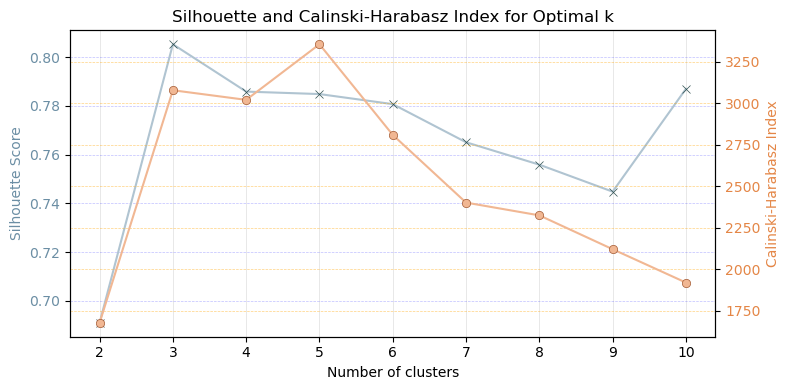

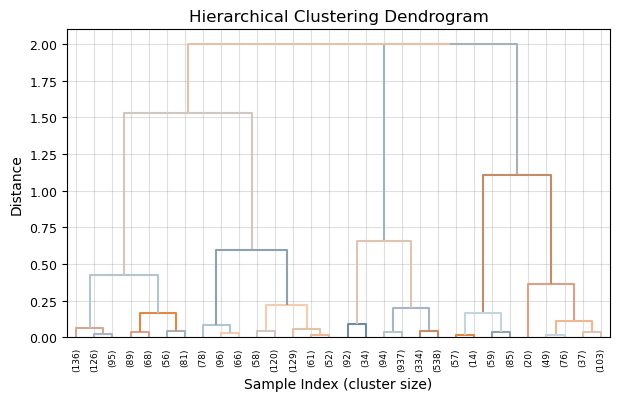

In [53]:
# Define a function to apply agglomerative clustering algorithm
def perform_agglomerative_clustering(df, k_max, affinity_type='cosine', linkage_type='complete', labels_col='ClusterLabels'):
    """
    Perform Agglomerative Clustering on the input dataframe and evaluate cluster quality.

    Args:
        df (pd.DataFrame): Input dataframe containing the features to cluster.
        k_max (int): Maximum number of clusters to evaluate.
        affinity_type (str, optional): Distance metric to use. Options are 'euclidean', 'manhattan' or
                                       'cosine'. Default value is set to 'cosine'.
        linkage_type (str, optional): Linkage criterion to use. Options are 'ward', 'complete', 'average', 
                                      or 'single'. Default value is set to 'complete'.

    Returns:
        tuple: Dictionary containing:
            - 'cluster_details': Dictionary with clustering details for each number of clusters.
            - 'silhouette_scores': List of silhouette scores for each number of clusters.
            - 'calinski_harabasz_scores': List of Calinski-Harabasz scores for each number of clusters.
            - 'feature_importance': Dictionary with feature importance for each number of clusters.
            - 'linkage_matrix': Full linkage matrix for dendrogram plotting.
        pd.DataFrame: Input dataframe with additional columns for cluster labels.
    """
    # Create a copy of the df to avoid modifying the original one
    data = df.copy()
    # Convert the whole DataFrame to a numpy array
    X_np = data.to_numpy()

    # Define range of clusters to try
    range_n_clusters = list(range(2, k_max + 1))
    cluster_details = {}
    silhouette_avg = []
    calinski_harabasz_scores = []
    centroids_feature_importance = {}

    # Time the operation by starting a timer
    start_time = datetime.now()

    # Compute the full linkage matrix for dendrogram plotting
    if linkage_type in ['ward', 'complete', 'average', 'single']:
        # Adapt metric name for scipy.spatial.distance.pdist
        linkage_affinity_type = 'cityblock' if affinity_type == 'manhattan' else affinity_type
        full_linkage_matrix = linkage(X_np, metric=linkage_affinity_type, method=linkage_type)
    else:
        full_linkage_matrix = None

    for num_clusters in range_n_clusters:
        # Apply Agglomerative Clustering
        clustering = AgglomerativeClustering(n_clusters=num_clusters, affinity=affinity_type, linkage=linkage_type)
        cluster_labels = clustering.fit_predict(X_np)

        # Store clustering details
        cluster_details[num_clusters] = {'labels': cluster_labels}

        # Assign cluster labels to the df for immediate or later use
        data[f'{labels_col}_{num_clusters}'] = cluster_labels + 1  # Adjust labels to start from 1

        # Calculate and store silhouette score
        silhouette_avg.append(silhouette_score(X_np, cluster_labels, metric=affinity_type))
        # Calculate and store Calinski-Harabasz index
        calinski_harabasz_scores.append(calinski_harabasz_score(X_np, cluster_labels))

        # Calculate centroids and feature importance via variance
        centroids = np.array([X_np[cluster_labels == i].mean(axis=0) for i in range(num_clusters)])
        variances = np.var(centroids, axis=0)
        centroids_feature_importance[num_clusters] = pd.Series(variances,
                                                               index=df.columns).sort_values(ascending=False)

    # End timer and print timing result
    end_time = datetime.now()
    elapsed_time = end_time - start_time
    print_duration(elapsed_time.total_seconds())

    return {
        'cluster_details': cluster_details,
        'silhouette_scores': silhouette_avg,
        'calinski_harabasz_scores': calinski_harabasz_scores,
        'feature_importance': centroids_feature_importance,
        'linkage_matrix': full_linkage_matrix
    }, data


# Define maximum number of clusters
k_max = 10
# Performs K-Medoids clustering for a range k from 2 to k_max
clustering_companies_results, clustering_companies_results_df = perform_agglomerative_clustering(scaled_companies_df,
                                                                                                 k_max,
                                                                                                 affinity_type='cosine')
# Plot clustering validation results
plot_silhouette_and_calinski_harabasz_scores(k_max, clustering_companies_results['silhouette_scores'],
                                             clustering_companies_results['calinski_harabasz_scores'])


# Define a function to plot the resulting dendrogram from the agglomerative process
def plot_dendrogram(linkage_matrix, truncate_mode=None, p=12):  
    """
    Plots a hierarchical clustering dendrogram.

    Args:
        linkage_matrix (numpy.ndarray): Linkage matrix containing the hierarchical clustering 
                                        encoded as a matrix.
        truncate_mode (str, optional): Truncation mode for the dendrogram. If None, the dendrogram 
                                       shows all levels of the hierarchy. Common options include 'lastp' 
                                       and 'level'.
        p (int, optional): Number of clusters to show if truncate_mode is used. Default value is 12.

    Returns:
        None
    """
    # Define color palette
    color_palette = ['#B0C4D1', '#6B8EA4', '#F1B793', '#E48646', '#C2D6DE', '#A8B5C8', '#F5CCB0', '#DAA088',
                     '#B2C6CC', '#8FA1AD', '#E0C4AF', '#C48B6B', '#D1C7C0', '#A4B3BA', '#E3C2A8', '#D4A992']
    # Define a link color function to map default colors to color_palette
    color_mapping = {}
    def link_color_func(k):
        return color_palette[k % len(color_palette)]
    # Define figure
    plt.figure(figsize=(7, 4))
    
    # Plot dendrogram with custom link color function
    dendrogram(
        linkage_matrix,
        truncate_mode=truncate_mode,
        p=p,
        show_leaf_counts=True,
        link_color_func=link_color_func
    )
    # Add title
    plt.title('Hierarchical Clustering Dendrogram')
    # Add axes labels
    plt.xlabel('Sample Index (cluster size)')
    plt.ylabel('Distance')
    # Adjust font size of axes tick labels
    plt.tick_params(axis='x', labelsize=6.5, rotation=90)
    plt.tick_params(axis='y', labelsize=9)
    # Add grid
    plt.grid(color='grey', alpha=0.25)
    # Show plot
    plt.show()


# Plot dendrogram
plot_dendrogram(clustering_companies_results['linkage_matrix'], truncate_mode='lastp', p=30)

De las gráficas resultantes de la aplicación del algoritmo aglomerativo se concluye que, tanto el coeficiente de silueta como el índice de Calinski-Harabasz, valoran muy positivamente un valor de $k$ entre 3 y 6, mientras que el dendrograma revela igualmente agrupaciones definidas y bien delimitadas para estos casos.

En esta ocasión volvemos a priorizar el índice de Calinski-Harabasz, menos sensible a los valores extremos, optando por un agrupamiento en **5 segmentos**, cifra que supone un nivel de granularidad manejable pero suficientemente diverso para el diseño de estrategias de ventas diferenciadas.

In [54]:
# Define k
k = 5
# Set cluster labels according to k and remove excess labels
scaled_labeled_companies_df = set_df_cluster_labels(clustering_companies_results_df, k)
# Restore removed columns
restored_labeled_companies_df = restore_removed_columns(scaled_labeled_companies_df, enhanced_companies_df)
# Restore unscaled values
labeled_companies_df = restore_unscaled_values(restored_labeled_companies_df, enhanced_companies_df)

<a id="6.3.2"></a> 
### 6.3.2. Evaluación del agrupamiento

Si bien, al utilizar en este caso con un grupo tan reducido de variables, la evaluación no resulta tan interesante como cuando se trabaja con una dimensionalidad mayor, si valoramos la influencia de de las variables en el agrupamiento a través de **CFI** observamos que el importe de las compras tiene un mayor peso en la calidad del _clustering_ resultante que el número de éstas.

In [55]:
# Define a function to evaluate CFI through the agglomerative algorithm
def agglomerative_clustering_feature_importance(df, k, affinity_type='cosine', linkage_type='complete',
                                                labels_col='ClusterLabels', threshold=0, pca_transform=False):
    """
    Evaluates feature importance by removing each feature, re-clustering, and comparing silhouette scores
    with the original dataset using Agglomerative Clustering. Optionally applies PCA before clustering.

    Args:
        df (DataFrame): The input data.
        k (int): Number of clusters for Agglomerative Clustering.
        affinity_type (str): Metric used to compute the linkage.
        linkage_type (str): Linkage criterion to use.
        labels_col (str): Column name for cluster labels.
        threshold (float): Minimum change in silhouette score to consider.
        pca_transform (bool): Whether to apply PCA transformation before clustering.
        desired_var_ratio (float): The cumulative variance ratio to cover with PCA components if pca_transform is True.

    Returns:
        Displays results and may return additional information based on configuration.
    """
    # Create a copy of the df to avoid modifying the original one
    X = df.copy()
    # Ensure there is no 'ClusterLabels' column in the DataFrame
    X = X.drop(columns=[labels_col], errors='ignore')
    # Preserve column names before any array conversion
    feature_names = X.columns.tolist()
    
    # Time the operation by starting a timer
    start_time = datetime.now()

    # Convert DataFrame to NumPy array for clustering algorithm
    X_np = X.to_numpy()
    
    # Perform baseline clustering with all features
    if pca_transform:
        X_transformed = obtain_pca_main_feats_and_variance_ratio(X, display_result=False, return_pca_df=True)
        X_np = X_transformed.to_numpy() 
    baseline_clustering = AgglomerativeClustering(n_clusters=k, affinity=affinity_type, linkage=linkage_type)
    baseline_labels = baseline_clustering.fit_predict(X_np)
    baseline_silhouette = silhouette_score(X_np, baseline_labels, metric=affinity_type)

    # Dictionary to store the results
    results = []

    # Iteratively remove each feature and perform clustering
    for feature_name in feature_names:
        # Drop one feature
        X_reduced = X.drop(columns=[feature_name])
        # Convert DataFrame to NumPy array for clustering algorithm
        X_np_reduced = X_reduced.to_numpy()

        # Perform clustering with reduced feature set
        if pca_transform:
            X_reduced_transformed = obtain_pca_main_feats_and_variance_ratio(X_reduced, display_result=False, return_pca_df=True)
            X_np_reduced = X_reduced_transformed.to_numpy()
        reduced_clustering = AgglomerativeClustering(n_clusters=k, affinity=affinity_type, linkage=linkage_type)
        reduced_labels = reduced_clustering.fit_predict(X_np_reduced)
        reduced_silhouette = silhouette_score(X_np_reduced, reduced_labels, metric=affinity_type)

        # Calculate change in silhouette score
        score_change = baseline_silhouette - reduced_silhouette
        if threshold is not None:  # Filter based on threshold when set
            if score_change > threshold:
                results.append({
                    "Feature": feature_name,
                    "Baseline Score": baseline_silhouette,
                    "Score Without Feature": reduced_silhouette,
                    "Score Change": score_change
                })
        else:
            results.append({
                "Feature": feature_name,
                "Baseline Score": baseline_silhouette,
                "Score Without Feature": reduced_silhouette,
                "Score Change": score_change
             })

    # Create a DataFrame from the results and sort by Score Change
    result_df = pd.DataFrame(results).round(6)
    try:
        # Sort DataFrame by Score Change, descending (to show the largest drop at the top)
        result_df = result_df.sort_values(by="Score Change", ascending=False).reset_index(drop=True)
    except KeyError:  # Re-run function without function in case no result is avobe it
        print("No results above threshold, thus it was removed.")
        agglomerative_clustering_feature_importance(df, k, labels_col='ClusterLabels', threshold=None)
        
    # End timer and print timing result
    end_time = datetime.now()
    elapsed_time = end_time - start_time
    print_duration(elapsed_time.total_seconds())

    # Temporarily change the display precision within the function
    original_format = pd.get_option('display.float_format')
    try:
        pd.set_option('display.float_format', '{:.6f}'.format)
        display(result_df)
    finally:
        pd.set_option('display.float_format', original_format)


# Evaluate CFI
agglomerative_clustering_feature_importance(scaled_labeled_companies_df, k)

The operation took 1 seconds.


,Feature,Baseline Score,Score Without Feature,Score Change
0,IMPORTE_COMPRAS,0.784822,0.000000,0.784822
1,NUM_COMPRAS,0.784822,0.328385,0.456437


<a id="6.3.3"></a> 
### 6.3.3. Análisis de los clústeres resultantes

Analizamos a continuación los clústeres formados y el perfil prototípico para cada uno de ellos. Como puede observarse:

- Aproximadamente la mitad de los clientes en este _dataset_ se concentran en un **primer clúster** caracterizado por un número moderado de compras y un importe modesto invertido en el servicio.
- Los siguientes 2 clústeres (**2 y 3**) aglutinan perfiles donde, tanto las cifras de compras como la de importe, van en progresivo crecimiento.
- En cambio, los **clústeres 4 y 5** agrupan clientela con un dispendio más elevado, pero con un número de compras más reducidos.
- Tanto en el **clúster 3 como el 5**, donde se concentran el mayor número de compras y de importe gastado respectivamente, es por ello donde coinciden los valores extremos conservados para cada una de las variables, `NUM_COMPRAS` e `IMPORTE_COMPRAS`.

Respecto a la representación gráfica de los clústeres a través de un **gráfico interactivo**, se ha optado por fijar los rangos de los ejes para evitar que su redimensión dinámica cause confusión al lector con el espacio que ocupa cada uno de los segmentos. Dicho esto, la interfaz del _widget_ permite utilizar la herramienta de aumento para explorar los detalles a conveniencia.


Customers' distribution between clusters


ClusterLabels,1,2,3,4,5
Summary,,,,,
Counts,"2,029",660,651,215,285
Distribution (%),52.84,17.19,16.95,5.60,7.42


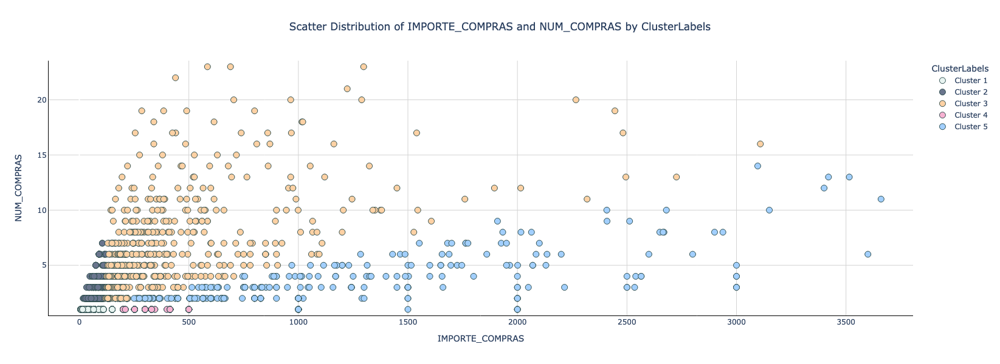

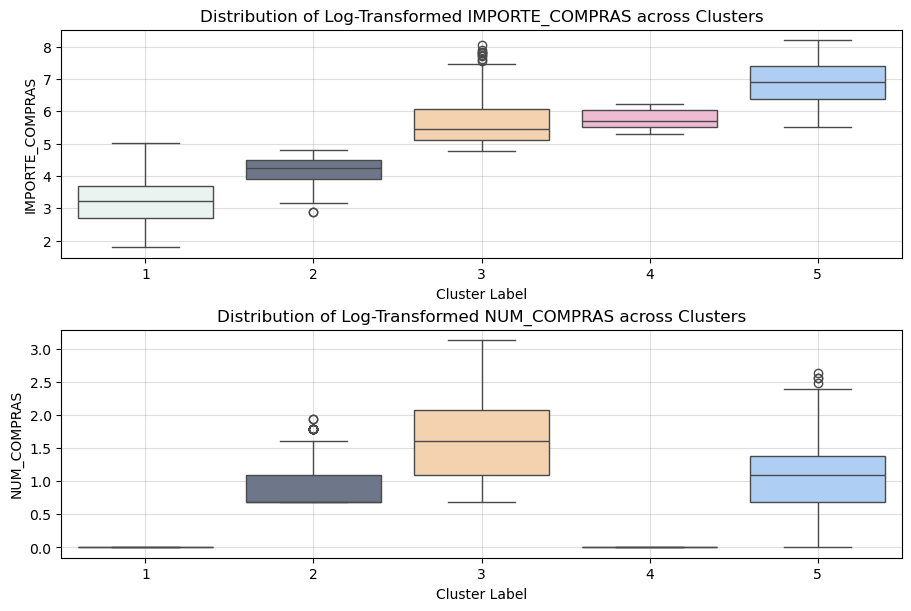


Clusters' profile


,1,2,3,4,5
ANTIGUEDAD,Más de 10 Años,Más de 10 Años,Más de 10 Años,Más de 10 Años,Más de 10 Años
AOV mean,38.39,28.62,64.10,344.07,399.59
CANAL,Directorios,Directorios,WEB,WEB,WEB
CLIENTEPORCAMPAÑAEMAIL,no,no,no,no,no
CLV mean,544.35,405.86,908.89,"4,878.44","5,665.71"
CONSUMOSTOTAL mean,1.62,3.83,32.62,288.51,593.47
DEPARTAMENTO,BOGOTA,BOGOTA,BOGOTA,BOGOTA,BOGOTA
DEPARTAMENTO_SCORE mean,-0.35,-0.22,-0.16,-0.15,-0.09
DIASCLIENTE mean,114.97,132.18,79.86,70.75,83.44
DIVERSIDAD_COMPRAS mean,1.00,1.01,1.32,1.00,1.43



Clusters' CONSUMOSTOTAL, ENGAGEMENT, IMPORTE_COMPRAS, NUM_COMPRAS comprehensive statistics


1      2        3        4         5
Variable        Statistic                                          
CONSUMOSTOTAL   min         1.00   1.00     1.00     1.00      2.00
                max       150.00  37.00 1,644.00 9,638.00 26,657.00
                mean        1.62   3.83    32.62   288.51    593.47
                median      1.00   3.00    11.00    16.00     70.00
                std         4.35   3.60    92.35 1,020.09  2,339.74
ENGAGEMENT      min         0.24   0.24     0.26     0.25      0.28
                max         3.74   2.06    23.02   127.97    288.91
                mean        0.35   0.42     1.01     4.59      8.10
                median      0.32   0.39     0.71     0.85      1.82
                std         0.14   0.17     1.34    13.73     27.04
IMPORTE_COMPRAS min         6.00  18.00   120.00   200.00    250.00
                max       150.00 123.00 3,109.00   500.00  3,660.00
                mean       38.39  70.92   373.78   344.07  1,204.59
                median     25.00  70.00   237.00   300.00  1,000.00
                std        31.63  25.84   371.58    96.42    784.03
NUM_COMPRAS     min         1.00   2.00     2.00     1.00      1.00
                max         1.00   7.00    23.00     1.00     14.00
                mean        1.00   2.59     6.19     1.00      3.46
                median      1.00   2.00     5.00     1.00      3.00
                std         0.00   0.95     4.14     0.00      2.25

In [56]:
# Display detailed profile of the clusters
display_clustering_analysis(labeled_companies_df,
                            comparison_variable_statistics=['CONSUMOSTOTAL', 'ENGAGEMENT',
                                                            'IMPORTE_COMPRAS', 'NUM_COMPRAS'])

<a id="6.4"></a> 
## 6.4. Segmentación de personas físicas

Repetimos nuevamente el proceso con el _dataset_ de personas físicas utilizando el mismo algoritmo aglomerativo con enlace completo y la métrica de afinidad basada en el coseno.

<a id="6.4.1"></a> 
### 6.4.1. Aplicación del algoritmo de agrupamiento

The operation took 5 seconds.


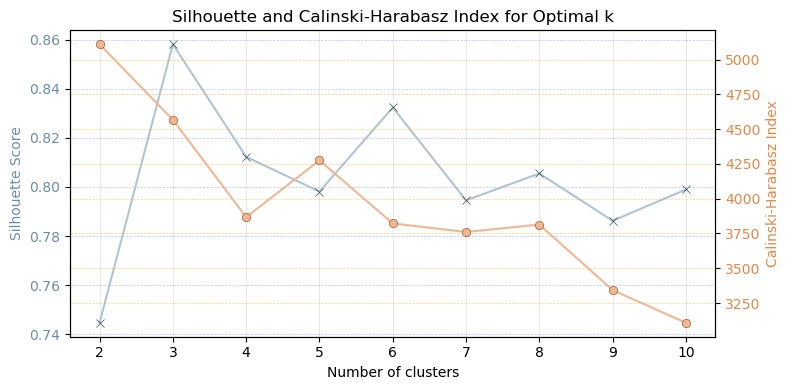

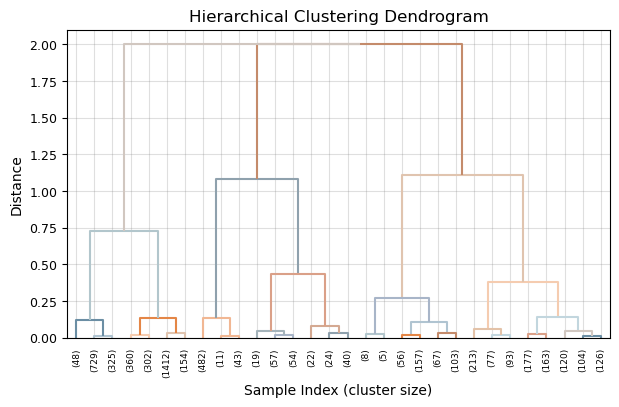

In [57]:
# Performs K-Medoids clustering for a range k from 2 to k_max
clustering_persons_results, clustering_persons_results_df = perform_agglomerative_clustering(scaled_persons_df,
                                                                                             k_max,
                                                                                             affinity_type='cosine')
# Plot clustering validation results
plot_silhouette_and_calinski_harabasz_scores(k_max, clustering_persons_results['silhouette_scores'],
                                             clustering_persons_results['calinski_harabasz_scores'])
# Plot dendrogram
plot_dendrogram(clustering_persons_results['linkage_matrix'], truncate_mode='lastp', p=30)

Como se puede observar en las gráficas, las estimaciones del coeficiente de la silueta y el índice de Calinski-Harabasz no siempre coinciden, siendo **$k=3$** el punto que ambas métricas muestran un buen resultado de manera conjunta.

In [58]:
# Define k
k = 3
# Set cluster labels according to k and remove excess labels
scaled_labeled_persons_df = set_df_cluster_labels(clustering_persons_results_df, k)
# Restore removed columns
restored_labeled_persons_df = restore_removed_columns(scaled_labeled_persons_df, enhanced_persons_df)
# Restore unscaled values
labeled_persons_df = restore_unscaled_values(restored_labeled_persons_df, enhanced_persons_df)

<a id="6.4.2"></a> 
### 6.4.2. Evaluación del agrupamiento

Respecto a la influencia de de las variables en el agrupamiento a través de **CFI**, nuevamente es el importe de las compras la variable de más peso en la calidad del _clustering_.

In [59]:
# Evaluate CFI
agglomerative_clustering_feature_importance(scaled_persons_df, k)

The operation took 1 seconds.


,Feature,Baseline Score,Score Without Feature,Score Change
0,IMPORTE_COMPRAS,0.858194,0.280130,0.578064
1,NUM_COMPRAS,0.858194,0.358494,0.499700


<a id="6.4.3"></a> 
### 6.4.3. Análisis de los clústeres resultantes

De los segmentos formados y sus correspondientes perfiles podemos extraer las siguientes conclusiones:

- También en esta ocasión el **primer clúster** aglutina la mayoría de los clientes, los cuales se caracterizan por un modesto número de compras e importe invertido en el servicio.
- Por su parte, los **clústeres 2 y 3** recogen los clientes con un mayor número de compras y un mayor importe gastado respectivamente. Cabe destacar cómo el índice de Calinski-Harabasz apuntaba a la posibilidad de agrupar la clientela en 2 clústeres, y tras diferentes pruebas se ha constatado que en ese caso los clientes alejados del grueso de las personas físicas, tanto en número como en importe de compras, quedarían aglutinados en un único clúster con valores atípicos en ambas direcciones. Mantendremos sin embargo esta división en 3 grupos, ya que permite al negocio adoptar una estrategia diferenciada para hábitos de compra nítidamente diferentes.


Customers' distribution between clusters


ClusterLabels,1,2,3
Summary,,,
Counts,"3,330","1,469",752
Distribution (%),59.99,26.46,13.55


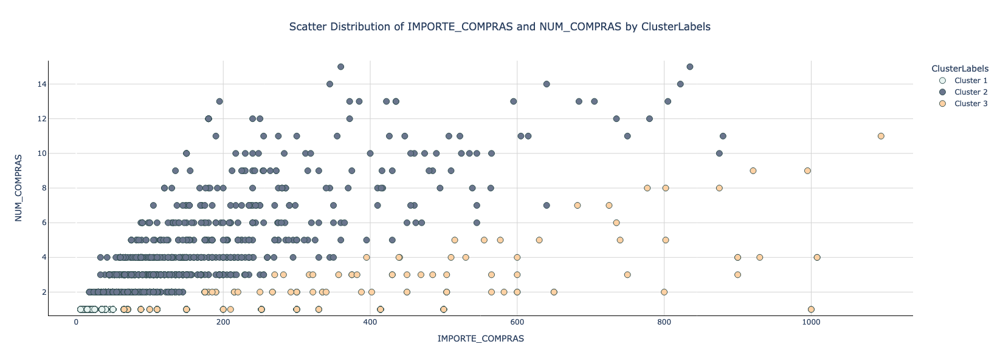

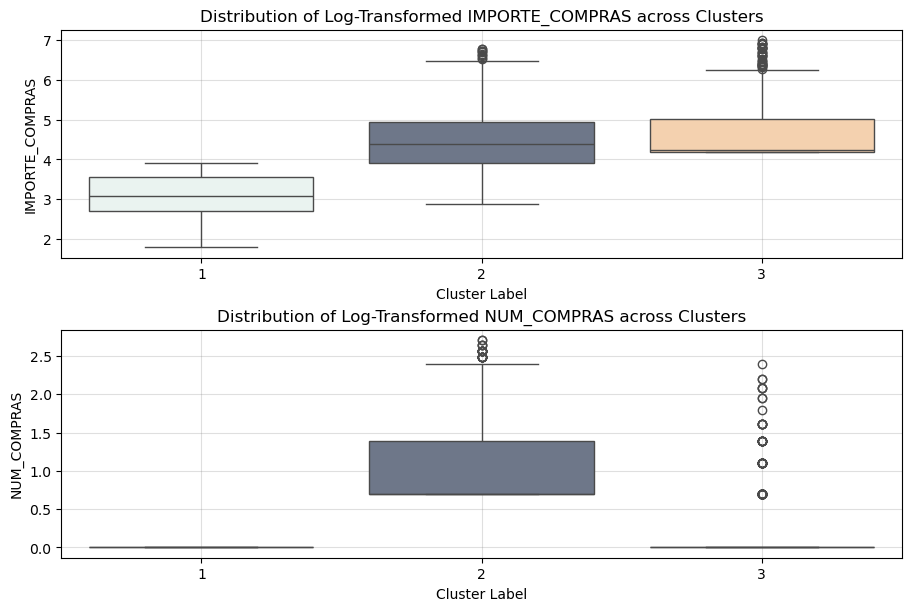


Clusters' profile


,1,2,3
ANTIGUEDAD,No aplicable,No aplicable,No aplicable
AOV mean,23.70,34.12,111.23
CANAL,Directorios,Directorios,WEB
CLIENTEPORCAMPAÑAEMAIL,no,no,no
CLV mean,336.03,483.78,"1,577.09"
CONSUMOSTOTAL mean,1.42,7.05,37.90
DEPARTAMENTO,No aplicable,No aplicable,No aplicable
DEPARTAMENTO_SCORE mean,0.18,0.18,0.18
DIASCLIENTE mean,94.57,98.76,90.50
DIVERSIDAD_COMPRAS mean,1.00,1.03,1.08



Clusters' CONSUMOSTOTAL, EMPRESASCONRELACION, ENGAGEMENT, IMPORTE_COMPRAS, NUM_COMPRAS comprehensive statistics


1      2         3
Variable            Statistic                        
CONSUMOSTOTAL       min         1.00   1.00      1.00
                    max       126.00 232.00 11,429.00
                    mean        1.42   7.05     37.90
                    median      1.00   3.00      1.00
                    std         2.71  12.09    436.48
EMPRESASCONRELACION min         0.00   0.00      0.00
                    max        81.00  90.00     71.00
                    mean        1.59   2.57      1.93
                    median      0.00   0.00      0.00
                    std         4.50   5.77      5.45
ENGAGEMENT          min         0.24   0.25      0.24
                    max         2.92   4.86    139.95
                    mean        0.34   0.51      0.91
                    median      0.33   0.41      0.36
                    std         0.10   0.32      5.43
IMPORTE_COMPRAS     min         6.00  18.00     65.00
                    max        50.00 880.00  1,095.00
                    mean       23.70 118.07    148.52
                    median     22.00  80.00     70.00
                    std        10.37 109.78    170.97
NUM_COMPRAS         min         1.00   2.00      1.00
                    max         1.00  15.00     11.00
                    mean        1.00   3.37      1.26
                    median      1.00   2.00      1.00
                    std         0.00   2.30      0.98

In [60]:
# Define a function to restore the  dropped category to OHE encoded email domain variable
def expand_email_domain_encodings(ohe_df, dropped_category_name):
    """
    Expand OHE email domain columns by adding a column for the dropped category.

    Args:
        ohe_df (pd.DataFrame): Input dataframe with one-hot encoded email domain columns.
        dropped_category_name (str): Name of the dropped category to be added back as a column.

    Returns:
        pd.DataFrame: Modified dataframe with the added column for the dropped category.
    """
    # Create a copy of the df to avoid modifying the original one
    df = ohe_df.copy()
    
    # Base variable for email domain
    base_var = 'TIPODOMINIOEMAIL'
    # Construct the new column name for the dropped category
    new_column_name = f"{base_var}_{dropped_category_name}"
    
    # Identify all existing OHE columns for this base variable
    related_columns = [col for col in df.columns if col.startswith(base_var + "_")]
    
    # Only proceed if there are related columns in the DataFrame
    if related_columns:
        # Sort related columns to ensure the new column is inserted in the correct position
        related_columns.sort()
        
        # Determine the index to insert the new column before other related variables
        insert_position = df.columns.get_loc(related_columns[0]) if related_columns else len(df.columns)
        
        # Calculate the value for the new column: 1 if all related OHE columns are 0, else 0
        # Sum across rows for all related columns, if the sum is 0, then this row should be 1 for the new column
        df[new_column_name] = (df[related_columns].sum(axis=1) == 0).astype(int)
        
        # Reorder columns to move the new column to the intended position
        # Get a list of all columns, remove the new column, and insert it at the correct position
        new_columns = list(df.columns)
        new_columns.remove(new_column_name)
        new_columns.insert(insert_position, new_column_name)
        df = df[new_columns]

    return df


# Restore dropped first categoriy from OHE email domain related variables
labeled_persons_email_domain_restored_df = expand_email_domain_encodings(labeled_persons_df, first_category_email_domain)
# Display detailed profile of the clusters
display_clustering_analysis(labeled_persons_email_domain_restored_df,
                            comparison_variable_statistics=['CONSUMOSTOTAL', 'EMPRESASCONRELACION', 'ENGAGEMENT',
                                                            'IMPORTE_COMPRAS', 'NUM_COMPRAS'])

<a id="6.5"></a> 
## 6.5. Conclusiones de la segunda fase del agrupamiento

A diferencia del proceso seguido durante la primera fase, durante la cual la segmentación era dominada por el perfil empresarial del cliente, la estrategia seguida en este **segundo paso se basa en los atributos relacionados con el número e importe de las compras**. Además, la segmentación ha sido llevada a cabo de manera separada para las sociedades y empresarios por un lado, y las personas físicas por el otro, planteamiento que ha permitido poner en evidencia comportamientos diferenciados para uno y otro grupo, pero también algunos puntos en común:

- Cada uno de los perfiles definidos para ambos grupos (sociedades y empresarios, y personas físicas por otro lado) muestran un **incremento del importe de compras para cada segmento unido a un incremento de la cantidad de consumos**.
- Sin embargo, el **aumento del importe no siempre viene de la mano de un aumento del número de compras**, y en ambos casos encontramos segmentos de clientes con un elevado número de compras y un importe total de compras más contenido, y a la inversa.
- Por otra parte, el número total de **consumos sí parece crecer con el importe de las compras**, al igual que el resto de las métricas de interacción con el servicio que hemos sintetizado a través de la variable `ENGAGEMENT`.
- Respecto al interrogante planteado durante el apartado de «Incorporación de nueva información al clúster de personas físicas», y en el que nos preguntábamos si una **persona física con un amplio número de relaciones con otras compañías** podría condicionar la pertenencia a un clúster con un mayor importe de compras, los resultados no son concluyentes pero parecen negarlo. Tal vez optar por una mayor granularidad en el número de agrupaciones podría aportar una perspectiva diferente, pero ese análisis exhaustivo excede el objetivo de este cuaderno.
- Se confirma en ambos casos la **regla 80/20** que mencionábamos al inicio de este cuaderno, y que apuntaba a que la mayoría de los clientes llevan a cabo pequeñas compras de bajo importe, mientras que el mayor valor económico proviene de un grupo reducido de usuarios con un nivel de compras y gasto por encima de lo habitual.

<a id="6.6"></a> 
## 6.6. Etiquetado conjunto de clientes

Antes de exportar el fichero de clientes etiquetado, necesitamos combinar el _dataset_ de sociedades y empresarios con el de personas físicas, así como recuperar los _outliers_ descartados. Además, reordenaremos las etiquetas de acuerdo con el importe de compras promedio de cada clúster.

In [61]:
# Create a copy of the df to avoid modifying the original one
labeled_df = customers_df.copy()
# Add new column for labels
labeled_df['SEGMENTO'] = None
# Assign persons_df labels
matching_indexes_persons = labeled_df.index.intersection(labeled_persons_df.index)
labeled_df.loc[matching_indexes_persons,
               'SEGMENTO'] = labeled_persons_df.loc[matching_indexes_persons,
                                                    'ClusterLabels']
# Assign companies_df labels
matching_indexes_companies = labeled_df.index.intersection(labeled_companies_df.index)
labeled_df.loc[matching_indexes_companies,
               'SEGMENTO'] = (labeled_companies_df.loc[matching_indexes_companies,
                                                      'ClusterLabels'] +
                              labeled_persons_df['ClusterLabels'].nunique())
# Assign new label to outliers
matching_indexes_outliers = labeled_df.index.intersection(outlier_customers_indices)
labeled_df.loc[matching_indexes_outliers,
               'SEGMENTO'] = (labeled_persons_df['ClusterLabels'].nunique() +
                              labeled_companies_df['ClusterLabels'].nunique() + 1)

# Relabel clusters sorted according to total spending
relabeled_df = relabel_df_sorted(labeled_df, labels_col='SEGMENTO')

print(f"Total unlabeled customers: {relabeled_df['SEGMENTO'].isna().sum()}")

Total unlabeled customers: 0


Se muestra a continuación la **versión final del perfil prototípico correspondiente a cada clúster**. Esta categorización nos permite por primera vez observar la disparidad de cifras correspondiente a los clientes _outlier_ descartados del proceso de segmentación, y a los que el negocio debería asignar un tratamiento comercial específico acorde a sus necesidades de gran consumo, encaminado a conservar e incluso a hacer crecer su ya de por sí elevada contribución económica.

Cabe destacar que el grupo de los **valores extremos** engloba tanto sociedades y empresarios como personas físicas (si bien, existe un número mayor de sociedades que de cualquier otra forma jurídica, y así se refleja en su perfil prototípico), y merecerían ser objeto de un estudio más profundo que excede el ámbito de este cuaderno.

SEGMENTO,1,2,3,4,5,6,7,8,9
Summary,,,,,,,,,
Counts,"3,330","2,029",660,"1,469",752,215,651,285,121
Distribution (%),35.01,21.33,6.94,15.44,7.91,2.26,6.84,3.00,1.27


,1,2,3,4,5,6,7,8,9
ANTIGUEDAD,No aplicable,Más de 10 Años,Más de 10 Años,No aplicable,No aplicable,Más de 10 Años,Más de 10 Años,Más de 10 Años,Más de 10 Años
CANAL,Directorios,Directorios,Directorios,Directorios,WEB,WEB,WEB,WEB,WEB
CLIENTEPORCAMPAÑAEMAIL,no,no,no,no,no,no,no,no,no
CONSUMOSTOTAL mean,1.42,1.62,3.83,7.05,37.90,288.51,32.62,593.47,"5,493.93"
DEPARTAMENTO,No aplicable,BOGOTA,BOGOTA,No aplicable,No aplicable,BOGOTA,BOGOTA,BOGOTA,BOGOTA
DIASCLIENTE mean,94.57,114.97,132.17,98.76,90.49,70.74,79.87,83.43,48.51
EMPRESASUNICAS_CONSULT mean,1.15,1.28,2.13,3.26,26.70,245.70,14.34,347.26,"2,370.16"
ESTADO,VIVA,ACTIVA,ACTIVA,VIVA,VIVA,ACTIVA,ACTIVA,ACTIVA,ACTIVA
FORMAJURIDICA,PERSONA FISICA,SOCIEDAD,SOCIEDAD,PERSONA FISICA,PERSONA FISICA,SOCIEDAD,SOCIEDAD,SOCIEDAD,SOCIEDAD
IMPORTE_COMPRAS mean,23.70,38.39,70.92,118.07,148.52,344.07,373.78,"1,204.59","3,722.84"


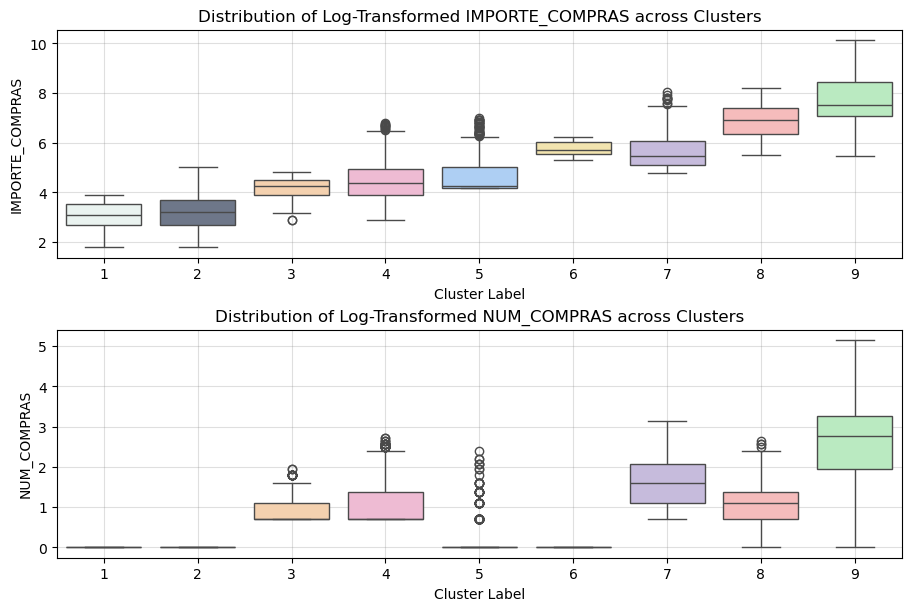

1      2      3      4        5      6        7  \
Variable        Statistic                                                       
IMPORTE_COMPRAS min        6.00   6.00  18.00  18.00    65.00 200.00   120.00   
                max       50.00 150.00 123.00 880.00 1,095.00 500.00 3,109.00   
                mean      23.70  38.39  70.92 118.07   148.52 344.07   373.78   
                median    22.00  25.00  70.00  80.00    70.00 300.00   237.00   
                std       10.37  31.63  25.84 109.78   170.97  96.42   371.58   
NUM_COMPRAS     min        1.00   1.00   2.00   2.00     1.00   1.00     2.00   
                max        1.00   1.00   7.00  15.00    11.00   1.00    23.00   
                mean       1.00   1.00   2.59   3.37     1.26   1.00     6.19   
                median     1.00   1.00   2.00   2.00     1.00   1.00     5.00   
                std        0.00   0.00   0.95   2.30     0.98   0.00     4.14   

                                 8         9  
Variable        Statistic                     
IMPORTE_COMPRAS min         250.00    240.00  
                max       3,660.00 25,200.00  
                mean      1,204.59  3,722.84  
                median    1,000.00  1,870.00  
                std         784.03  4,221.73  
NUM_COMPRAS     min           1.00      1.00  
                max          14.00    173.00  
                mean          3.46     19.27  
                median        3.00     16.00  
                std           2.25     21.03

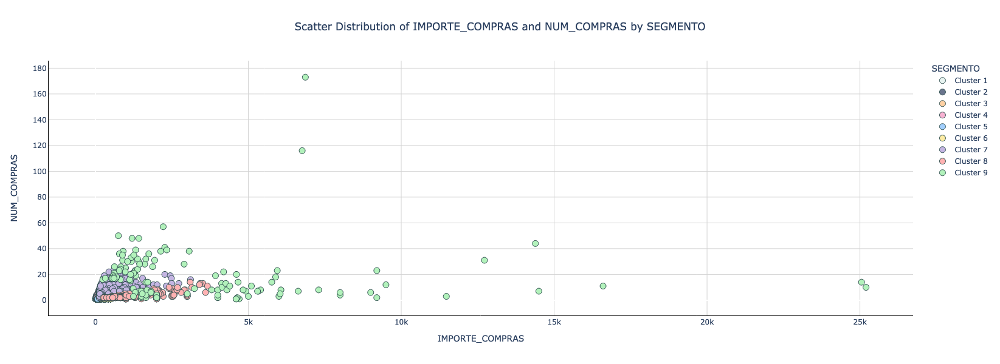

In [62]:
# Define a function to obtain the profile of the final version of clusters
def profile_final_clusters(df, numerical_statistic='mean', labels_col='ClusterLabels'):
    """
    Calculate and summarize the distribution of attributes within clusters.

    Args:
        df (pd.DataFrame): Input dataframe.
        numerical_statistic (str, optional): Statistic to calculate for non-boolean variables.
                                             Options are 'mean' or 'median'. Default value is set to 'mean'.
        labels_col (str, optional): Name of the column containing cluster labels. Default values is set to
                                    'ClusterLabels'.

    Returns:
        pd.DataFrame: Dataframe summarizing the distribution of attributes within clusters.
    """
    df = df.copy()

    # Determine categorical and numerical variables
    categorical_vars = [col for col in df.columns if df[col].dtype == 'object' and col != labels_col]
    numerical_vars = [col for col in df.columns if df[col].dtype in ['int64', 'float64'] and col != labels_col]

    # Initialize a dictionary to store results
    result_data = {}

    # Calculate distribution for categorical variables
    for var in categorical_vars:
        for category in df[var].unique():
            if pd.notna(category):
                distribution = df[df[var] == category][labels_col].value_counts(normalize=True).reindex(
                    range(1, df[labels_col].max() + 1), fill_value=0) * 100
                presence = (df[df[var] == category][labels_col].value_counts(normalize=False).reindex(
                    range(1, df[labels_col].max() + 1), fill_value=0) /
                            df[labels_col].value_counts().reindex(range(1, df[labels_col].max() + 1), fill_value=0) * 100)
                result_data[(f'{var}_{category}', 'Distribution')] = distribution
                result_data[(f'{var}_{category}', 'Presence')] = presence

    # Calculate mean or median for numerical variables
    for var in numerical_vars:
        if numerical_statistic == 'mean':
            mean_values = df.groupby(labels_col)[var].mean().reindex(range(1, df[labels_col].max() + 1), fill_value=0)
            result_data[(var, numerical_statistic.title())] = mean_values
        elif numerical_statistic == 'median':
            median_values = df.groupby(labels_col)[var].median().reindex(range(1, df[labels_col].max() + 1), fill_value=0)
            result_data[(var, numerical_statistic.title())] = median_values

    # Calculate Total Distribution
    total_distribution = df[labels_col].value_counts(normalize=True).reindex(range(1, df[labels_col].max() + 1), fill_value=0) * 100
    result_data[('TOTAL DISTRIBUTION', 'Distribution')] = total_distribution

    # Create a DataFrame from the dictionary
    result_df = pd.DataFrame(result_data)

    # Fill NaN values with 0 and transpose the DataFrame
    result_df = result_df.fillna(0)
    transposed_result_df = result_df.T

    # Convert the transposed DataFrame back to a DataFrame with proper MultiIndex
    transposed_result_df = pd.DataFrame(transposed_result_df.values, index=pd.MultiIndex.from_tuples(transposed_result_df.index),
                                        columns=transposed_result_df.columns)
    transposed_result_df.index.names = ['Variable', 'Statistic']

    # Sort the DataFrame by its index (variable names) in ascending order
    sorted_transposed_df = transposed_result_df.sort_index()

    # Initialize an empty dictionary to store the results for each category
    results = {}

    # Determine categories from variable names that include 'Presence' or 'Distribution'
    categories = set(idx[0].split('_')[0] for idx in sorted_transposed_df.index if 'Presence' in idx[1] or 'Distribution' in idx[1])

    # Loop through each category to determine the most prevalent item based on 'Presence'
    for category in categories:
        category_data = {}
        category_rows = sorted_transposed_df.index.get_level_values(0).str.startswith(f'{category}_') & (sorted_transposed_df.index.get_level_values(1) == 'Presence')
        category_df = sorted_transposed_df.loc[category_rows]

        if not category_df.empty:
            for cluster in category_df.columns:
                max_index = category_df[cluster].idxmax()
                if category_df[cluster].sum() == 0:
                    most_prevalent_case = "No aplicable"
                else:
                    most_prevalent_case = max_index[0].split('_')[-1] if max_index else None
                category_data[cluster] = most_prevalent_case
            results[category] = category_data

    # Directly transfer their mean or median values for numerical variables
    for var in numerical_vars:
        results[var + f' {numerical_statistic}'] = sorted_transposed_df.loc[(var, numerical_statistic.title())]

    # Create a DataFrame from the dictionary and ensure it's properly transposed
    simplified_df = pd.DataFrame(results)
    transposed_df = simplified_df.T

    # Sort the DataFrame by its index (variable names) in ascending order
    final_sorted_transposed_df = transposed_df.sort_index()

    # Display result
    with pd.option_context('display.max_rows', None):
        display(final_sorted_transposed_df)


# Obtain profile and general overview for final clusters
summarize_cluster_distribution(relabeled_df, labels_col='SEGMENTO')
profile_final_clusters(relabeled_df, labels_col='SEGMENTO')
plot_cluster_log_transformed_sales_and_spending_distribution(relabeled_df, labels_col='SEGMENTO')
compare_clusters_variables(relabeled_df, labels_col='SEGMENTO')
plot_scatter_distribution_interactive(relabeled_df, x_feat='IMPORTE_COMPRAS',
                                      y_feat='NUM_COMPRAS', c_feat='SEGMENTO',
                                      fixed_axes_ranges=False)

En este caso, el **gráfico interactivo** está configurado para que el rango de sus ejes se redimensione dinámicamente de acuerdo con la selección del usuario, opción preferible en este caso debido a la distorsión en la escala que provocan los _outliers_ recuperados.

Como se puede observar, se ha optado también por **reordenar los clústeres** de acuerdo con el importe total promedio gastado, alternándose así los perfiles de sociedades y empresarios con los de las personas físicas. Si bien ha quedado evidenciado durante la primera fase de la segmentación que ambos grupos presentan características distintivas en su perfil que pueden hacer preferible un tratamiento separado de ambos bloques, el negocio puede también optar por dirigir políticas de _up-selling_ en función del único criterio del monto obviando otras diferencias. Dicho esto, el perfil prototípico generado distingue claramente unos de otros, con lo cual se deja en manos del equipo estratégico y comercial de la empresa el enfoque a escoger.

Si revisamos los **valores promediados de los atributos**, tanto sociedades como personas físicas ofrecen perfiles de gasto elevado que no necesariamente van de la mano de un elevado número de compras, pero sí de consumos según los datos, posiblemente por optar por la adquisición de un plan o bono que procura un mayor acceso en una única adquisición a mayor precio. En cuanto al tamaño de la empresa, es en los clústeres superiores donde se refleja su efecto, pasando de micro, a pequeña y luego a mediana, y reservando para el grupo de los _outliers_ las grandes empresas, con un volumen de consumo y gasto acorde a su volumen de negocio. Como anticipábamos al inicio del cuaderno, el mayor nivel de beneficios proviene de los clústeres más pequeños. Respecto a atributos como los referentes al sector o el departamento, simplemente reflejan los valores mayoritarios del conjunto de datos.

Por otro lado, y como ya ha sido remarcado, las diferencias de importe del clúster correspondiente a los **valores extremos** evidencian la necesidad de un tratamiento particularizado, especialmente al tener en cuenta que se trata de los clientes que generan un mayor volumen de ingresos. Cabe destacar así mismo en referencia al segundo clúster con mayor importe de compras (segmento 8) que, aunque si atendemos al número de compras, éste se encuentra alejado del clúster de _outliers_ y en línea con los demás segmentos, si fijamos nuestra atención en otras características, como el importe gastado o el total de consultas realizadas, está también a gran distancia de los segmentos inferiores y podrían ser aglutinados con el segmento 9 para un estudio particularizado centrado en los valores extremos. Y nos hace pensar así mismo en la posibilidad de bajar el umbral de _outliers_ y aumentar el número de clientes descartados para concentrar nuestra atención en el resto, con valores más próximos entre ellos.

## 6.7. Exportación del fichero de clientes etiquetado

Exportamos el fichero original de clients con un nuevo campo para las etiquetas.

In [63]:
# Restore the 'ID' column using the index information and reset index
restored_id_relabeled_df = relabeled_df.reset_index()
restored_id_relabeled_df = restored_id_relabeled_df.rename(columns={'index': 'ID'})

# Export df to TXT following the encoding and format from the original file
restored_id_relabeled_df.to_csv('CLIENTES_ETIQUETADOS.txt', encoding='ISO-8859-1', sep='|', index=False)

<a id="7"></a>
***
# 7. Predicción de transferencia de clientes entre clústeres

Una vez llevada a cabo la segmentación de los clientes, debemos entender que el etiquetado responde a una foto fija del momento en que se obtuvieron los datos. Sin embargo, el **comportamiento de los clientes es dinámico** y conviene que los comerciales responsables de la **fidelización** del cliente permanezcan atentos a las oportunidades de transferencia de clústeres por los siguientes motivos:

- Para detectar los clientes que podrían ascender a un clúster con un mayor tique de compra, y que deberían ser trasladados a un equipo comercial de _up-selling_.
- Para detectar los clientes que podrían ascender a un clúster con un mayor número de compra, y que deberían ser trasladados a un equipo comercial de _cross-selling_.
- Para detectar qué clientes se encuentran en una zona en peligro de _downgrade_, y que podrían acabar reduciendo su número compras o adquiriendo productos de menor costo, y sobre los cuáles deberían aplicarse técnicas de retención.

Para predecir estos posibles movimientos emplearemos **3 estrategias** diferenciadas que pasamos a exponer a continuación. Estos 3 enfoques serán aplicados separadamente a los grupos de sociedades y empresarios por un lado, y a los de personas físicas por el otro, resultado de la primera fase del proceso de segmentación. Tal como quedó resaltado durante la primera fase de la segmentación, ambos grupos presentan características distintivas relativas fundamentalmente a su perfil empresarial. Dado que la mayor parte de las estrategias expuestas se aplicarán teniendo en cuenta principalmente datos de consumo y gasto, parece prudente considerar que las características intrínsecas de uno y otro grupo pueden desembocar en comportamientos diferentes y por tanto, no pueden ser obviadas y resulta conveniente mantener las particiones separadas. Dicho esto, la ya expuesta complejidad del perfil que se oculta tras la tipología de las personas físicas sugiere un interesante análisis de la posibilidad de transferencia entre clústeres de uno y otro segmento que, por razones de tiempo y espacio, excede las limitaciones de este estudio.

<a id="7.1"></a> 
## 7.1. Predicción basada en distancia y similitud

En primer lugar utilizaremos una **combinación entre la distancia euclidiana** $\left(d(\mathbf{x}, \mathbf{y}) = \sqrt{\sum_{i=1}^n (x_i - y_i)^2}\right)$ **y la similitud del coseno** $\left(\text{cosine\_similarity}(\mathbf{x}, \mathbf{y}) = \frac{\mathbf{x} \cdot \mathbf{y}}{\|\mathbf{x}\| \|\mathbf{y}\|}\right)$, calculando en primer lugar qué clientes se encuentran más próximos al medoide de un segmento contiguo que al suyo propio. La elección como punto de referencia del medoide, o punto dentro de un clúster con la menor distancia total a todos los demás puntos del clúster, viene determinada por la falta de normalidad en la distribución de los datos, siendo el medoide una mejor representación central al resultar menos sensible a los valores atípicos que la media. Por otra parte, a través de la similitud del coseno tratamos de entender cómo de similar es un cliente al perfil promedio de un clúster diferente del propio.

El objetivo de la combinación de ambas técnicas es el de capturar, por una parte, la **proximidad absoluta** de los clientes, y por otro, la similitud en la dirección de sus características que puede detectar clientes con **patrones de comportamiento similares**, a pesar de que las magnitudes de los atributos de uno y otro sean diferentes.

En ambos casos aplicaremos un estandarizado robusto con objeto de mitigar la influencia sobre el cálculo de las distancias por parte de los valores extremos que han sido conservados.

<a id="7.1.1"></a> 
### 7.1.1. Transferencia de sociedades y empresarios

En primer lugar, comenzaremos **calculando la proximidad** conforme a las indicaciones ya expuestas. Previamente, aplicaremos un escalado robusto a los datos para minimizar el impacto de los valores extremos. Para el cálculo de la distancia, utilizaremos únicamente las variables escogidas durante la segunda fase de la segmentación y que son responsables de los clústeres detectados: `IMPORTE_COMPRAS` y `NUM_COMPRAS`.

In [64]:
# Define function to compute cluster proximity based on distance
def compute_cluster_proximity(df, profiling_statistic='medoid', affinity='euclidean', scale=None, labels_col='ClusterLabels'):
    """
    Compute profile vectors for each cluster using medoids and measure proximity of each row to these vectors using direct distance metrics.
    
    Args:
        df (DataFrame): The input DataFrame containing a labels column and other numerical features.
        profiling_statistic (str): The statistic to use for profiling ('mean', 'median', or 'medoid').
        affinity (str): The metric to use for calculating proximity ('cosine', 'euclidean', 'manhattan').
        labels_col (str): Column that contains the labels for each group. Default value is set to 'ClusterLabels'.
    
    Returns:
        DataFrame: The original DataFrame augmented with proximity measures to each cluster profile.
                   All distances are normalized to a range from 0 (closer) to 1 (farthest).
    """
    # Create a copy of the df to avoid modifying the original one
    proximity_df = df.copy()

    # Validate inputs
    if profiling_statistic not in ['mean', 'median', 'medoid']:
        raise ValueError("profiling_statistic must be 'mean' (mean-based centroid), 'median' (median centroid), " +\
                         "or 'medoid' (medoid)")
    if affinity not in ['cosine', 'euclidean', 'manhattan']:
        raise ValueError("affinity must be 'cosine', 'euclidean' or 'manhattan'")

    # Time the operation by starting a timer
    start_time = datetime.now()
    
    # Exclude 'ClusterLabels' from feature set
    feature_columns = proximity_df.columns.difference([labels_col])
    
    # Compute the profiling statistic
    cluster_profiles = {}
    for label, group in proximity_df.groupby(labels_col):
        if profiling_statistic == 'medoid':
            # Compute pairwise distances within the group
            distances = pairwise_distances(group[feature_columns], metric=affinity)
            # Find the index of the medoid (minimum sum of distances)
            medoid_index = np.argmin(distances.sum(axis=0))
            cluster_profiles[label] = group.iloc[medoid_index][feature_columns].values
        elif profiling_statistic == 'mean':
            cluster_profiles[label] = group[feature_columns].mean().values
        elif profiling_statistic == 'median':
            cluster_profiles[label] = group[feature_columns].median().values
    
    # Define a mapping of affinity names to actual functions
    distance_functions = {
        'cosine': lambda x, y: cosine_distances([x], [y])[0][0],
        'euclidean': distance.euclidean,
        'manhattan': distance.cityblock
    }
    # Measure proximity of each row to each cluster profile
    for label, profile_vector in cluster_profiles.items():
        column_name = f'proximity_{int(label)}'
        distance_func = distance_functions[affinity]
        proximity_df[column_name] = proximity_df[feature_columns].apply(
            lambda row: distance_func(row, profile_vector), axis=1
        )

    if scale is not None:
        proximity_cols = [col for col in proximity_df.columns if col.startswith('proximity_')]
        # Assuming scale_data is defined to handle scaling
        proximity_df[proximity_cols] = scale_data(proximity_df[proximity_cols], scaler_type=scale)

    # End timer and print timing result
    end_time = datetime.now()
    elapsed_time = end_time - start_time
    print_duration(elapsed_time.total_seconds())

    return proximity_df


# Select relevant features
distance_relevant_feats = ['ClusterLabels', 'IMPORTE_COMPRAS', 'NUM_COMPRAS']
# Filter relevant features
labeled_companies_selected_feats_df = labeled_companies_df[distance_relevant_feats]
# Scale data
scaled_labeled_companies_selected_feats_df = scale_data(labeled_companies_selected_feats_df,
                                                    'robust', excepted='ClusterLabels')
# Compute medoid proximity
proximity_companies_df = compute_cluster_proximity(scaled_labeled_companies_selected_feats_df,
                                                   profiling_statistic='medoid',
                                                   affinity='euclidean', scale='norm')

The operation took 0 seconds.


Seguidamente, y para el **cálculo de la similitud**, ampliaremos el número de variables relevantes, para lo cual recuperaremos los atributos creados durante la fase de _feature engineering_ junto a las variables presentes en el _dataset_ original referidas a ventas y consumos. Sin embargo, y para evitar que la presencia de ruido pueda afectar a los cálculos, descartaremos en primer lugar aquellas variables que presentaban un alto grado de colinealidad de acuerdo con el análisis realizado anteriormente. Por otra parte, y dado que el objetivo final es aumentar el importe gastado en el servicio, utilizaremos un modelo de regresión lineal para valorar cuáles son las características con un mayor impacto sobre la variable dependiente `IMPORTE_COMPRAS`.

Debido a la asimetría y falta de normalidad presente del _dataset_, utilizaremos como modelo de regresión lineal HuberRegressor, caracterizado por su robustez. Sin embargo el hecho de que el modelo no se ajuste a través de mínimos cuadrados ordinarios (o «OLS», por las siglas de la expresión inglesa _Ordinary Least Squares_), sino minimizando una función de pérdida robusta, dificulta la obtención de errores estándard y del $p$-valor. Por ello, y con objeto de determinar la relevancia estadística de los coeficientes, deberemos prestar atención a la magnitud de los coeficientes y al impacto en el rendimiento del modelo permutando los valores de los atributos. Además, a través de la técnica de _bootstrapping_ muestrearemos repetidamente los datos con reemplazo para ajustar el modelo a cada muestra y examinar así la distribución de los coeficientes.

In [65]:
# Define a function to compute log-likelihood
def compute_log_likelihood(huber, X, y):
    """
    Computes the log-likelihood for a HuberRegressor model.
    
    Args:
        huber (HuberRegressor): Fitted HuberRegressor model.
        X (array-like): Input features for prediction.
        y (array-like): True target values.
    
    Returns:
        float: The log-likelihood of the model given the data.
    """
    # Compute residuals as differences between true values and predicted values
    residuals = y - huber.predict(X)
    # Compute the Residual Sum of Squares by summing the squares of the residuals
    RSS = np.sum(residuals**2)
    # Estimate the variance of the errors through the RSS and the number of observations and predictors
    sigma_hat_squared = RSS / (len(y) - len(huber.coef_) - 1)
    # Compute the log-likelihood based on the normal distribution of the residuals
    log_likelihood = -0.5 * len(y) * np.log(2 * np.pi * sigma_hat_squared) - (RSS / (2 * sigma_hat_squared))
    return log_likelihood


# Define a function to estimate the HuberRegressor coefficients
def bootstrap_coefs(huber, X, y, n_bootstrap=1000):
    """
    Estimates the coefficients of a HuberRegressor model using bootstrap resampling.
    
    Args:
        huber (HuberRegressor): Huber regressor model to be fitted.
        X (array-like): Input features for fitting the model.
        y (array-like): True target values.
        n_bootstrap (int, optional): Number of bootstrap samples. Default values is set to 1000.
    
    Returns:
        np.ndarray: Array of bootstrapped coefficients of shape (n_bootstrap, n_features).
    """
    # Init array to store the coefficients from each bootstrap sample
    coefs = np.zeros((n_bootstrap, X.shape[1]))
    # Perform bootstrap resampling n_bootstrap times
    for i in range(n_bootstrap):
        # Resample the data with replacement to create a bootstrap sample
        X_resampled, y_resampled = resample(X, y, random_state=RANDOM_SEED + i)
        # Fit the Huber regressor model on the resampled data
        huber.fit(X_resampled, y_resampled)
        # Store the fitted coefs in the coefs array
        coefs[i, :] = huber.coef_
    return coefs


# Define a function to apply HuberRegressor and evaluate the resulting model
def compute_huber_regression(X, y, transformation_type=None, scaler_type='robust',
                             display_intermediate_cross_val_scores=True):
    """
    Computes HuberRegression with optional data transformation and scaling, and evaluates the model.
    
    Args:
        X (DataFrame): Input features.
        y (Series or array-like): Target values.
        transformation_type (str, optional): Type of transformation to apply to the data.
                                             Default value is set to None.
        scaler_type (str, optional): Type of scaler to be used. Default value is set to 'robust'.
        display_intermediate_cross_val_scores (bool, optional): Option to display intermediate cross-validation scores.
                                                                Default value is set to True.
    
    Returns:
        None
    """
    # Time the operation by starting a timer
    start_time = datetime.now()
    # Transform data
    if transformation_type is not None:
        X = transform_data(X, transformation_type=transformation_type)
    # Scale data
    X_scaled = scale_data(X, scaler_type=scaler_type)
    # Define cross-validation scheme
    kf = KFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
    # Initialize Huber Regressor
    huber = HuberRegressor()
    # Cross-validate model
    scores = cross_val_score(huber, X_scaled, y, cv=kf, scoring=make_scorer(mean_squared_error))
    r2_scores = cross_val_score(huber, X_scaled, y, cv=kf, scoring='r2')
    # Fit the model on the full dataset
    huber.fit(X_scaled, y)
    # Calculate AIC
    log_likelihood = compute_log_likelihood(huber, X_scaled, y)
    k = len(huber.coef_) + 1  # Number of parameters (including the intercept)
    AIC = 2 * k - 2 * log_likelihood
    # Extract and display feature importances
    feature_importances = huber.coef_
    # Bootstrap to estimate coefficient confidence intervals
    bootstrapped_coefs = bootstrap_coefs(huber, X_scaled, y)
    coef_means = np.mean(bootstrapped_coefs, axis=0)
    coef_se = np.std(bootstrapped_coefs, axis=0)
    z_scores = coef_means / coef_se
    p_values = 2 * (1 - norm.cdf(np.abs(z_scores)))  # Two-tailed test
    
    # End timer and print timing result
    end_time = datetime.now()
    elapsed_time = end_time - start_time
    print_duration(elapsed_time.total_seconds())
    
    # Output results
    if display_intermediate_cross_val_scores:
        print("Cross-validated MSE scores:", [np.round(score, 2) for score in scores])
    print("Average MSE:", np.round(np.mean(scores), 2))
    print("AIC:", np.round(AIC, 2))
    if display_intermediate_cross_val_scores:
        print("Cross-validated R-squared scores:", [np.round(r2_score, 2) for r2_score in r2_scores])
    print("Average R-squared:", np.round(np.mean(r2_scores), 2))

    # Create a DataFrame for feature importances
    feature_importances_df = pd.DataFrame({
        'Feature': X.columns,
        'Coefficient': feature_importances,
        'Std_Error': coef_se,
        'Z_Score': z_scores,
        'P_Value': p_values
    })
    # Sort the DataFrame by the absolute value of coefficients in descending order
    feature_importances_df['Abs_Coefficient'] = feature_importances_df['Coefficient'].abs()
    feature_importances_df = feature_importances_df.sort_values(by='Abs_Coefficient', ascending=False).drop(columns=['Abs_Coefficient'])
    print("Feature importances (coefficients):")
    display(feature_importances_df)


# Select sales and consults-related feats
consumptions_and_sales_feats = ['CLV', 'CONSUMOSTOTAL', 'DIVERSIDAD_COMPRAS', 'DIVERSIDAD_ESTADOS_CONSULT',
                                'DIVERSIDAD_SECTORES_CONSULT',  'DIVERSIDAD_TAMAÑOS_CONSULT', 'EMPRESASUNICAS_CONSULT',
                                'ENGAGEMENT', 'IMPORTE_COMPRAS', 'NUM_COMPRAS', 'RECENCIA_CONSULT',
                                'TENDENCIA_FRECUENCIA_CONSULT', 'TENDENCIA_FRECUENCIA_VENTAS']
# Filter relevant feats
enhanced_companies_selected_feats_df = enhanced_companies_df[consumptions_and_sales_feats]
# Compute robust linear regression model
compute_huber_regression(enhanced_companies_selected_feats_df.drop(columns=['IMPORTE_COMPRAS']),
                         enhanced_companies_selected_feats_df['IMPORTE_COMPRAS'])

The operation took 1 minute and 2 seconds.
Cross-validated MSE scores: [168633.45, 84087.5, 117173.93, 102888.34, 58463.01]
Average MSE: 106249.25
AIC: 54846.62
Cross-validated R-squared scores: [0.14, 0.69, 0.58, 0.65, 0.74]
Average R-squared: 0.56
Feature importances (coefficients):


,Feature,Coefficient,Std_Error,Z_Score,P_Value
2,DIVERSIDAD_COMPRAS,111.77,51.96,2.01,0.04
8,NUM_COMPRAS,79.92,4.49,17.50,0.00
0,CLV,44.94,1.80,24.77,0.00
4,DIVERSIDAD_SECTORES_CONSULT,39.20,11.45,2.63,0.01
5,DIVERSIDAD_TAMAÑOS_CONSULT,-33.82,13.31,-1.56,0.12
9,RECENCIA_CONSULT,-2.70,2.15,0.04,0.97
7,ENGAGEMENT,2.54,2.33,1.34,0.18
1,CONSUMOSTOTAL,2.01,3.12,1.06,0.29
11,TENDENCIA_FRECUENCIA_VENTAS,1.89,8.07,0.15,0.88
6,EMPRESASUNICAS_CONSULT,-1.14,1.14,-1.44,0.15


Del análisis llevado a cabo, podemos concluir que entre los atributos seleccionados, aquellos significativos para la predicción del importe total de compras son `CLV`, `DIVERSIDAD_COMPRAS`, `DIVERSIDAD_SECTORES_CONSULT` y `NUM_COMPRAS`. Por ello, limitaremos la definición del perfil a estas variables para determinar la similitud a través del coseno.

Antes de llevar a cabo los cálculos, procederemos a normalizar los datos con objeto de asegurar que la similitud del coseno mide el ángulo entre vectores y no se ve influenciada por las magnitudes.

In [66]:
# Define function to compute cluster similarity
def compute_cluster_similarity(df, profiling_statistic='mean', affinity='cosine', labels_col='ClusterLabels'):
    """
    Compute profile vectors for each cluster and measure similarity of each row to these vectors using transformed distance metrics.

    Args:
        df (DataFrame): The input DataFrame containing a 'ClusterLabels' column.
        profiling_statistic (str): The statistic to use for profiling ('mean' or 'median').
        affinity (str): The metric to use for calculating similarity ('cosine', 'euclidean', 'manhattan').

    Returns:
        DataFrame: The original DataFrame augmented with similarity measures to each cluster profile.
                   Similarities are normalized to a range from 0 (least) to 1 (greatest).
    """
    # Create a copy of the df to avoid modifying the original one
    similarity_df = df.copy()

    # Validate inputs
    if profiling_statistic not in ['mean', 'median']:
        raise ValueError("profiling_statistic must be 'mean' or 'median'")
    if affinity not in ['cosine', 'euclidean', 'manhattan']:
        raise ValueError("affinity must be 'cosine', 'euclidean' or 'manhattan'")

    # Time the operation by starting a timer
    start_time = datetime.now()
    
    # Exclude 'ClusterLabels' from feature set
    feature_columns = similarity_df.columns.difference([labels_col])

    # Group by 'ClusterLabels' and compute the profiling statistic
    if profiling_statistic == 'mean':
        cluster_profiles = similarity_df.groupby(labels_col)[feature_columns].mean()
    elif profiling_statistic == 'median':
        cluster_profiles = similarity_df.groupby(labels_col)[feature_columns].median()

    # Store each cluster's profile vector in a dictionary
    cluster_profile_vectors_dict = {label: profile_vector.values for label, profile_vector in cluster_profiles.iterrows()}

    # Measure similarity of each row to each cluster profile
    for label, profile_vector in cluster_profile_vectors_dict.items():
        column_name = f'similarity_{int(label)}'  # Defining the column name here for use in normalization
        if affinity == 'cosine':
            similarity_df[column_name] = similarity_df[feature_columns].apply(lambda row: cosine_similarity([row], [profile_vector])[0][0], axis=1)
        elif affinity == 'euclidean':
            similarity_df[column_name] = similarity_df[feature_columns].apply(lambda row: 1 / (1 + distance.euclidean(row, profile_vector)), axis=1)
        elif affinity == 'manhattan':
            similarity_df[column_name] = similarity_df[feature_columns].apply(lambda row: 1 / (1 + distance.cityblock(row, profile_vector)), axis=1)

    # End timer and print timing result
    end_time = datetime.now()
    elapsed_time = end_time - start_time
    print_duration(elapsed_time.total_seconds())

    return similarity_df


# Select relevant features
similarity_relevant_feats = ['ClusterLabels', 'CLV', 'DIVERSIDAD_COMPRAS',
                             'DIVERSIDAD_SECTORES_CONSULT', 'IMPORTE_COMPRAS', 'NUM_COMPRAS']
# Filter relevant features
labeled_companies_selected_feats_df = labeled_companies_df[similarity_relevant_feats]
# Transform data with a scaler robust to outliers
scaled_labeled_companies_selected_feats_df = scale_data(labeled_companies_selected_feats_df,
                                                        'robust', excepted='ClusterLabels')
# Normalize to calculate cosine similarity
normalized_labeled_companies_selected_feats_df = scale_data(scaled_labeled_companies_selected_feats_df,
                                                            'norm', excepted='ClusterLabels')
# Compute similarity
similarity_companies_df = compute_cluster_similarity(normalized_labeled_companies_selected_feats_df,
                                                     profiling_statistic='median', affinity='cosine')

The operation took 2 seconds.


Finalmente, combinaremos ambas métricas para determinar la posibilidad de transferencia de clientes, identificando aquellos clientes que cumplen 2 criterios:

1. Están **más próximos al medoide de otro clúster** que al medoide de su propio clúster.
2. Presentan una **similitud** con el perfil promedio de ese otro clúster **superior a 0,8**; umbral éste que indica un caso de alta similitud.

Representaremos gráficamente la posibilidad de transferencia entre clústeres para facilitar la comprensión de los resultados.

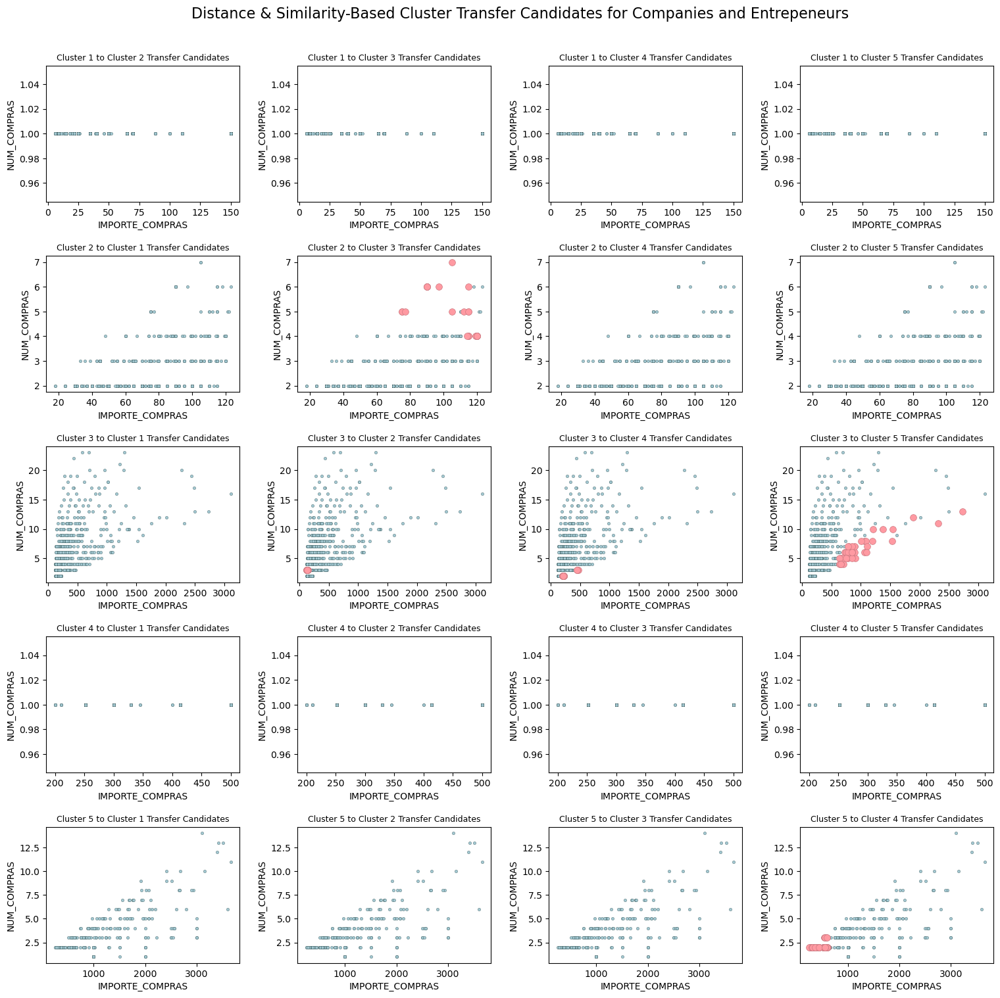

In [67]:
# Define a function to predict cluster transfers based on proximity and similarity results
def predict_cluster_transfers(proximity_df, similarity_df, similarity_threshold=0.8, proximity_only=False,
                              labels_col='ClusterLabels', transfer_col='ClusterTransfer'):
    """
    Predict cluster transfers based on proximity and similarity results.

    Args:
        proximity_df (DataFrame): The input DataFrame containing proximity measures and cluster labels.
        similarity_df (DataFrame): The input DataFrame containing similarity measures for clusters.
        similarity_threshold (float): The similarity threshold for considering a cluster transfer.
                                      Default value is set to 0.8.
        proximity_only (bool): If True, only proximity is considered for cluster transfers, ignoring similarity.
                               Default value is set to False.
        labels_col (str): The column name for the cluster labels. Default value is set to 'ClusterLabels'.

    Returns:
        DataFrame: A DataFrame with predicted cluster transfers, including the original columns from `proximity_df` 
                   but without the proximity columns. The new cluster labels are added in a column specified by `labels_col`.
    """
    # Create a copy of the df to avoid modifying the original one
    cluster_transfers_df = proximity_df.copy()

    # Extract the number of proximity and transfer columns
    proximity_columns = [col for col in proximity_df.columns if 'proximity_' in col]
    n_proximity = len(proximity_columns)

    # Drop the proximity columns from the new dataframe
    cluster_transfers_df = cluster_transfers_df.drop(columns=proximity_columns)
    # Initialize a new column for the cluster label transfers
    cluster_transfers_df[transfer_col] = np.nan  # Initialize with null values
    
    # Iterate over each row in both dataframes using DataFrame index directly
    for idx in cluster_transfers_df.index:
        # Get the row data using loc for both dataframes
        prox_row = proximity_df.loc[idx]
        sim_row = similarity_df.loc[idx]

        # Get the cluster label for the current row, ensure it's an integer
        cluster_label = int(prox_row[labels_col])
        
        # Initialize variables to find the closest cluster
        min_distance = float('inf')
        closest_cluster = cluster_label

        # Find the closest cluster based on proximity, including the customer's own cluster
        for i in range(1, n_proximity + 1):
            if prox_row['proximity_' + str(i)] < min_distance:
                min_distance = prox_row['proximity_' + str(i)]
                closest_cluster = i

        # Check if closest cluster meets similarity threshold if not proximity only
        if proximity_only or sim_row['similarity_' + str(closest_cluster)] >= similarity_threshold:
            cluster_transfers_df.at[idx, transfer_col] = closest_cluster
        else:
            # If no cluster meets the condition, assign the own cluster label
            cluster_transfers_df.at[idx, transfer_col] = cluster_label

    # Cast predicted labels to integer type
    cluster_transfers_df[transfer_col] = cluster_transfers_df[transfer_col].astype(int)

    return cluster_transfers_df


# Find closest cluster's medoid/centroid and most similar cluster
companies_cluster_transfer_distance_and_similarity_df = predict_cluster_transfers(proximity_companies_df,
                                                                                  similarity_companies_df)


# Define a function to plot cluster transfer
def plot_cluster_transfer_scatter(df, x_feat='IMPORTE_COMPRAS', y_feat='NUM_COMPRAS', labels_col='ClusterLabels',
                                  transfer_col='ClusterTransfer', subdued_tone='#A2C7D1', colorful_tone='#FF9AA2',
                                  title_pre=' ', title_post=' '):
    """
    Plots a grid of scatter plots with different cluster labels as rows and target transfer clusters as columns.
    Customers that are candidates for transfer to other clusters are highlighted by increased size and redish hue.

    Args:
        df (pd.DataFrame): The DataFrame containing the data.
        x_feat (str): X-axis feature.
        y_feat (str): Y-axis feature.
    """
    # Extract cluster labels and sort them
    cluster_labels = np.sort(df[labels_col].unique())
    num_clusters = len(cluster_labels)
    
    # Adjust the figure width dynamically based on the number of columns
    base_fig_width = 15
    fig_width = base_fig_width if num_clusters - 1 >= 4 else base_fig_width * (num_clusters - 1) / 4
    fig_height = 3 * num_clusters
    
    fig = plt.figure(figsize=(fig_width, fig_height))

    # Loop through each cluster and subplot
    for idx, cluster in enumerate(cluster_labels):
        gs = gridspec.GridSpecFromSubplotSpec(1, num_clusters-1, subplot_spec=gridspec.GridSpec(num_clusters, 1)[idx])
        cluster_data = df[df[labels_col] == cluster]

        # We adjust the column index for subplots to skip same-cluster plots
        for jdx, dist_idx in enumerate(cluster_labels):
            if cluster == dist_idx:
                continue  # Skip plotting the same cluster transfer
            
            # Adjust subplot index to skip the diagonal
            subplot_index = jdx if jdx < cluster else jdx - 1
            
            ax = fig.add_subplot(gs[0, subplot_index])
            
            # Select data for this subplot: Cluster 'cluster' transferring to Cluster 'dist_idx'
            transfer_data = cluster_data[cluster_data[transfer_col] == dist_idx]

            # Set sizes and colors: Highlighted if transferring to this cluster
            subdued_tone = subdued_tone
            colorful_tone = colorful_tone
            sizes = np.where(cluster_data[transfer_col] == dist_idx, 50, 10)
            colors = np.where(cluster_data[transfer_col] == dist_idx, colorful_tone, subdued_tone)

            # Scatter plot for all points in the cluster
            ax.scatter(cluster_data[x_feat], cluster_data[y_feat], color=subdued_tone,
                       s=10, alpha=1, edgecolor='DarkSlateGray', linewidths=0.25)
            # Highlight scatter for those transferring to the target cluster
            ax.scatter(transfer_data[x_feat], transfer_data[y_feat], color=colorful_tone,
                       s=50, alpha=1, edgecolor='#CC7A82', linewidths=0.5)

            ax.set_title(f'Cluster {cluster} to Cluster {dist_idx} Transfer Candidates', fontsize=9)
            ax.set_xlabel(x_feat)
            ax.set_ylabel(y_feat)

    # Set the superior title with consistent font size
    plt.suptitle(title_pre + ' Cluster Transfer Candidates ' + title_post, fontsize=16,
                 horizontalalignment='center', x=0.5, y=1.02)
    
    # Adjust layout and spacing dynamically
    top_space = 0.96 if num_clusters > 4 else 0.96 - 0.02 * (4 - (num_clusters - 1))
    fig.tight_layout(rect=[0, 0, 1, top_space])  # Adjust the rect parameter to add more space for the suptitle
    plt.subplots_adjust(left=0.02, right=0.98, top=top_space, bottom=0.05, wspace=0.3, hspace=0.4)
    
    plt.show()


# Restore unscaled values
unscaled_companies_cluster_transfer_distance_and_similarity_df = restore_unscaled_values(
                                                                     companies_cluster_transfer_distance_and_similarity_df,
                                                                     labeled_companies_df)
# Plot possible clusters transfer
plot_cluster_transfer_scatter(unscaled_companies_cluster_transfer_distance_and_similarity_df,
                              title_pre='Distance & Similarity-Based', title_post='for Companies and Entrepeneurs')

<a id="7.1.2"></a> 
### 7.1.2. Transferencia de personas físicas

Repetimos el proceso seguido con sociedades y empresarios, ahora con las personas físicas.

The operation took 0 seconds.
The operation took 2 seconds.


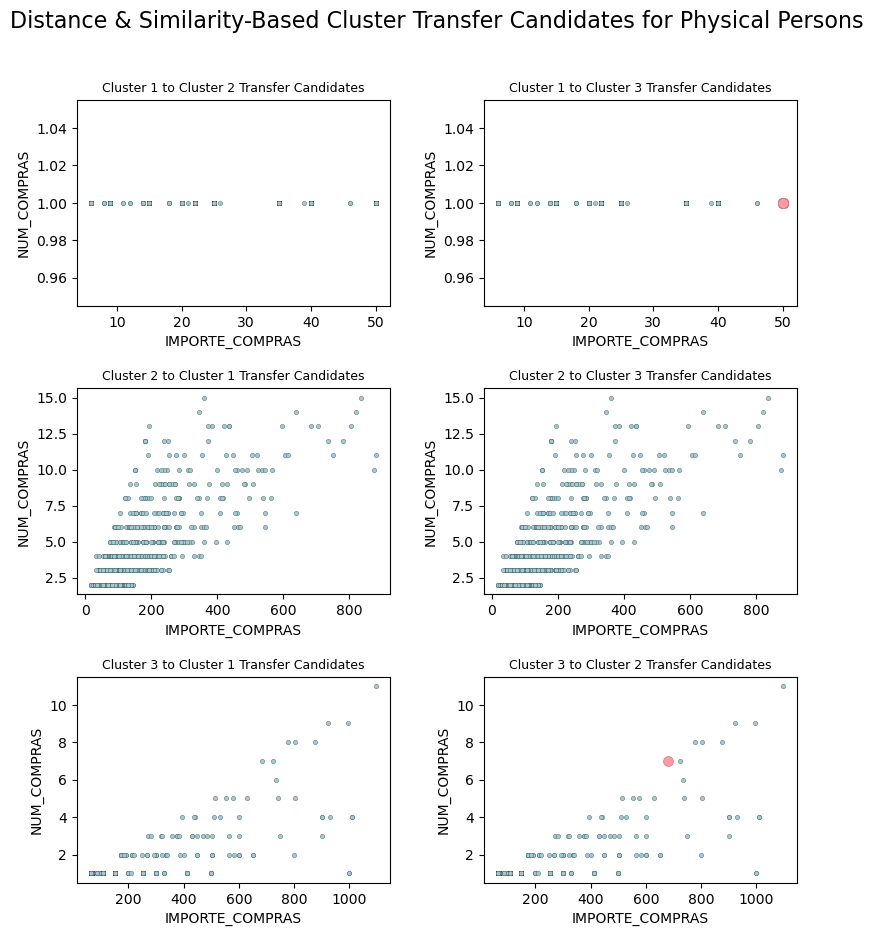

In [68]:
# Filter relevant features
labeled_persons_selected_feats_df = labeled_persons_df[distance_relevant_feats]
# Scale data
scaled_labeled_persons_selected_feats_df = scale_data(labeled_persons_selected_feats_df,
                                                      'robust', excepted='ClusterLabels')
# Compute medoid proximity
proximity_persons_df = compute_cluster_proximity(scaled_labeled_persons_selected_feats_df,
                                                 profiling_statistic='medoid',
                                                 affinity='euclidean', scale='norm')

# Filter relevant features
labeled_persons_selected_feats_df = labeled_persons_df[similarity_relevant_feats]
# Transform data with a scaler robust to outliers
scaled_labeled_persons_selected_feats_df = scale_data(labeled_persons_selected_feats_df,
                                                      'robust', excepted='ClusterLabels')
# Normalize to calculate cosine similarity
normalized_labeled_persons_selected_feats_df = scale_data(scaled_labeled_persons_selected_feats_df,
                                                          'norm', excepted='ClusterLabels')
# Compute similarity
similarity_persons_df = compute_cluster_similarity(normalized_labeled_persons_selected_feats_df,
                                                   profiling_statistic='median', affinity='cosine')

# Find closest cluster's medoid/centroid and most similar cluster
persons_cluster_transfer_distance_and_similarity_df = predict_cluster_transfers(proximity_persons_df,
                                                                                similarity_persons_df)

# Restore unscaled values
unscaled_persons_cluster_transfer_distance_and_similarity_df = restore_unscaled_values(
                                                                   persons_cluster_transfer_distance_and_similarity_df,
                                                                   labeled_persons_df)
# Plot possible clusters transfer
plot_cluster_transfer_scatter(unscaled_persons_cluster_transfer_distance_and_similarity_df,
                              title_pre='Distance & Similarity-Based', title_post='for Physical Persons')

<a id="7.1.3"></a> 
### 7.1.3. Conclusiones de la predicción de transferencia basada en distancia y similitud

Respecto al caso de las **sociedades y empresarios**, podemos ver que la posibilidad de transferencia se concentran en zonas limítrofes entre los siguientes pares de clústeres:

- **Clústeres 2 y 3**: Donde un grupo numeroso de clientes del segmento 2 podría ser transferido a un clúster de mayor gasto, por lo que debería ser transferido al equipo comercial de _up-selling_. Además, el clúster 3 aglutina el número de consumidores con un mayor volumen de compra, con lo que un equipo comercial de _cross-selling_ podría también sacar el debido provecho de esta oportunidad. El algoritmo ha detectado también un grupo muy reducido de clientes que podría hacer el paso inverso, desde el grupo 3 al 2, y que podría ser estimulado a través de políticas de fidelización para no perderlos.
- **Clústeres 3 y 4**: Nuevamente se trata de un grupo reducido que podría ser transferido a un clúster de mayor importe promedio. Si bien el número de compras medio del segmento 4 es inferior al del 3, no debería verse como una amenaza en este caso, puesto que proviene de la región del segmento 3 con menor volumen de compra.
- **Clústeres 3 y 5**: Los candidatos son un grupo numeroso que podrían incrementar su importe de compras con las adecuadas políticas de _up-selling_. Si bien es cierto que el grupo 5 tiene un número de compras promediado por debajo del grupo 3, el trasvase no supone una amenaza al concentrarse los candidatos en un región con un número de compras contenido.
- **Clústeres 4 y 5**: En este caso vemos una posibilidad de _downgrade_, ya que supondría una transferencia a un segmento de menor importe promedio y de menor número de compras, y que deberá ser vigilado de cerca con una estrategia de fidelización adecuada.

En cuanto a la posibilidad de transferencia entre los segmentos de **personas físicas**, las probabilidades son más limitadas:

- **Clústeres 1 y 3**: Coincidente con la zona colindante entre ambos segmentos y en la que se dan la mano usuarios con un bajo número de compras pero un alto dispendio, que podrían ser transferidos a un equipo de _up-selling_ para aumentar el tique de compra.
- **Clústeres 2 y 3**: Donde un reducido grupo podría ser transferido del segmento 3 al 2, lo que si bien parecer un _downgrade_ si pensamos en el importe promedio, no lo es en lo que se refiere al número de compras, por lo que podría ser aprovechado convenientemente por un equipo comercial de _cross-selling_.

<a id="7.2"></a> 
## 7.2. Predicción basada en clasificación multinomial

El segundo de los enfoques de predicción de transferencia entre clústeres se basa en el entrenamiento de un modelo predictivo multinomial capaz de clasificar los clientes con sus etiquetas. Un modelo bien ajustado, de acuerdo con las características del cliente, lo encuadrará dentro de uno de los segmentos y, en un porcentaje de casos, la etiqueta predicha no se corresponderá con la real. Si bien esta incongruencia entre predicción y realidad debería valorarse como un error del modelo, en nuestro caso apunta a que los atributos y hábitos del cliente lo convierten un posible candidato a una transferencia de segmento.

Tras sucesivas pruebas, tanto con un modelo de regresión logística multinomial con regularización Ridge como con una _Feedforward Neural Network_ sencilla, nos decantamos por el uso de un **perceptrón multicapa** o MLP (por las siglas en inglés de la expresión _MultiLayer Perceptron_) con un par de capas ocultas de 64 unidades capaces de aprender patrones más complejos. La red realiza así una combinación lineal donde cada neurona calcula una suma ponderada de sus entradas ($z_j = \sum_{i} w_{ji} x_i + b_j$); dicha suma ponderada pasa a través de una función de activación que introduce no linealidad ($a_j = \phi(z_j)$); y, al final, se obtiene una capa de salida tras aplicar estas operaciones a través de las diferentes capas de la red. Si bien esta clase de red neuronal es comúnmente usada con conjuntos de datos de mayor volumen, el objetivo es el de aprovechar sus capacidades de poner en relación un grupo amplio de características utilizando el total de variables del _dataset_, incluídos los nuevos atributos empleados durante el proceso de _feature engineering_ (con la excepción hecha de los atributos en que se concentraba la colinealidad).

El potencial de esta estrategia conlleva consigo el riesgo de añadir ruido al conjunto de datos que desemboque en un sobreajuste del modelo, razón por la cual hemos implementado diferentes técnicas para evitarlo, tales como:

- Validación cruzada, para poner a prueba el modelo con diferentes subconjuntos extraídos de los datos.
- Detención temprana o _early stopping_, con objeto de detener el entrenamiento del modelo cuando su desempeño deja de mejorar tras un cierto número de épocas.
- Monitorización del desempeño del modelo, evaluando de manera contínua la pérdida y  precisión en los datos de validación, con objeto de garantizar mejoras reales en el modelo resultante.

Por otro lado, y con la intención de contrarrestar el desbalanceo entre clientes pertenecientes a cada clase, hemos optado por:

- Emplear una técnica de _over-sampling_ a través del módulo SMOTE, que produce muestras sintéticas de las clases minoritarias en un intento por equilibrar el conjunto de datos.
- Utilizar la versión estratificada de la validación cruzada, StratifiedKFold, para garantizar una representación equilibrada de las muestras con que se entrena el modelo.

El modelo incluye además el escalado habitual de los datos para evitar que la escala original de los datos provoque que algunos de los atributos contribuyan en mayor medida que otros al entrenamiento.

<a id="7.2.1"></a> 
### 7.2.1. Transferencia de sociedades y empresarios

Comenzaremos iniciando el proceso con el grupo de sociedades y empresarios producto de la primera fase del proceso de segmentación.

24/24 [==============================] - 0s 620us/step - loss: 0.6175 - accuracy: 0.9453
Average Test Accuracy: 94.11%
The operation took 26 seconds.
120/120 [==============================] - 0s 434us/step
Original vs New classification report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      2029
           2       0.98      0.95      0.97       660
           3       0.95      0.98      0.96       651
           4       0.98      0.99      0.98       215
           5       0.99      0.98      0.98       285

    accuracy                           0.98      3840
   macro avg       0.98      0.98      0.98      3840
weighted avg       0.98      0.98      0.98      3840



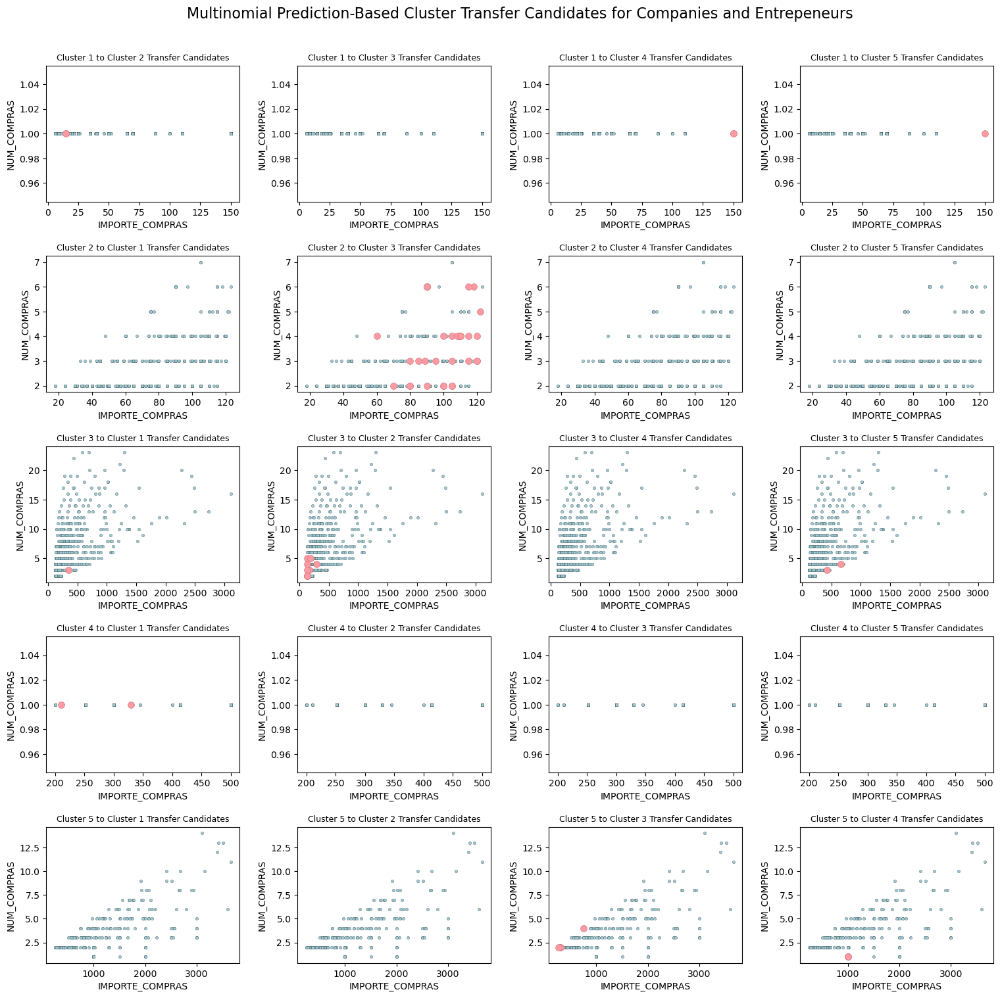

In [69]:
# Create a copy of the df to avoid modifying the original one
companies_cluster_transfer_multinomial_prediction_df = labeled_companies_df.copy()
# Reduce collinearity
companies_cluster_transfer_multinomial_prediction_df = companies_cluster_transfer_multinomial_prediction_df.drop(
                                                           columns=['AOV', 'DIVERSIDAD_EMPRESAS_CONSULT', 'FRECUENCIA_CONSULT'])

# Select relevant features including cluster labels
X = companies_cluster_transfer_multinomial_prediction_df.drop('ClusterLabels', axis=1).values
y = companies_cluster_transfer_multinomial_prediction_df['ClusterLabels'].values - 1  # Ensure labels start at 0


# Define a function to build a MLP model and evaluate it
def build_and_evaluate_mlp(X, y):
    """
    Build and evaluate a Multilayer Perceptron (MLP) model using cross-validation.

    Args:
        X (array-like, shape (n_samples, n_features)): Feature matrix.
        y (array-like, shape (n_samples,)): Target vector.

    Returns:
        model (keras.models.Sequential): Trained MLP model.
        scaler (sklearn.preprocessing.StandardScaler): Scaler fitted on the training data.
    """
    # Time the operation by starting a timer
    start_time = datetime.now()
    
    # Initialize SMOTE and StandardScaler
    smote = SMOTE(random_state=RANDOM_SEED)
    scaler = StandardScaler()
    
    # Initialize Stratified K-Fold
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
    
    accuracies = []
    
    for train_index, test_index in skf.split(X, y):
        # Split data
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
    
        # Balance the training data using SMOTE
        X_resampled, y_resampled = smote.fit_resample(X_train, y_train)
    
        # Normalize data
        X_resampled = scaler.fit_transform(X_resampled)
        X_test = scaler.transform(X_test)
    
        # Convert labels to one-hot encoding
        y_resampled = to_categorical(y_resampled)
        y_test = to_categorical(y_test)
    
        # Build the model
        model = Sequential([
            Dense(64, input_dim=X_resampled.shape[1], activation='relu'),
            Dense(64, activation='relu'),
            Dense(y_resampled.shape[1], activation='softmax')  # Output layer
        ])
    
        # Compile the model
        model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    
        # Set up EarlyStopping
        early_stopping = EarlyStopping(monitor='val_loss', patience=5)
    
        # Train the model
        history = model.fit(X_resampled, y_resampled, epochs=50, validation_split=0.1,
                            callbacks=[early_stopping], verbose=0)  # Verbosity level to suppress training messages
    
        # Evaluate the model
        scores = model.evaluate(X_test, y_test)
        accuracies.append(scores[1])
    
    # Calculate the average accuracy
    average_accuracy = np.mean(accuracies)
    print(f"Average Test Accuracy: {average_accuracy*100:.2f}%")

    # End timer and print timing result
    end_time = datetime.now()
    elapsed_time = end_time - start_time
    print_duration(elapsed_time.total_seconds())
    
    return model, scaler


# Build and evaluate MLP model
mlp_model, scaler = build_and_evaluate_mlp(X, y)

# Use the model for full dataset predictions (using the last trained model for demonstration)
full_data_predictions = mlp_model.predict(scaler.transform(X))
predicted_clusters = np.argmax(full_data_predictions, axis=1) + 1  # Start labels from 1

# Add predictions back to the dataframe
companies_cluster_transfer_multinomial_prediction_df['ClusterTransfer'] = predicted_clusters

# Evaluate the new labels
print("Original vs New classification report:")
print(classification_report(companies_cluster_transfer_multinomial_prediction_df['ClusterLabels'],
                            companies_cluster_transfer_multinomial_prediction_df['ClusterTransfer']))

# Plot cluster transfer
plot_cluster_transfer_scatter(companies_cluster_transfer_multinomial_prediction_df,
                              title_pre='Multinomial Prediction-Based', title_post='for Companies and Entrepeneurs')

<a id="7.2.2"></a> 
### 7.2.2. Transferencia de personas físicas

A continuación aplicaremos el proceso al subconjunto de personas físicas, para las cuáles debemos recordar que añadimos un nuevo par de atributos durante el proceso de _feature engineering_ a partir de los cargos ostentados por el cliente en diversas empresas y el dominio del correo electrónico con que se registró en el servicio, y que si bien no resultaron significativos durante la primera segmentación, en ellos la red neuronal podría encontrar patrones de interés.

35/35 [==============================] - 0s 581us/step - loss: 0.0215 - accuracy: 0.9946
Average Test Accuracy: 99.73%
The operation took 38 seconds.
174/174 [==============================] - 0s 420us/step
Original vs New classification report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      3330
           2       1.00      1.00      1.00      1469
           3       1.00      0.99      1.00       752

    accuracy                           1.00      5551
   macro avg       1.00      1.00      1.00      5551
weighted avg       1.00      1.00      1.00      5551



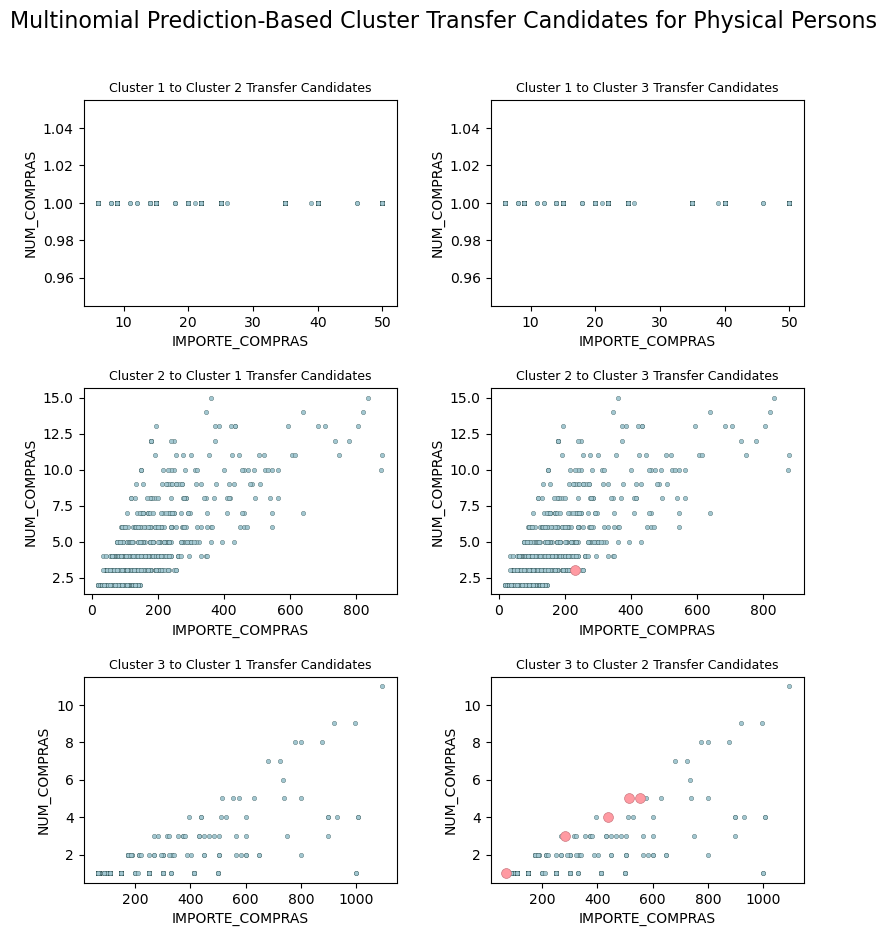

In [70]:
# Create a copy of the df to avoid modifying the original one
persons_cluster_transfer_multinomial_prediction_df = labeled_persons_df.copy()
# Reduce collinearity
persons_cluster_transfer_multinomial_prediction_df = persons_cluster_transfer_multinomial_prediction_df.drop(
                                                           columns=['AOV', 'DIVERSIDAD_EMPRESAS_CONSULT', 'FRECUENCIA_CONSULT'])

# Select relevant features including cluster labels
X = persons_cluster_transfer_multinomial_prediction_df.drop('ClusterLabels', axis=1).values
y = persons_cluster_transfer_multinomial_prediction_df['ClusterLabels'].values - 1  # Ensure labels start at 0

# Build and evaluate MLP model
mlp_model, scaler = build_and_evaluate_mlp(X, y)

# Use the model for full dataset predictions
full_data_predictions = mlp_model.predict(scaler.transform(X))
# Convert back from one-hot encoding
predicted_clusters = np.argmax(full_data_predictions, axis=1) + 1  # Start labels from 1

# Add predictions back to the dataframe
persons_cluster_transfer_multinomial_prediction_df['ClusterTransfer'] = predicted_clusters

# Evaluate the new labels
print("Original vs New classification report:")
print(classification_report(persons_cluster_transfer_multinomial_prediction_df['ClusterLabels'],
                            persons_cluster_transfer_multinomial_prediction_df['ClusterTransfer']))
# Plot cluster transfer
plot_cluster_transfer_scatter(persons_cluster_transfer_multinomial_prediction_df,
                              title_pre='Multinomial Prediction-Based', title_post='for Physical Persons')

<a id="7.2.3"></a> 
### 7.2.3. Conclusiones de la predicción basada en clasificación multinomial

Para el caso de las **sociedades y empresarios**, vemos que se repiten algunas de las predicciones estimadas por distancia y similitud entre los siguientes pares de clústeres:

- **Clústeres 2 y 3**: Si bien en este caso la estimación es más generosa en cuanto al número de clientes que podrían descender de clúster.
- **Clústeres 3 y 5**: Donde la estimación es más moderada.
- **Clústeres 4 y 5**: Siendo nuevamente más moderada.

Y se detectan además las siguientes nuevas posibilidad de trasvase entre los siguientes segmentos:

- **Clústeres 1 y 2**: Lo que supondría un _upgrade_ tanto del número de compras como del importe, por lo que esta tipología de cliente podría ser derivada tanto a equipos de _cross-selling_ como de _up-selling_ con objeto de aumentar ambas variables.
- **Clústeres 1 y 3**: Donde se detecta la posibilidad de traspasdo del segmento 3, caracterizado por reunir la clientela con un mayor número de compras y un buen importe total de gasto, hacia el primer segmento, donde ambas cifras son notablemente inferiores. En cualquier caso, este riesgo de descenso en el importe de compra se limita a clientes concentrados en la zona de mínimos del clúster 3, y que ahora podrían debatirse entre consolidar su posición actual o perder su fidelización de manera progresiva, dependiendo de cómo de acertadas sean las políticas comerciales que se les apliquen.
- **Clústeres 2 y 3**: Donde nuevamente la predicción destaca una grupo de clientes en riesgo de _downgrade_, si bien la distancia en número de compras promedio e importe entre ambos segmentos es menor que en el caso anterior.
- **Clústeres 3 y 5**: Lo que si bien podría entenderse como una descenso en el potencial de importe de compra, podría constituir una oportunidad de dirigir esta clientela hacia el segmento con mayor potencial de recurrencia, y el negocio podría beneficiarse de ello dirigiendo políticas efectivas de _cross-selling_ a estos clientes con opción de hacer la transición.

Por lo que respecta a las **personas físicas**, la estimación es nuevamente más generosa en términos generales, si bien se centra únicamente el siguiente par:

- **Clústeres 2 y 3**: Donde se detectan algunos clientes que podrían hacer la transición en ambos sentidos, siendo más limitados los casos que pasarían del 2 al 3, lo que supondría pasar a un grupo de mayor importe de compra promedio; y siendo más generosos aquellos con la posibilidad de dar el paso a un grupo con un mayor número de compras si se le aplican las estrategias de _cross-selling_ correspondientes, manteniendo un importe total de compra nada desdeñable.

<a id="7.3"></a> 
## 7.3. Predicción basada en regresión lineal y reagrupamiento

Finalmente, el tercero de los enfoques de predicción basa su estrategia en **2 pasos consecutivos**:

1. Durante la primera fase, se entrena un modelo de regresión lineal para la **predicción del importe de compras** a partir de las características del cliente. Al igual que en la estrategia de predicción multinomial, la predicción obtenida reflejará el potencial estimado por el modelo, el cual puede estar relativamente alejado del importe real gastado por el cliente en la práctica.
2. Durante la segunda fase, aplicaremos nuevamente el algoritmo de agrupamiento basado en el importe de compras predicho y en el número de compras que utilizamos durante la segunda fase del proceso de segmentación. A la vista del potencial de gasto del cliente, el algoritmo lo **reclasificará en un segmento potencial**, que puede no coincidir con la etiqueta asignada durante la segmentación original.
Para la predicción, utilizamos las características estadísticamente significativas identificadas a través del modelo robusto seguido durante el cálculo de la similitud del coseno, estandarizadas y transformadas mediante PCA, así como el algoritmo **XGBRegressor** (cuya función objetivo es $\text{Obj}(\theta) = \sum_{i=1}^n L(y_i, \hat{y}_i) + \sum_{k=1}^K \Omega(f_k)$), que demostró ser más eficiente en velocidad y ajuste que GradientBoostingRegressor durante las sucesivas pruebas llevadas a cabo. El algoritmo predice valores numéricos mediante la creación de muchos árboles de decisión pequeños que se combinan en la predicción final; y, puesto que cada árbol intenta corregir los errores de sus predecesores, el modelo evoluciona mejorando progresivamente.

Además, durante la construcción y evaluación del modelo se siguieron las siguientes estrategias:

- Para la afinación de los hiperparámetros se utiliza la librería Optuna.
- Con objeto de evitar el sobreajuste, se aplica nuevamente la estrategia de Detención temprana, la regularización de parámetros mediante L1 y L2, validación cruzada y diferentes intentos; así como controlando la fracción de los datos de entrenamiento y de características utilizadas mediante los parámetros `subsample` y `colsample_bytree` al introducir aleatoriedad en el entrenamiento.

En cuanto a la clasificación, utilizaremos el mismo método (**algoritmo aglomerativo basado en la afinidad del coseno**) y las mismas variables (importe de compras y número de compras) empleadas durante la segunda fase de la segmentación original.

<a id="7.3.1"></a> 
### 7.3.1. Transferencia de sociedades y empresarios

Procedemos en primer lugar con el segmento de sociedades y empresarios.

Best trial:
 Value: 7666.568208702185
 Params: 
    n_estimators: 478
    max_depth: 3
    learning_rate: 0.09697395834354479
    subsample: 0.7302747297704196
    colsample_bytree: 0.8727514892851078
    reg_lambda: 8.239580904778204
    reg_alpha: 8.29142540996655
    gamma: 4.849027219716671
The operation took 21 seconds.
Test MSE: 9654.632351528915
Test RMSE: 98.25798874152125
Test MAE: 33.21157636617621
Test R² Score: 0.943568029921268


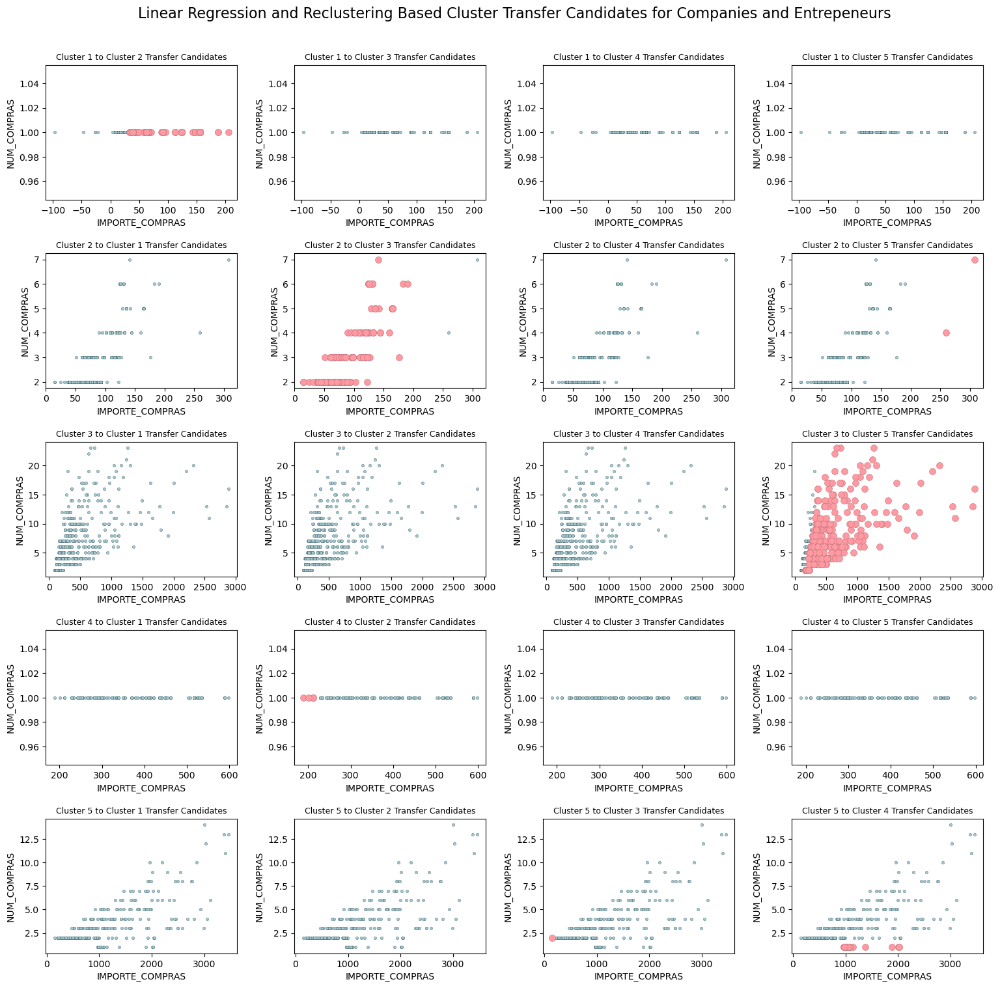

In [71]:
# Create a copy of the df to avoid modifying the original one
companies_cluster_transfer_regression_prediction_df = labeled_companies_df.copy()

# Select relevant feats for regression
regression_relevant_feats = ['ClusterLabels', 'CLV', 'DIVERSIDAD_COMPRAS',
                             'DIVERSIDAD_SECTORES_CONSULT', 'IMPORTE_COMPRAS', 'NUM_COMPRAS']
# Filter relevant features for regression
companies_cluster_transfer_regression_prediction_feat_selection_df = companies_cluster_transfer_regression_prediction_df[
                                                                         regression_relevant_feats]

# Separate features and target variable, exclude cluster labels also
X = companies_cluster_transfer_regression_prediction_feat_selection_df.drop(columns=['IMPORTE_COMPRAS', 'ClusterLabels'])
y = companies_cluster_transfer_regression_prediction_feat_selection_df['IMPORTE_COMPRAS']

# Time the operation by starting a timer
start_time = datetime.now()

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)
# Standardize and apply PCA
scaler = StandardScaler()
pca = PCA(n_components=0.98)
X_train = pca.fit_transform(scaler.fit_transform(X_train))
X_test = pca.transform(scaler.transform(X_test))


# Objective function to be optimized
def regression_objective(trial):
    """
    Optimizes the total spending prediction model using cross-validation and hyperparameter tuning.

    Args:
        trial (optuna.trial.Trial): Trial object for hyperparameter suggestion.

    Returns:
        float: Mean squared error of the model predictions on the validation set.
    """
    # Hyperparameters to be optimized
    n_estimators = trial.suggest_int('n_estimators', 100, 500)
    max_depth = trial.suggest_int('max_depth', 3, 10)
    learning_rate = trial.suggest_float('learning_rate', 0.01, 0.1)
    subsample = trial.suggest_float('subsample', 0.7, 1.0)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.7, 1.0)
    reg_lambda = trial.suggest_float('reg_lambda', 1, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 1, 10)
    gamma = trial.suggest_float('gamma', 0, 5)  # Control overfitting
    # Define the model
    model = xgb.XGBRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        reg_lambda=reg_lambda,
        alpha=reg_alpha,
        objective='reg:squarederror',
        random_state=RANDOM_SEED
    )
    # Fit the model with early stopping
    model.fit(X_train, y_train, early_stopping_rounds=10, eval_set=[(X_test, y_test)], verbose=False)
    # Predict on the validation set
    y_pred = model.predict(X_test)
    # Return negative MSE
    return mean_squared_error(y_test, y_pred)


# Create a study object and optimize the objective
companies_study = optuna.create_study(direction='minimize', sampler=optuna.samplers.TPESampler(seed=RANDOM_SEED))
companies_study.optimize(regression_objective, n_trials=100)
# Best trial results
print("Best trial:")
trial = companies_study.best_trial
print(f" Value: {trial.value}")
print(" Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")
# Retrieve best model
best_params = companies_study.best_params
best_model = xgb.XGBRegressor(**best_params)
best_model.fit(X_train, y_train)
# Evaluate best model
y_pred_test = best_model.predict(X_test)
test_mse = mean_squared_error(y_test, y_pred_test)
test_rmse = mean_squared_error(y_test, y_pred_test, squared=False)
test_mae = mean_absolute_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)

# End timer and print timing result
end_time = datetime.now()
elapsed_time = end_time - start_time
print_duration(elapsed_time.total_seconds())

# Print evaluation results
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAE: {test_mae}')
print(f'Test R² Score: {test_r2}')

# Predicting IMPORTE_COMPRAS for the entire dataset
y_predicted = best_model.predict(pca.transform(scaler.transform(X)))
# Adding the predicted values back to the dataframe
companies_cluster_transfer_regression_prediction_df['IMPORTE_COMPRAS'] = y_predicted

# Select feats for clustering
clustering_relevant_feats = ['IMPORTE_COMPRAS', 'NUM_COMPRAS']
# Filter relevant feats for clustering
companies_cluster_transfer_regression_prediction_df = companies_cluster_transfer_regression_prediction_df[clustering_relevant_feats]
# Transform data
transformed_companies_cluster_transfer_regression_prediction_df = transform_data(companies_cluster_transfer_regression_prediction_df,
                                                                                 transformation_type='square')
# Scale data
scaled_companies_cluster_transfer_regression_prediction_df = scale_data(transformed_companies_cluster_transfer_regression_prediction_df,
                                                              scaler_type='standard')
# Convert the whole DataFrame to a numpy array
X_np = scaled_companies_cluster_transfer_regression_prediction_df.to_numpy()
# Apply Agglomerative Clustering
clustering = AgglomerativeClustering(n_clusters=5, affinity='cosine', linkage='complete')
cluster_labels = clustering.fit_predict(X_np)
# Assign cluster labels and cluster transfer to the df
companies_cluster_transfer_regression_prediction_df['ClusterTransfer'] = cluster_labels + 1  # Adjust labels to start from 1
# Sort cluster labels according to 'IMPORTE_COMPRAS'
companies_cluster_transfer_regression_prediction_df = relabel_df_sorted(companies_cluster_transfer_regression_prediction_df,
                                                                        sorting_col='IMPORTE_COMPRAS', statistic='mean',
                                                                        labels_col='ClusterTransfer')
# Restore cluster labels
matching_indexes = companies_cluster_transfer_regression_prediction_df.index.intersection(labeled_companies_df.index)
companies_cluster_transfer_regression_prediction_df.loc[
                matching_indexes, 'ClusterLabels'] = labeled_companies_df.loc[matching_indexes, 'ClusterLabels']
# Cast labels to int
companies_cluster_transfer_regression_prediction_df[
                'ClusterLabels'] = companies_cluster_transfer_regression_prediction_df['ClusterLabels'].astype(int)
# Plot possible clusters transfer
plot_cluster_transfer_scatter(companies_cluster_transfer_regression_prediction_df,
                              title_pre='Linear Regression and Reclustering Based', title_post='for Companies and Entrepeneurs')

<a id="7.3.2"></a> 
### 7.3.2. Transferencia de personas físicas

A continuación aplicamos el procedimiento a los clústeres de personas físicas.

Best trial:
 Value: 1154.622722462354
 Params: 
    n_estimators: 102
    max_depth: 9
    learning_rate: 0.07361716094628554
    subsample: 0.9187021504122962
    colsample_bytree: 0.9313811040057838
    reg_lambda: 1.6664018656068134
    reg_alpha: 4.226191556898454
    gamma: 0.5793452976256486
The operation took 14 seconds.
Test MSE: 1364.116029554741
Test RMSE: 36.93394143000096
Test MAE: 6.151556747223642
Test R² Score: 0.866980741283965


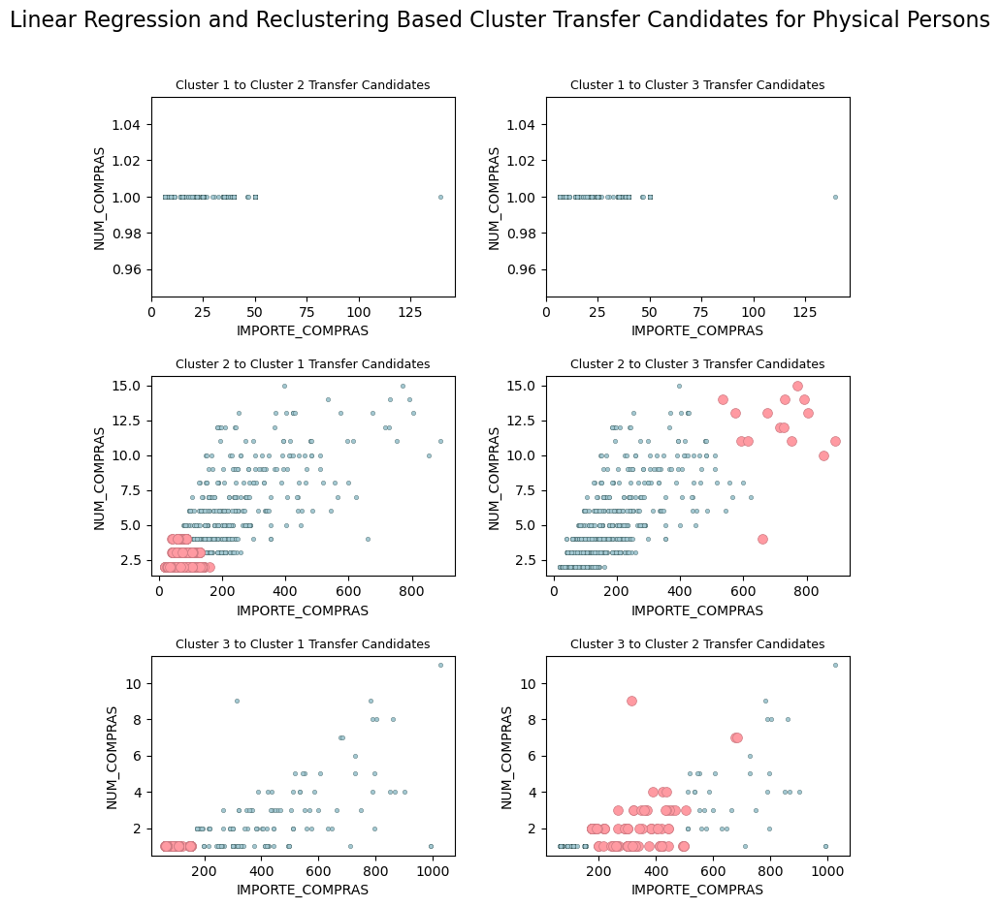

In [72]:
# Create a copy of the df to avoid modifying the original one
persons_cluster_transfer_regression_prediction_df = labeled_persons_df.copy()

# Select relevant feats for regression
regression_relevant_feats = ['ClusterLabels', 'CLV', 'DIVERSIDAD_COMPRAS',
                             'DIVERSIDAD_SECTORES_CONSULT', 'IMPORTE_COMPRAS', 'NUM_COMPRAS']
# Filter relevant features for regression
persons_cluster_transfer_regression_prediction_feat_selection_df = persons_cluster_transfer_regression_prediction_df[regression_relevant_feats]

# Separate features and target variable, exclude cluster labels also
X = persons_cluster_transfer_regression_prediction_feat_selection_df.drop(columns=['IMPORTE_COMPRAS', 'ClusterLabels'])
y = persons_cluster_transfer_regression_prediction_feat_selection_df['IMPORTE_COMPRAS']

# Time the operation by starting a timer
start_time = datetime.now()

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)
# Standardize and apply PCA
scaler = StandardScaler()
pca = PCA(n_components=0.98)
X_train = pca.fit_transform(scaler.fit_transform(X_train))
X_test = pca.transform(scaler.transform(X_test))

# Create a study object and optimize the objective
persons_study = optuna.create_study(direction='minimize', sampler=optuna.samplers.TPESampler(seed=RANDOM_SEED))
persons_study.optimize(regression_objective, n_trials=100)
# Best trial results
print("Best trial:")
trial = persons_study.best_trial
print(f" Value: {trial.value}")
print(" Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")
# Retrieve best model
best_params = persons_study.best_params
best_model = xgb.XGBRegressor(**best_params)
best_model.fit(X_train, y_train)
# Evaluate best model
y_pred_test = best_model.predict(X_test)
test_mse = mean_squared_error(y_test, y_pred_test)
test_rmse = mean_squared_error(y_test, y_pred_test, squared=False)
test_mae = mean_absolute_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)

# End timer and print timing result
end_time = datetime.now()
elapsed_time = end_time - start_time
print_duration(elapsed_time.total_seconds())

# Print evaluation results
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAE: {test_mae}')
print(f'Test R² Score: {test_r2}')

# Predicting IMPORTE_COMPRAS for the entire dataset
y_predicted = best_model.predict(pca.transform(scaler.transform(X)))
# Adding the predicted values back to the dataframe
persons_cluster_transfer_regression_prediction_df['IMPORTE_COMPRAS'] = y_predicted

# Select feats for clustering
clustering_relevant_feats = ['IMPORTE_COMPRAS', 'NUM_COMPRAS']
# Filter relevant features for clustering
persons_cluster_transfer_regression_prediction_df = persons_cluster_transfer_regression_prediction_df[clustering_relevant_feats]
# Transform data
transformed_persons_cluster_transfer_regression_prediction_df = transform_data(persons_cluster_transfer_regression_prediction_df,
                                                                               transformation_type='square')
# Scale data
scaled_persons_cluster_transfer_regression_prediction_df = scale_data(transformed_persons_cluster_transfer_regression_prediction_df,
                                                                      scaler_type='robust')
# Convert the whole DataFrame to a numpy array
X_np = scaled_persons_cluster_transfer_regression_prediction_df.to_numpy()
# Apply Agglomerative Clustering
clustering = AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')
cluster_labels = clustering.fit_predict(X_np)
# Assign cluster labels and cluster transfer to the df
persons_cluster_transfer_regression_prediction_df['ClusterTransfer'] = cluster_labels + 1  # Adjust labels to start from 1
# Sort cluster labels according to 'IMPORTE_COMPRAS'
persons_cluster_transfer_regression_prediction_df = relabel_df_sorted(persons_cluster_transfer_regression_prediction_df,
                                                                      sorting_col='IMPORTE_COMPRAS', statistic='mean',
                                                                      labels_col='ClusterTransfer')
# Restore cluster labels
matching_indexes = persons_cluster_transfer_regression_prediction_df.index.intersection(labeled_persons_df.index)
persons_cluster_transfer_regression_prediction_df.loc[
                matching_indexes, 'ClusterLabels'] = labeled_persons_df.loc[
                                                         matching_indexes, 'ClusterLabels']
# Cast labels to int
persons_cluster_transfer_regression_prediction_df[
                'ClusterLabels'] = persons_cluster_transfer_regression_prediction_df['ClusterLabels'].astype(int)
# Plot possible clusters transfer
plot_cluster_transfer_scatter(persons_cluster_transfer_regression_prediction_df,
                              title_pre='Linear Regression and Reclustering Based', title_post='for Physical Persons')

<a id="7.3.3"></a> 
### 7.3.3. Conclusiones de la predicción de transferencia basada en regresión lineal y reagrupamiento

Respecto a las **sociedades y empresarios**, se repiten parcialmente las predicciones anteriores entre los siguientes pares de clústeres:

- **Clústeres 2 y 3**
- **Clústeres 3 y 5**
- **Clústeres 4 y 5**

En todos ellos la estimación de clientes afectados es más generosa. Por otra parte, esta estrategia ha detectado el posible trasvase entre el siguiente par de segmentos:

- **Clústeres 1 y 4**: Los cuales, si bien presentan una diferencia importante respecto al importe promedio, se caracterizan por su reducido número de compras, por lo que el algoritmo detecta la posibilidad de incrementar el importe de compra que se podría materializar con las apropiadas técnicas comerciales de _up-selling_.

Por último, en referencia a las **personas físicas**, nuevamente el resultado es más generoso que a través de los otros métodos, y encontramos posibilidades de trasvase entre todos los pares de grupos, si bien no en todas las direcciones:

- **Clústeres 1 y 2**: Donde el grupo de la franja inferior del segundo clúster podría encuadrarse dentro del primer segmento, debido tanto a su reducido número de compras como a su reducido importe invertido.
- **Clústeres 1 y 3**: Al contrario de lo que sucedía en el eventual traspaso detectado entre los segmentos 1 y 4 de las sociedades y empresarios, en este caso y de acuerdo con la predicción de esta estrategia, las similitudes entre aquellos clientes que realizan una única compra ponen en riesgo a los clientes que realizan un mayor gasto por su posibilidad de traspaso al primer clúster, donde el poco número de compras va unido a un importe de compra muy reducido. Este _downgrade_ en el cliente y, consecuentemente en el tique, debería ser estrechamente vigilado por el equipo comercial de fidelización.
- **Clústeres 2 y 3**: Quedando afectados una porción notablemente alta de clientes que podrían pasar, tanto de un clúster de mayor gasto a otro de mayor número de compras, como en sentido contrario.

<a id="7.4"></a> 
## 7.4. Conclusiones sobre la predicción de transferencia y combinación de múltiples métricas

Como ha quedado expuesto durante el análisis de las 3 estrategias analizadas, si bien encontramos resultados de predicción que se repiten en todos los casos, la estimación de transferencia resulta más o menos generosa según la métrica utilizada. Ante esto, se plantea al negocio la posibilidad de escoger cualquiera de los enfoques, optando por una predicción más conservadora o más amplia de acuerdo con la política comercial de la empresa, y de contrastar las posibilidades que cada una de las métricas ofrece con los resultados en la práctica.

Otra posibilidad consiste en **optar por una solución de consenso**, y seleccionar los candidatos a la transferencia que han sido detectados unánimemente mediante las 3 vías o, alternativamente, por una mayoría de ellas (al menos 2 de las 3 totales). Con este objeto, diseñamos una función que filtra los resultados consensuados por unanimidad o mayoría de acuerdo con la configuración del parámetro de entrada diseñado a tal efecto. A título demostrativo, optamos por un filtrado de resultados consensuados por mayoría y analizamos la predicción multimétrica resultante.

<a id="7.4.1"></a> 
### 7.4.1. Transferencia de sociedades y empresarios

Comenzaremos analizando los resultados relativos a sociedades y empresarios.

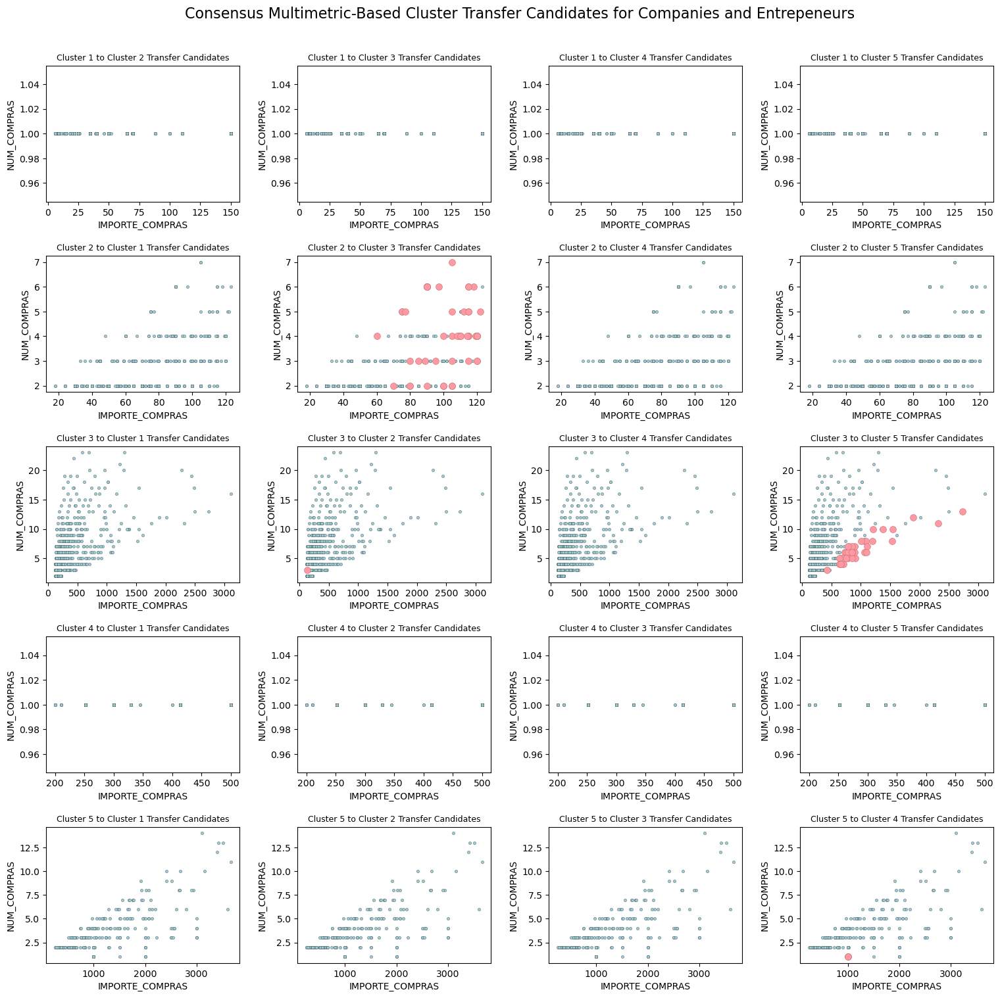

In [73]:
# Define a function to find multimetric consensus cluster transfer
def estimate_cluster_transfer_consensus(dfs, unanimous_decision=False, labels_col='ClusterLabels', transfer_col='ClusterTransfer'):
    """
    Estimates the consensus for cluster transfers across multiple dataframes.

    Args:
        dfs (list): List of datadrames containing 'ClusterTransfer' information for the same set of indices.
        unanimous_decision (bool): Option to decide if the function requires unanimous agreement across all
                                   dataframes for the cluster transfer, else the cluster transfer is determined
                                   by majority decision. Default value is set to False.

    Returns:
        pd.DataFrame: Dataframe containing the original core columns ('IMPORTE_COMPRAS', 'NUM_COMPRAS', 'ClusterLabels') 
        and the consensus 'ClusterTransfer' for each data point.
    """
    # Check that all df share the same indices
    first_df = dfs[0]
    for df in dfs[1:]:
        if not first_df.index.equals(df.index):
            raise ValueError("DataFrames do not share the same indices")

    # Create a copy of the dfs to avoid modifying the original one containing the core columns for plotting
    common_columns = ['IMPORTE_COMPRAS', 'NUM_COMPRAS', labels_col]
    consensus_df = first_df[common_columns].copy()
    # Initialize 'ClusterTransfer' with 'ClusterLabel' values
    consensus_df[transfer_col] = consensus_df[labels_col]
    # Determine by consensus 'ClusterTransfer' value
    for idx in consensus_df.index:
        transfers = [df.at[idx, transfer_col] for df in dfs]
        if unanimous_decision:  # Unanimous decision
            if all(t == transfers[0] for t in transfers):
                consensus_df.at[idx, transfer_col] = transfers[0]
        else:  # Majority decision
            transfer_counts = Counter(transfers)
            most_common_transfer, count = transfer_counts.most_common(1)[0]
            if count > len(dfs) // 2:
                consensus_df.at[idx, transfer_col] = most_common_transfer
                
    return consensus_df


# Estimate cluster transfers consensus according to different methodologies
companies_consensus_cluster_transfer_df = estimate_cluster_transfer_consensus([unscaled_companies_cluster_transfer_distance_and_similarity_df,
                                                                              companies_cluster_transfer_multinomial_prediction_df,
                                                                              companies_cluster_transfer_regression_prediction_df],
                                                                              unanimous_decision=False)
# Plot possible clusters transfers
plot_cluster_transfer_scatter(companies_consensus_cluster_transfer_df,
                              title_pre='Consensus Multimetric-Based', title_post='for Companies and Entrepeneurs')

<a id="7.4.2"></a> 
### 7.4.2. Transferencia de personas físicas

Y proseguimos con los de las personas físicas.

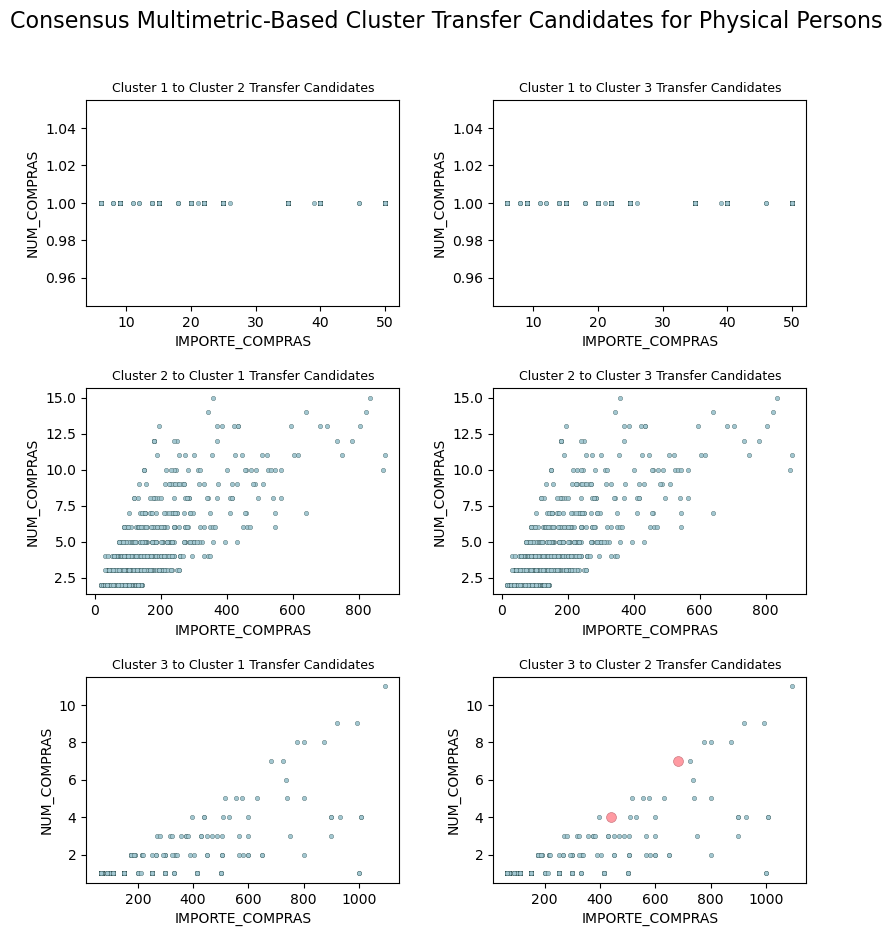

In [74]:
# Estimate cluster transfers consensus according to different methodologies
persons_consensus_cluster_transfer_df = estimate_cluster_transfer_consensus([unscaled_persons_cluster_transfer_distance_and_similarity_df,
                                                                            persons_cluster_transfer_multinomial_prediction_df,
                                                                            persons_cluster_transfer_regression_prediction_df],
                                                                            unanimous_decision=False)
# Plot possible clusters transfers
plot_cluster_transfer_scatter(persons_consensus_cluster_transfer_df,
                              title_pre='Consensus Multimetric-Based', title_post='for Physical Persons')

<a id="7.4.3"></a> 
### 7.4.3. Conclusiones de la predicción de transferencia multimétrica

Como resultado del consenso por mayoría de las estimaciones realizadas por las 3 métricas analizadas, encontramos las siguientes predicciones:

- A. Por lo que respecta a **sociedades y empresarios**, ha sido detectada la posibilidad de trasvase entre los siguientes pares de clústeres:
  - **Clústeres 1 y 4**: Se trata de un caso muy concreto de clientes con un número muy limitado de compras, pero con un importe de compras muy por encima de la media de su segmento, y que con las técnicas adecuadas de _up-selling_ podrían encajar en un segmento con importe de compra promedio más generoso, como es el clúster 4.
  - **Clústeres 2 y 3**: Lo que supondría ascender a un clúster con un importe de compra promedio más elevado y, sobre todo, con el número más elevado de compras de entre todos los clústeres, lo que abre la puerta al traslado de esta selección de clientes a los equipos comerciales tanto de _up-selling_ como de _cross-selling_. Cabe también mencionar que hay una porción más moderada de usuarios encuadrados en el extremo inferior del segmento 3 que podría descender al 2 o, por el contrario, consolidar su posición a través de las políticas de fidelización adecuadas.
  - **Clústeres 3 y 5**: Siendo así transferidos hasta el clúster de mayor importe. Se trata de clientes que podrían beneficiarse tanto de las políticas de _cross-selling_ dirigidas al segmento 3 (caracterizado por su elevado número de compras), como de las estrategias de _up-selling_ dirigidas al segmento 5 (caracterizado por su elevado importe de compra).
  - **Clústeres 5 y 4**: Al contrario de lo que sucedía en la posibilidad de traspaso del clúster 1 al 4, en este caso se trata de clientes que, pese a estar alineados con un segmento de elevado importe de compra en su región más baja, su reducido número de compras lo aproxima a un clúster de compra única y con un importe de compra promedio más moderado, por lo cual el equipo comercial debería dirigir sus esfuerzos tanto a fidelizarlo, como a aumentar el importe del tique mediante técnicas de _up-selling_.
<br><br>
- B. En referencia a las **personas físicas**, la posibilidad de transferencia es más limitada y se relega al siguiente par de segmentos:
  -  **Clústeres 2 y 3**: Donde un pequeño número de clientes se encuentra en la zona limítrofe entre clientes de gran importe de compra y aquellos con un elevado número de compras, y que podrían beneficiarse tanto de técnicas de _cross-selling_ enfocadas al clúster 2 como de las de _up-selling_ pensadas para el grupo 3.

<a id="7.4.4"></a> 
### 7.4.4. Exportación del fichero de transferencia de clientes

Exportamos el fichero de clientes etiquetado con una nueva columna llamada `TRANSFERENCIA`, la cual que contiene su posible clúster de traspaso. En el caso de aquellos clientes para los que no se predice movimiento, la columna contendrá un valor nulo. En cuanto a los clientes pertenecientes al segmento de valores extremos, debido a sus características particulares ya expuestas en apartados anteriores, no se ha analizado la posibilidad de un trasvase y parece poco probable, por lo que para esta columna les será igualmente asignado un valor nulo.

In [75]:
# Create a copy of the df to avoid modifying the original one
transfer_df = labeled_df.copy()
# Add new column for predicted transfers
transfer_df['TRANSFERENCIA'] = None
# Assign physical persons predicted transfers
matching_indexes_persons = transfer_df.index.intersection(persons_consensus_cluster_transfer_df.index)
transfer_df.loc[matching_indexes_persons,
                'TRANSFERENCIA'] = persons_consensus_cluster_transfer_df.loc[matching_indexes_persons,
                                                                             'ClusterTransfer']
# Assign companies and entrepeneurs predicted transfers
matching_indexes_companies = transfer_df.index.intersection(companies_consensus_cluster_transfer_df.index)
transfer_df.loc[matching_indexes_companies,
                'TRANSFERENCIA'] = (companies_consensus_cluster_transfer_df.loc[matching_indexes_companies,
                                                                                'ClusterTransfer'] +
                                    labeled_persons_df['ClusterLabels'].nunique())

# Assign NaN in those cases where the predicted cluster is the current cluster
transfer_df.loc[transfer_df['SEGMENTO'] == transfer_df['TRANSFERENCIA'], 'TRANSFERENCIA'] = None

# Relabel SEGMENTO sorted according to total spending
relabeled_transfer_df = relabel_df_sorted(transfer_df, labels_col='SEGMENTO')
# Create mapping from original SEGMENTO to new SEGMENTO
transfer_df_to_relabeled_transfer_df_segment_mapping = dict(zip(transfer_df['SEGMENTO'],                                                          relabeled_transfer_df['SEGMENTO']))
# Update the cluster transfer column in relabeled_transfer_df
relabeled_transfer_df['TRANSFERENCIA'] = relabeled_transfer_df[
                                             'TRANSFERENCIA'].map(transfer_df_to_relabeled_transfer_df_segment_mapping)

# Restore the 'ID' column using the index information and reset index
restored_id_relabeled_transfer_df = relabeled_transfer_df.reset_index()
restored_id_relabeled_transfer_df = restored_id_relabeled_transfer_df.rename(columns={'index': 'ID'})

# Export df to TXT following the encoding and format from the original file
restored_id_relabeled_transfer_df.to_csv('CLIENTES_TRANSFERIBLES.txt', encoding='ISO-8859-1', sep='|', index=False)

<a id="8"></a>
***
# 8. Estudio y desarrollo de estrategias de fidelización del cliente

Una vez completada la segmentación de clientes y la posibilidad de transferencia entre clústeres, pondremos el foco en la recurrencia de compra del cliente, distinguiendo los compradores habituales de los puntuales, y diseñando estrategias basadas en datos que nos permitan retenerlos y ofrecerles un servicio más amplio del que obtienen.

<a id="8.1"></a>
## 8.1. Predicción de la recurrencia de compra

Seguidamente intentaremos predecir, partiendo únicamente de las primeras interacciones del cliente, qué clientes serán recurrentes y cuáles no. Con esta información, el equipo comercial respectivo será capaz de anticiparse con objeto de retenerlo.

Dividiremos en proceso en **2 partes**:

1. Durante la primera **etiquetaremos** a la clientela como **recurrente o no recurrente**.
2. Seguidamente construiremos un **modelo clasificatorio binomial de clientes recurrentes**.

<a id="8.1.1"></a>
### 8.1.1. Segmentación por recurrencia

Como es habitual, la primera fase del proceso es nuevamente **preparatoria** de los datos. Para ello, dividiremos la clientela entre recurrente y no recurrente, entendiendo por cliente no recurrente aquel que no ha comprado más de 2 productos o que, en caso de haber comprado más, los adquirió en una única fecha de compra. Para ellos deberemos combinar diferentes fuentes de datos, y comenzaremos por recuperar el _dataset_ con información de ventas y seleccionando aquellos clientes que, con independencia del número de compras que hayan realizado, llevaron todas a cabo en una única fecha.

In [76]:
# Group by 'ID' and get unique dates of 'FECHAVENTA' for each 'ID'
unique_dates_per_customer = sales_df.groupby('ID')['FECHAVENTA'].nunique()
# Filter IDs where the count of unique dates is exactly 1
single_date_purchase_customers_ids = unique_dates_per_customer[unique_dates_per_customer == 1].index

Seguidamente seleccionamos aquellos clientes que tan sólo han realizado un máximo de 2 compras.

In [77]:
# Filter to find customers with 2 or fewer purchases
few_purchases_customers = customers_df[customers_df['NUM_COMPRAS'] <= 2]
# Get the IDs of these customers from the index
few_purchases_customers_ids = few_purchases_customers.index

Unimos ambos listados y añadimos una nueva columna en el juego de datos, a la que llamaremos `RECURRENCIA`, y la cual contendrá un valor lógico negativo para los clientes incluídos en los listados extraídos (es decir, los clientes no recurrentes) y un 1 en el resto de casos (siendo éstos los recurrentes).

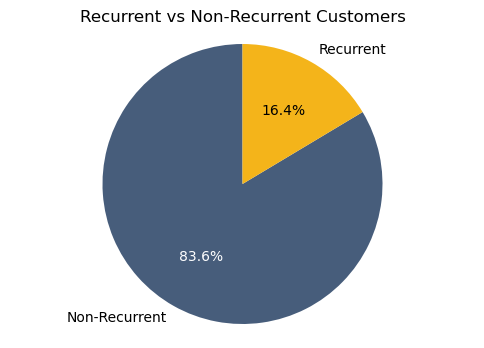

In [78]:
# Convert both to sets
single_date_purchase_customers_ids_set = set(single_date_purchase_customers_ids)
few_purchases_customers_ids_set = set(few_purchases_customers_ids)
# Merge both sets avoiding duplicates
non_recurrent_customers_ids = single_date_purchase_customers_ids_set.union(few_purchases_customers_ids_set)
# Convert merged_ids to a set
non_recurrent_customers_ids_set = set(non_recurrent_customers_ids)
# Create a copy of customers that will contain the new recurrence variable
customers_recurrence_df = enhanced_labeled_customers_df.copy()
# Update labels from 2nd phase of customers' segmentation
customers_recurrence_df['ClusterLabels'] = labeled_df['SEGMENTO'].reindex(customers_recurrence_df.index)
# Reduce collinearity
customers_recurrence_df = customers_recurrence_df.drop(columns=['AOV', 'DIVERSIDAD_EMPRESAS_CONSULT',
                                                                'FRECUENCIA_CONSULT'])
# Mark customers in non_recurrent_customers_ids_set with 0 and all the rest with 1
customers_recurrence_df['RECURRENCIA'] = (~customers_recurrence_df.index.isin(non_recurrent_customers_ids_set)).astype(int)

# Count the occurrences of each category in the 'RECURRENCIA' column
recurrence_counts = customers_recurrence_df['RECURRENCIA'].value_counts()
# Define labels and colors for the pie chart
labels = ['Non-Recurrent', 'Recurrent']
colors = ['#475D7B','#F4B41A']  # Light red for Non-Recurrent, Light blue for Recurrent
# Create the pie chart
plt.figure(figsize=(6, 4))  # Set the figure size
wedges, texts, autotexts = plt.pie(recurrence_counts, labels=labels, colors=colors, autopct='%1.1f%%', startangle=90)
# Add a title
plt.title('Recurrent vs Non-Recurrent Customers')
# Set text color based on segment color
for autotext, color in zip(autotexts, colors):
    if color == '#475D7B':
        autotext.set_color('white')
    else:
        autotext.set_color('black')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
# Show the plot
plt.show()

El objetivo de nuestro modelo predicitivo deberá ser el de determinar si un nuevo cliente acabará siendo recurrente o no. Por este motivo, la información relativa a su importe total de compras o al número total de compras realizadas a lo largo de toda su vida comercial con la empresa no nos será de utilidad en el entrenamiento del modelo de predicción. Debe tenerse en cuenta que el histórico completo del cliente es un dato del cual sólo se dispone a largo plazo, mientras que lo que nos interesa es **predecir su condición de no recurrente durante su interacción temprana con el servicio**, para que así el equipo comercial de fidelización pueda poner en marcha las campañas adecuadas para buscar su fidelización.

Por ello volveremos a combinar la información de ventas con la del cliente, aislando el importe de los 2 primeros productos comprados por cada cliente o, en caso de que adquiriesen más de 2 artículos en su primera fecha de compra, el importe total de éstos así como el total de artículos adquiridos. De esta manera dispondremos de la información de importe y número de adquisiciones iniciales de cada cliente que deberían permitirnos predecir su condición o no de comprador recurrente.

In [79]:
# Merge the dataframes using the index of customers_df and the ID column of sales_df
merged_df = pd.merge(customers_df, sales_df, left_index=True, right_on='ID')

# Sort by customer ID and purchase date
merged_df = merged_df.sort_values(by=['ID', 'FECHAVENTA'])

# Identify first two purchases or all purchases on the first purchase date for each customer
def get_initial_purchases(df):
    first_purchase_date = df['FECHAVENTA'].iloc[0]
    same_day_purchases = df[df['FECHAVENTA'] == first_purchase_date]
    if len(same_day_purchases) > 1:
        return same_day_purchases
    else:
        return df.head(2)

initial_purchases = merged_df.groupby('ID').apply(get_initial_purchases).reset_index(drop=True)

# Aggregate metrics for initial purchases
initial_purchase_metrics = initial_purchases.groupby('ID').agg({
    'IMPORTE': 'sum',
    'PRODUCTOCOMPRADO': 'count'
}).rename(columns={'IMPORTE': 'IMPORTE_PRIMERAS_COMPRAS', 'PRODUCTOCOMPRADO': 'NUM_PRIMERAS_COMPRAS'})

Así, durante la confección del modelo descartaremos las variables `IMPORTE_COMPRAS` y `NUM_COMPRAS`, y las sustituiremos por `IMPORTE_PRIMERAS_COMPRAS` y `NUM_PRIMERAS_COMPRAS`.

Combinamos en un única juego de datos toda la información resultante.

In [80]:
# Merge the initial purchase metrics into customers_recurrence_df
customers_recurrence_df = customers_recurrence_df.merge(initial_purchase_metrics, left_index=True, right_index=True, how='left')
# Now customers_recurrence_df includes IMPORTE_PRIMERAS_COMPRAS and NUM_PRIMERAS_COMPRAS
display(customers_recurrence_df.head())

# Select consults-related features from consults_df
consults_feats = ['DIVERSIDAD_EMPRESAS_CONSULT', 'DIVERSIDAD_ESTADOS_CONSULT',
                  'DIVERSIDAD_SECTORES_CONSULT', 'DIVERSIDAD_TAMAÑOS_CONSULT',
                  'ENGAGEMENT', 'RECENCIA_CONSULT', 'TENDENCIA_FRECUENCIA_VENTAS']

consults_selected_feats = enhanced_labeled_customers_df[consults_feats]
# Merge data with first purchases df
recurrence_feats = ['CONSUMOSTOTAL', 'IMPORTE_PRIMERAS_COMPRAS',
                    'NUM_PRIMERAS_COMPRAS', 'RECURRENCIA']
recurrence_selected_feats = customers_recurrence_df[recurrence_feats]
recurrence_df = recurrence_selected_feats.merge(consults_selected_feats, left_index=True, right_index=True)

,DIASCLIENTE,CONSUMOSTOTAL,EMPRESASUNICAS_CONSULT,NUM_COMPRAS,IMPORTE_COMPRAS,TAMAÑO,ANTIGUEDAD,CANAL_REGISTRO_SEM,CANAL_REGISTRO_WEB,CLIENTEPORCAMPAÑAEMAIL_sí,...,CLV,RECENCIA_CONSULT,DIVERSIDAD_SECTORES_CONSULT,DIVERSIDAD_TAMAÑOS_CONSULT,DIVERSIDAD_ESTADOS_CONSULT,ENGAGEMENT,DIVERSIDAD_COMPRAS,RECURRENCIA,IMPORTE_PRIMERAS_COMPRAS,NUM_PRIMERAS_COMPRAS
ID,,,,,,,,,,,,,,,,,,,,,
6384286,0,11,3,1,35,0.00,0.00,False,True,False,...,496.26,2328,1,1,2,0.41,1,0,35,1
6384667,358,1,1,1,15,1.00,5.00,False,True,False,...,212.68,1971,1,1,1,0.25,1,0,15,1
6387954,67,61,10,13,684,0.00,0.00,False,False,False,...,746.02,90,4,3,3,1.51,2,1,44,2
6383269,0,1,1,1,22,0.00,0.00,False,False,False,...,311.93,2329,1,1,1,0.24,1,0,22,1
6386670,1088,1,1,1,15,0.00,0.00,False,False,False,...,212.68,1239,1,1,1,0.30,1,0,15,1


Seguidamente aplicaremos PCA sobre los datos con el único propósito de detectar las variables más significativos.

In [81]:
# Explore main feature according to PCA
obtain_pca_main_feats_and_variance_ratio(recurrence_df, desired_var_ratio=0.98)

,PC,Main Feature,Explained Variance Ratio,Cumulative Explained Variance Ratio
0,PC1,RECENCIA_CONSULT,53.88%,53.88%
1,PC2,CONSUMOSTOTAL,40.20%,94.07%
2,PC3,IMPORTE_PRIMERAS_COMPRAS,5.26%,99.34%


Y la varianza parece estar concentrada en `CONSUMOSTOTAL`, `IMPORTE_PRIMERAS_COMPRAS`y `RECENCIA_CONSULT`.

Las compararemos a continuación con las variables estadísticamente significativas para la predicción del número de compras, para lo cual, igual que en apartados anteriores, nos serviremos de un modelo de regresión robusto que suavice el impacto de la distribución sesgada de los datos partiendo de los atributos obtenidos durante el proceso de _feature engineering_.

In [82]:
# Select sales and consults-related feats
consumptions_and_sales_feats = ['CLV', 'CONSUMOSTOTAL', 'DIVERSIDAD_COMPRAS', 'DIVERSIDAD_ESTADOS_CONSULT',
                                'DIVERSIDAD_SECTORES_CONSULT',  'DIVERSIDAD_TAMAÑOS_CONSULT', 'EMPRESASUNICAS_CONSULT',
                                'ENGAGEMENT', 'IMPORTE_COMPRAS', 'NUM_COMPRAS', 'RECENCIA_CONSULT',
                                'TENDENCIA_FRECUENCIA_CONSULT', 'TENDENCIA_FRECUENCIA_VENTAS']
# Filter relevant feats
enhanced_customers_selected_feats_df = enhanced_labeled_customers_df[consumptions_and_sales_feats]
# Compute robust linear regression model
compute_huber_regression(enhanced_customers_selected_feats_df.drop(columns=['NUM_COMPRAS']),
                         enhanced_customers_selected_feats_df['NUM_COMPRAS'])

The operation took 1 minute and 54 seconds.
Cross-validated MSE scores: [3.36, 3.24, 3.9, 4.03, 3.79]
Average MSE: 3.66
AIC: 39404.88
Cross-validated R-squared scores: [0.46, 0.31, 0.37, 0.41, 0.31]
Average R-squared: 0.37
Feature importances (coefficients):


,Feature,Coefficient,Std_Error,Z_Score,P_Value
8,IMPORTE_COMPRAS,0.52,0.06,8.75,0.00
5,DIVERSIDAD_TAMAÑOS_CONSULT,0.32,0.07,5.05,0.00
0,CLV,-0.28,0.03,-9.79,0.00
11,TENDENCIA_FRECUENCIA_VENTAS,-0.10,0.05,-2.26,0.02
4,DIVERSIDAD_SECTORES_CONSULT,-0.10,0.03,-3.66,0.00
3,DIVERSIDAD_ESTADOS_CONSULT,-0.04,0.03,-1.49,0.14
7,ENGAGEMENT,0.03,0.02,2.85,0.00
2,DIVERSIDAD_COMPRAS,0.02,0.02,2.29,0.02
1,CONSUMOSTOTAL,-0.01,0.00,-2.71,0.01
9,RECENCIA_CONSULT,0.01,0.03,-0.35,0.72


Y atendiendo al coeficiente obtenido y el $p$-valor, podemos establecer como significativas en la predicción del número de compras las variables `CLV`, `CONSUMOSTOTAL`, `DIVERSIDAD_COMPRAS`, `DIVERSIDAD_SECTORES_CONSULT`, `DIVERSIDAD_TAMAÑOS_CONSULT` , `ENGAGEMENT`, `IMPORTE_COMPRAS` y `TENDENCIA_FRECUENCIA_VENTAS`; las cuáles no coinciden del todo con las obtenidas a través del análisis de componentes principales.

Debido a que la dimensionalidad no experimentará grandes cambios si optamos por mantener el conjunto de características de consumos y ventas mencionadas, optaremos por conservarlas todas.

<a id="8.1.2"></a>
### 8.1.2. Modelo de clasificación de recurrencia de clientes

Con la información obtenida, construimos un modelo clasificatorio mediante XGBClassifier, nuevamente basado en el método del _boosting_ de árboles de decisión a través del cual se combinan muchos árboles de decisión débiles para construir un modelo fuerte $\left(y = \sum_{m=1}^{M} \gamma_m \cdot h_m(x)\right)$, ya que tras diversas pruebas, sus resultados ha sido ligeramente superiores a los obtenidos mediante otros algoritmos como RandomForestClassifier, además de ofrecer un tiempo de ejecución más breve.

Debemos tener presente que, debido a la amplia selección de variables conservadas, corremos el riesgo de que el modelo aprenda el ruido y se sobreajuste al conjunto de datos. Con objeto de evitarlo, así como de **mejorar el desempeño del algoritmo**, utilizamos las siguientes **técnicas**:

- Validación cruzada estratificada, ya que debemos recordar que la proporción de compradores recurrentes y no recurrentes en el _dataset_ está lejos de estar equilibrada. También con objeto de equilibrar el _dataset_ utilizamos la biblioteca SMOTE para generar sintéticamente _over-sampling_ sobre la clase con menor representación en los datos.
- Detención temprana para interrumpir el entrenamiento cuando el modelo deja de mejorar.
- Hiperparametrización a través de la biblioteca Optuna.
- Estandarización de los datos para que las diferentes escalas no distorsionen el resultado, y reducción mediante PCA.

Best trial:
 Value: 0.9915758196879356
 Params: 
    n_estimators: 827
    max_depth: 9
    learning_rate: 0.018081992115493627
    subsample: 0.7605129563773663
    colsample_bytree: 0.8950492685376779
    min_child_weight: 1
The operation took 5 minutes and 56 seconds.


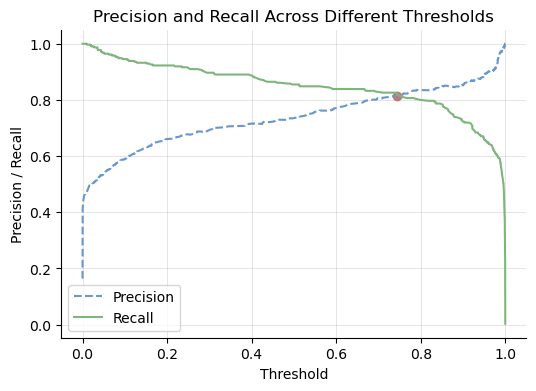


Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      1582
           1       0.82      0.83      0.82       310

    accuracy                           0.94      1892
   macro avg       0.89      0.89      0.89      1892
weighted avg       0.94      0.94      0.94      1892



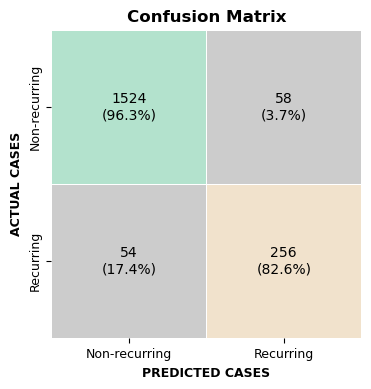

In [83]:
# Separate features and target variable
X = recurrence_df.drop('RECURRENCIA', axis=1)
y = recurrence_df['RECURRENCIA']
# Time the operation by starting a timer
start_time = datetime.now()


# Objective function to be optimized
def recurrence_objective(trial):
    """
    Optimize the recurrence prediction model using cross-validation and hyperparameter tuning.

    Args:
        trial (optuna.trial.Trial): Trial object for hyperparameter suggestion.

    Returns:
        float: Average AUC score of the model predictions across all cross-validation folds.
    """
    # Hyperparameters to be optimized
    n_estimators = trial.suggest_int("n_estimators", 100, 1000)
    max_depth = trial.suggest_int("max_depth", 3, 9)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.2)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)
    min_child_weight = trial.suggest_int("min_child_weight", 1, 10)
    # Cross-validation with StratifiedKFold
    kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_SEED)
    auc_scores = []
    for train_index, test_index in kf.split(X_train_full, y_train_balanced):
        X_train_kfold, X_test_kfold = X_train_full[train_index], X_train_full[test_index]
        y_train_kfold, y_test_kfold = y_train_balanced[train_index], y_train_balanced[test_index]
        # Create the XGBoost classifier
        classifier = xgb.XGBClassifier(
            n_estimators=n_estimators,
            max_depth=max_depth,
            learning_rate=learning_rate,
            subsample=subsample,
            colsample_bytree=colsample_bytree,
            min_child_weight=min_child_weight,
            use_label_encoder=False,
            eval_metric="logloss",
            random_state=RANDOM_SEED
        )
        # Train the classifier with early stopping
        classifier.fit(
            X_train_kfold, y_train_kfold,
            eval_set=[(X_test_kfold, y_test_kfold)],
            early_stopping_rounds=50,
            verbose=False
        )
        # Evaluate the classifier
        y_pred_proba = classifier.predict_proba(X_test_kfold)[:, 1]
        auc_score = roc_auc_score(y_test_kfold, y_pred_proba)
        auc_scores.append(auc_score)
    # Average AUC score across all folds
    average_auc = np.mean(auc_scores)
    return average_auc


# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=RANDOM_SEED)
# Balance the dataset using ADASYN
smote = SMOTE(random_state=RANDOM_SEED)
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)
# Standardize and apply PCA
scaler = StandardScaler()
pca = PCA(n_components=0.98)
X_train_full = pca.fit_transform(scaler.fit_transform(X_train_balanced))
X_test = pca.transform(scaler.transform(X_test))
# Create a study object and optimize the objective function
recurrence_study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=RANDOM_SEED))
recurrence_study.optimize(recurrence_objective, n_trials=100)
# Best trial results
print("Best trial:")
trial = recurrence_study.best_trial
print(f" Value: {trial.value}")
print(" Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")
# Retrieve the best model
best_params = recurrence_study.best_params
best_params.update({
    'use_label_encoder': False,
    'eval_metric': 'logloss',
    'random_state': RANDOM_SEED
})
best_classifier = xgb.XGBClassifier(**best_params)
best_classifier.fit(X_train_full, y_train_balanced)
# Predict and evaluate
y_pred = best_classifier.predict(X_test)
y_pred_proba = best_classifier.predict_proba(X_test)[:, 1]
precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
# End timer and print timing result
end_time = datetime.now()
elapsed_time = end_time - start_time
print_duration(elapsed_time.total_seconds())
# Find the point where precision equals recall to use as threshold
for i in range(len(precision)):
    if np.isclose(precision[i], recall[i], atol=0.01):  # atol is the tolerance level
        intersection_point = (precision[i], recall[i], thresholds[i-1] if i < len(thresholds) else 1)
        break
# Plot Precision/Recall
plt.figure(figsize=(6, 4))
plt.plot(thresholds, precision[:-1], color='#6797CC', linestyle='--', label='Precision')
plt.plot(thresholds, recall[:-1], color='#7FB57D', linestyle='-', label='Recall')
plt.scatter(intersection_point[2], intersection_point[0], color='#CC727A')  # Mark the intersection point
plt.xlabel('Threshold')
plt.ylabel('Precision / Recall')
plt.title('Precision and Recall Across Different Thresholds')
plt.legend(loc='best')
# Remove right and top borders
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)
# Show grid
plt.grid(color='gray', linestyle='-', linewidth=0.5, alpha=0.3)
plt.show()
# Thresholl adjusted based on the Precision-Recall curve
precision_recall_threshold = intersection_point[2]
# Apply threshold to the probabilities to make class predictions
y_pred_adjusted = (y_pred_proba >= precision_recall_threshold).astype(int)
# Evaluate new predictions
conf_matrix = confusion_matrix(y_test, y_pred_adjusted)
classifying_report = classification_report(y_test, y_pred_adjusted)
# Print classification results
print("\nClassification Report:")
print(classifying_report)
# Plot confusion matrix
# Normalize results as percents
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100
classes = ['Non-recurring', 'Recurring']  # Define the classes involved
plt.figure(figsize=(4, 4))
# Plotting heatmap
ax = sns.heatmap(conf_matrix, annot=False, fmt='', cmap='Pastel2_r', cbar=False, linewidths=.5)
# Annotate with the number and percentage
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        percentage = '{:.1f}%'.format(conf_matrix_normalized[i, j])  # Format the percentage
        text = f"{conf_matrix[i, j]}\n({percentage})"
        plt.text(j + 0.5, i + 0.5, text, fontsize=10, ha='center', va='center')
plt.xlabel('PREDICTED CASES', weight='bold', fontsize=9)
plt.ylabel('ACTUAL CASES', weight='bold', fontsize=9)
plt.title('Confusion Matrix', weight='bold')
plt.xticks(np.arange(len(classes))+0.5, classes, rotation=0, fontsize=9)
plt.yticks(np.arange(len(classes))+0.5, classes, rotation=90, fontsize=9)
plt.show()

Pese a que los resultados obtenidos son especialmente positivos dicriminando los clientes no recurrentes, si experimentamos con un umbral diferente al sugerido por el gráfico de _Precision_/_Recall_, obtenemos unos mejores resultados en la discriminación de los clientes recurrentes. Esta discrepancia, sin embargo, es un hecho habitual que depende en buena parte del dominio de aplicación y sus particularidades.


Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.91      0.95      1582
           1       0.68      0.92      0.78       310

    accuracy                           0.91      1892
   macro avg       0.83      0.92      0.86      1892
weighted avg       0.93      0.91      0.92      1892



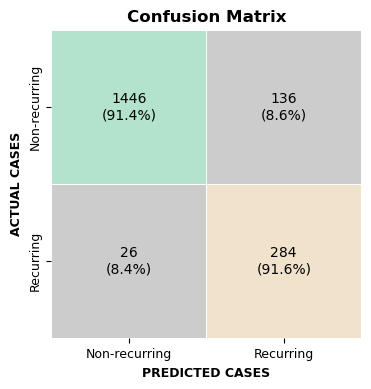

In [84]:
# Thresholl adjusted based on the Precision-Recall curve
precision_recall_threshold = 0.24
# Apply threshold to the probabilities to make class predictions
y_pred_adjusted = (y_pred_proba >= precision_recall_threshold).astype(int)
# Evaluate new predictions
conf_matrix = confusion_matrix(y_test, y_pred_adjusted)
classifying_report = classification_report(y_test, y_pred_adjusted)
# Print classification results
print("\nClassification Report:")
print(classifying_report)
# Plot confusion matrix
# Normalize results as percents
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100
classes = ['Non-recurring', 'Recurring']  # Define the classes involved
plt.figure(figsize=(4, 4))
# Plotting heatmap
ax = sns.heatmap(conf_matrix, annot=False, fmt='', cmap='Pastel2_r', cbar=False, linewidths=.5)
# Annotate with the number and percentage
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        percentage = '{:.1f}%'.format(conf_matrix_normalized[i, j])  # Format the percentage
        text = f"{conf_matrix[i, j]}\n({percentage})"
        plt.text(j + 0.5, i + 0.5, text, fontsize=10, ha='center', va='center')
plt.xlabel('PREDICTED CASES', weight='bold', fontsize=9)
plt.ylabel('ACTUAL CASES', weight='bold', fontsize=9)
plt.title('Confusion Matrix', weight='bold')
plt.xticks(np.arange(len(classes))+0.5, classes, rotation=0, fontsize=9)
plt.yticks(np.arange(len(classes))+0.5, classes, rotation=90, fontsize=9)
plt.show()

Sin embargo, si atendemos a los resultados del parámetro _precision_, constatamos que la capacidad del algoritmo de identificar a los clientes no recurrentes está considerablemente por encima de su capacidad para clasificar correctamente a los recurrentes; algo que se constata también en el _f1-score_. La exactitud global nos indica que el modelo es capaz de clasificar correctamente entre el 91 % y el 92 % de los clientes. Si bien el rendimiento del modelo es bueno, es susceptible de mejora en la identificación de los recurrentes, pero siendo **la prioridad del negocio identificar a los no recurrentes** para desplegar sobre ellos las políticas de fidelización correspondientes, las capacidades que muestran estos resultados podrían ser de gran utilidad para la empresa.

<a id="8.2"></a>
## 8.2. Segmentación por niveles de recurrencia y predicción de transferencia

A continuación optaremos por una estrategia diferente y **segmentaremos la clientela de acuerdo con su recurrencia en la compra**. De esta manera podemos distinguir diferentes niveles de fidelidad, así como qué parte los usuarios se podrían beneficiar de las políticas de fidelización y venta cruzada de un segmento contiguo, para lo cual analizaremos nuevamente las posibilidades de transferencia entre clústeres.

Cabe señalar que esta misma estrategia podría llevarse a cabo a partir de los segmentos originales establecidos durante la primera parte del cuaderno, y en los que también se ponía de relieve las diferentes cantidades de compra correspondientes a uno y otro grupo. En este caso, optaremos por fijar nuestra atención únicamente en el número de compras con objeto de ofrecer una perspectiva diferente en el diseño de estrategias de _cross-selling_.

<a id="8.2.1"></a>
### 8.2.1. Segmentación por cantidad de unidades compradas

Como preparación a la segmentación comenzaremos descartando los valores extremos, al corresponder a una tipología de clientes que, como explicamos con anterioridad, requieren de un tratamiento particular ajustado a sus necesidades especiales. Dicho esto, igual que a lo largo de todo el cuaderno, llevaremos a cabo un recorte moderado.

In [85]:
# Remove VIP customers
customers_recurrence_regular_segments_df = customers_recurrence_df[customers_recurrence_df['ClusterLabels'] != 9]
# Detect ouliers in companies df
outlier_recurrence_indices = detect_outliers(customers_recurrence_regular_segments_df,
                                             variables_to_check=['NUM_COMPRAS'], z_score_threshold=7)
# Remove ouliers from companies df
clean_recurrence_df = remove_outliers(customers_recurrence_regular_segments_df, outlier_recurrence_indices)

	- NUM_COMPRAS: 26 outliers detected




El siguiente paso será el de **limitar el número de variables al número de compras** con el objetivo de que sea el único criterio de partición. Si bien esta segmentación podría llevarse fijando umbrales a partir de diferentes diferentes criterios, dejaremos que sea el algoritmo el que establezca qué divisiones podrían ser apropiadas. En este caso optaremos por utilizar K-Medoids en combinación con la métrica de Manhattan debido a la distorsión en las distancias que podrían originar los valores extremos conservados.

Además, seguiremos una metodología distinta a la empleada durante la segmentación general de clientes, y en lugar de dividir el _dataset_ de acuerdo con la forma jurídica del cliente, trabajaremos conjuntamente con la totalidad de los clientes con independencia de su forma jurídica.

The operation took 31 seconds.


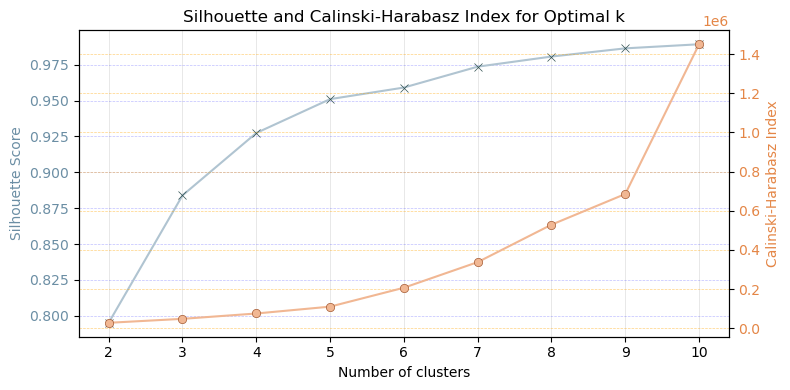

In [86]:
customers_recurrence_selected_feats_df = clean_recurrence_df[['NUM_COMPRAS']]
transformed_recurrence_selected_feats_df = transform_data(customers_recurrence_selected_feats_df,
                                                          transformation_type='log')
# Define maximum number of clusters
k_max = 10
# Performs K-Medoids clustering for a range k from 2 to k_max
clustering_recurrence_results, clustering_recurrence_results_df = perform_kmedoids_clustering(transformed_recurrence_selected_feats_df,
                                                                                              k_max, metric_type='manhattan',
                                                                                              labels_col='RecurrenceLabels')
# Plot clustering validation results
plot_silhouette_and_calinski_harabasz_scores(k_max, clustering_recurrence_results['silhouette_scores'],
                                             clustering_recurrence_results['calinski_harabasz_scores'])


Tanto el coeficiente de silueta como el índice de Calinski-Harabasz nos indican que, a más granularidad, grupos más compactos; pero en este caso optaremos por un grado de granularidad bajo a título ejemplificativo de la estrategia que el negocio puede llevar a la práctica adaptándola a sus necesidades y recursos.

In [87]:
# Define k
k = 4
# Set cluster labels according to k and sorted by number of purchases
labeled_recurrence_results_df = set_df_cluster_labels(clustering_recurrence_results_df, k,
                                                      labels_col='RecurrenceLabels', sorting_col='NUM_COMPRAS')
# Restore removed columns
restored_labeled_recurrence_df = restore_removed_columns(labeled_recurrence_results_df, customers_recurrence_df)
# Restore unscaled values
labeled_recurrence_df = restore_unscaled_values(restored_labeled_recurrence_df, customers_recurrence_df)
# Analyze detailed statistics
compare_clusters_variables(labeled_recurrence_df, variables=['NUM_COMPRAS'], labels_col='RecurrenceLabels')
# Compare clusters' distribution
summarize_cluster_distribution(labeled_recurrence_df, labels_col='RecurrenceLabels')

1    2    3     4
Variable    Statistic                     
NUM_COMPRAS min       1.00 2.00 3.00  5.00
            max       1.00 2.00 4.00 16.00
            mean      1.00 2.00 3.37  7.56
            median    1.00 2.00 3.00  7.00
            std       0.00 0.00 0.48  2.65

RecurrenceLabels,1,2,3,4
Summary,,,,
Counts,"6,260","1,436",966,703
Distribution (%),66.84,15.33,10.32,7.51


Puesto que los clústeres 1 y 2 formados por el algoritmo agrupan a los clientes hasta un máximo de 2 compras, a los cuales, durante el apartado anterior, hemos clasificado como «no recurrentes», combinaremos uno y otro clúster para quedarnos únicamente con **3 grupos**:

- Clientes que realizan entre 1 y 2 compras.
- Clientes que realizan entre 3 y 4 compras.
- Clientes que realizan 5 compras o más.


Customers' distribution between clusters


RecurrenceLabels,1,2,3
Summary,,,
Counts,"7,696",966,703
Distribution (%),82.18,10.32,7.51


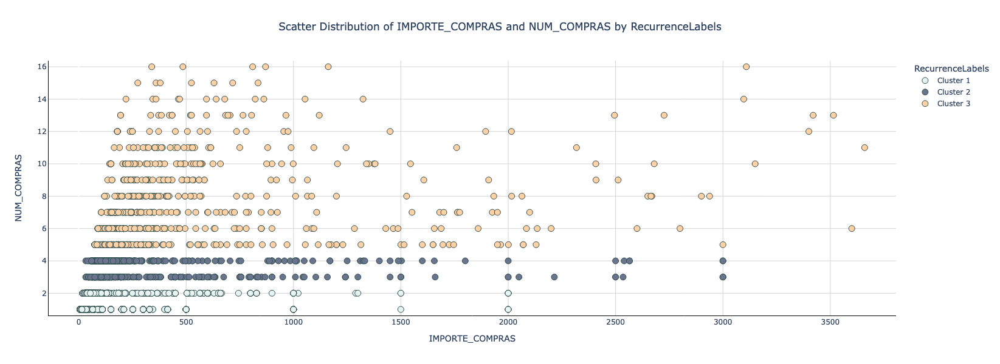


Clusters' NUM_COMPRAS comprehensive statistics


1    2     3
Variable    Statistic                
NUM_COMPRAS min       1.00 3.00  5.00
            max       2.00 4.00 16.00
            mean      1.19 3.37  7.56
            median    1.00 3.00  7.00
            std       0.39 0.48  2.65

In [88]:
# Define the mapping to simplify labels
recurrence_labels_mapping = {1: 1, 2: 1, 3: 2, 4: 3}
# Create a copy of the df to avoid modifying the original one
relabeled_recurrence_df = labeled_recurrence_df.copy()
# Relabel and reduce clusters
relabeled_recurrence_df['RecurrenceLabels'] = labeled_recurrence_df[
                                                  'RecurrenceLabels'].replace(recurrence_labels_mapping)
# Display detailed profile of the clusters
display_clustering_analysis(relabeled_recurrence_df, labels_col='RecurrenceLabels', display_profiles=False,
                            plot_cluster_sales_and_spending_distribution=False,
                            comparison_variable_statistics=['NUM_COMPRAS'])

<a id="8.2.2"></a>
### 8.2.2. Predicción de transferencia entre segmentos de recurrencia

A partir de la segmentación establecida, pondremos nuevamente en práctica las diferentes estrategias de predicción de transferencia entre grupos expuestas en apartados precedentes, comenzando por la predicción basada en **distancia y similitud**.

Para el cálculo de la distancia optaremos por la misma variable escogida para segmentar los clientes: el número de compras.

In [89]:
# Select distance relevant feats
recurrence_distance_relevant_feats = ['NUM_COMPRAS', 'RecurrenceLabels']
# Filter relevant features
relabeled_recurrence_selected_feats_df = relabeled_recurrence_df[recurrence_distance_relevant_feats]
# Scale data
scaled_relabeled_recurrence_selected_feats_df = scale_data(relabeled_recurrence_selected_feats_df,
                                                           'robust', excepted='RecurrenceLabels')
# Compute medoid proximity
proximity_recurrence_df = compute_cluster_proximity(scaled_relabeled_recurrence_selected_feats_df,
                                                    profiling_statistic='medoid',
                                                    affinity='euclidean', scale='norm',
                                                    labels_col='RecurrenceLabels')

The operation took 1 seconds.


Sin embargo, para la estimación de la similitud del coseno, añadiremos al vector una selección más amplia de variables con impacto sobre el número de compras. Para la selección de características utilizaremos nuevamente un modelo de regresión robusto.

In [90]:
# Define relevant feats
consumptions_and_sales_feats = ['CLV', 'CONSUMOSTOTAL', 'DIVERSIDAD_COMPRAS', 'DIVERSIDAD_ESTADOS_CONSULT',
                                'DIVERSIDAD_SECTORES_CONSULT',  'DIVERSIDAD_TAMAÑOS_CONSULT', 'EMPRESASUNICAS_CONSULT',
                                'ENGAGEMENT', 'IMPORTE_COMPRAS', 'NUM_COMPRAS', 'RECENCIA_CONSULT',
                                'TENDENCIA_FRECUENCIA_CONSULT', 'TENDENCIA_FRECUENCIA_VENTAS']
# Filter relevant feats
enhanced_customers_selected_feats_df = enhanced_labeled_customers_df[consumptions_and_sales_feats]
# Compute robust linear regression model
compute_huber_regression(enhanced_customers_selected_feats_df.drop(columns=['NUM_COMPRAS']),
                         enhanced_customers_selected_feats_df['NUM_COMPRAS'])

The operation took 1 minute and 57 seconds.
Cross-validated MSE scores: [3.36, 3.24, 3.9, 4.03, 3.79]
Average MSE: 3.66
AIC: 39404.88
Cross-validated R-squared scores: [0.46, 0.31, 0.37, 0.41, 0.31]
Average R-squared: 0.37
Feature importances (coefficients):


,Feature,Coefficient,Std_Error,Z_Score,P_Value
8,IMPORTE_COMPRAS,0.52,0.06,8.75,0.00
5,DIVERSIDAD_TAMAÑOS_CONSULT,0.32,0.07,5.05,0.00
0,CLV,-0.28,0.03,-9.79,0.00
11,TENDENCIA_FRECUENCIA_VENTAS,-0.10,0.05,-2.26,0.02
4,DIVERSIDAD_SECTORES_CONSULT,-0.10,0.03,-3.66,0.00
3,DIVERSIDAD_ESTADOS_CONSULT,-0.04,0.03,-1.49,0.14
7,ENGAGEMENT,0.03,0.02,2.85,0.00
2,DIVERSIDAD_COMPRAS,0.02,0.02,2.29,0.02
1,CONSUMOSTOTAL,-0.01,0.00,-2.71,0.01
9,RECENCIA_CONSULT,0.01,0.03,-0.35,0.72


Y como resultado de los coeficientes y $p$-valores obtenidos, utilizaremos las variables `CLV`, `CONSUMOSTOTAL`, `DIVERSIDAD_TAMAÑOS_CONSULT`, `DIVERSIDAD_COMPRAS`, `DIVERSIDAD_SECTORES_CONSULT`, `IMPORTE_COMPRAS` y `TENDENCIA_FRECUENCIA_VENTAS`; decidimos descartar `ENGAGEMENT` ya que, pese a resultar moderadamente estadísticamente significativa, su inclusión sería redundante al sintetizar otras de las variables ya incluidas en este listado.

The operation took 4 seconds.


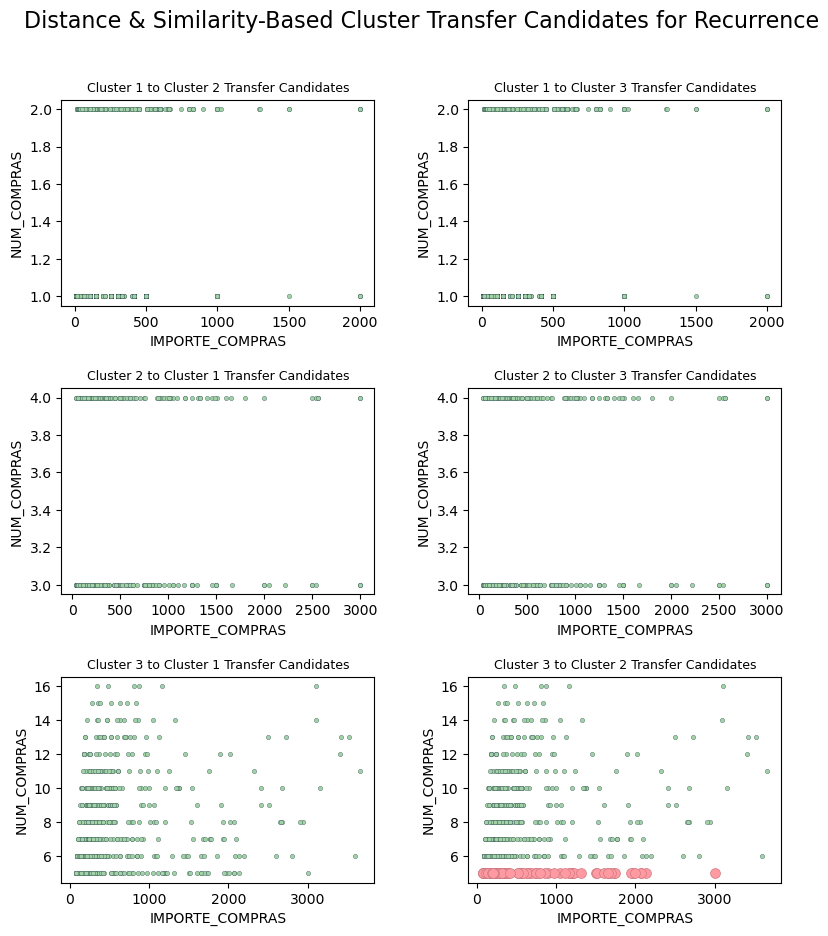

In [91]:
# Add recurrence labels to enhanced df
relabeled_recurrence_similarity_df = enhanced_labeled_customers_df.copy()
# Restore recurrence labels
matching_indexes = relabeled_recurrence_similarity_df.index.intersection(relabeled_recurrence_df.index)
relabeled_recurrence_similarity_df.loc[matching_indexes,
                                       'RecurrenceLabels'] = relabeled_recurrence_df.loc[matching_indexes,
                                       'RecurrenceLabels']

# Select similarity relevant feats
recurrence_similarity_relevant_feats = ['CLV', 'CONSUMOSTOTAL', 'DIVERSIDAD_TAMAÑOS_CONSULT',
                                        'DIVERSIDAD_COMPRAS', 'DIVERSIDAD_SECTORES_CONSULT',
                                        'IMPORTE_COMPRAS', 'RecurrenceLabels', 'TENDENCIA_FRECUENCIA_VENTAS']
# Filter relevant features
relabeled_recurrence_selected_feats_df = relabeled_recurrence_similarity_df[recurrence_similarity_relevant_feats]
# Transform data with a scaler robust to outliers
scaled_relabeled_recurrence_selected_feats_df = scale_data(relabeled_recurrence_selected_feats_df,
                                                          'robust', excepted='RecurrenceLabels')
# Normalize to calculate cosine similarity
normalized_relabeled_recurrence_selected_feats_df = scale_data(scaled_relabeled_recurrence_selected_feats_df,
                                                               'norm', excepted='RecurrenceLabels')
# Compute similarity
similarity_recurrence_df = compute_cluster_similarity(normalized_relabeled_recurrence_selected_feats_df,
                                                      profiling_statistic='median', affinity='cosine',
                                                      labels_col='RecurrenceLabels')
# Find closest cluster's medoid/centroid and most similar cluster
recurrence_cluster_transfer_distance_and_similarity_df = predict_cluster_transfers(proximity_recurrence_df,
                                                                                   similarity_recurrence_df,
                                                                                   labels_col='RecurrenceLabels',
                                                                                   transfer_col='RecurrenceTransfer')


# Restore removed columns
restored_recurrence_cluster_transfer_distance_and_similarity_df = restore_removed_columns(recurrence_cluster_transfer_distance_and_similarity_df,
                                                                                          enhanced_labeled_customers_df)
# Restore unscaled values
unscaled_recurrence_cluster_transfer_distance_and_similarity_df = restore_unscaled_values(
                                                                      restored_recurrence_cluster_transfer_distance_and_similarity_df,
                                                                      enhanced_labeled_customers_df, labels_col='RecurrenceLabels')
# Plot possible recurrence clusters transfer
plot_cluster_transfer_scatter(unscaled_recurrence_cluster_transfer_distance_and_similarity_df,
                              labels_col='RecurrenceLabels', transfer_col='RecurrenceTransfer', subdued_tone='#A2D1A7',
                              title_pre='Distance & Similarity-Based', title_post='for Recurrence')

El resultado nos habla de la posibilidad de que un número de clientes pertenecientes al cluster 3, pero en su franja de menor número de compras, puedan acabar subsumidos en el clúster 2, factor que deberá ser vigilado por el equipo comercial para determinar si existe la posibilidad de hacer crecer sus números o si quedarán estancados en las regiones inferior.

A continuación, llevaremos a cabo la predicción basada en **clasificación multinomial a través de un perceptrón multicapa**, para la cual nuevamente conservaremos un amplio número de variables y, para contrarrestar los riesgos de sobreajuste por ruido, mantendremos las técnicas ya expuestas en apartados anteriores y que obviaremos para no repetirnos.

59/59 [==============================] - 0s 500us/step - loss: 0.0036 - accuracy: 0.9989
Average Test Accuracy: 99.82%
The operation took 1 minute and 12 seconds.
293/293 [==============================] - 0s 399us/step
Original vs New classification report:
              precision    recall  f1-score   support

           1       1.00      1.00      1.00      7696
           2       1.00      1.00      1.00       966
           3       1.00      1.00      1.00       703

    accuracy                           1.00      9365
   macro avg       1.00      1.00      1.00      9365
weighted avg       1.00      1.00      1.00      9365



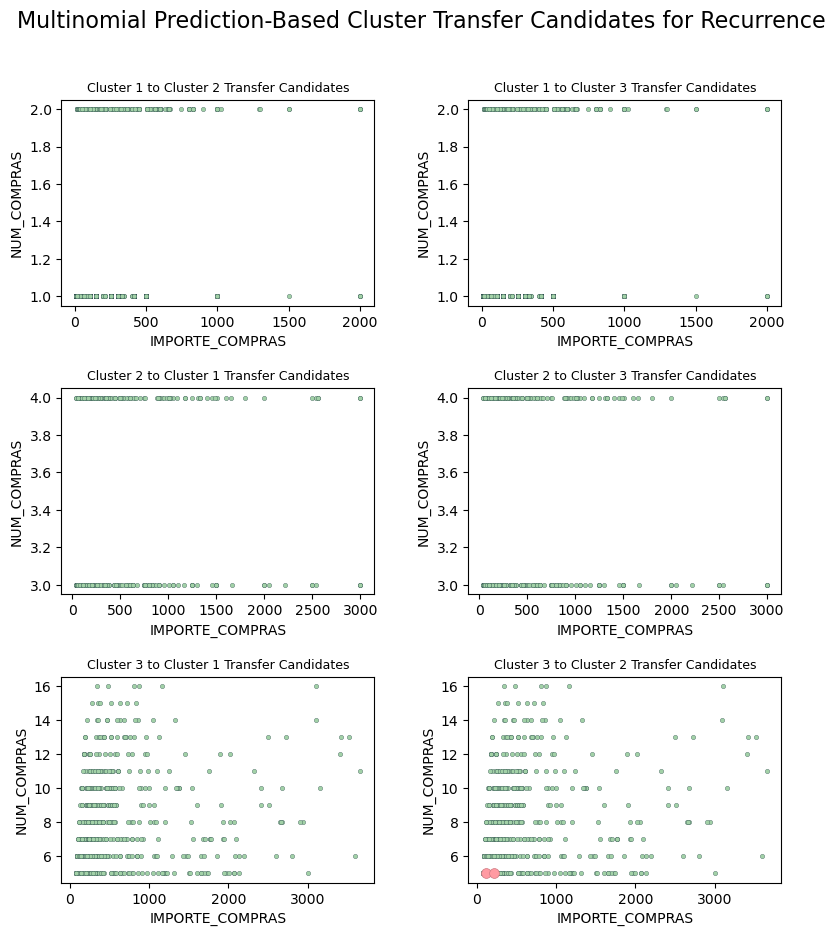

In [92]:
# Create a copy of the df to avoid modifying the original one
recurrence_cluster_transfer_multinomial_prediction_df = relabeled_recurrence_df.copy()

# Select relevant features including cluster labels
X = recurrence_cluster_transfer_multinomial_prediction_df.drop('RecurrenceLabels', axis=1).values
y = recurrence_cluster_transfer_multinomial_prediction_df['RecurrenceLabels'].values - 1  # Ensure labels start at 0

# Build and evaluate MLP model
mlp_model, scaler = build_and_evaluate_mlp(X, y)

# Use the model for full dataset predictions (using the last trained model for demonstration)
full_data_predictions = mlp_model.predict(scaler.transform(X))
predicted_clusters = np.argmax(full_data_predictions, axis=1) + 1  # Start labels from 1

# Add predictions back to the dataframe
recurrence_cluster_transfer_multinomial_prediction_df['RecurrenceTransfer'] = predicted_clusters

# Evaluate the new labels
print("Original vs New classification report:")
print(classification_report(recurrence_cluster_transfer_multinomial_prediction_df['RecurrenceLabels'],
                            recurrence_cluster_transfer_multinomial_prediction_df['RecurrenceTransfer']))

# Plot possible recurrence clusters transfer
plot_cluster_transfer_scatter(recurrence_cluster_transfer_multinomial_prediction_df,
                              labels_col='RecurrenceLabels', transfer_col='RecurrenceTransfer', subdued_tone='#A2D1A7',
                              title_pre='Multinomial Prediction-Based', title_post='for Recurrence')

En este caso, observamos que si bien hay un grupo reducido de clientes con capacidad de hacer un _upgrade_ del clúster 1 al 2, se detecta también un riesgo en el sentido contrario; y nuevamente otro paso del clúster 3 al 2, en este caso más limitado que la predicción que obteníamos por distancia y similitud.

Finalmente, observamos los resultados obtenidos por predicción basada en **regresión lineal del número de compras y reagrupamiento** a partir de las estimaciones de recurrencia obtenidas.

Best trial:
 Value: 0.1469885633410917
 Params: 
    n_estimators: 407
    max_depth: 6
    learning_rate: 0.07748313453127137
    subsample: 0.786974345196638
    colsample_bytree: 0.9215887971499228
    reg_lambda: 4.963036053941983
    reg_alpha: 3.6244905423729668
    gamma: 0.2826571582955576
The operation took 36 seconds.
Test MSE: 0.1568373803170142
Test RMSE: 0.3960269944296906
Test MAE: 0.1167040276641968
Test R² Score: 0.9537635300616978


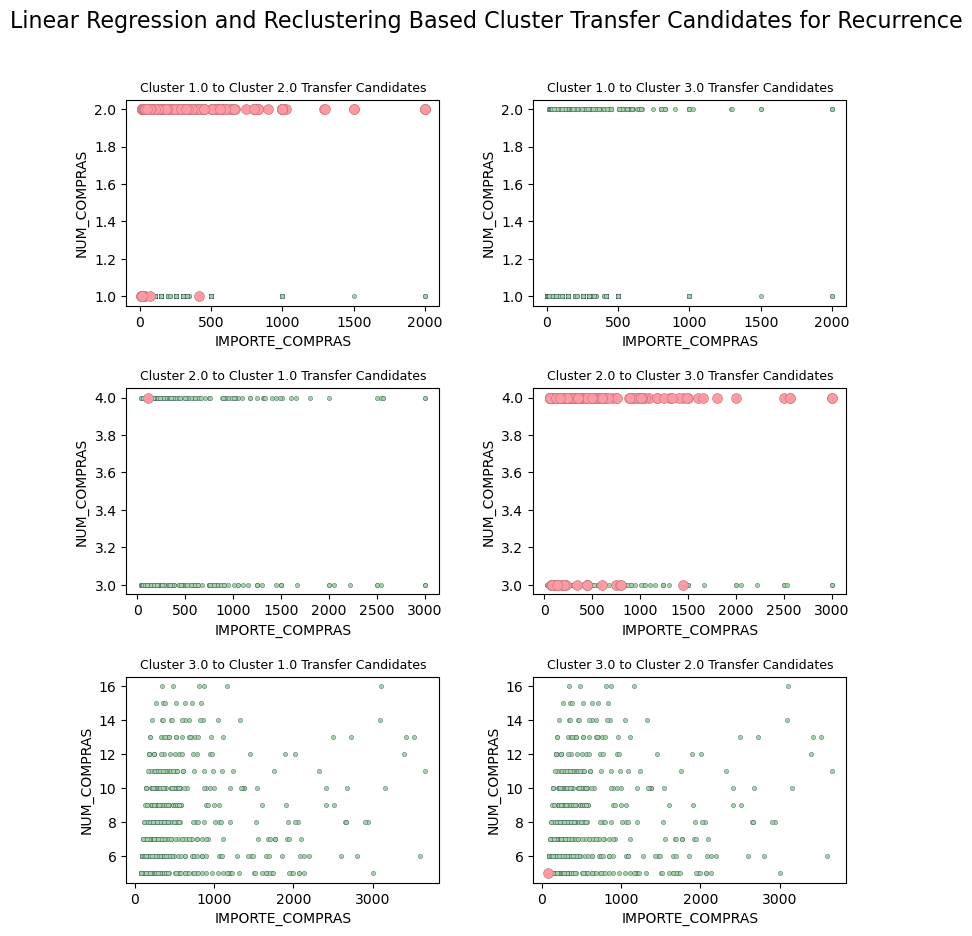

In [93]:
# Create a copy of the df to avoid modifying the original one
recurrence_cluster_transfer_regression_prediction_df = relabeled_recurrence_df.copy()
# Restore feature engineered columns
recurrence_cluster_transfer_regression_prediction_df = restore_removed_columns(recurrence_cluster_transfer_regression_prediction_df,
                                                                               enhanced_labeled_customers_df)
# Select relevant feats for regression
recurrence_regression_relevant_feats = ['CLV', 'CONSUMOSTOTAL', 'DIVERSIDAD_TAMAÑOS_CONSULT',
                                        'DIVERSIDAD_COMPRAS', 'DIVERSIDAD_SECTORES_CONSULT',
                                        'IMPORTE_COMPRAS', 'NUM_COMPRAS', 'RecurrenceLabels',
                                        'TENDENCIA_FRECUENCIA_VENTAS']
# Filter relevant features for regression
recurrence_cluster_transfer_regression_prediction_feat_selection_df = recurrence_cluster_transfer_regression_prediction_df[
                                                                          recurrence_regression_relevant_feats]

# Separate features and target variable, exclude cluster labels also
X = recurrence_cluster_transfer_regression_prediction_feat_selection_df.drop(columns=['NUM_COMPRAS', 'RecurrenceLabels'])
y = recurrence_cluster_transfer_regression_prediction_feat_selection_df['NUM_COMPRAS']

# Time the operation by starting a timer
start_time = datetime.now()

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)
# Standardize and apply PCA
scaler = StandardScaler()
pca = PCA(n_components=0.98)
X_train = pca.fit_transform(scaler.fit_transform(X_train))
X_test = pca.transform(scaler.transform(X_test))

# Create a study object and optimize the objective
regression_study = optuna.create_study(direction='minimize', sampler=optuna.samplers.TPESampler(seed=RANDOM_SEED))
regression_study.optimize(regression_objective, n_trials=100)
# Best trial results
print("Best trial:")
trial = regression_study.best_trial
print(f" Value: {trial.value}")
print(" Params: ")
for key, value in trial.params.items():
    print(f"    {key}: {value}")
# Retrieve best model
best_params = regression_study.best_params
best_model = xgb.XGBRegressor(**best_params)
best_model.fit(X_train, y_train)
# Evaluate best model
y_pred_test = best_model.predict(X_test)
test_mse = mean_squared_error(y_test, y_pred_test)
test_rmse = mean_squared_error(y_test, y_pred_test, squared=False)
test_mae = mean_absolute_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)

# End timer and print timing result
end_time = datetime.now()
elapsed_time = end_time - start_time
print_duration(elapsed_time.total_seconds())

# Print evaluation results
print(f'Test MSE: {test_mse}')
print(f'Test RMSE: {test_rmse}')
print(f'Test MAE: {test_mae}')
print(f'Test R² Score: {test_r2}')

# Predicting NUM_COMPRAS for the entire dataset
y_predicted = best_model.predict(pca.transform(scaler.transform(X)))
# Adding the predicted values back to the dataframe
recurrence_cluster_transfer_regression_prediction_df['NUM_COMPRAS'] = y_predicted

# Select feats for clustering
clustering_relevant_feats = ['NUM_COMPRAS']
# Filter relevant features for clustering
recurrence_cluster_transfer_regression_prediction_df = recurrence_cluster_transfer_regression_prediction_df[
                                                           clustering_relevant_feats]
# Transform data
transformed_recurrence_cluster_transfer_regression_prediction_df = transform_data(recurrence_cluster_transfer_regression_prediction_df,
                                                                                  transformation_type='log')
# Convert the whole DataFrame to a numpy array
X_np = transformed_recurrence_cluster_transfer_regression_prediction_df.to_numpy()
# Define initial medoids (randomly select k points as initial medoids)
num_clusters = 3
initial_medoids = list(range(num_clusters))
# Create instance of K-Medoids algorithm with Manhattan distance
metric = distance_metric(type_metric.MANHATTAN)
kmedoids_instance = kmedoids(X_np, initial_medoids, metric=metric)
# Run clustering process and obtain results
kmedoids_instance.process()
clusters = kmedoids_instance.get_clusters()
medoids = kmedoids_instance.get_medoids()
# Assign cluster labels back to DataFrame
cluster_labels = np.zeros(len(X_np), dtype=int)
for cluster_id, cluster in enumerate(clusters):
    for index in cluster:
        cluster_labels[index] = cluster_id
recurrence_cluster_transfer_regression_prediction_df['RecurrenceTransfer'] = cluster_labels + 1  # Adjust labels to start from 1

# Sort cluster labels according to 'NUM_COMPRAS'
recurrence_cluster_transfer_regression_prediction_df = relabel_df_sorted(recurrence_cluster_transfer_regression_prediction_df,
                                                                         sorting_col='NUM_COMPRAS', statistic='mean',
                                                                         labels_col='RecurrenceTransfer')
# Restore recurrence labels
matching_indexes = recurrence_cluster_transfer_regression_prediction_df.index.intersection(relabeled_recurrence_df.index)
recurrence_cluster_transfer_regression_prediction_df.loc[matching_indexes,
                'RecurrenceLabels'] = relabeled_recurrence_df.loc[matching_indexes,
                                                                  'RecurrenceLabels']
# Restore removed columns
restored_recurrence_cluster_transfer_regression_prediction_df = restore_removed_columns(recurrence_cluster_transfer_regression_prediction_df,
                                                                                        enhanced_labeled_customers_df)

# Restore unscaled values
unscaled_recurrence_cluster_transfer_regression_prediction_df = restore_unscaled_values(
                                                                      restored_recurrence_cluster_transfer_regression_prediction_df,
                                                                       enhanced_labeled_customers_df, labels_col='RecurrenceLabels')
# Plot possible recurrence clusters transfer
plot_cluster_transfer_scatter(unscaled_recurrence_cluster_transfer_regression_prediction_df,
                              labels_col='RecurrenceLabels', transfer_col='RecurrenceTransfer', subdued_tone='#A2D1A7',
                              title_pre='Linear Regression and Reclustering Based', title_post='for Recurrence')

Y en este caso las estimaciones son muy generosas, a pesar del buen ajuste del modelo de regresión, pero sobre todo más optimistas que las obtenidas por las anteriores metodologías. Se aprecia así una importante posibilidad de traspaso del clúster 1 al 2 y del 2 al 3, con un mínimo riesgo de _downgrade_ para algún caso particular en la región inferior del tercer grupo.

Nuevamente, la posibilidad de optar por una metodología u otra, queda en manos del negocio y de sus políticas comerciales, pero ofrecemos nuevamente una predicción multimétrica consensuada por mayoría, mucho más conservadora que algunos de los resultados obtenidos, pero afinada por diversos métodos.

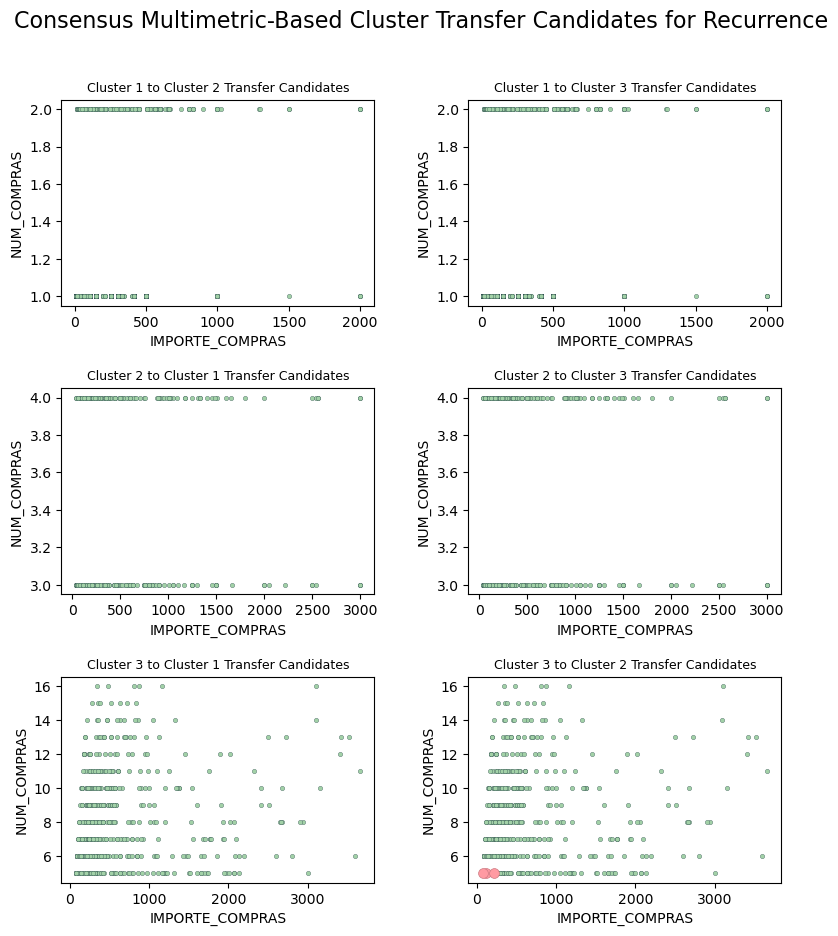

In [94]:
# Estimate cluster transfers consensus according to different methodologies
recurrence_consensus_cluster_transfer_df = estimate_cluster_transfer_consensus([unscaled_recurrence_cluster_transfer_distance_and_similarity_df,
                                                                               recurrence_cluster_transfer_multinomial_prediction_df,
                                                                               unscaled_recurrence_cluster_transfer_regression_prediction_df],
                                                                               labels_col='RecurrenceLabels', transfer_col='RecurrenceTransfer',
                                                                               unanimous_decision=False)
# Plot possible clusters transfers
plot_cluster_transfer_scatter(recurrence_consensus_cluster_transfer_df,
                              labels_col='RecurrenceLabels', transfer_col='RecurrenceTransfer', subdued_tone='#A2D1A7',
                              title_pre='Consensus Multimetric-Based', title_post='for Recurrence')

Quedaría así descartada la posibilidad de _upgrades_, mientras que por contra se destaca el riesgo de que algunos clientes pertenecientes al clúster superior, pero circunscritos a sus regiones de inferior compra, puedan descender hasta el segundo grupo.

<a id="8.3"></a>
## 8.3. Conclusiones sobre la recurrencia de compra

El análisis de la fidelización llevado a cabo durante este apartado nos ha permitido utilizar tanto **modelos de aprendizaje computacional supervisados (clasificación, regresión) como no supervisados (agrupamiento)**, poniendo de relieve las múltiples aplicaciones que la Ciencia de Datos pone al servicio de la Inteligencia de Negocio. Además, se ofrece un ejemplo de cómo las técnicas de clusterización llevadas a la práctica durante la primera parte del cuaderno pueden ser trasladadas a otros ámbitos, como el análisis de la recurrencia.

Respecto a los **resultados** obtenidos, el modelo predictivo conseguido presenta resultados muy favorables en la detección de clientes no recurrentes susceptibles de retención, mientras que por su parte la segmentación podría depurarse optando por una granularidad más amplia y ajustada a la amplia casuística presente entre los usuarios del servicio. Dicho esto, el estudio desarrollado propone un **método y un procedimiento que permiten su adaptación** a las necesidades del negocio y a las circunstancias cambiantes de la práctica.

<a id="8.4"></a>
## 8.4. Exportación del fichero de fidelización de clientes

Exportamos el fichero de clientes etiquetado con su categoría de recurrencia en 2 grupos (recurrente y no recurrente), con su segmento asignado y con su segmento de transferencia posible asignado. En el caso de aquellos clientes para los que no se predice movimiento, la columna de transferencia contendrá un valor nulo. El fichero no incluye los valores extremos por haber sido excluídos del análisis y caracterizarse por unas cifras de compra que lo alejan del resto del _dataset_ y que hacen poco probable su transferencia.

In [95]:
# Select columns from customers_df but not in recurrence_consensus_cluster_transfer_df
selected_customers_df = customers_df[
                            customers_df.columns.difference(recurrence_consensus_cluster_transfer_df.columns)]
# Restore columns
recurrence_merged_df = recurrence_consensus_cluster_transfer_df.join(selected_customers_df, how='left')
# Restore recurrence first classification label
recurrence_merged_df = recurrence_merged_df.join(recurrence_df[['RECURRENCIA']], how='left')
# Sort columns
ordered_columns = list(customers_df.columns)
ordered_columns.extend(['RECURRENCIA', 'RecurrenceLabels', 'RecurrenceTransfer'])
recurrence_merged_df = recurrence_merged_df[[col for col in ordered_columns if col in recurrence_merged_df.columns]]
# Rename columns
recurrence_merged_df = recurrence_merged_df.rename(columns={'RecurrenceLabels': 'SEGMENTO',
                                                            'RecurrenceTransfer': 'TRANSFERENCIA'})
# Assign NaN in those cases where the predicted cluster is the current cluster
recurrence_merged_df.loc[recurrence_merged_df['SEGMENTO'] == recurrence_merged_df['TRANSFERENCIA'], 'TRANSFERENCIA'] = np.nan

# Restore the 'ID' column using the index information and reset index
restored_id_recurrence_merged_df = recurrence_merged_df.reset_index()
restored_id_recurrence_merged_df = restored_id_recurrence_merged_df.rename(columns={'index': 'ID'})

# Export df to TXT following the encoding and format from the original file
restored_id_recurrence_merged_df.to_csv('RECURRENCIA_CLIENTES.txt', encoding='ISO-8859-1', sep='|', index=False)

# End notebooks' timer and print timing result
end_time = datetime.now()
elapsed_time = end_time - notebook_start_time
print_duration(elapsed_time.total_seconds(), custom_message="Notebook's total running time:")

Notebook's total running time: 45 minutes and 13 seconds.


<a id="9"></a> 
***
# 9. Recapitulación y últimas conclusiones

Este cuaderno aborda un proceso de **segmentación de clientes** estructurado en **tres etapas**:

1. Comenzando por la **limpieza y preprocesamiento de los datos**, etapa durante la cual el objetivo principal ha sido preparar la información para una correcta aplicación de los algoritmos durante las fases posteriores, intentando conservar las particularidades de la base de usuarios presentes en el fichero original.

2. Una **primera fase de segmentación**, durante la cual se han impuesto las características descriptivas del **perfil empresarial** de cada cliente y, en menor medida, de su proceso de _onboarding_. Debido a las limitaciones impuestas por la distribución de los datos, ha sido necesario optar por diferentes técnicas para suavizar los valores extremos y estandarizar adecuadamente las magnitudes, así como utilizar métricas diferentes a la media aritmética como medida representativa de las agrupaciones.

3. Durante la **segunda fase de segmentación**, el enfoque se ha centrado en los dos grandes segmentos que la primera etapa de la segmentación había revelado: uno conformado por diferentes tipos de sociedades y empresarios, y otro por personas físicas. Para ello, hemos alternado las variables que rigen el proceso por aquellas que definen el **aumento del tique**: el número de compras y el importe total gastado. Optando por la afinidad del coseno durante la clasificación, se ha querido incidir en aquellos paralelismos presentes en la clientela que van más allá de las magnitudes y que reflejan una afinidad en su manera de proceder como clientes.

Una vez precisados los segmentos con sus características particulares, entre las cuales el importe de compra y el número de adquisiciones tienen un papel destacado, la sección de ventas de la empresa puede dirigir sus esfuerzos de venta cruzada u ofrecer productos que pueden aportar más valor para el cliente a cambio de un precio más alto para el negocio. Sin embargo, algunos clientes podrían beneficiarse de las políticas de un segmento contiguo, razón por la cual el paso siguiente ha consistido en predecir cuáles de esos consumidores podrían **ser transferidos** hacia clústeres adyacentes, consolidando así su posición de cliente de alto valor para la empresa. Para ello, se ha experimentado con **diferentes métricas basadas en distancia y similitud, predicción multinomial mediante redes neuronales multicapa y regresión lineal**, analizando sus diferencias y puntos comunes, así como combinándolas para afinar las estimaciones obtenidas.

A continuación, como objetivo secundario a partir de los pasos seguidos durante la primera parte del cuaderno, hemos analizado la **fidelización** de la clientela, distinguiendo aquellos usuarios que compran al negocio de manera repetida de los que no pasan de una interacción puntual. A través de un modelo de predicción binomial, los clientes pueden ser clasificados tras unas pocas interacciones comerciales con el objeto de que el equipo comercial correspondiente despliegue las estrategias de retención oportunas. Además, los clientes han sido nuevamente particionados en función de su número de interacciones comerciales con el objetivo de detectar una vez más cuáles podrían sacar mayor provecho de las ofertas de venta cruzada, recibiendo así un mayor valor.

Durante todo el proceso se han puesto en práctica modelos de **aprendizaje computacional supervisado y no supervisado**, así como diferentes **algoritmos, jerárquicos y no jerárquicos**. Se han empleado diferentes **técnicas para evitar el sobreajuste** de los modelos construidos, así como para **afinar sus hiperparámetros**. También se han **diseñado nuevas variables** combinando diversas fuentes de datos con objeto de arrojar luz sobre nuevos patrones presentes en la información o de dotarla de significado. Además, en el cuaderno se han incluido diferentes técnicas de **representación de la información**, ya sea de manera tabular o mediante su representación gráfica y, en algunos casos, de manera interactiva para facilitar al lector la exploración de la información.

Por último, las funciones encargadas de la operativa principal (ejecución de algoritmos, transformaciones, escalado, obtención de estadísticas de los clústeres y graficado) admiten ser parametrizadas con diferentes métricas y selección de variables con el objeto de convertir este cuaderno en una **herramienta reutilizable**, al facilitar su posterior adaptación a otros supuestos y otros juegos de datos con sus características particulares.